In [1]:
import tensorflow as tf
import pandas as pd
import re
import numpy as np
import matplotlib.pylab as plt
from sklearn.preprocessing import MinMaxScaler

In [2]:
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Input, Dense,LSTM, Embedding
from tensorflow.python.keras.optimizers import RMSprop
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau

In [3]:
path = open(r'''D:\dkish\Documents\Files\MACHINELEARNING\TrichyWeatherDataWindspeed\Formatted\20166.csv''')
df = pd.read_csv(path, sep=',', header=0  , index_col=False , na_values = '---' )

In [4]:
df.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
0,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1


In [5]:
def _date_string(x):
    """Convert two integers to a string for the date and time."""

    date = x[0]
    date = re.sub('-' , '' , date)
    print(date)# Date. Example: 19801231
    time = x[1]
    time = re.sub(':' , '' , time)# Time. Example: 1230
    print(time)

    return "{0}{1}".format(date , time)

In [6]:
datestr = df[['Date', 'Time']].apply(_date_string, axis=1)
df['DateTime'] = pd.to_datetime(datestr, format='%m%d%Y%H%M')

01232016
0501
01232016
0502
01232016
0503
01232016
0504
01232016
0505
01232016
0506
01232016
0507
01232016
0508
01232016
0509
01232016
0510
01232016
0511
01232016
0512
01232016
0513
01232016
0514
01232016
0515
01232016
0516
01232016
0517
01232016
0518
01232016
0519
01232016
0520
01232016
0521
01232016
0522
01232016
0523
01232016
0524
01232016
0525
01232016
0526
01232016
0527
01232016
0528
01232016
0529
01232016
0530
01232016
0531
01232016
0532
01232016
0533
01232016
0534
01232016
0535
01232016
0536
01232016
0537
01232016
0538
01232016
0539
01232016
0540
01232016
0541
01232016
0542
01232016
0543
01232016
0544
01232016
0545
01232016
0546
01232016
0547
01232016
0548
01232016
0549
01232016
0550
01232016
0551
01232016
0552
01232016
0553
01232016
0554
01232016
0555
01232016
0556
01232016
0557
01232016
0558
01232016
0559
01232016
0600
01232016
0601
01232016
0602
01232016
0603
01232016
0604
01232016
0605
01232016
0606
01232016
0607
01232016
0608
01232016
0609
01232016
0610
01232016
0611
012320

1708
01232016
1709
01232016
1710
01232016
1711
01232016
1712
01232016
1713
01232016
1714
01232016
1715
01232016
1716
01232016
1717
01232016
1718
01232016
1719
01232016
1720
01232016
1721
01232016
1722
01232016
1723
01232016
1724
01232016
1725
01232016
1726
01232016
1727
01232016
1728
01232016
1729
01232016
1730
01232016
1731
01232016
1732
01232016
1733
01232016
1734
01232016
1735
01232016
1736
01232016
1737
01232016
1738
01232016
1739
01232016
1740
01232016
1741
01232016
1742
01232016
1743
01232016
1744
01232016
1745
01232016
1746
01232016
1747
01232016
1748
01232016
1749
01232016
1750
01232016
1751
01232016
1752
01232016
1753
01232016
1754
01232016
1755
01232016
1756
01232016
1757
01232016
1758
01232016
1759
01232016
1800
01232016
1801
01232016
1802
01232016
1803
01232016
1804
01232016
1805
01232016
1806
01232016
1807
01232016
1808
01232016
1809
01232016
1810
01232016
1811
01232016
1812
01232016
1813
01232016
1814
01232016
1815
01232016
1816
01232016
1817
01232016
1818
01232016
1819
0

0538
01242016
0539
01242016
0540
01242016
0541
01242016
0542
01242016
0543
01242016
0544
01242016
0545
01242016
0546
01242016
0547
01242016
0548
01242016
0549
01242016
0550
01242016
0551
01242016
0552
01242016
0553
01242016
0554
01242016
0555
01242016
0556
01242016
0557
01242016
0558
01242016
0559
01242016
0600
01242016
0601
01242016
0602
01242016
0603
01242016
0604
01242016
0605
01242016
0606
01242016
0607
01242016
0608
01242016
0609
01242016
0610
01242016
0611
01242016
0612
01242016
0613
01242016
0614
01242016
0615
01242016
0616
01242016
0617
01242016
0618
01242016
0619
01242016
0620
01242016
0621
01242016
0622
01242016
0623
01242016
0624
01242016
0625
01242016
0626
01242016
0627
01242016
0628
01242016
0629
01242016
0630
01242016
0631
01242016
0632
01242016
0633
01242016
0634
01242016
0635
01242016
0636
01242016
0637
01242016
0638
01242016
0639
01242016
0640
01242016
0641
01242016
0642
01242016
0643
01242016
0644
01242016
0645
01242016
0646
01242016
0647
01242016
0648
01242016
0649
0

01242016
1808
01242016
1809
01242016
1810
01242016
1811
01242016
1812
01242016
1813
01242016
1814
01242016
1815
01242016
1816
01242016
1817
01242016
1818
01242016
1819
01242016
1820
01242016
1821
01242016
1822
01242016
1823
01242016
1824
01242016
1825
01242016
1826
01242016
1827
01242016
1828
01242016
1829
01242016
1830
01242016
1831
01242016
1832
01242016
1833
01242016
1834
01242016
1835
01242016
1836
01242016
1837
01242016
1838
01242016
1839
01242016
1840
01242016
1841
01242016
1842
01242016
1843
01242016
1844
01242016
1845
01242016
1846
01242016
1847
01242016
1848
01242016
1849
01242016
1850
01242016
1851
01242016
1852
01242016
1853
01242016
1854
01242016
1855
01242016
1856
01242016
1857
01242016
1858
01242016
1859
01242016
1900
01242016
1901
01242016
1902
01242016
1903
01242016
1904
01242016
1905
01242016
1906
01242016
1907
01242016
1908
01242016
1909
01242016
1910
01242016
1911
01242016
1912
01242016
1913
01242016
1914
01242016
1915
01242016
1916
01242016
1917
01242016
1918
012420

01252016
0645
01252016
0646
01252016
0647
01252016
0648
01252016
0649
01252016
0650
01252016
0651
01252016
0652
01252016
0653
01252016
0654
01252016
0655
01252016
0656
01252016
0657
01252016
0658
01252016
0659
01252016
0700
01252016
0701
01252016
0702
01252016
0703
01252016
0704
01252016
0705
01252016
0706
01252016
0707
01252016
0708
01252016
0709
01252016
0710
01252016
0711
01252016
0712
01252016
0713
01252016
0714
01252016
0715
01252016
0716
01252016
0717
01252016
0718
01252016
0719
01252016
0720
01252016
0721
01252016
0722
01252016
0723
01252016
0724
01252016
0725
01252016
0726
01252016
0727
01252016
0728
01252016
0729
01252016
0730
01252016
0731
01252016
0732
01252016
0733
01252016
0734
01252016
0735
01252016
0736
01252016
0737
01252016
0738
01252016
0739
01252016
0740
01252016
0741
01252016
0742
01252016
0743
01252016
0744
01252016
0745
01252016
0746
01252016
0747
01252016
0748
01252016
0749
01252016
0750
01252016
0751
01252016
0752
01252016
0753
01252016
0754
01252016
0755
012520

1914
01252016
1915
01252016
1916
01252016
1917
01252016
1918
01252016
1919
01252016
1920
01252016
1921
01252016
1922
01252016
1923
01252016
1924
01252016
1925
01252016
1926
01252016
1927
01252016
1928
01252016
1929
01252016
1930
01252016
1931
01252016
1932
01252016
1933
01252016
1934
01252016
1935
01252016
1936
01252016
1937
01252016
1938
01252016
1939
01252016
1940
01252016
1941
01252016
1942
01252016
1943
01252016
1944
01252016
1945
01252016
1946
01252016
1947
01252016
1948
01252016
1949
01252016
1950
01252016
1951
01252016
1952
01252016
1953
01252016
1954
01252016
1955
01252016
1956
01252016
1957
01252016
1958
01252016
1959
01252016
2000
01252016
2001
01252016
2002
01252016
2003
01252016
2004
01252016
2005
01252016
2006
01252016
2007
01252016
2008
01252016
2009
01252016
2010
01252016
2011
01252016
2012
01252016
2013
01252016
2014
01252016
2015
01252016
2016
01252016
2017
01252016
2018
01252016
2019
01252016
2020
01252016
2021
01252016
2022
01252016
2023
01252016
2024
01252016
2025
0

0744
01262016
0745
01262016
0746
01262016
0747
01262016
0748
01262016
0749
01262016
0750
01262016
0751
01262016
0752
01262016
0753
01262016
0754
01262016
0755
01262016
0756
01262016
0757
01262016
0758
01262016
0759
01262016
0800
01262016
0801
01262016
0802
01262016
0803
01262016
0804
01262016
0805
01262016
0806
01262016
0807
01262016
0808
01262016
0809
01262016
0810
01262016
0811
01262016
0812
01262016
0813
01262016
0814
01262016
0815
01262016
0816
01262016
0817
01262016
0818
01262016
0819
01262016
0820
01262016
0821
01262016
0822
01262016
0823
01262016
0824
01262016
0825
01262016
0826
01262016
0827
01262016
0828
01262016
0829
01262016
0830
01262016
0831
01262016
0832
01262016
0833
01262016
0834
01262016
0835
01262016
0836
01262016
0837
01262016
0838
01262016
0839
01262016
0840
01262016
0841
01262016
0842
01262016
0843
01262016
0844
01262016
0845
01262016
0846
01262016
0847
01262016
0848
01262016
0849
01262016
0850
01262016
0851
01262016
0852
01262016
0853
01262016
0854
01262016
0855
0

01262016
2014
01262016
2015
01262016
2016
01262016
2017
01262016
2018
01262016
2019
01262016
2020
01262016
2021
01262016
2022
01262016
2023
01262016
2024
01262016
2025
01262016
2026
01262016
2027
01262016
2028
01262016
2029
01262016
2030
01262016
2031
01262016
2032
01262016
2033
01262016
2034
01262016
2035
01262016
2036
01262016
2037
01262016
2038
01262016
2039
01262016
2040
01262016
2041
01262016
2042
01262016
2043
01262016
2044
01262016
2045
01262016
2046
01262016
2047
01262016
2048
01262016
2049
01262016
2050
01262016
2051
01262016
2052
01262016
2053
01262016
2054
01262016
2055
01262016
2056
01262016
2057
01262016
2058
01262016
2059
01262016
2100
01262016
2101
01262016
2102
01262016
2103
01262016
2104
01262016
2105
01262016
2106
01262016
2107
01262016
2108
01262016
2109
01262016
2110
01262016
2111
01262016
2112
01262016
2113
01262016
2114
01262016
2115
01262016
2116
01262016
2117
01262016
2118
01262016
2119
01262016
2120
01262016
2121
01262016
2122
01262016
2123
01262016
2124
012620

01272016
0844
01272016
0845
01272016
0846
01272016
0847
01272016
0848
01272016
0849
01272016
0850
01272016
0851
01272016
0852
01272016
0853
01272016
0854
01272016
0855
01272016
0856
01272016
0857
01272016
0858
01272016
0859
01272016
0900
01272016
0901
01272016
0902
01272016
0903
01272016
0904
01272016
0905
01272016
0906
01272016
0907
01272016
0908
01272016
0909
01272016
0910
01272016
0911
01272016
0912
01272016
0913
01272016
0914
01272016
0915
01272016
0916
01272016
0917
01272016
0918
01272016
0919
01272016
0920
01272016
0921
01272016
0922
01272016
0923
01272016
0924
01272016
0925
01272016
0926
01272016
0927
01272016
0928
01272016
0929
01272016
0930
01272016
0931
01272016
0932
01272016
0933
01272016
0934
01272016
0935
01272016
0936
01272016
0937
01272016
0938
01272016
0939
01272016
0940
01272016
0941
01272016
0942
01272016
0943
01272016
0944
01272016
0945
01272016
0946
01272016
0947
01272016
0948
01272016
0949
01272016
0950
01272016
0951
01272016
0952
01272016
0953
01272016
0954
012720

2113
01272016
2114
01272016
2115
01272016
2116
01272016
2117
01272016
2118
01272016
2119
01272016
2120
01272016
2121
01272016
2122
01272016
2123
01272016
2124
01272016
2125
01272016
2126
01272016
2127
01272016
2128
01272016
2129
01272016
2130
01272016
2131
01272016
2132
01272016
2133
01272016
2134
01272016
2135
01272016
2136
01272016
2137
01272016
2138
01272016
2139
01272016
2140
01272016
2141
01272016
2142
01272016
2143
01272016
2144
01272016
2145
01272016
2146
01272016
2147
01272016
2148
01272016
2149
01272016
2150
01272016
2151
01272016
2152
01272016
2153
01272016
2154
01272016
2155
01272016
2156
01272016
2157
01272016
2158
01272016
2159
01272016
2200
01272016
2201
01272016
2202
01272016
2203
01272016
2204
01272016
2205
01272016
2206
01272016
2207
01272016
2208
01272016
2209
01272016
2210
01272016
2211
01272016
2212
01272016
2213
01272016
2214
01272016
2215
01272016
2216
01272016
2217
01272016
2218
01272016
2219
01272016
2220
01272016
2221
01272016
2222
01272016
2223
01272016
2224
0

0943
01282016
0944
01282016
0945
01282016
0946
01282016
0947
01282016
0948
01282016
0949
01282016
0950
01282016
0951
01282016
0952
01282016
0953
01282016
0954
01282016
0955
01282016
0956
01282016
0957
01282016
0958
01282016
0959
01282016
1000
01282016
1001
01282016
1002
01282016
1003
01282016
1004
01282016
1005
01282016
1006
01282016
1007
01282016
1008
01282016
1009
01282016
1010
01282016
1011
01282016
1012
01282016
1013
01282016
1014
01282016
1015
01282016
1016
01282016
1017
01282016
1018
01282016
1019
01282016
1020
01282016
1021
01282016
1022
01282016
1023
01282016
1024
01282016
1025
01282016
1026
01282016
1027
01282016
1028
01282016
1029
01282016
1030
01282016
1031
01282016
1032
01282016
1033
01282016
1034
01282016
1035
01282016
1036
01282016
1037
01282016
1038
01282016
1039
01282016
1040
01282016
1041
01282016
1042
01282016
1043
01282016
1044
01282016
1045
01282016
1046
01282016
1047
01282016
1048
01282016
1049
01282016
1050
01282016
1051
01282016
1052
01282016
1053
01282016
1054
0

01282016
2213
01282016
2214
01282016
2215
01282016
2216
01282016
2217
01282016
2218
01282016
2219
01282016
2220
01282016
2221
01282016
2222
01282016
2223
01282016
2224
01282016
2225
01282016
2226
01282016
2227
01282016
2228
01282016
2229
01282016
2230
01282016
2231
01282016
2232
01282016
2233
01282016
2234
01282016
2235
01282016
2236
01282016
2237
01282016
2238
01282016
2239
01282016
2240
01282016
2241
01282016
2242
01282016
2243
01282016
2244
01282016
2245
01282016
2246
01282016
2247
01282016
2248
01282016
2249
01282016
2250
01282016
2251
01282016
2252
01282016
2253
01282016
2254
01282016
2255
01282016
2256
01282016
2257
01282016
2258
01282016
2259
01282016
2300
01282016
2301
01282016
2302
01282016
2303
01282016
2304
01282016
2305
01282016
2306
01282016
2307
01282016
2308
01282016
2309
01282016
2310
01282016
2311
01282016
2312
01282016
2313
01282016
2314
01282016
2315
01282016
2316
01282016
2317
01282016
2318
01282016
2319
01282016
2320
01282016
2321
01282016
2322
01282016
2323
012820

01292016
1043
01292016
1044
01292016
1045
01292016
1046
01292016
1047
01292016
1048
01292016
1049
01292016
1050
01292016
1051
01292016
1052
01292016
1053
01292016
1054
01292016
1055
01292016
1056
01292016
1057
01292016
1058
01292016
1059
01292016
1100
01292016
1101
01292016
1102
01292016
1103
01292016
1104
01292016
1105
01292016
1106
01292016
1107
01292016
1108
01292016
1109
01292016
1110
01292016
1111
01292016
1112
01292016
1113
01292016
1114
01292016
1115
01292016
1116
01292016
1117
01292016
1118
01292016
1119
01292016
1120
01292016
1121
01292016
1122
01292016
1123
01292016
1124
01292016
1125
01292016
1126
01292016
1127
01292016
1128
01292016
1129
01292016
1130
01292016
1131
01292016
1132
01292016
1133
01292016
1134
01292016
1135
01292016
1136
01292016
1137
01292016
1138
01292016
1139
01292016
1140
01292016
1141
01292016
1142
01292016
1143
01292016
1144
01292016
1145
01292016
1146
01292016
1147
01292016
1148
01292016
1149
01292016
1150
01292016
1151
01292016
1152
01292016
1153
012920

0203
01302016
0204
01302016
0205
01302016
0206
01302016
0207
01302016
0208
01302016
0209
01302016
0210
01302016
0211
01302016
0212
01302016
0213
01302016
0214
01302016
0215
01302016
0216
01302016
0217
01302016
0218
01302016
0219
01302016
0220
01302016
0221
01302016
0222
01302016
0223
01302016
0224
01302016
0225
01302016
0226
01302016
0227
01302016
0228
01302016
0229
01302016
0230
01302016
0231
01302016
0232
01302016
0233
01302016
0234
01302016
0235
01302016
0236
01302016
0237
01302016
0238
01302016
0239
01302016
0240
01302016
0241
01302016
0242
01302016
0243
01302016
0244
01302016
0245
01302016
0246
01302016
0247
01302016
0248
01302016
0249
01302016
0250
01302016
0251
01302016
0252
01302016
0253
01302016
0254
01302016
0255
01302016
0256
01302016
0257
01302016
0258
01302016
0259
01302016
0300
01302016
0301
01302016
0302
01302016
0303
01302016
0304
01302016
0305
01302016
0306
01302016
0307
01302016
0308
01302016
0309
01302016
0310
01302016
0311
01302016
0312
01302016
0313
01302016
0314
0

01312016
0422
01312016
0423
01312016
0424
01312016
0425
01312016
0426
01312016
0427
01312016
0428
01312016
0429
01312016
0430
01312016
0431
01312016
0432
01312016
0433
01312016
0434
01312016
0435
01312016
0436
01312016
0437
01312016
0438
01312016
0439
01312016
0440
01312016
0441
01312016
0442
01312016
0443
01312016
0444
01312016
0445
01312016
0446
01312016
0447
01312016
0448
01312016
0449
01312016
0450
01312016
0451
01312016
0452
01312016
0453
01312016
0454
01312016
0455
01312016
0456
01312016
0457
01312016
0458
01312016
0459
01312016
0500
01312016
0501
01312016
0502
01312016
0503
01312016
0504
01312016
0505
01312016
0506
01312016
0507
01312016
0508
01312016
0509
01312016
0510
01312016
0511
01312016
0512
01312016
0513
01312016
0514
01312016
0515
01312016
0516
01312016
0517
01312016
0518
01312016
0519
01312016
0520
01312016
0521
01312016
0522
01312016
0523
01312016
0524
01312016
0525
01312016
0526
01312016
0527
01312016
0528
01312016
0529
01312016
0530
01312016
0531
01312016
0532
013120

01312016
2102
01312016
2103
01312016
2104
01312016
2105
01312016
2106
01312016
2107
01312016
2108
01312016
2109
01312016
2110
01312016
2111
01312016
2112
01312016
2113
01312016
2114
01312016
2115
01312016
2116
01312016
2117
01312016
2118
01312016
2119
01312016
2120
01312016
2121
01312016
2122
01312016
2123
01312016
2124
01312016
2125
01312016
2126
01312016
2127
01312016
2128
01312016
2129
01312016
2130
01312016
2131
01312016
2132
01312016
2133
01312016
2134
01312016
2135
01312016
2136
01312016
2137
01312016
2138
01312016
2139
01312016
2140
01312016
2141
01312016
2142
01312016
2143
01312016
2144
01312016
2145
01312016
2146
01312016
2147
01312016
2148
01312016
2149
01312016
2150
01312016
2151
01312016
2152
01312016
2153
01312016
2154
01312016
2155
01312016
2156
01312016
2157
01312016
2158
01312016
2159
01312016
2200
01312016
2201
01312016
2202
01312016
2203
01312016
2204
01312016
2205
01312016
2206
01312016
2207
01312016
2208
01312016
2209
01312016
2210
01312016
2211
01312016
2212
013120

0931
02012016
0932
02012016
0933
02012016
0934
02012016
0935
02012016
0936
02012016
0937
02012016
0938
02012016
0939
02012016
0940
02012016
0941
02012016
0942
02012016
0943
02012016
0944
02012016
0945
02012016
0946
02012016
0947
02012016
0948
02012016
0949
02012016
0950
02012016
0951
02012016
0952
02012016
0953
02012016
0954
02012016
0955
02012016
0956
02012016
0957
02012016
0958
02012016
0959
02012016
1000
02012016
1001
02012016
1002
02012016
1003
02012016
1004
02012016
1005
02012016
1006
02012016
1007
02012016
1008
02012016
1009
02012016
1010
02012016
1011
02012016
1012
02012016
1013
02012016
1014
02012016
1015
02012016
1016
02012016
1017
02012016
1018
02012016
1019
02012016
1020
02012016
1021
02012016
1022
02012016
1023
02012016
1024
02012016
1025
02012016
1026
02012016
1027
02012016
1028
02012016
1029
02012016
1030
02012016
1031
02012016
1032
02012016
1033
02012016
1034
02012016
1035
02012016
1036
02012016
1037
02012016
1038
02012016
1039
02012016
1040
02012016
1041
02012016
1042
0

0211
02022016
0212
02022016
0213
02022016
0214
02022016
0215
02022016
0216
02022016
0217
02022016
0218
02022016
0219
02022016
0220
02022016
0221
02022016
0222
02022016
0223
02022016
0224
02022016
0225
02022016
0226
02022016
0227
02022016
0228
02022016
0229
02022016
0230
02022016
0231
02022016
0232
02022016
0233
02022016
0234
02022016
0235
02022016
0236
02022016
0237
02022016
0238
02022016
0239
02022016
0240
02022016
0241
02022016
0242
02022016
0243
02022016
0244
02022016
0245
02022016
0246
02022016
0247
02022016
0248
02022016
0249
02022016
0250
02022016
0251
02022016
0252
02022016
0253
02022016
0254
02022016
0255
02022016
0256
02022016
0257
02022016
0258
02022016
0259
02022016
0300
02022016
0301
02022016
0302
02022016
0303
02022016
0304
02022016
0305
02022016
0306
02022016
0307
02022016
0308
02022016
0309
02022016
0310
02022016
0311
02022016
0312
02022016
0313
02022016
0314
02022016
0315
02022016
0316
02022016
0317
02022016
0318
02022016
0319
02022016
0320
02022016
0321
02022016
0322
0

02022016
1851
02022016
1852
02022016
1853
02022016
1854
02022016
1855
02022016
1856
02022016
1857
02022016
1858
02022016
1859
02022016
1900
02022016
1901
02022016
1902
02022016
1903
02022016
1904
02022016
1905
02022016
1906
02022016
1907
02022016
1908
02022016
1909
02022016
1910
02022016
1911
02022016
1912
02022016
1913
02022016
1914
02022016
1915
02022016
1916
02022016
1917
02022016
1918
02022016
1919
02022016
1920
02022016
1921
02022016
1922
02022016
1923
02022016
1924
02022016
1925
02022016
1926
02022016
1927
02022016
1928
02022016
1929
02022016
1930
02022016
1931
02022016
1932
02022016
1933
02022016
1934
02022016
1935
02022016
1936
02022016
1937
02022016
1938
02022016
1939
02022016
1940
02022016
1941
02022016
1942
02022016
1943
02022016
1944
02022016
1945
02022016
1946
02022016
1947
02022016
1948
02022016
1949
02022016
1950
02022016
1951
02022016
1952
02022016
1953
02022016
1954
02022016
1955
02022016
1956
02022016
1957
02022016
1958
02022016
1959
02022016
2000
02022016
2001
020220

02032016
1131
02032016
1132
02032016
1133
02032016
1134
02032016
1135
02032016
1136
02032016
1137
02032016
1138
02032016
1139
02032016
1140
02032016
1141
02032016
1142
02032016
1143
02032016
1144
02032016
1145
02032016
1146
02032016
1147
02032016
1148
02032016
1149
02032016
1150
02032016
1151
02032016
1152
02032016
1153
02032016
1154
02032016
1155
02032016
1156
02032016
1157
02032016
1158
02032016
1159
02032016
1200
02032016
1201
02032016
1202
02032016
1203
02032016
1204
02032016
1205
02032016
1206
02032016
1207
02032016
1208
02032016
1209
02032016
1210
02032016
1211
02032016
1212
02032016
1213
02032016
1214
02032016
1215
02032016
1216
02032016
1217
02032016
1218
02032016
1219
02032016
1220
02032016
1221
02032016
1222
02032016
1223
02032016
1224
02032016
1225
02032016
1226
02032016
1227
02032016
1228
02032016
1229
02032016
1230
02032016
1231
02032016
1232
02032016
1233
02032016
1234
02032016
1235
02032016
1236
02032016
1237
02032016
1238
02032016
1239
02032016
1240
02032016
1241
020320

0410
02042016
0411
02042016
0412
02042016
0413
02042016
0414
02042016
0415
02042016
0416
02042016
0417
02042016
0418
02042016
0419
02042016
0420
02042016
0421
02042016
0422
02042016
0423
02042016
0424
02042016
0425
02042016
0426
02042016
0427
02042016
0428
02042016
0429
02042016
0430
02042016
0431
02042016
0432
02042016
0433
02042016
0434
02042016
0435
02042016
0436
02042016
0437
02042016
0438
02042016
0439
02042016
0440
02042016
0441
02042016
0442
02042016
0443
02042016
0444
02042016
0445
02042016
0446
02042016
0447
02042016
0448
02042016
0449
02042016
0450
02042016
0451
02042016
0452
02042016
0453
02042016
0454
02042016
0455
02042016
0456
02042016
0457
02042016
0458
02042016
0459
02042016
0500
02042016
0501
02042016
0502
02042016
0503
02042016
0504
02042016
0505
02042016
0506
02042016
0507
02042016
0508
02042016
0509
02042016
0510
02042016
0511
02042016
0512
02042016
0513
02042016
0514
02042016
0515
02042016
0516
02042016
0517
02042016
0518
02042016
0519
02042016
0520
02042016
0521
0

2050
02042016
2051
02042016
2052
02042016
2053
02042016
2054
02042016
2055
02042016
2056
02042016
2057
02042016
2058
02042016
2059
02042016
2100
02042016
2101
02042016
2102
02042016
2103
02042016
2104
02042016
2105
02042016
2106
02042016
2107
02042016
2108
02042016
2109
02042016
2110
02042016
2111
02042016
2112
02042016
2113
02042016
2114
02042016
2115
02042016
2116
02042016
2117
02042016
2118
02042016
2119
02042016
2120
02042016
2121
02042016
2122
02042016
2123
02042016
2124
02042016
2125
02042016
2126
02042016
2127
02042016
2128
02042016
2129
02042016
2130
02042016
2131
02042016
2132
02042016
2133
02042016
2134
02042016
2135
02042016
2136
02042016
2137
02042016
2138
02042016
2139
02042016
2140
02042016
2141
02042016
2142
02042016
2143
02042016
2144
02042016
2145
02042016
2146
02042016
2147
02042016
2148
02042016
2149
02042016
2150
02042016
2151
02042016
2152
02042016
2153
02042016
2154
02042016
2155
02042016
2156
02042016
2157
02042016
2158
02042016
2159
02042016
2200
02042016
2201
0

02052016
0920
02052016
0921
02052016
0922
02052016
0923
02052016
0924
02052016
0925
02052016
0926
02052016
0927
02052016
0928
02052016
0929
02052016
0930
02052016
0931
02052016
0932
02052016
0933
02052016
0934
02052016
0935
02052016
0936
02052016
0937
02052016
0938
02052016
0939
02052016
0940
02052016
0941
02052016
0942
02052016
0943
02052016
0944
02052016
0945
02052016
0946
02052016
0947
02052016
0948
02052016
0949
02052016
0950
02052016
0951
02052016
0952
02052016
0953
02052016
0954
02052016
0955
02052016
0956
02052016
0957
02052016
0958
02052016
0959
02052016
1000
02052016
1001
02052016
1002
02052016
1003
02052016
1004
02052016
1005
02052016
1006
02052016
1007
02052016
1008
02052016
1009
02052016
1010
02052016
1011
02052016
1012
02052016
1013
02052016
1014
02052016
1015
02052016
1016
02052016
1017
02052016
1018
02052016
1019
02052016
1020
02052016
1021
02052016
1022
02052016
1023
02052016
1024
02052016
1025
02052016
1026
02052016
1027
02052016
1028
02052016
1029
02052016
1030
020520

02062016
0200
02062016
0201
02062016
0202
02062016
0203
02062016
0204
02062016
0205
02062016
0206
02062016
0207
02062016
0208
02062016
0209
02062016
0210
02062016
0211
02062016
0212
02062016
0213
02062016
0214
02062016
0215
02062016
0216
02062016
0217
02062016
0218
02062016
0219
02062016
0220
02062016
0221
02062016
0222
02062016
0223
02062016
0224
02062016
0225
02062016
0226
02062016
0227
02062016
0228
02062016
0229
02062016
0230
02062016
0231
02062016
0232
02062016
0233
02062016
0234
02062016
0235
02062016
0236
02062016
0237
02062016
0238
02062016
0239
02062016
0240
02062016
0241
02062016
0242
02062016
0243
02062016
0244
02062016
0245
02062016
0246
02062016
0247
02062016
0248
02062016
0249
02062016
0250
02062016
0251
02062016
0252
02062016
0253
02062016
0254
02062016
0255
02062016
0256
02062016
0257
02062016
0258
02062016
0259
02062016
0300
02062016
0301
02062016
0302
02062016
0303
02062016
0304
02062016
0305
02062016
0306
02062016
0307
02062016
0308
02062016
0309
02062016
0310
020620

1839
02062016
1840
02062016
1841
02062016
1842
02062016
1843
02062016
1844
02062016
1845
02062016
1846
02062016
1847
02062016
1848
02062016
1849
02062016
1850
02062016
1851
02062016
1852
02062016
1853
02062016
1854
02062016
1855
02062016
1856
02062016
1857
02062016
1858
02062016
1859
02062016
1900
02062016
1901
02062016
1902
02062016
1903
02062016
1904
02062016
1905
02062016
1906
02062016
1907
02062016
1908
02062016
1909
02062016
1910
02062016
1911
02062016
1912
02062016
1913
02062016
1914
02062016
1915
02062016
1916
02062016
1917
02062016
1918
02062016
1919
02062016
1920
02062016
1921
02062016
1922
02062016
1923
02062016
1924
02062016
1925
02062016
1926
02062016
1927
02062016
1928
02062016
1929
02062016
1930
02062016
1931
02062016
1932
02062016
1933
02062016
1934
02062016
1935
02062016
1936
02062016
1937
02062016
1938
02062016
1939
02062016
1940
02062016
1941
02062016
1942
02062016
1943
02062016
1944
02062016
1945
02062016
1946
02062016
1947
02062016
1948
02062016
1949
02062016
1950
0

02072016
1113
02072016
1114
02072016
1115
02072016
1116
02072016
1117
02072016
1118
02072016
1119
02072016
1120
02072016
1121
02072016
1122
02072016
1123
02072016
1124
02072016
1125
02072016
1126
02072016
1127
02072016
1128
02072016
1129
02072016
1130
02072016
1131
02072016
1132
02072016
1133
02072016
1134
02072016
1135
02072016
1136
02072016
1137
02072016
1138
02072016
1139
02072016
1140
02072016
1141
02072016
1142
02072016
1143
02072016
1144
02072016
1145
02072016
1146
02072016
1147
02072016
1148
02072016
1149
02072016
1150
02072016
1151
02072016
1152
02072016
1153
02072016
1154
02072016
1155
02072016
1156
02072016
1157
02072016
1158
02072016
1159
02072016
1200
02072016
1201
02072016
1202
02072016
1203
02072016
1204
02072016
1205
02072016
1206
02072016
1207
02072016
1208
02072016
1209
02072016
1210
02072016
1211
02072016
1212
02072016
1213
02072016
1214
02072016
1215
02072016
1216
02072016
1217
02072016
1218
02072016
1219
02072016
1220
02072016
1221
02072016
1222
02072016
1223
020720

02072016
2349
02072016
2350
02072016
2351
02072016
2352
02072016
2353
02072016
2354
02072016
2355
02072016
2356
02072016
2357
02072016
2358
02072016
2359
02082016
0000
02082016
0001
02082016
0002
02082016
0003
02082016
0004
02082016
0005
02082016
0006
02082016
0007
02082016
0008
02082016
0009
02082016
0010
02082016
0011
02082016
0012
02082016
0013
02082016
0014
02082016
0015
02082016
0016
02082016
0017
02082016
0018
02082016
0019
02082016
0020
02082016
0021
02082016
0022
02082016
0023
02082016
0024
02082016
0025
02082016
0026
02082016
0027
02082016
0028
02082016
0029
02082016
0030
02082016
0031
02082016
0032
02082016
0033
02082016
0034
02082016
0035
02082016
0036
02082016
0037
02082016
0038
02082016
0039
02082016
0040
02082016
0041
02082016
0042
02082016
0043
02082016
0044
02082016
0045
02082016
0046
02082016
0047
02082016
0048
02082016
0049
02082016
0050
02082016
0051
02082016
0052
02082016
0053
02082016
0054
02082016
0055
02082016
0056
02082016
0057
02082016
0058
02082016
0059
020820

02082016
1629
02082016
1630
02082016
1631
02082016
1632
02082016
1633
02082016
1634
02082016
1635
02082016
1636
02082016
1637
02082016
1638
02082016
1639
02082016
1640
02082016
1641
02082016
1642
02082016
1643
02082016
1644
02082016
1645
02082016
1646
02082016
1647
02082016
1648
02082016
1649
02082016
1650
02082016
1651
02082016
1652
02082016
1653
02082016
1654
02082016
1655
02082016
1656
02082016
1657
02082016
1658
02082016
1659
02082016
1700
02082016
1701
02082016
1702
02082016
1703
02082016
1704
02082016
1705
02082016
1706
02082016
1707
02082016
1708
02082016
1709
02082016
1710
02082016
1711
02082016
1712
02082016
1713
02082016
1714
02082016
1715
02082016
1716
02082016
1717
02082016
1718
02082016
1719
02082016
1720
02082016
1721
02082016
1722
02082016
1723
02082016
1724
02082016
1725
02082016
1726
02082016
1727
02082016
1728
02082016
1729
02082016
1730
02082016
1731
02082016
1732
02082016
1733
02082016
1734
02082016
1735
02082016
1736
02082016
1737
02082016
1738
02082016
1739
020820

0908
02092016
0909
02092016
0910
02092016
0911
02092016
0912
02092016
0913
02092016
0914
02092016
0915
02092016
0916
02092016
0917
02092016
0918
02092016
0919
02092016
0920
02092016
0921
02092016
0922
02092016
0923
02092016
0924
02092016
0925
02092016
0926
02092016
0927
02092016
0928
02092016
0929
02092016
0930
02092016
0931
02092016
0932
02092016
0933
02092016
0934
02092016
0935
02092016
0936
02092016
0937
02092016
0938
02092016
0939
02092016
0940
02092016
0941
02092016
0942
02092016
0943
02092016
0944
02092016
0945
02092016
0946
02092016
0947
02092016
0948
02092016
0949
02092016
0950
02092016
0951
02092016
0952
02092016
0953
02092016
0954
02092016
0955
02092016
0956
02092016
0957
02092016
0958
02092016
0959
02092016
1000
02092016
1001
02092016
1002
02092016
1003
02092016
1004
02092016
1005
02092016
1006
02092016
1007
02092016
1008
02092016
1009
02092016
1010
02092016
1011
02092016
1012
02092016
1013
02092016
1014
02092016
1015
02092016
1016
02092016
1017
02092016
1018
02092016
1019
0

0148
02102016
0149
02102016
0150
02102016
0151
02102016
0152
02102016
0153
02102016
0154
02102016
0155
02102016
0156
02102016
0157
02102016
0158
02102016
0159
02102016
0200
02102016
0201
02102016
0202
02102016
0203
02102016
0204
02102016
0205
02102016
0206
02102016
0207
02102016
0208
02102016
0209
02102016
0210
02102016
0211
02102016
0212
02102016
0213
02102016
0214
02102016
0215
02102016
0216
02102016
0217
02102016
0218
02102016
0219
02102016
0220
02102016
0221
02102016
0222
02102016
0223
02102016
0224
02102016
0225
02102016
0226
02102016
0227
02102016
0228
02102016
0229
02102016
0230
02102016
0231
02102016
0232
02102016
0233
02102016
0234
02102016
0235
02102016
0236
02102016
0237
02102016
0238
02102016
0239
02102016
0240
02102016
0241
02102016
0242
02102016
0243
02102016
0244
02102016
0245
02102016
0246
02102016
0247
02102016
0248
02102016
0249
02102016
0250
02102016
0251
02102016
0252
02102016
0253
02102016
0254
02102016
0255
02102016
0256
02102016
0257
02102016
0258
02102016
0259
0

02102016
1828
02102016
1829
02102016
1830
02102016
1831
02102016
1832
02102016
1833
02102016
1834
02102016
1835
02102016
1836
02102016
1837
02102016
1838
02102016
1839
02102016
1840
02102016
1841
02102016
1842
02102016
1843
02102016
1844
02102016
1845
02102016
1846
02102016
1847
02102016
1848
02102016
1849
02102016
1850
02102016
1851
02102016
1852
02102016
1853
02102016
1854
02102016
1855
02102016
1856
02102016
1857
02102016
1858
02102016
1859
02102016
1900
02102016
1901
02102016
1902
02102016
1903
02102016
1904
02102016
1905
02102016
1906
02102016
1907
02102016
1908
02102016
1909
02102016
1910
02102016
1911
02102016
1912
02102016
1913
02102016
1914
02102016
1915
02102016
1916
02102016
1917
02102016
1918
02102016
1919
02102016
1920
02102016
1921
02102016
1922
02102016
1923
02102016
1924
02102016
1925
02102016
1926
02102016
1927
02102016
1928
02102016
1929
02102016
1930
02102016
1931
02102016
1932
02102016
1933
02102016
1934
02102016
1935
02102016
1936
02102016
1937
02102016
1938
021020

02112016
1108
02112016
1109
02112016
1110
02112016
1111
02112016
1112
02112016
1113
02112016
1114
02112016
1115
02112016
1116
02112016
1117
02112016
1118
02112016
1119
02112016
1120
02112016
1121
02112016
1122
02112016
1123
02112016
1124
02112016
1125
02112016
1126
02112016
1127
02112016
1128
02112016
1129
02112016
1130
02112016
1131
02112016
1132
02112016
1133
02112016
1134
02112016
1135
02112016
1136
02112016
1137
02112016
1138
02112016
1139
02112016
1140
02112016
1141
02112016
1142
02112016
1143
02112016
1144
02112016
1145
02112016
1146
02112016
1147
02112016
1148
02112016
1149
02112016
1150
02112016
1151
02112016
1152
02112016
1153
02112016
1154
02112016
1155
02112016
1156
02112016
1157
02112016
1158
02112016
1159
02112016
1200
02112016
1201
02112016
1202
02112016
1203
02112016
1204
02112016
1205
02112016
1206
02112016
1207
02112016
1208
02112016
1209
02112016
1210
02112016
1211
02112016
1212
02112016
1213
02112016
1214
02112016
1215
02112016
1216
02112016
1217
02112016
1218
021120

0347
02122016
0348
02122016
0349
02122016
0350
02122016
0351
02122016
0352
02122016
0353
02122016
0354
02122016
0355
02122016
0356
02122016
0357
02122016
0358
02122016
0359
02122016
0400
02122016
0401
02122016
0402
02122016
0403
02122016
0404
02122016
0405
02122016
0406
02122016
0407
02122016
0408
02122016
0409
02122016
0410
02122016
0411
02122016
0412
02122016
0413
02122016
0414
02122016
0415
02122016
0416
02122016
0417
02122016
0418
02122016
0419
02122016
0420
02122016
0421
02122016
0422
02122016
0423
02122016
0424
02122016
0425
02122016
0426
02122016
0427
02122016
0428
02122016
0429
02122016
0430
02122016
0431
02122016
0432
02122016
0433
02122016
0434
02122016
0435
02122016
0436
02122016
0437
02122016
0438
02122016
0439
02122016
0440
02122016
0441
02122016
0442
02122016
0443
02122016
0444
02122016
0445
02122016
0446
02122016
0447
02122016
0448
02122016
0449
02122016
0450
02122016
0451
02122016
0452
02122016
0453
02122016
0454
02122016
0455
02122016
0456
02122016
0457
02122016
0458
0

2027
02122016
2028
02122016
2029
02122016
2030
02122016
2031
02122016
2032
02122016
2033
02122016
2034
02122016
2035
02122016
2036
02122016
2037
02122016
2038
02122016
2039
02122016
2040
02122016
2041
02122016
2042
02122016
2043
02122016
2044
02122016
2045
02122016
2046
02122016
2047
02122016
2048
02122016
2049
02122016
2050
02122016
2051
02122016
2052
02122016
2053
02122016
2054
02122016
2055
02122016
2056
02122016
2057
02122016
2058
02122016
2059
02122016
2100
02122016
2101
02122016
2102
02122016
2103
02122016
2104
02122016
2105
02122016
2106
02122016
2107
02122016
2108
02122016
2109
02122016
2110
02122016
2111
02122016
2112
02122016
2113
02122016
2114
02122016
2115
02122016
2116
02122016
2117
02122016
2118
02122016
2119
02122016
2120
02122016
2121
02122016
2122
02122016
2123
02122016
2124
02122016
2125
02122016
2126
02122016
2127
02122016
2128
02122016
2129
02122016
2130
02122016
2131
02122016
2132
02122016
2133
02122016
2134
02122016
2135
02122016
2136
02122016
2137
02122016
2138
0

02132016
1307
02132016
1308
02132016
1309
02132016
1310
02132016
1311
02132016
1312
02132016
1313
02132016
1314
02132016
1315
02132016
1316
02132016
1317
02132016
1318
02132016
1319
02132016
1320
02132016
1321
02132016
1322
02132016
1323
02132016
1324
02132016
1325
02132016
1326
02132016
1327
02132016
1328
02132016
1329
02132016
1330
02132016
1331
02132016
1332
02132016
1333
02132016
1334
02132016
1335
02132016
1336
02132016
1337
02132016
1338
02132016
1339
02132016
1340
02132016
1341
02132016
1342
02132016
1343
02132016
1344
02132016
1345
02132016
1346
02132016
1347
02132016
1348
02132016
1349
02132016
1350
02132016
1351
02132016
1352
02132016
1353
02132016
1354
02132016
1355
02132016
1356
02132016
1357
02132016
1358
02132016
1359
02132016
1400
02132016
1401
02132016
1402
02132016
1403
02132016
1404
02132016
1405
02132016
1406
02132016
1407
02132016
1408
02132016
1409
02132016
1410
02132016
1411
02132016
1412
02132016
1413
02132016
1414
02132016
1415
02132016
1416
02132016
1417
021320

02142016
0547
02142016
0548
02142016
0549
02142016
0550
02142016
0551
02142016
0552
02142016
0553
02142016
0554
02142016
0555
02142016
0556
02142016
0557
02142016
0558
02142016
0559
02142016
0600
02142016
0601
02142016
0602
02142016
0603
02142016
0604
02142016
0605
02142016
0606
02142016
0607
02142016
0608
02142016
0609
02142016
0610
02142016
0611
02142016
0612
02142016
0613
02142016
0614
02142016
0615
02142016
0616
02142016
0617
02142016
0618
02142016
0619
02142016
0620
02142016
0621
02142016
0622
02142016
0623
02142016
0624
02142016
0625
02142016
0626
02142016
0627
02142016
0628
02142016
0629
02142016
0630
02142016
0631
02142016
0632
02142016
0633
02142016
0634
02142016
0635
02142016
0636
02142016
0637
02142016
0638
02142016
0639
02142016
0640
02142016
0641
02142016
0642
02142016
0643
02142016
0644
02142016
0645
02142016
0646
02142016
0647
02142016
0648
02142016
0649
02142016
0650
02142016
0651
02142016
0652
02142016
0653
02142016
0654
02142016
0655
02142016
0656
02142016
0657
021420

1816
02142016
1817
02142016
1818
02142016
1819
02142016
1820
02142016
1821
02142016
1822
02142016
1823
02142016
1824
02142016
1825
02142016
1826
02142016
1827
02142016
1828
02142016
1829
02142016
1830
02142016
1831
02142016
1832
02142016
1833
02142016
1834
02142016
1835
02142016
1836
02142016
1837
02142016
1838
02142016
1839
02142016
1840
02142016
1841
02142016
1842
02142016
1843
02142016
1844
02142016
1845
02142016
1846
02142016
1847
02142016
1848
02142016
1849
02142016
1850
02142016
1851
02142016
1852
02142016
1853
02142016
1854
02142016
1855
02142016
1856
02142016
1857
02142016
1858
02142016
1859
02142016
1900
02142016
1901
02142016
1902
02142016
1903
02142016
1904
02142016
1905
02142016
1906
02142016
1907
02142016
1908
02142016
1909
02142016
1910
02142016
1911
02142016
1912
02142016
1913
02142016
1914
02142016
1915
02142016
1916
02142016
1917
02142016
1918
02142016
1919
02142016
1920
02142016
1921
02142016
1922
02142016
1923
02142016
1924
02142016
1925
02142016
1926
02142016
1927
0

0646
02152016
0647
02152016
0648
02152016
0649
02152016
0650
02152016
0651
02152016
0652
02152016
0653
02152016
0654
02152016
0655
02152016
0656
02152016
0657
02152016
0658
02152016
0659
02152016
0700
02152016
0701
02152016
0702
02152016
0703
02152016
0704
02152016
0705
02152016
0706
02152016
0707
02152016
0708
02152016
0709
02152016
0710
02152016
0711
02152016
0712
02152016
0713
02152016
0714
02152016
0715
02152016
0716
02152016
0717
02152016
0718
02152016
0719
02152016
0720
02152016
0721
02152016
0722
02152016
0723
02152016
0724
02152016
0725
02152016
0726
02152016
0727
02152016
0728
02152016
0729
02152016
0730
02152016
0731
02152016
0732
02152016
0733
02152016
0734
02152016
0735
02152016
0736
02152016
0737
02152016
0738
02152016
0739
02152016
0740
02152016
0741
02152016
0742
02152016
0743
02152016
0744
02152016
0745
02152016
0746
02152016
0747
02152016
0748
02152016
0749
02152016
0750
02152016
0751
02152016
0752
02152016
0753
02152016
0754
02152016
0755
02152016
0756
02152016
0757
0

02152016
2326
02152016
2327
02152016
2328
02152016
2329
02152016
2330
02152016
2331
02152016
2332
02152016
2333
02152016
2334
02152016
2335
02152016
2336
02152016
2337
02152016
2338
02152016
2339
02152016
2340
02152016
2341
02152016
2342
02152016
2343
02152016
2344
02152016
2345
02152016
2346
02152016
2347
02152016
2348
02152016
2349
02152016
2350
02152016
2351
02152016
2352
02152016
2353
02152016
2354
02152016
2355
02152016
2356
02152016
2357
02152016
2358
02152016
2359
02162016
0000
02162016
0001
02162016
0002
02162016
0003
02162016
0004
02162016
0005
02162016
0006
02162016
0007
02162016
0008
02162016
0009
02162016
0010
02162016
0011
02162016
0012
02162016
0013
02162016
0014
02162016
0015
02162016
0016
02162016
0017
02162016
0018
02162016
0019
02162016
0020
02162016
0021
02162016
0022
02162016
0023
02162016
0024
02162016
0025
02162016
0026
02162016
0027
02162016
0028
02162016
0029
02162016
0030
02162016
0031
02162016
0032
02162016
0033
02162016
0034
02162016
0035
02162016
0036
021620

02162016
1606
02162016
1607
02162016
1608
02162016
1609
02162016
1610
02162016
1611
02162016
1612
02162016
1613
02162016
1614
02162016
1615
02162016
1616
02162016
1617
02162016
1618
02162016
1619
02162016
1620
02162016
1621
02162016
1622
02162016
1623
02162016
1624
02162016
1625
02162016
1626
02162016
1627
02162016
1628
02162016
1629
02162016
1630
02162016
1631
02162016
1632
02162016
1633
02162016
1634
02162016
1635
02162016
1636
02162016
1637
02162016
1638
02162016
1639
02162016
1640
02162016
1641
02162016
1642
02162016
1643
02162016
1644
02162016
1645
02162016
1646
02162016
1647
02162016
1648
02162016
1649
02162016
1650
02162016
1651
02162016
1652
02162016
1653
02162016
1654
02162016
1655
02162016
1656
02162016
1657
02162016
1658
02162016
1659
02162016
1700
02162016
1701
02162016
1702
02162016
1703
02162016
1704
02162016
1705
02162016
1706
02162016
1707
02162016
1708
02162016
1709
02162016
1710
02162016
1711
02162016
1712
02162016
1713
02162016
1714
02162016
1715
02162016
1716
021620

0845
02172016
0846
02172016
0847
02172016
0848
02172016
0849
02172016
0850
02172016
0851
02172016
0852
02172016
0853
02172016
0854
02172016
0855
02172016
0856
02172016
0857
02172016
0858
02172016
0859
02172016
0900
02172016
0901
02172016
0902
02172016
0903
02172016
0904
02172016
0905
02172016
0906
02172016
0907
02172016
0908
02172016
0909
02172016
0910
02172016
0911
02172016
0912
02172016
0913
02172016
0914
02172016
0915
02172016
0916
02172016
0917
02172016
0918
02172016
0919
02172016
0920
02172016
0921
02172016
0922
02172016
0923
02172016
0924
02172016
0925
02172016
0926
02172016
0927
02172016
0928
02172016
0929
02172016
0930
02172016
0931
02172016
0932
02172016
0933
02172016
0934
02172016
0935
02172016
0936
02172016
0937
02172016
0938
02172016
0939
02172016
0940
02172016
0941
02172016
0942
02172016
0943
02172016
0944
02172016
0945
02172016
0946
02172016
0947
02172016
0948
02172016
0949
02172016
0950
02172016
0951
02172016
0952
02172016
0953
02172016
0954
02172016
0955
02172016
0956
0

0125
02182016
0126
02182016
0127
02182016
0128
02182016
0129
02182016
0130
02182016
0131
02182016
0132
02182016
0133
02182016
0134
02182016
0135
02182016
0136
02182016
0137
02182016
0138
02182016
0139
02182016
0140
02182016
0141
02182016
0142
02182016
0143
02182016
0144
02182016
0145
02182016
0146
02182016
0147
02182016
0148
02182016
0149
02182016
0150
02182016
0151
02182016
0152
02182016
0153
02182016
0154
02182016
0155
02182016
0156
02182016
0157
02182016
0158
02182016
0159
02182016
0200
02182016
0201
02182016
0202
02182016
0203
02182016
0204
02182016
0205
02182016
0206
02182016
0207
02182016
0208
02182016
0209
02182016
0210
02182016
0211
02182016
0212
02182016
0213
02182016
0214
02182016
0215
02182016
0216
02182016
0217
02182016
0218
02182016
0219
02182016
0220
02182016
0221
02182016
0222
02182016
0223
02182016
0224
02182016
0225
02182016
0226
02182016
0227
02182016
0228
02182016
0229
02182016
0230
02182016
0231
02182016
0232
02182016
0233
02182016
0234
02182016
0235
02182016
0236
0

02182016
1805
02182016
1806
02182016
1807
02182016
1808
02182016
1809
02182016
1810
02182016
1811
02182016
1812
02182016
1813
02182016
1814
02182016
1815
02182016
1816
02182016
1817
02182016
1818
02182016
1819
02182016
1820
02182016
1821
02182016
1822
02182016
1823
02182016
1824
02182016
1825
02182016
1826
02182016
1827
02182016
1828
02182016
1829
02182016
1830
02182016
1831
02182016
1832
02182016
1833
02182016
1834
02182016
1835
02182016
1836
02182016
1837
02182016
1838
02182016
1839
02182016
1840
02182016
1841
02182016
1842
02182016
1843
02182016
1844
02182016
1845
02182016
1846
02182016
1847
02182016
1848
02182016
1849
02182016
1850
02182016
1851
02182016
1852
02182016
1853
02182016
1854
02182016
1855
02182016
1856
02182016
1857
02182016
1858
02182016
1859
02182016
1900
02182016
1901
02182016
1902
02182016
1903
02182016
1904
02182016
1905
02182016
1906
02182016
1907
02182016
1908
02182016
1909
02182016
1910
02182016
1911
02182016
1912
02182016
1913
02182016
1914
02182016
1915
021820

02192016
1045
02192016
1046
02192016
1047
02192016
1048
02192016
1049
02192016
1050
02192016
1051
02192016
1052
02192016
1053
02192016
1054
02192016
1055
02192016
1056
02192016
1057
02192016
1058
02192016
1059
02192016
1100
02192016
1101
02192016
1102
02192016
1103
02192016
1104
02192016
1105
02192016
1106
02192016
1107
02192016
1108
02192016
1109
02192016
1110
02192016
1111
02192016
1112
02192016
1113
02192016
1114
02192016
1115
02192016
1116
02192016
1117
02192016
1118
02192016
1119
02192016
1120
02192016
1121
02192016
1122
02192016
1123
02192016
1124
02192016
1125
02192016
1126
02192016
1127
02192016
1128
02192016
1129
02192016
1130
02192016
1131
02192016
1132
02192016
1133
02192016
1134
02192016
1135
02192016
1136
02192016
1137
02192016
1138
02192016
1139
02192016
1140
02192016
1141
02192016
1142
02192016
1143
02192016
1144
02192016
1145
02192016
1146
02192016
1147
02192016
1148
02192016
1149
02192016
1150
02192016
1151
02192016
1152
02192016
1153
02192016
1154
02192016
1155
021920

0324
02202016
0325
02202016
0326
02202016
0327
02202016
0328
02202016
0329
02202016
0330
02202016
0331
02202016
0332
02202016
0333
02202016
0334
02202016
0335
02202016
0336
02202016
0337
02202016
0338
02202016
0339
02202016
0340
02202016
0341
02202016
0342
02202016
0343
02202016
0344
02202016
0345
02202016
0346
02202016
0347
02202016
0348
02202016
0349
02202016
0350
02202016
0351
02202016
0352
02202016
0353
02202016
0354
02202016
0355
02202016
0356
02202016
0357
02202016
0358
02202016
0359
02202016
0400
02202016
0401
02202016
0402
02202016
0403
02202016
0404
02202016
0405
02202016
0406
02202016
0407
02202016
0408
02202016
0409
02202016
0410
02202016
0411
02202016
0412
02202016
0413
02202016
0414
02202016
0415
02202016
0416
02202016
0417
02202016
0418
02202016
0419
02202016
0420
02202016
0421
02202016
0422
02202016
0423
02202016
0424
02202016
0425
02202016
0426
02202016
0427
02202016
0428
02202016
0429
02202016
0430
02202016
0431
02202016
0432
02202016
0433
02202016
0434
02202016
0435
0

2004
02202016
2005
02202016
2006
02202016
2007
02202016
2008
02202016
2009
02202016
2010
02202016
2011
02202016
2012
02202016
2013
02202016
2014
02202016
2015
02202016
2016
02202016
2017
02202016
2018
02202016
2019
02202016
2020
02202016
2021
02202016
2022
02202016
2023
02202016
2024
02202016
2025
02202016
2026
02202016
2027
02202016
2028
02202016
2029
02202016
2030
02202016
2031
02202016
2032
02202016
2033
02202016
2034
02202016
2035
02202016
2036
02202016
2037
02202016
2038
02202016
2039
02202016
2040
02202016
2041
02202016
2042
02202016
2043
02202016
2044
02202016
2045
02202016
2046
02202016
2047
02202016
2048
02202016
2049
02202016
2050
02202016
2051
02202016
2052
02202016
2053
02202016
2054
02202016
2055
02202016
2056
02202016
2057
02202016
2058
02202016
2059
02202016
2100
02202016
2101
02202016
2102
02202016
2103
02202016
2104
02202016
2105
02202016
2106
02202016
2107
02202016
2108
02202016
2109
02202016
2110
02202016
2111
02202016
2112
02202016
2113
02202016
2114
02202016
2115
0

02212016
1244
02212016
1245
02212016
1246
02212016
1247
02212016
1248
02212016
1249
02212016
1250
02212016
1251
02212016
1252
02212016
1253
02212016
1254
02212016
1255
02212016
1256
02212016
1257
02212016
1258
02212016
1259
02212016
1300
02212016
1301
02212016
1302
02212016
1303
02212016
1304
02212016
1305
02212016
1306
02212016
1307
02212016
1308
02212016
1309
02212016
1310
02212016
1311
02212016
1312
02212016
1313
02212016
1314
02212016
1315
02212016
1316
02212016
1317
02212016
1318
02212016
1319
02212016
1320
02212016
1321
02212016
1322
02212016
1323
02212016
1324
02212016
1325
02212016
1326
02212016
1327
02212016
1328
02212016
1329
02212016
1330
02212016
1331
02212016
1332
02212016
1333
02212016
1334
02212016
1335
02212016
1336
02212016
1337
02212016
1338
02212016
1339
02212016
1340
02212016
1341
02212016
1342
02212016
1343
02212016
1344
02212016
1345
02212016
1346
02212016
1347
02212016
1348
02212016
1349
02212016
1350
02212016
1351
02212016
1352
02212016
1353
02212016
1354
022120

02222016
0524
02222016
0525
02222016
0526
02222016
0527
02222016
0528
02222016
0529
02222016
0530
02222016
0531
02222016
0532
02222016
0533
02222016
0534
02222016
0535
02222016
0536
02222016
0537
02222016
0538
02222016
0539
02222016
0540
02222016
0541
02222016
0542
02222016
0543
02222016
0544
02222016
0545
02222016
0546
02222016
0547
02222016
0548
02222016
0549
02222016
0550
02222016
0551
02222016
0552
02222016
0553
02222016
0554
02222016
0555
02222016
0556
02222016
0557
02222016
0558
02222016
0559
02222016
0600
02222016
0601
02222016
0602
02222016
0603
02222016
0604
02222016
0605
02222016
0606
02222016
0607
02222016
0608
02222016
0609
02222016
0610
02222016
0611
02222016
0612
02222016
0613
02222016
0614
02222016
0615
02222016
0616
02222016
0617
02222016
0618
02222016
0619
02222016
0620
02222016
0621
02222016
0622
02222016
0623
02222016
0624
02222016
0625
02222016
0626
02222016
0627
02222016
0628
02222016
0629
02222016
0630
02222016
0631
02222016
0632
02222016
0633
02222016
0634
022220

2203
02222016
2204
02222016
2205
02222016
2206
02222016
2207
02222016
2208
02222016
2209
02222016
2210
02222016
2211
02222016
2212
02222016
2213
02222016
2214
02222016
2215
02222016
2216
02222016
2217
02222016
2218
02222016
2219
02222016
2220
02222016
2221
02222016
2222
02222016
2223
02222016
2224
02222016
2225
02222016
2226
02222016
2227
02222016
2228
02222016
2229
02222016
2230
02222016
2231
02222016
2232
02222016
2233
02222016
2234
02222016
2235
02222016
2236
02222016
2237
02222016
2238
02222016
2239
02222016
2240
02222016
2241
02222016
2242
02222016
2243
02222016
2244
02222016
2245
02222016
2246
02222016
2247
02222016
2248
02222016
2249
02222016
2250
02222016
2251
02222016
2252
02222016
2253
02222016
2254
02222016
2255
02222016
2256
02222016
2257
02222016
2258
02222016
2259
02222016
2300
02222016
2301
02222016
2302
02222016
2303
02222016
2304
02222016
2305
02222016
2306
02222016
2307
02222016
2308
02222016
2309
02222016
2310
02222016
2311
02222016
2312
02222016
2313
02222016
2314
0

1443
02232016
1444
02232016
1445
02232016
1446
02232016
1447
02232016
1448
02232016
1449
02232016
1450
02232016
1451
02232016
1452
02232016
1453
02232016
1454
02232016
1455
02232016
1456
02232016
1457
02232016
1458
02232016
1459
02232016
1500
02232016
1501
02232016
1502
02232016
1503
02232016
1504
02232016
1505
02232016
1506
02232016
1507
02232016
1508
02232016
1509
02232016
1510
02232016
1511
02232016
1512
02232016
1513
02232016
1514
02232016
1515
02232016
1516
02232016
1517
02232016
1518
02232016
1519
02232016
1520
02232016
1521
02232016
1522
02232016
1523
02232016
1524
02232016
1525
02232016
1526
02232016
1527
02232016
1528
02232016
1529
02232016
1530
02232016
1531
02232016
1532
02232016
1533
02232016
1534
02232016
1535
02232016
1536
02232016
1537
02232016
1538
02232016
1539
02232016
1540
02232016
1541
02232016
1542
02232016
1543
02232016
1544
02232016
1545
02232016
1546
02232016
1547
02232016
1548
02232016
1549
02232016
1550
02232016
1551
02232016
1552
02232016
1553
02232016
1554
0

02242016
0723
02242016
0724
02242016
0725
02242016
0726
02242016
0727
02242016
0728
02242016
0729
02242016
0730
02242016
0731
02242016
0732
02242016
0733
02242016
0734
02242016
0735
02242016
0736
02242016
0737
02242016
0738
02242016
0739
02242016
0740
02242016
0741
02242016
0742
02242016
0743
02242016
0744
02242016
0745
02242016
0746
02242016
0747
02242016
0748
02242016
0749
02242016
0750
02242016
0751
02242016
0752
02242016
0753
02242016
0754
02242016
0755
02242016
0756
02242016
0757
02242016
0758
02242016
0759
02242016
0800
02242016
0801
02242016
0802
02242016
0803
02242016
0804
02242016
0805
02242016
0806
02242016
0807
02242016
0808
02242016
0809
02242016
0810
02242016
0811
02242016
0812
02242016
0813
02242016
0814
02242016
0815
02242016
0816
02242016
0817
02242016
0818
02242016
0819
02242016
0820
02242016
0821
02242016
0822
02242016
0823
02242016
0824
02242016
0825
02242016
0826
02242016
0827
02242016
0828
02242016
0829
02242016
0830
02242016
0831
02242016
0832
02242016
0833
022420

02252016
0003
02252016
0004
02252016
0005
02252016
0006
02252016
0007
02252016
0008
02252016
0009
02252016
0010
02252016
0011
02252016
0012
02252016
0013
02252016
0014
02252016
0015
02252016
0016
02252016
0017
02252016
0018
02252016
0019
02252016
0020
02252016
0021
02252016
0022
02252016
0023
02252016
0024
02252016
0025
02252016
0026
02252016
0027
02252016
0028
02252016
0029
02252016
0030
02252016
0031
02252016
0032
02252016
0033
02252016
0034
02252016
0035
02252016
0036
02252016
0037
02252016
0038
02252016
0039
02252016
0040
02252016
0041
02252016
0042
02252016
0043
02252016
0044
02252016
0045
02252016
0046
02252016
0047
02252016
0048
02252016
0049
02252016
0050
02252016
0051
02252016
0052
02252016
0053
02252016
0054
02252016
0055
02252016
0056
02252016
0057
02252016
0058
02252016
0059
02252016
0100
02252016
0101
02252016
0102
02252016
0103
02252016
0104
02252016
0105
02252016
0106
02252016
0107
02252016
0108
02252016
0109
02252016
0110
02252016
0111
02252016
0112
02252016
0113
022520

1642
02252016
1643
02252016
1644
02252016
1645
02252016
1646
02252016
1647
02252016
1648
02252016
1649
02252016
1650
02252016
1651
02252016
1652
02252016
1653
02252016
1654
02252016
1655
02252016
1656
02252016
1657
02252016
1658
02252016
1659
02252016
1700
02252016
1701
02252016
1702
02252016
1703
02252016
1704
02252016
1705
02252016
1706
02252016
1707
02252016
1708
02252016
1709
02252016
1710
02252016
1711
02252016
1712
02252016
1713
02252016
1714
02252016
1715
02252016
1716
02252016
1717
02252016
1718
02252016
1719
02252016
1720
02252016
1721
02252016
1722
02252016
1723
02252016
1724
02252016
1725
02252016
1726
02252016
1727
02252016
1728
02252016
1729
02252016
1730
02252016
1731
02252016
1732
02252016
1733
02252016
1734
02252016
1735
02252016
1736
02252016
1737
02252016
1738
02252016
1739
02252016
1740
02252016
1741
02252016
1742
02252016
1743
02252016
1744
02252016
1745
02252016
1746
02252016
1747
02252016
1748
02252016
1749
02252016
1750
02252016
1751
02252016
1752
02252016
1753
0

0922
02262016
0923
02262016
0924
02262016
0925
02262016
0926
02262016
0927
02262016
0928
02262016
0929
02262016
0930
02262016
0931
02262016
0932
02262016
0933
02262016
0934
02262016
0935
02262016
0936
02262016
0937
02262016
0938
02262016
0939
02262016
0940
02262016
0941
02262016
0942
02262016
0943
02262016
0944
02262016
0945
02262016
0946
02262016
0947
02262016
0948
02262016
0949
02262016
0950
02262016
0951
02262016
0952
02262016
0953
02262016
0954
02262016
0955
02262016
0956
02262016
0957
02262016
0958
02262016
0959
02262016
1000
02262016
1001
02262016
1002
02262016
1003
02262016
1004
02262016
1005
02262016
1006
02262016
1007
02262016
1008
02262016
1009
02262016
1010
02262016
1011
02262016
1012
02262016
1013
02262016
1014
02262016
1015
02262016
1016
02262016
1017
02262016
1018
02262016
1019
02262016
1020
02262016
1021
02262016
1022
02262016
1023
02262016
1024
02262016
1025
02262016
1026
02262016
1027
02262016
1028
02262016
1029
02262016
1030
02262016
1031
02262016
1032
02262016
1033
0

02272016
0202
02272016
0203
02272016
0204
02272016
0205
02272016
0206
02272016
0207
02272016
0208
02272016
0209
02272016
0210
02272016
0211
02272016
0212
02272016
0213
02272016
0214
02272016
0215
02272016
0216
02272016
0217
02272016
0218
02272016
0219
02272016
0220
02272016
0221
02272016
0222
02272016
0223
02272016
0224
02272016
0225
02272016
0226
02272016
0227
02272016
0228
02272016
0229
02272016
0230
02272016
0231
02272016
0232
02272016
0233
02272016
0234
02272016
0235
02272016
0236
02272016
0237
02272016
0238
02272016
0239
02272016
0240
02272016
0241
02272016
0242
02272016
0243
02272016
0244
02272016
0245
02272016
0246
02272016
0247
02272016
0248
02272016
0249
02272016
0250
02272016
0251
02272016
0252
02272016
0253
02272016
0254
02272016
0255
02272016
0256
02272016
0257
02272016
0258
02272016
0259
02272016
0300
02272016
0301
02272016
0302
02272016
0303
02272016
0304
02272016
0305
02272016
0306
02272016
0307
02272016
0308
02272016
0309
02272016
0310
02272016
0311
02272016
0312
022720

02272016
1842
02272016
1843
02272016
1844
02272016
1845
02272016
1846
02272016
1847
02272016
1848
02272016
1849
02272016
1850
02272016
1851
02272016
1852
02272016
1853
02272016
1854
02272016
1855
02272016
1856
02272016
1857
02272016
1858
02272016
1859
02272016
1900
02272016
1901
02272016
1902
02272016
1903
02272016
1904
02272016
1905
02272016
1906
02272016
1907
02272016
1908
02272016
1909
02272016
1910
02272016
1911
02272016
1912
02272016
1913
02272016
1914
02272016
1915
02272016
1916
02272016
1917
02272016
1918
02272016
1919
02272016
1920
02272016
1921
02272016
1922
02272016
1923
02272016
1924
02272016
1925
02272016
1926
02272016
1927
02272016
1928
02272016
1929
02272016
1930
02272016
1931
02272016
1932
02272016
1933
02272016
1934
02272016
1935
02272016
1936
02272016
1937
02272016
1938
02272016
1939
02272016
1940
02272016
1941
02272016
1942
02272016
1943
02272016
1944
02272016
1945
02272016
1946
02272016
1947
02272016
1948
02272016
1949
02272016
1950
02272016
1951
02272016
1952
022720

1121
02282016
1122
02282016
1123
02282016
1124
02282016
1125
02282016
1126
02282016
1127
02282016
1128
02282016
1129
02282016
1130
02282016
1131
02282016
1132
02282016
1133
02282016
1134
02282016
1135
02282016
1136
02282016
1137
02282016
1138
02282016
1139
02282016
1140
02282016
1141
02282016
1142
02282016
1143
02282016
1144
02282016
1145
02282016
1146
02282016
1147
02282016
1148
02282016
1149
02282016
1150
02282016
1151
02282016
1152
02282016
1153
02282016
1154
02282016
1155
02282016
1156
02282016
1157
02282016
1158
02282016
1159
02282016
1200
02282016
1201
02282016
1202
02282016
1203
02282016
1204
02282016
1205
02282016
1206
02282016
1207
02282016
1208
02282016
1209
02282016
1210
02282016
1211
02282016
1212
02282016
1213
02282016
1214
02282016
1215
02282016
1216
02282016
1217
02282016
1218
02282016
1219
02282016
1220
02282016
1221
02282016
1222
02282016
1223
02282016
1224
02282016
1225
02282016
1226
02282016
1227
02282016
1228
02282016
1229
02282016
1230
02282016
1231
02282016
1232
0

0401
02292016
0402
02292016
0403
02292016
0404
02292016
0405
02292016
0406
02292016
0407
02292016
0408
02292016
0409
02292016
0410
02292016
0411
02292016
0412
02292016
0413
02292016
0414
02292016
0415
02292016
0416
02292016
0417
02292016
0418
02292016
0419
02292016
0420
02292016
0421
02292016
0422
02292016
0423
02292016
0424
02292016
0425
02292016
0426
02292016
0427
02292016
0428
02292016
0429
02292016
0430
02292016
0431
02292016
0432
02292016
0433
02292016
0434
02292016
0435
02292016
0436
02292016
0437
02292016
0438
02292016
0439
02292016
0440
02292016
0441
02292016
0442
02292016
0443
02292016
0444
02292016
0445
02292016
0446
02292016
0447
02292016
0448
02292016
0449
02292016
0450
02292016
0451
02292016
0452
02292016
0453
02292016
0454
02292016
0455
02292016
0456
02292016
0457
02292016
0458
02292016
0459
02292016
0500
02292016
0501
02292016
0502
02292016
0503
02292016
0504
02292016
0505
02292016
0506
02292016
0507
02292016
0508
02292016
0509
02292016
0510
02292016
0511
02292016
0512
0

02292016
2041
02292016
2042
02292016
2043
02292016
2044
02292016
2045
02292016
2046
02292016
2047
02292016
2048
02292016
2049
02292016
2050
02292016
2051
02292016
2052
02292016
2053
02292016
2054
02292016
2055
02292016
2056
02292016
2057
02292016
2058
02292016
2059
02292016
2100
02292016
2101
02292016
2102
02292016
2103
02292016
2104
02292016
2105
02292016
2106
02292016
2107
02292016
2108
02292016
2109
02292016
2110
02292016
2111
02292016
2112
02292016
2113
02292016
2114
02292016
2115
02292016
2116
02292016
2117
02292016
2118
02292016
2119
02292016
2120
02292016
2121
02292016
2122
02292016
2123
02292016
2124
02292016
2125
02292016
2126
02292016
2127
02292016
2128
02292016
2129
02292016
2130
02292016
2131
02292016
2132
02292016
2133
02292016
2134
02292016
2135
02292016
2136
02292016
2137
02292016
2138
02292016
2139
02292016
2140
02292016
2141
02292016
2142
02292016
2143
02292016
2144
02292016
2145
02292016
2146
02292016
2147
02292016
2148
02292016
2149
02292016
2150
02292016
2151
022920

03012016
1321
03012016
1322
03012016
1323
03012016
1324
03012016
1325
03012016
1326
03012016
1327
03012016
1328
03012016
1329
03012016
1330
03012016
1331
03012016
1332
03012016
1333
03012016
1334
03012016
1335
03012016
1336
03012016
1337
03012016
1338
03012016
1339
03012016
1340
03012016
1341
03012016
1342
03012016
1343
03012016
1344
03012016
1345
03012016
1346
03012016
1347
03012016
1348
03012016
1349
03012016
1350
03012016
1351
03012016
1352
03012016
1353
03012016
1354
03012016
1355
03012016
1356
03012016
1357
03012016
1358
03012016
1359
03012016
1400
03012016
1401
03012016
1402
03012016
1403
03012016
1404
03012016
1405
03012016
1406
03012016
1407
03012016
1408
03012016
1409
03012016
1410
03012016
1411
03012016
1412
03012016
1413
03012016
1414
03012016
1415
03012016
1416
03012016
1417
03012016
1418
03012016
1419
03012016
1420
03012016
1421
03012016
1422
03012016
1423
03012016
1424
03012016
1425
03012016
1426
03012016
1427
03012016
1428
03012016
1429
03012016
1430
03012016
1431
030120

0600
03022016
0601
03022016
0602
03022016
0603
03022016
0604
03022016
0605
03022016
0606
03022016
0607
03022016
0608
03022016
0609
03022016
0610
03022016
0611
03022016
0612
03022016
0613
03022016
0614
03022016
0615
03022016
0616
03022016
0617
03022016
0618
03022016
0619
03022016
0620
03022016
0621
03022016
0622
03022016
0623
03022016
0624
03022016
0625
03022016
0626
03022016
0627
03022016
0628
03022016
0629
03022016
0630
03022016
0631
03022016
0632
03022016
0633
03022016
0634
03022016
0635
03022016
0636
03022016
0637
03022016
0638
03022016
0639
03022016
0640
03022016
0641
03022016
0642
03022016
0643
03022016
0644
03022016
0645
03022016
0646
03022016
0647
03022016
0648
03022016
0649
03022016
0650
03022016
0651
03022016
0652
03022016
0653
03022016
0654
03022016
0655
03022016
0656
03022016
0657
03022016
0658
03022016
0659
03022016
0700
03022016
0701
03022016
0702
03022016
0703
03022016
0704
03022016
0705
03022016
0706
03022016
0707
03022016
0708
03022016
0709
03022016
0710
03022016
0711
0

2240
03022016
2241
03022016
2242
03022016
2243
03022016
2244
03022016
2245
03022016
2246
03022016
2247
03022016
2248
03022016
2249
03022016
2250
03022016
2251
03022016
2252
03022016
2253
03022016
2254
03022016
2255
03022016
2256
03022016
2257
03022016
2258
03022016
2259
03022016
2300
03022016
2301
03022016
2302
03022016
2303
03022016
2304
03022016
2305
03022016
2306
03022016
2307
03022016
2308
03022016
2309
03022016
2310
03022016
2311
03022016
2312
03022016
2313
03022016
2314
03022016
2315
03022016
2316
03022016
2317
03022016
2318
03022016
2319
03022016
2320
03022016
2321
03022016
2322
03022016
2323
03022016
2324
03022016
2325
03022016
2326
03022016
2327
03022016
2328
03022016
2329
03022016
2330
03022016
2331
03022016
2332
03022016
2333
03022016
2334
03022016
2335
03022016
2336
03022016
2337
03022016
2338
03022016
2339
03022016
2340
03022016
2341
03022016
2342
03022016
2343
03022016
2344
03022016
2345
03022016
2346
03022016
2347
03022016
2348
03022016
2349
03022016
2350
03022016
2351
0

03032016
1520
03032016
1521
03032016
1522
03032016
1523
03032016
1524
03032016
1525
03032016
1526
03032016
1527
03032016
1528
03032016
1529
03032016
1530
03032016
1531
03032016
1532
03032016
1533
03032016
1534
03032016
1535
03032016
1536
03032016
1537
03032016
1538
03032016
1539
03032016
1540
03032016
1541
03032016
1542
03032016
1543
03032016
1544
03032016
1545
03032016
1546
03032016
1547
03032016
1548
03032016
1549
03032016
1550
03032016
1551
03032016
1552
03032016
1553
03032016
1554
03032016
1555
03032016
1556
03032016
1557
03032016
1558
03032016
1559
03032016
1600
03032016
1601
03032016
1602
03032016
1603
03032016
1604
03032016
1605
03032016
1606
03032016
1607
03032016
1608
03032016
1609
03032016
1610
03032016
1611
03032016
1612
03032016
1613
03032016
1614
03032016
1615
03032016
1616
03032016
1617
03032016
1618
03032016
1619
03032016
1620
03032016
1621
03032016
1622
03032016
1623
03032016
1624
03032016
1625
03032016
1626
03032016
1627
03032016
1628
03032016
1629
03032016
1630
030320

03042016
0800
03042016
0801
03042016
0802
03042016
0803
03042016
0804
03042016
0805
03042016
0806
03042016
0807
03042016
0808
03042016
0809
03042016
0810
03042016
0811
03042016
0812
03042016
0813
03042016
0814
03042016
0815
03042016
0816
03042016
0817
03042016
0818
03042016
0819
03042016
0820
03042016
0821
03042016
0822
03042016
0823
03042016
0824
03042016
0825
03042016
0826
03042016
0827
03042016
0828
03042016
0829
03042016
0830
03042016
0831
03042016
0832
03042016
0833
03042016
0834
03042016
0835
03042016
0836
03042016
0837
03042016
0838
03042016
0839
03042016
0840
03042016
0841
03042016
0842
03042016
0843
03042016
0844
03042016
0845
03042016
0846
03042016
0847
03042016
0848
03042016
0849
03042016
0850
03042016
0851
03042016
0852
03042016
0853
03042016
0854
03042016
0855
03042016
0856
03042016
0857
03042016
0858
03042016
0859
03042016
0900
03042016
0901
03042016
0902
03042016
0903
03042016
0904
03042016
0905
03042016
0906
03042016
0907
03042016
0908
03042016
0909
03042016
0910
030420

0039
03052016
0040
03052016
0041
03052016
0042
03052016
0043
03052016
0044
03052016
0045
03052016
0046
03052016
0047
03052016
0048
03052016
0049
03052016
0050
03052016
0051
03052016
0052
03052016
0053
03052016
0054
03052016
0055
03052016
0056
03052016
0057
03052016
0058
03052016
0059
03052016
0100
03052016
0101
03052016
0102
03052016
0103
03052016
0104
03052016
0105
03052016
0106
03052016
0107
03052016
0108
03052016
0109
03052016
0110
03052016
0111
03052016
0112
03052016
0113
03052016
0114
03052016
0115
03052016
0116
03052016
0117
03052016
0118
03052016
0119
03052016
0120
03052016
0121
03052016
0122
03052016
0123
03052016
0124
03052016
0125
03052016
0126
03052016
0127
03052016
0128
03052016
0129
03052016
0130
03052016
0131
03052016
0132
03052016
0133
03052016
0134
03052016
0135
03052016
0136
03052016
0137
03052016
0138
03052016
0139
03052016
0140
03052016
0141
03052016
0142
03052016
0143
03052016
0144
03052016
0145
03052016
0146
03052016
0147
03052016
0148
03052016
0149
03052016
0150
0

1719
03052016
1720
03052016
1721
03052016
1722
03052016
1723
03052016
1724
03052016
1725
03052016
1726
03052016
1727
03052016
1728
03052016
1729
03052016
1730
03052016
1731
03052016
1732
03052016
1733
03052016
1734
03052016
1735
03052016
1736
03052016
1737
03052016
1738
03052016
1739
03052016
1740
03052016
1741
03052016
1742
03052016
1743
03052016
1744
03052016
1745
03052016
1746
03052016
1747
03052016
1748
03052016
1749
03052016
1750
03052016
1751
03052016
1752
03052016
1753
03052016
1754
03052016
1755
03052016
1756
03052016
1757
03052016
1758
03052016
1759
03052016
1800
03052016
1801
03052016
1802
03052016
1803
03052016
1804
03052016
1805
03052016
1806
03052016
1807
03052016
1808
03052016
1809
03052016
1810
03052016
1811
03052016
1812
03052016
1813
03052016
1814
03052016
1815
03052016
1816
03052016
1817
03052016
1818
03052016
1819
03052016
1820
03052016
1821
03052016
1822
03052016
1823
03052016
1824
03052016
1825
03052016
1826
03052016
1827
03052016
1828
03052016
1829
03052016
1830
0

03062016
0959
03062016
1000
03062016
1001
03062016
1002
03062016
1003
03062016
1004
03062016
1005
03062016
1006
03062016
1007
03062016
1008
03062016
1009
03062016
1010
03062016
1011
03062016
1012
03062016
1013
03062016
1014
03062016
1015
03062016
1016
03062016
1017
03062016
1018
03062016
1019
03062016
1020
03062016
1021
03062016
1022
03062016
1023
03062016
1024
03062016
1025
03062016
1026
03062016
1027
03062016
1028
03062016
1029
03062016
1030
03062016
1031
03062016
1032
03062016
1033
03062016
1034
03062016
1035
03062016
1036
03062016
1037
03062016
1038
03062016
1039
03062016
1040
03062016
1041
03062016
1042
03062016
1043
03062016
1044
03062016
1045
03062016
1046
03062016
1047
03062016
1048
03062016
1049
03062016
1050
03062016
1051
03062016
1052
03062016
1053
03062016
1054
03062016
1055
03062016
1056
03062016
1057
03062016
1058
03062016
1059
03062016
1100
03062016
1101
03062016
1102
03062016
1103
03062016
1104
03062016
1105
03062016
1106
03062016
1107
03062016
1108
03062016
1109
030620

03072016
0239
03072016
0240
03072016
0241
03072016
0242
03072016
0243
03072016
0244
03072016
0245
03072016
0246
03072016
0247
03072016
0248
03072016
0249
03072016
0250
03072016
0251
03072016
0252
03072016
0253
03072016
0254
03072016
0255
03072016
0256
03072016
0257
03072016
0258
03072016
0259
03072016
0300
03072016
0301
03072016
0302
03072016
0303
03072016
0304
03072016
0305
03072016
0306
03072016
0307
03072016
0308
03072016
0309
03072016
0310
03072016
0311
03072016
0312
03072016
0313
03072016
0314
03072016
0315
03072016
0316
03072016
0317
03072016
0318
03072016
0319
03072016
0320
03072016
0321
03072016
0322
03072016
0323
03072016
0324
03072016
0325
03072016
0326
03072016
0327
03072016
0328
03072016
0329
03072016
0330
03072016
0331
03072016
0332
03072016
0333
03072016
0334
03072016
0335
03072016
0336
03072016
0337
03072016
0338
03072016
0339
03072016
0340
03072016
0341
03072016
0342
03072016
0343
03072016
0344
03072016
0345
03072016
0346
03072016
0347
03072016
0348
03072016
0349
030720

1918
03072016
1919
03072016
1920
03072016
1921
03072016
1922
03072016
1923
03072016
1924
03072016
1925
03072016
1926
03072016
1927
03072016
1928
03072016
1929
03072016
1930
03072016
1931
03072016
1932
03072016
1933
03072016
1934
03072016
1935
03072016
1936
03072016
1937
03072016
1938
03072016
1939
03072016
1940
03072016
1941
03072016
1942
03072016
1943
03072016
1944
03072016
1945
03072016
1946
03072016
1947
03072016
1948
03072016
1949
03072016
1950
03072016
1951
03072016
1952
03072016
1953
03072016
1954
03072016
1955
03072016
1956
03072016
1957
03072016
1958
03072016
1959
03072016
2000
03072016
2001
03072016
2002
03072016
2003
03072016
2004
03072016
2005
03072016
2006
03072016
2007
03072016
2008
03072016
2009
03072016
2010
03072016
2011
03072016
2012
03072016
2013
03072016
2014
03072016
2015
03072016
2016
03072016
2017
03072016
2018
03072016
2019
03072016
2020
03072016
2021
03072016
2022
03072016
2023
03072016
2024
03072016
2025
03072016
2026
03072016
2027
03072016
2028
03072016
2029
0

1158
03082016
1159
03082016
1200
03082016
1201
03082016
1202
03082016
1203
03082016
1204
03082016
1205
03082016
1206
03082016
1207
03082016
1208
03082016
1209
03082016
1210
03082016
1211
03082016
1212
03082016
1213
03082016
1214
03082016
1215
03082016
1216
03082016
1217
03082016
1218
03082016
1219
03082016
1220
03082016
1221
03082016
1222
03082016
1223
03082016
1224
03082016
1225
03082016
1226
03082016
1227
03082016
1228
03082016
1229
03082016
1230
03082016
1231
03082016
1232
03082016
1233
03082016
1234
03082016
1235
03082016
1236
03082016
1237
03082016
1238
03082016
1239
03082016
1240
03082016
1241
03082016
1242
03082016
1243
03082016
1244
03082016
1245
03082016
1246
03082016
1247
03082016
1248
03082016
1249
03082016
1250
03082016
1251
03082016
1252
03082016
1253
03082016
1254
03082016
1255
03082016
1256
03082016
1257
03082016
1258
03082016
1259
03082016
1300
03082016
1301
03082016
1302
03082016
1303
03082016
1304
03082016
1305
03082016
1306
03082016
1307
03082016
1308
03082016
1309
0

03092016
0438
03092016
0439
03092016
0440
03092016
0441
03092016
0442
03092016
0443
03092016
0444
03092016
0445
03092016
0446
03092016
0447
03092016
0448
03092016
0449
03092016
0450
03092016
0451
03092016
0452
03092016
0453
03092016
0454
03092016
0455
03092016
0456
03092016
0457
03092016
0458
03092016
0459
03092016
0500
03092016
0501
03092016
0502
03092016
0503
03092016
0504
03092016
0505
03092016
0506
03092016
0507
03092016
0508
03092016
0509
03092016
0510
03092016
0511
03092016
0512
03092016
0513
03092016
0514
03092016
0515
03092016
0516
03092016
0517
03092016
0518
03092016
0519
03092016
0520
03092016
0521
03092016
0522
03092016
0523
03092016
0524
03092016
0525
03092016
0526
03092016
0527
03092016
0528
03092016
0529
03092016
0530
03092016
0531
03092016
0532
03092016
0533
03092016
0534
03092016
0535
03092016
0536
03092016
0537
03092016
0538
03092016
0539
03092016
0540
03092016
0541
03092016
0542
03092016
0543
03092016
0544
03092016
0545
03092016
0546
03092016
0547
03092016
0548
030920

03092016
2118
03092016
2119
03092016
2120
03092016
2121
03092016
2122
03092016
2123
03092016
2124
03092016
2125
03092016
2126
03092016
2127
03092016
2128
03092016
2129
03092016
2130
03092016
2131
03092016
2132
03092016
2133
03092016
2134
03092016
2135
03092016
2136
03092016
2137
03092016
2138
03092016
2139
03092016
2140
03092016
2141
03092016
2142
03092016
2143
03092016
2144
03092016
2145
03092016
2146
03092016
2147
03092016
2148
03092016
2149
03092016
2150
03092016
2151
03092016
2152
03092016
2153
03092016
2154
03092016
2155
03092016
2156
03092016
2157
03092016
2158
03092016
2159
03092016
2200
03092016
2201
03092016
2202
03092016
2203
03092016
2204
03092016
2205
03092016
2206
03092016
2207
03092016
2208
03092016
2209
03092016
2210
03092016
2211
03092016
2212
03092016
2213
03092016
2214
03092016
2215
03092016
2216
03092016
2217
03092016
2218
03092016
2219
03092016
2220
03092016
2221
03092016
2222
03092016
2223
03092016
2224
03092016
2225
03092016
2226
03092016
2227
03092016
2228
030920

1357
03102016
1358
03102016
1359
03102016
1400
03102016
1401
03102016
1402
03102016
1403
03102016
1404
03102016
1405
03102016
1406
03102016
1407
03102016
1408
03102016
1409
03102016
1410
03102016
1411
03102016
1412
03102016
1413
03102016
1414
03102016
1415
03102016
1416
03102016
1417
03102016
1418
03102016
1419
03102016
1420
03102016
1421
03102016
1422
03102016
1423
03102016
1424
03102016
1425
03102016
1426
03102016
1427
03102016
1428
03102016
1429
03102016
1430
03102016
1431
03102016
1432
03102016
1433
03102016
1434
03102016
1435
03102016
1436
03102016
1437
03102016
1438
03102016
1439
03102016
1440
03102016
1441
03102016
1442
03102016
1443
03102016
1444
03102016
1445
03102016
1446
03102016
1447
03102016
1448
03102016
1449
03102016
1450
03102016
1451
03102016
1452
03102016
1453
03102016
1454
03102016
1455
03102016
1456
03102016
1457
03102016
1458
03102016
1459
03102016
1500
03102016
1501
03102016
1502
03102016
1503
03102016
1504
03102016
1505
03102016
1506
03102016
1507
03102016
1508
0

0637
03112016
0638
03112016
0639
03112016
0640
03112016
0641
03112016
0642
03112016
0643
03112016
0644
03112016
0645
03112016
0646
03112016
0647
03112016
0648
03112016
0649
03112016
0650
03112016
0651
03112016
0652
03112016
0653
03112016
0654
03112016
0655
03112016
0656
03112016
0657
03112016
0658
03112016
0659
03112016
0700
03112016
0701
03112016
0702
03112016
0703
03112016
0704
03112016
0705
03112016
0706
03112016
0707
03112016
0708
03112016
0709
03112016
0710
03112016
0711
03112016
0712
03112016
0713
03112016
0714
03112016
0715
03112016
0716
03112016
0717
03112016
0718
03112016
0719
03112016
0720
03112016
0721
03112016
0722
03112016
0723
03112016
0724
03112016
0725
03112016
0726
03112016
0727
03112016
0728
03112016
0729
03112016
0730
03112016
0731
03112016
0732
03112016
0733
03112016
0734
03112016
0735
03112016
0736
03112016
0737
03112016
0738
03112016
0739
03112016
0740
03112016
0741
03112016
0742
03112016
0743
03112016
0744
03112016
0745
03112016
0746
03112016
0747
03112016
0748
0

03112016
2317
03112016
2318
03112016
2319
03112016
2320
03112016
2321
03112016
2322
03112016
2323
03112016
2324
03112016
2325
03112016
2326
03112016
2327
03112016
2328
03112016
2329
03112016
2330
03112016
2331
03112016
2332
03112016
2333
03112016
2334
03112016
2335
03112016
2336
03112016
2337
03112016
2338
03112016
2339
03112016
2340
03112016
2341
03112016
2342
03112016
2343
03112016
2344
03112016
2345
03112016
2346
03112016
2347
03112016
2348
03112016
2349
03112016
2350
03112016
2351
03112016
2352
03112016
2353
03112016
2354
03112016
2355
03112016
2356
03112016
2357
03112016
2358
03112016
2359
03122016
0000
03122016
0001
03122016
0002
03122016
0003
03122016
0004
03122016
0005
03122016
0006
03122016
0007
03122016
0008
03122016
0009
03122016
0010
03122016
0011
03122016
0012
03122016
0013
03122016
0014
03122016
0015
03122016
0016
03122016
0017
03122016
0018
03122016
0019
03122016
0020
03122016
0021
03122016
0022
03122016
0023
03122016
0024
03122016
0025
03122016
0026
03122016
0027
031220

03122016
1557
03122016
1558
03122016
1559
03122016
1600
03122016
1601
03122016
1602
03122016
1603
03122016
1604
03122016
1605
03122016
1606
03122016
1607
03122016
1608
03122016
1609
03122016
1610
03122016
1611
03122016
1612
03122016
1613
03122016
1614
03122016
1615
03122016
1616
03122016
1617
03122016
1618
03122016
1619
03122016
1620
03122016
1621
03122016
1622
03122016
1623
03122016
1624
03122016
1625
03122016
1626
03122016
1627
03122016
1628
03122016
1629
03122016
1630
03122016
1631
03122016
1632
03122016
1633
03122016
1634
03122016
1635
03122016
1636
03122016
1637
03122016
1638
03122016
1639
03122016
1640
03122016
1641
03122016
1642
03122016
1643
03122016
1644
03122016
1645
03122016
1646
03122016
1647
03122016
1648
03122016
1649
03122016
1650
03122016
1651
03122016
1652
03122016
1653
03122016
1654
03122016
1655
03122016
1656
03122016
1657
03122016
1658
03122016
1659
03122016
1700
03122016
1701
03122016
1702
03122016
1703
03122016
1704
03122016
1705
03122016
1706
03122016
1707
031220

0836
03132016
0837
03132016
0838
03132016
0839
03132016
0840
03132016
0841
03132016
0842
03132016
0843
03132016
0844
03132016
0845
03132016
0846
03132016
0847
03132016
0848
03132016
0849
03132016
0850
03132016
0851
03132016
0852
03132016
0853
03132016
0854
03132016
0855
03132016
0856
03132016
0857
03132016
0858
03132016
0859
03132016
0900
03132016
0901
03132016
0902
03132016
0903
03132016
0904
03132016
0905
03132016
0906
03132016
0907
03132016
0908
03132016
0909
03132016
0910
03132016
0911
03132016
0912
03132016
0913
03132016
0914
03132016
0915
03132016
0916
03132016
0917
03132016
0918
03132016
0919
03132016
0920
03132016
0921
03132016
0922
03132016
0923
03132016
0924
03132016
0925
03132016
0926
03132016
0927
03132016
0928
03132016
0929
03132016
0930
03132016
0931
03132016
0932
03132016
0933
03132016
0934
03132016
0935
03132016
0936
03132016
0937
03132016
0938
03132016
0939
03132016
0940
03132016
0941
03132016
0942
03132016
0943
03132016
0944
03132016
0945
03132016
0946
03132016
0947
0

0116
03142016
0117
03142016
0118
03142016
0119
03142016
0120
03142016
0121
03142016
0122
03142016
0123
03142016
0124
03142016
0125
03142016
0126
03142016
0127
03142016
0128
03142016
0129
03142016
0130
03142016
0131
03142016
0132
03142016
0133
03142016
0134
03142016
0135
03142016
0136
03142016
0137
03142016
0138
03142016
0139
03142016
0140
03142016
0141
03142016
0142
03142016
0143
03142016
0144
03142016
0145
03142016
0146
03142016
0147
03142016
0148
03142016
0149
03142016
0150
03142016
0151
03142016
0152
03142016
0153
03142016
0154
03142016
0155
03142016
0156
03142016
0157
03142016
0158
03142016
0159
03142016
0200
03142016
0201
03142016
0202
03142016
0203
03142016
0204
03142016
0205
03142016
0206
03142016
0207
03142016
0208
03142016
0209
03142016
0210
03142016
0211
03142016
0212
03142016
0213
03142016
0214
03142016
0215
03142016
0216
03142016
0217
03142016
0218
03142016
0219
03142016
0220
03142016
0221
03142016
0222
03142016
0223
03142016
0224
03142016
0225
03142016
0226
03142016
0227
0

03142016
1756
03142016
1757
03142016
1758
03142016
1759
03142016
1800
03142016
1801
03142016
1802
03142016
1803
03142016
1804
03142016
1805
03142016
1806
03142016
1807
03142016
1808
03142016
1809
03142016
1810
03142016
1811
03142016
1812
03142016
1813
03142016
1814
03142016
1815
03142016
1816
03142016
1817
03142016
1818
03142016
1819
03142016
1820
03142016
1821
03142016
1822
03142016
1823
03142016
1824
03142016
1825
03142016
1826
03142016
1827
03142016
1828
03142016
1829
03142016
1830
03142016
1831
03142016
1832
03142016
1833
03142016
1834
03142016
1835
03142016
1836
03142016
1837
03142016
1838
03142016
1839
03142016
1840
03142016
1841
03142016
1842
03142016
1843
03142016
1844
03142016
1845
03142016
1846
03142016
1847
03142016
1848
03142016
1849
03142016
1850
03142016
1851
03142016
1852
03142016
1853
03142016
1854
03142016
1855
03142016
1856
03142016
1857
03142016
1858
03142016
1859
03142016
1900
03142016
1901
03142016
1902
03142016
1903
03142016
1904
03142016
1905
03142016
1906
031420

03152016
1036
03152016
1037
03152016
1038
03152016
1039
03152016
1040
03152016
1041
03152016
1042
03152016
1043
03152016
1044
03152016
1045
03152016
1046
03152016
1047
03152016
1048
03152016
1049
03152016
1050
03152016
1051
03152016
1052
03152016
1053
03152016
1054
03152016
1055
03152016
1056
03152016
1057
03152016
1058
03152016
1059
03152016
1100
03152016
1101
03152016
1102
03152016
1103
03152016
1104
03152016
1105
03152016
1106
03152016
1107
03152016
1108
03152016
1109
03152016
1110
03152016
1111
03152016
1112
03152016
1113
03152016
1114
03152016
1115
03152016
1116
03152016
1117
03152016
1118
03152016
1119
03152016
1120
03152016
1121
03152016
1122
03152016
1123
03152016
1124
03152016
1125
03152016
1126
03152016
1127
03152016
1128
03152016
1129
03152016
1130
03152016
1131
03152016
1132
03152016
1133
03152016
1134
03152016
1135
03152016
1136
03152016
1137
03152016
1138
03152016
1139
03152016
1140
03152016
1141
03152016
1142
03152016
1143
03152016
1144
03152016
1145
03152016
1146
031520

0315
03162016
0316
03162016
0317
03162016
0318
03162016
0319
03162016
0320
03162016
0321
03162016
0322
03162016
0323
03162016
0324
03162016
0325
03162016
0326
03162016
0327
03162016
0328
03162016
0329
03162016
0330
03162016
0331
03162016
0332
03162016
0333
03162016
0334
03162016
0335
03162016
0336
03162016
0337
03162016
0338
03162016
0339
03162016
0340
03162016
0341
03162016
0342
03162016
0343
03162016
0344
03162016
0345
03162016
0346
03162016
0347
03162016
0348
03162016
0349
03162016
0350
03162016
0351
03162016
0352
03162016
0353
03162016
0354
03162016
0355
03162016
0356
03162016
0357
03162016
0358
03162016
0359
03162016
0400
03162016
0401
03162016
0402
03162016
0403
03162016
0404
03162016
0405
03162016
0406
03162016
0407
03162016
0408
03162016
0409
03162016
0410
03162016
0411
03162016
0412
03162016
0413
03162016
0414
03162016
0415
03162016
0416
03162016
0417
03162016
0418
03162016
0419
03162016
0420
03162016
0421
03162016
0422
03162016
0423
03162016
0424
03162016
0425
03162016
0426
0

1955
03162016
1956
03162016
1957
03162016
1958
03162016
1959
03162016
2000
03162016
2001
03162016
2002
03162016
2003
03162016
2004
03162016
2005
03162016
2006
03162016
2007
03162016
2008
03162016
2009
03162016
2010
03162016
2011
03162016
2012
03162016
2013
03162016
2014
03162016
2015
03162016
2016
03162016
2017
03162016
2018
03162016
2019
03162016
2020
03162016
2021
03162016
2022
03162016
2023
03162016
2024
03162016
2025
03162016
2026
03162016
2027
03162016
2028
03162016
2029
03162016
2030
03162016
2031
03162016
2032
03162016
2033
03162016
2034
03162016
2035
03162016
2036
03162016
2037
03162016
2038
03162016
2039
03162016
2040
03162016
2041
03162016
2042
03162016
2043
03162016
2044
03162016
2045
03162016
2046
03162016
2047
03162016
2048
03162016
2049
03162016
2050
03162016
2051
03162016
2052
03162016
2053
03162016
2054
03162016
2055
03162016
2056
03162016
2057
03162016
2058
03162016
2059
03162016
2100
03162016
2101
03162016
2102
03162016
2103
03162016
2104
03162016
2105
03162016
2106
0

03172016
1235
03172016
1236
03172016
1237
03172016
1238
03172016
1239
03172016
1240
03172016
1241
03172016
1242
03172016
1243
03172016
1244
03172016
1245
03172016
1246
03172016
1247
03172016
1248
03172016
1249
03172016
1250
03172016
1251
03172016
1252
03172016
1253
03172016
1254
03172016
1255
03172016
1256
03172016
1257
03172016
1258
03172016
1259
03172016
1300
03172016
1301
03172016
1302
03172016
1303
03172016
1304
03172016
1305
03172016
1306
03172016
1307
03172016
1308
03172016
1309
03172016
1310
03172016
1311
03172016
1312
03172016
1313
03172016
1314
03172016
1315
03172016
1316
03172016
1317
03172016
1318
03172016
1319
03172016
1320
03172016
1321
03172016
1322
03172016
1323
03172016
1324
03172016
1325
03172016
1326
03172016
1327
03172016
1328
03172016
1329
03172016
1330
03172016
1331
03172016
1332
03172016
1333
03172016
1334
03172016
1335
03172016
1336
03172016
1337
03172016
1338
03172016
1339
03172016
1340
03172016
1341
03172016
1342
03172016
1343
03172016
1344
03172016
1345
031720

03182016
0515
03182016
0516
03182016
0517
03182016
0518
03182016
0519
03182016
0520
03182016
0521
03182016
0522
03182016
0523
03182016
0524
03182016
0525
03182016
0526
03182016
0527
03182016
0528
03182016
0529
03182016
0530
03182016
0531
03182016
0532
03182016
0533
03182016
0534
03182016
0535
03182016
0536
03182016
0537
03182016
0538
03182016
0539
03182016
0540
03182016
0541
03182016
0542
03182016
0543
03182016
0544
03182016
0545
03182016
0546
03182016
0547
03182016
0548
03182016
0549
03182016
0550
03182016
0551
03182016
0552
03182016
0553
03182016
0554
03182016
0555
03182016
0556
03182016
0557
03182016
0558
03182016
0559
03182016
0600
03182016
0601
03182016
0602
03182016
0603
03182016
0604
03182016
0605
03182016
0606
03182016
0607
03182016
0608
03182016
0609
03182016
0610
03182016
0611
03182016
0612
03182016
0613
03182016
0614
03182016
0615
03182016
0616
03182016
0617
03182016
0618
03182016
0619
03182016
0620
03182016
0621
03182016
0622
03182016
0623
03182016
0624
03182016
0625
031820

2154
03182016
2155
03182016
2156
03182016
2157
03182016
2158
03182016
2159
03182016
2200
03182016
2201
03182016
2202
03182016
2203
03182016
2204
03182016
2205
03182016
2206
03182016
2207
03182016
2208
03182016
2209
03182016
2210
03182016
2211
03182016
2212
03182016
2213
03182016
2214
03182016
2215
03182016
2216
03182016
2217
03182016
2218
03182016
2219
03182016
2220
03182016
2221
03182016
2222
03182016
2223
03182016
2224
03182016
2225
03182016
2226
03182016
2227
03182016
2228
03182016
2229
03182016
2230
03182016
2231
03182016
2232
03182016
2233
03182016
2234
03182016
2235
03182016
2236
03182016
2237
03182016
2238
03182016
2239
03182016
2240
03182016
2241
03182016
2242
03182016
2243
03182016
2244
03182016
2245
03182016
2246
03182016
2247
03182016
2248
03182016
2249
03182016
2250
03182016
2251
03182016
2252
03182016
2253
03182016
2254
03182016
2255
03182016
2256
03182016
2257
03182016
2258
03182016
2259
03182016
2300
03182016
2301
03182016
2302
03182016
2303
03182016
2304
03182016
2305
0

1434
03192016
1435
03192016
1436
03192016
1437
03192016
1438
03192016
1439
03192016
1440
03192016
1441
03192016
1442
03192016
1443
03192016
1444
03192016
1445
03192016
1446
03192016
1447
03192016
1448
03192016
1449
03192016
1450
03192016
1451
03192016
1452
03192016
1453
03192016
1454
03192016
1455
03192016
1456
03192016
1457
03192016
1458
03192016
1459
03192016
1500
03192016
1501
03192016
1502
03192016
1503
03192016
1504
03192016
1505
03192016
1506
03192016
1507
03192016
1508
03192016
1509
03192016
1510
03192016
1511
03192016
1512
03192016
1513
03192016
1514
03192016
1515
03192016
1516
03192016
1517
03192016
1518
03192016
1519
03192016
1520
03192016
1521
03192016
1522
03192016
1523
03192016
1524
03192016
1525
03192016
1526
03192016
1527
03192016
1528
03192016
1529
03192016
1530
03192016
1531
03192016
1532
03192016
1533
03192016
1534
03192016
1535
03192016
1536
03192016
1537
03192016
1538
03192016
1539
03192016
1540
03192016
1541
03192016
1542
03192016
1543
03192016
1544
03192016
1545
0

03202016
0714
03202016
0715
03202016
0716
03202016
0717
03202016
0718
03202016
0719
03202016
0720
03202016
0721
03202016
0722
03202016
0723
03202016
0724
03202016
0725
03202016
0726
03202016
0727
03202016
0728
03202016
0729
03202016
0730
03202016
0731
03202016
0732
03202016
0733
03202016
0734
03202016
0735
03202016
0736
03202016
0737
03202016
0738
03202016
0739
03202016
0740
03202016
0741
03202016
0742
03202016
0743
03202016
0744
03202016
0745
03202016
0746
03202016
0747
03202016
0748
03202016
0749
03202016
0750
03202016
0751
03202016
0752
03202016
0753
03202016
0754
03202016
0755
03202016
0756
03202016
0757
03202016
0758
03202016
0759
03202016
0800
03202016
0801
03202016
0802
03202016
0803
03202016
0804
03202016
0805
03202016
0806
03202016
0807
03202016
0808
03202016
0809
03202016
0810
03202016
0811
03202016
0812
03202016
0813
03202016
0814
03202016
0815
03202016
0816
03202016
0817
03202016
0818
03202016
0819
03202016
0820
03202016
0821
03202016
0822
03202016
0823
03202016
0824
032020

03202016
2354
03202016
2355
03202016
2356
03202016
2357
03202016
2358
03202016
2359
03212016
0000
03212016
0001
03212016
0002
03212016
0003
03212016
0004
03212016
0005
03212016
0006
03212016
0007
03212016
0008
03212016
0009
03212016
0010
03212016
0011
03212016
0012
03212016
0013
03212016
0014
03212016
0015
03212016
0016
03212016
0017
03212016
0018
03212016
0019
03212016
0020
03212016
0021
03212016
0022
03212016
0023
03212016
0024
03212016
0025
03212016
0026
03212016
0027
03212016
0028
03212016
0029
03212016
0030
03212016
0031
03212016
0032
03212016
0033
03212016
0034
03212016
0035
03212016
0036
03212016
0037
03212016
0038
03212016
0039
03212016
0040
03212016
0041
03212016
0042
03212016
0043
03212016
0044
03212016
0045
03212016
0046
03212016
0047
03212016
0048
03212016
0049
03212016
0050
03212016
0051
03212016
0052
03212016
0053
03212016
0054
03212016
0055
03212016
0056
03212016
0057
03212016
0058
03212016
0059
03212016
0100
03212016
0101
03212016
0102
03212016
0103
03212016
0104
032120

1633
03212016
1634
03212016
1635
03212016
1636
03212016
1637
03212016
1638
03212016
1639
03212016
1640
03212016
1641
03212016
1642
03212016
1643
03212016
1644
03212016
1645
03212016
1646
03212016
1647
03212016
1648
03212016
1649
03212016
1650
03212016
1651
03212016
1652
03212016
1653
03212016
1654
03212016
1655
03212016
1656
03212016
1657
03212016
1658
03212016
1659
03212016
1700
03212016
1701
03212016
1702
03212016
1703
03212016
1704
03212016
1705
03212016
1706
03212016
1707
03212016
1708
03212016
1709
03212016
1710
03212016
1711
03212016
1712
03212016
1713
03212016
1714
03212016
1715
03212016
1716
03212016
1717
03212016
1718
03212016
1719
03212016
1720
03212016
1721
03212016
1722
03212016
1723
03212016
1724
03212016
1725
03212016
1726
03212016
1727
03212016
1728
03212016
1729
03212016
1730
03212016
1731
03212016
1732
03212016
1733
03212016
1734
03212016
1735
03212016
1736
03212016
1737
03212016
1738
03212016
1739
03212016
1740
03212016
1741
03212016
1742
03212016
1743
03212016
1744
0

0913
03222016
0914
03222016
0915
03222016
0916
03222016
0917
03222016
0918
03222016
0919
03222016
0920
03222016
0921
03222016
0922
03222016
0923
03222016
0924
03222016
0925
03222016
0926
03222016
0927
03222016
0928
03222016
0929
03222016
0930
03222016
0931
03222016
0932
03222016
0933
03222016
0934
03222016
0935
03222016
0936
03222016
0937
03222016
0938
03222016
0939
03222016
0940
03222016
0941
03222016
0942
03222016
0943
03222016
0944
03222016
0945
03222016
0946
03222016
0947
03222016
0948
03222016
0949
03222016
0950
03222016
0951
03222016
0952
03222016
0953
03222016
0954
03222016
0955
03222016
0956
03222016
0957
03222016
0958
03222016
0959
03222016
1000
03222016
1001
03222016
1002
03222016
1003
03222016
1004
03222016
1005
03222016
1006
03222016
1007
03222016
1008
03222016
1009
03222016
1010
03222016
1011
03222016
1012
03222016
1013
03222016
1014
03222016
1015
03222016
1016
03222016
1017
03222016
1018
03222016
1019
03222016
1020
03222016
1021
03222016
1022
03222016
1023
03222016
1024
0

03232016
0153
03232016
0154
03232016
0155
03232016
0156
03232016
0157
03232016
0158
03232016
0159
03232016
0200
03232016
0201
03232016
0202
03232016
0203
03232016
0204
03232016
0205
03232016
0206
03232016
0207
03232016
0208
03232016
0209
03232016
0210
03232016
0211
03232016
0212
03232016
0213
03232016
0214
03232016
0215
03232016
0216
03232016
0217
03232016
0218
03232016
0219
03232016
0220
03232016
0221
03232016
0222
03232016
0223
03232016
0224
03232016
0225
03232016
0226
03232016
0227
03232016
0228
03232016
0229
03232016
0230
03232016
0231
03232016
0232
03232016
0233
03232016
0234
03232016
0235
03232016
0236
03232016
0237
03232016
0238
03232016
0239
03232016
0240
03232016
0241
03232016
0242
03232016
0243
03232016
0244
03232016
0245
03232016
0246
03232016
0247
03232016
0248
03232016
0249
03232016
0250
03232016
0251
03232016
0252
03232016
0253
03232016
0254
03232016
0255
03232016
0256
03232016
0257
03232016
0258
03232016
0259
03232016
0300
03232016
0301
03232016
0302
03232016
0303
032320

03232016
1833
03232016
1834
03232016
1835
03232016
1836
03232016
1837
03232016
1838
03232016
1839
03232016
1840
03232016
1841
03232016
1842
03232016
1843
03232016
1844
03232016
1845
03232016
1846
03232016
1847
03232016
1848
03232016
1849
03232016
1850
03232016
1851
03232016
1852
03232016
1853
03232016
1854
03232016
1855
03232016
1856
03232016
1857
03232016
1858
03232016
1859
03232016
1900
03232016
1901
03232016
1902
03232016
1903
03232016
1904
03232016
1905
03232016
1906
03232016
1907
03232016
1908
03232016
1909
03232016
1910
03232016
1911
03232016
1912
03232016
1913
03232016
1914
03232016
1915
03232016
1916
03232016
1917
03232016
1918
03232016
1919
03232016
1920
03232016
1921
03232016
1922
03232016
1923
03232016
1924
03232016
1925
03232016
1926
03232016
1927
03232016
1928
03232016
1929
03232016
1930
03232016
1931
03232016
1932
03232016
1933
03232016
1934
03232016
1935
03232016
1936
03232016
1937
03232016
1938
03232016
1939
03232016
1940
03232016
1941
03232016
1942
03232016
1943
032320

1112
03242016
1113
03242016
1114
03242016
1115
03242016
1116
03242016
1117
03242016
1118
03242016
1119
03242016
1120
03242016
1121
03242016
1122
03242016
1123
03242016
1124
03242016
1125
03242016
1126
03242016
1127
03242016
1128
03242016
1129
03242016
1130
03242016
1131
03242016
1132
03242016
1133
03242016
1134
03242016
1135
03242016
1136
03242016
1137
03242016
1138
03242016
1139
03242016
1140
03242016
1141
03242016
1142
03242016
1143
03242016
1144
03242016
1145
03242016
1146
03242016
1147
03242016
1148
03242016
1149
03242016
1150
03242016
1151
03242016
1152
03242016
1153
03242016
1154
03242016
1155
03242016
1156
03242016
1157
03242016
1158
03242016
1159
03242016
1200
03242016
1201
03242016
1202
03242016
1203
03242016
1204
03242016
1205
03242016
1206
03242016
1207
03242016
1208
03242016
1209
03242016
1210
03242016
1211
03242016
1212
03242016
1213
03242016
1214
03242016
1215
03242016
1216
03242016
1217
03242016
1218
03242016
1219
03242016
1220
03242016
1221
03242016
1222
03242016
1223
0

0352
03252016
0353
03252016
0354
03252016
0355
03252016
0356
03252016
0357
03252016
0358
03252016
0359
03252016
0400
03252016
0401
03252016
0402
03252016
0403
03252016
0404
03252016
0405
03252016
0406
03252016
0407
03252016
0408
03252016
0409
03252016
0410
03252016
0411
03252016
0412
03252016
0413
03252016
0414
03252016
0415
03252016
0416
03252016
0417
03252016
0418
03252016
0419
03252016
0420
03252016
0421
03252016
0422
03252016
0423
03252016
0424
03252016
0425
03252016
0426
03252016
0427
03252016
0428
03252016
0429
03252016
0430
03252016
0431
03252016
0432
03252016
0433
03252016
0434
03252016
0435
03252016
0436
03252016
0437
03252016
0438
03252016
0439
03252016
0440
03252016
0441
03252016
0442
03252016
0443
03252016
0444
03252016
0445
03252016
0446
03252016
0447
03252016
0448
03252016
0449
03252016
0450
03252016
0451
03252016
0452
03252016
0453
03252016
0454
03252016
0455
03252016
0456
03252016
0457
03252016
0458
03252016
0459
03252016
0500
03252016
0501
03252016
0502
03252016
0503
0

03252016
2032
03252016
2033
03252016
2034
03252016
2035
03252016
2036
03252016
2037
03252016
2038
03252016
2039
03252016
2040
03252016
2041
03252016
2042
03252016
2043
03252016
2044
03252016
2045
03252016
2046
03252016
2047
03252016
2048
03252016
2049
03252016
2050
03252016
2051
03252016
2052
03252016
2053
03252016
2054
03252016
2055
03252016
2056
03252016
2057
03252016
2058
03252016
2059
03252016
2100
03252016
2101
03252016
2102
03252016
2103
03252016
2104
03252016
2105
03252016
2106
03252016
2107
03252016
2108
03252016
2109
03252016
2110
03252016
2111
03252016
2112
03252016
2113
03252016
2114
03252016
2115
03252016
2116
03252016
2117
03252016
2118
03252016
2119
03252016
2120
03252016
2121
03252016
2122
03252016
2123
03252016
2124
03252016
2125
03252016
2126
03252016
2127
03252016
2128
03252016
2129
03252016
2130
03252016
2131
03252016
2132
03252016
2133
03252016
2134
03252016
2135
03252016
2136
03252016
2137
03252016
2138
03252016
2139
03252016
2140
03252016
2141
03252016
2142
032520

03262016
1312
03262016
1313
03262016
1314
03262016
1315
03262016
1316
03262016
1317
03262016
1318
03262016
1319
03262016
1320
03262016
1321
03262016
1322
03262016
1323
03262016
1324
03262016
1325
03262016
1326
03262016
1327
03262016
1328
03262016
1329
03262016
1330
03262016
1331
03262016
1332
03262016
1333
03262016
1334
03262016
1335
03262016
1336
03262016
1337
03262016
1338
03262016
1339
03262016
1340
03262016
1341
03262016
1342
03262016
1343
03262016
1344
03262016
1345
03262016
1346
03262016
1347
03262016
1348
03262016
1349
03262016
1350
03262016
1351
03262016
1352
03262016
1353
03262016
1354
03262016
1355
03262016
1356
03262016
1357
03262016
1358
03262016
1359
03262016
1400
03262016
1401
03262016
1402
03262016
1403
03262016
1404
03262016
1405
03262016
1406
03262016
1407
03262016
1408
03262016
1409
03262016
1410
03262016
1411
03262016
1412
03262016
1413
03262016
1414
03262016
1415
03262016
1416
03262016
1417
03262016
1418
03262016
1419
03262016
1420
03262016
1421
03262016
1422
032620

0651
03272016
0652
03272016
0653
03272016
0654
03272016
0655
03272016
0656
03272016
0657
03272016
0658
03272016
0659
03272016
0700
03272016
0701
03272016
0702
03272016
0703
03272016
0704
03272016
0705
03272016
0706
03272016
0707
03272016
0708
03272016
0709
03272016
0710
03272016
0711
03272016
0712
03272016
0713
03272016
0714
03272016
0715
03272016
0716
03272016
0717
03272016
0718
03272016
0719
03272016
0720
03272016
0721
03272016
0722
03272016
0723
03272016
0724
03272016
0725
03272016
0726
03272016
0727
03272016
0728
03272016
0729
03272016
0730
03272016
0731
03272016
0732
03272016
0733
03272016
0734
03272016
0735
03272016
0736
03272016
0737
03272016
0738
03272016
0739
03272016
0740
03272016
0741
03272016
0742
03272016
0743
03272016
0744
03272016
0745
03272016
0746
03272016
0747
03272016
0748
03272016
0749
03272016
0750
03272016
0751
03272016
0752
03272016
0753
03272016
0754
03272016
0755
03272016
0756
03272016
0757
03272016
0758
03272016
0759
03272016
0800
03272016
0801
03272016
0802
0

2331
03272016
2332
03272016
2333
03272016
2334
03272016
2335
03272016
2336
03272016
2337
03272016
2338
03272016
2339
03272016
2340
03272016
2341
03272016
2342
03272016
2343
03272016
2344
03272016
2345
03272016
2346
03272016
2347
03272016
2348
03272016
2349
03272016
2350
03272016
2351
03272016
2352
03272016
2353
03272016
2354
03272016
2355
03272016
2356
03272016
2357
03272016
2358
03272016
2359
03282016
0000
03282016
0001
03282016
0002
03282016
0003
03282016
0004
03282016
0005
03282016
0006
03282016
0007
03282016
0008
03282016
0009
03282016
0010
03282016
0011
03282016
0012
03282016
0013
03282016
0014
03282016
0015
03282016
0016
03282016
0017
03282016
0018
03282016
0019
03282016
0020
03282016
0021
03282016
0022
03282016
0023
03282016
0024
03282016
0025
03282016
0026
03282016
0027
03282016
0028
03282016
0029
03282016
0030
03282016
0031
03282016
0032
03282016
0033
03282016
0034
03282016
0035
03282016
0036
03282016
0037
03282016
0038
03282016
0039
03282016
0040
03282016
0041
03282016
0042
0

03282016
1611
03282016
1612
03282016
1613
03282016
1614
03282016
1615
03282016
1616
03282016
1617
03282016
1618
03282016
1619
03282016
1620
03282016
1621
03282016
1622
03282016
1623
03282016
1624
03282016
1625
03282016
1626
03282016
1627
03282016
1628
03282016
1629
03282016
1630
03282016
1631
03282016
1632
03282016
1633
03282016
1634
03282016
1635
03282016
1636
03282016
1637
03282016
1638
03282016
1639
03282016
1640
03282016
1641
03282016
1642
03282016
1643
03282016
1644
03282016
1645
03282016
1646
03282016
1647
03282016
1648
03282016
1649
03282016
1650
03282016
1651
03282016
1652
03282016
1653
03282016
1654
03282016
1655
03282016
1656
03282016
1657
03282016
1658
03282016
1659
03282016
1700
03282016
1701
03282016
1702
03282016
1703
03282016
1704
03282016
1705
03282016
1706
03282016
1707
03282016
1708
03282016
1709
03282016
1710
03282016
1711
03282016
1712
03282016
1713
03282016
1714
03282016
1715
03282016
1716
03282016
1717
03282016
1718
03282016
1719
03282016
1720
03282016
1721
032820

03292016
0851
03292016
0852
03292016
0853
03292016
0854
03292016
0855
03292016
0856
03292016
0857
03292016
0858
03292016
0859
03292016
0900
03292016
0901
03292016
0902
03292016
0903
03292016
0904
03292016
0905
03292016
0906
03292016
0907
03292016
0908
03292016
0909
03292016
0910
03292016
0911
03292016
0912
03292016
0913
03292016
0914
03292016
0915
03292016
0916
03292016
0917
03292016
0918
03292016
0919
03292016
0920
03292016
0921
03292016
0922
03292016
0923
03292016
0924
03292016
0925
03292016
0926
03292016
0927
03292016
0928
03292016
0929
03292016
0930
03292016
0931
03292016
0932
03292016
0933
03292016
0934
03292016
0935
03292016
0936
03292016
0937
03292016
0938
03292016
0939
03292016
0940
03292016
0941
03292016
0942
03292016
0943
03292016
0944
03292016
0945
03292016
0946
03292016
0947
03292016
0948
03292016
0949
03292016
0950
03292016
0951
03292016
0952
03292016
0953
03292016
0954
03292016
0955
03292016
0956
03292016
0957
03292016
0958
03292016
0959
03292016
1000
03292016
1001
032920

0130
03302016
0131
03302016
0132
03302016
0133
03302016
0134
03302016
0135
03302016
0136
03302016
0137
03302016
0138
03302016
0139
03302016
0140
03302016
0141
03302016
0142
03302016
0143
03302016
0144
03302016
0145
03302016
0146
03302016
0147
03302016
0148
03302016
0149
03302016
0150
03302016
0151
03302016
0152
03302016
0153
03302016
0154
03302016
0155
03302016
0156
03302016
0157
03302016
0158
03302016
0159
03302016
0200
03302016
0201
03302016
0202
03302016
0203
03302016
0204
03302016
0205
03302016
0206
03302016
0207
03302016
0208
03302016
0209
03302016
0210
03302016
0211
03302016
0212
03302016
0213
03302016
0214
03302016
0215
03302016
0216
03302016
0217
03302016
0218
03302016
0219
03302016
0220
03302016
0221
03302016
0222
03302016
0223
03302016
0224
03302016
0225
03302016
0226
03302016
0227
03302016
0228
03302016
0229
03302016
0230
03302016
0231
03302016
0232
03302016
0233
03302016
0234
03302016
0235
03302016
0236
03302016
0237
03302016
0238
03302016
0239
03302016
0240
03302016
0241
0

1810
03302016
1811
03302016
1812
03302016
1813
03302016
1814
03302016
1815
03302016
1816
03302016
1817
03302016
1818
03302016
1819
03302016
1820
03302016
1821
03302016
1822
03302016
1823
03302016
1824
03302016
1825
03302016
1826
03302016
1827
03302016
1828
03302016
1829
03302016
1830
03302016
1831
03302016
1832
03302016
1833
03302016
1834
03302016
1835
03302016
1836
03302016
1837
03302016
1838
03302016
1839
03302016
1840
03302016
1841
03302016
1842
03302016
1843
03302016
1844
03302016
1845
03302016
1846
03302016
1847
03302016
1848
03302016
1849
03302016
1850
03302016
1851
03302016
1852
03302016
1853
03302016
1854
03302016
1855
03302016
1856
03302016
1857
03302016
1858
03302016
1859
03302016
1900
03302016
1901
03302016
1902
03302016
1903
03302016
1904
03302016
1905
03302016
1906
03302016
1907
03302016
1908
03302016
1909
03302016
1910
03302016
1911
03302016
1912
03302016
1913
03302016
1914
03302016
1915
03302016
1916
03302016
1917
03302016
1918
03302016
1919
03302016
1920
03302016
1921
0

03312016
1050
03312016
1051
03312016
1052
03312016
1053
03312016
1054
03312016
1055
03312016
1056
03312016
1057
03312016
1058
03312016
1059
03312016
1100
03312016
1101
03312016
1102
03312016
1103
03312016
1104
03312016
1105
03312016
1106
03312016
1107
03312016
1108
03312016
1109
03312016
1110
03312016
1111
03312016
1112
03312016
1113
03312016
1114
03312016
1115
03312016
1116
03312016
1117
03312016
1118
03312016
1119
03312016
1120
03312016
1121
03312016
1122
03312016
1123
03312016
1124
03312016
1125
03312016
1126
03312016
1127
03312016
1128
03312016
1129
03312016
1130
03312016
1131
03312016
1132
03312016
1133
03312016
1134
03312016
1135
03312016
1136
03312016
1137
03312016
1138
03312016
1139
03312016
1140
03312016
1141
03312016
1142
03312016
1143
03312016
1144
03312016
1145
03312016
1146
03312016
1147
03312016
1148
03312016
1149
03312016
1150
03312016
1151
03312016
1152
03312016
1153
03312016
1154
03312016
1155
03312016
1156
03312016
1157
03312016
1158
03312016
1159
03312016
1200
033120

01232017
0830
01232017
0831
01232017
0832
01232017
0833
01232017
0834
01232017
0835
01232017
0836
01232017
0837
01232017
0838
01232017
0839
01232017
0840
01232017
0841
01232017
0842
01232017
0843
01232017
0844
01232017
0845
01232017
0846
01232017
0847
01232017
0848
01232017
0849
01232017
0850
01232017
0851
01232017
0852
01232017
0853
01232017
0854
01232017
0855
01232017
0856
01232017
0857
01232017
0858
01232017
0859
01232017
0900
01232017
0901
01232017
0902
01232017
0903
01232017
0904
01232017
0905
01232017
0906
01232017
0907
01232017
0908
01232017
0909
01232017
0910
01232017
0911
01232017
0912
01232017
0913
01232017
0914
01232017
0915
01232017
0916
01232017
0917
01232017
0918
01232017
0919
01232017
0920
01232017
0921
01232017
0922
01232017
0923
01232017
0924
01232017
0925
01232017
0926
01232017
0927
01232017
0928
01232017
0929
01232017
0930
01232017
0931
01232017
0932
01232017
0933
01232017
0934
01232017
0935
01232017
0936
01232017
0937
01232017
0938
01232017
0939
01232017
0940
012320

0112
01242017
0113
01242017
0114
01242017
0115
01242017
0116
01242017
0117
01242017
0118
01242017
0119
01242017
0120
01242017
0121
01242017
0122
01242017
0123
01242017
0124
01242017
0125
01242017
0126
01242017
0127
01242017
0128
01242017
0129
01242017
0130
01242017
0131
01242017
0132
01242017
0133
01242017
0134
01242017
0135
01242017
0136
01242017
0137
01242017
0138
01242017
0139
01242017
0140
01242017
0141
01242017
0142
01242017
0143
01242017
0144
01242017
0145
01242017
0146
01242017
0147
01242017
0148
01242017
0149
01242017
0150
01242017
0151
01242017
0152
01242017
0153
01242017
0154
01242017
0155
01242017
0156
01242017
0157
01242017
0158
01242017
0159
01242017
0200
01242017
0201
01242017
0202
01242017
0203
01242017
0204
01242017
0205
01242017
0206
01242017
0207
01242017
0208
01242017
0209
01242017
0210
01242017
0211
01242017
0212
01242017
0213
01242017
0214
01242017
0215
01242017
0216
01242017
0217
01242017
0218
01242017
0219
01242017
0220
01242017
0221
01242017
0222
01242017
0223
0

1755
01242017
1756
01242017
1757
01242017
1758
01242017
1759
01242017
1800
01242017
1801
01242017
1802
01242017
1803
01242017
1804
01242017
1805
01242017
1806
01242017
1807
01242017
1808
01242017
1809
01242017
1810
01242017
1811
01242017
1812
01242017
1813
01242017
1814
01242017
1815
01242017
1816
01242017
1817
01242017
1818
01242017
1819
01242017
1820
01242017
1821
01242017
1822
01242017
1823
01242017
1824
01242017
1825
01242017
1826
01242017
1827
01242017
1828
01242017
1829
01242017
1830
01242017
1831
01242017
1832
01242017
1833
01242017
1834
01242017
1835
01242017
1836
01242017
1837
01242017
1838
01242017
1839
01242017
1840
01242017
1841
01242017
1842
01242017
1843
01242017
1844
01242017
1845
01242017
1846
01242017
1847
01242017
1848
01242017
1849
01242017
1850
01242017
1851
01242017
1852
01242017
1853
01242017
1854
01242017
1855
01242017
1856
01242017
1857
01242017
1858
01242017
1859
01242017
1900
01242017
1901
01242017
1902
01242017
1903
01242017
1904
01242017
1905
01242017
1906
0

01252017
1035
01252017
1036
01252017
1037
01252017
1038
01252017
1039
01252017
1040
01252017
1041
01252017
1042
01252017
1043
01252017
1044
01252017
1045
01252017
1046
01252017
1047
01252017
1048
01252017
1049
01252017
1050
01252017
1051
01252017
1052
01252017
1053
01252017
1054
01252017
1055
01252017
1056
01252017
1057
01252017
1058
01252017
1059
01252017
1100
01252017
1101
01252017
1102
01252017
1103
01252017
1104
01252017
1105
01252017
1106
01252017
1107
01252017
1108
01252017
1109
01252017
1110
01252017
1111
01252017
1112
01252017
1113
01252017
1114
01252017
1115
01252017
1116
01252017
1117
01252017
1118
01252017
1119
01252017
1120
01252017
1121
01252017
1122
01252017
1123
01252017
1124
01252017
1125
01252017
1126
01252017
1127
01252017
1128
01252017
1129
01252017
1130
01252017
1131
01252017
1132
01252017
1133
01252017
1134
01252017
1135
01252017
1136
01252017
1137
01252017
1138
01252017
1139
01252017
1140
01252017
1141
01252017
1142
01252017
1143
01252017
1144
01252017
1145
012520

01262017
0318
01262017
0319
01262017
0320
01262017
0321
01262017
0322
01262017
0323
01262017
0324
01262017
0325
01262017
0326
01262017
0327
01262017
0328
01262017
0329
01262017
0330
01262017
0331
01262017
0332
01262017
0333
01262017
0334
01262017
0335
01262017
0336
01262017
0337
01262017
0338
01262017
0339
01262017
0340
01262017
0341
01262017
0342
01262017
0343
01262017
0344
01262017
0345
01262017
0346
01262017
0347
01262017
0348
01262017
0349
01262017
0350
01262017
0351
01262017
0352
01262017
0353
01262017
0354
01262017
0355
01262017
0356
01262017
0357
01262017
0358
01262017
0359
01262017
0400
01262017
0401
01262017
0402
01262017
0403
01262017
0404
01262017
0405
01262017
0406
01262017
0407
01262017
0408
01262017
0409
01262017
0410
01262017
0411
01262017
0412
01262017
0413
01262017
0414
01262017
0415
01262017
0416
01262017
0417
01262017
0418
01262017
0419
01262017
0420
01262017
0421
01262017
0422
01262017
0423
01262017
0424
01262017
0425
01262017
0426
01262017
0427
01262017
0428
012620

1957
01262017
1958
01262017
1959
01262017
2000
01262017
2001
01262017
2002
01262017
2003
01262017
2004
01262017
2005
01262017
2006
01262017
2007
01262017
2008
01262017
2009
01262017
2010
01262017
2011
01262017
2012
01262017
2013
01262017
2014
01262017
2015
01262017
2016
01262017
2017
01262017
2018
01262017
2019
01262017
2020
01262017
2021
01262017
2022
01262017
2023
01262017
2024
01262017
2025
01262017
2026
01262017
2027
01262017
2028
01262017
2029
01262017
2030
01262017
2031
01262017
2032
01262017
2033
01262017
2034
01262017
2035
01262017
2036
01262017
2037
01262017
2038
01262017
2039
01262017
2040
01262017
2041
01262017
2042
01262017
2043
01262017
2044
01262017
2045
01262017
2046
01262017
2047
01262017
2048
01262017
2049
01262017
2050
01262017
2051
01262017
2052
01262017
2053
01262017
2054
01262017
2055
01262017
2056
01262017
2057
01262017
2058
01262017
2059
01262017
2100
01262017
2101
01262017
2102
01262017
2103
01262017
2104
01262017
2105
01262017
2106
01262017
2107
01262017
2108
0

1237
01272017
1238
01272017
1239
01272017
1240
01272017
1241
01272017
1242
01272017
1243
01272017
1244
01272017
1245
01272017
1246
01272017
1247
01272017
1248
01272017
1249
01272017
1250
01272017
1251
01272017
1252
01272017
1253
01272017
1254
01272017
1255
01272017
1256
01272017
1257
01272017
1258
01272017
1259
01272017
1300
01272017
1301
01272017
1302
01272017
1303
01272017
1304
01272017
1305
01272017
1306
01272017
1307
01272017
1308
01272017
1309
01272017
1310
01272017
1311
01272017
1312
01272017
1313
01272017
1314
01272017
1315
01272017
1316
01272017
1317
01272017
1318
01272017
1319
01272017
1320
01272017
1321
01272017
1322
01272017
1323
01272017
1324
01272017
1325
01272017
1326
01272017
1327
01272017
1328
01272017
1329
01272017
1330
01272017
1331
01272017
1332
01272017
1333
01272017
1334
01272017
1335
01272017
1336
01272017
1337
01272017
1338
01272017
1339
01272017
1340
01272017
1341
01272017
1342
01272017
1343
01272017
1344
01272017
1345
01272017
1346
01272017
1347
01272017
1348
0

01282017
0520
01282017
0521
01282017
0522
01282017
0523
01282017
0524
01282017
0525
01282017
0526
01282017
0527
01282017
0528
01282017
0529
01282017
0530
01282017
0531
01282017
0532
01282017
0533
01282017
0534
01282017
0535
01282017
0536
01282017
0537
01282017
0538
01282017
0539
01282017
0540
01282017
0541
01282017
0542
01282017
0543
01282017
0544
01282017
0545
01282017
0546
01282017
0547
01282017
0548
01282017
0549
01282017
0550
01282017
0551
01282017
0552
01282017
0553
01282017
0554
01282017
0555
01282017
0556
01282017
0557
01282017
0558
01282017
0559
01282017
0600
01282017
0601
01282017
0602
01282017
0603
01282017
0604
01282017
0605
01282017
0606
01282017
0607
01282017
0608
01282017
0609
01282017
0610
01282017
0611
01282017
0612
01282017
0613
01282017
0614
01282017
0615
01282017
0616
01282017
0617
01282017
0618
01282017
0619
01282017
0620
01282017
0621
01282017
0622
01282017
0623
01282017
0624
01282017
0625
01282017
0626
01282017
0627
01282017
0628
01282017
0629
01282017
0630
012820

01282017
2200
01282017
2201
01282017
2202
01282017
2203
01282017
2204
01282017
2205
01282017
2206
01282017
2207
01282017
2208
01282017
2209
01282017
2210
01282017
2211
01282017
2212
01282017
2213
01282017
2214
01282017
2215
01282017
2216
01282017
2217
01282017
2218
01282017
2219
01282017
2220
01282017
2221
01282017
2222
01282017
2223
01282017
2224
01282017
2225
01282017
2226
01282017
2227
01282017
2228
01282017
2229
01282017
2230
01282017
2231
01282017
2232
01282017
2233
01282017
2234
01282017
2235
01282017
2236
01282017
2237
01282017
2238
01282017
2239
01282017
2240
01282017
2241
01282017
2242
01282017
2243
01282017
2244
01282017
2245
01282017
2246
01282017
2247
01282017
2248
01282017
2249
01282017
2250
01282017
2251
01282017
2252
01282017
2253
01282017
2254
01282017
2255
01282017
2256
01282017
2257
01282017
2258
01282017
2259
01282017
2300
01282017
2301
01282017
2302
01282017
2303
01282017
2304
01282017
2305
01282017
2306
01282017
2307
01282017
2308
01282017
2309
01282017
2310
012820

1442
01292017
1443
01292017
1444
01292017
1445
01292017
1446
01292017
1447
01292017
1448
01292017
1449
01292017
1450
01292017
1451
01292017
1452
01292017
1453
01292017
1454
01292017
1455
01292017
1456
01292017
1457
01292017
1458
01292017
1459
01292017
1500
01292017
1501
01292017
1502
01292017
1503
01292017
1504
01292017
1505
01292017
1506
01292017
1507
01292017
1508
01292017
1509
01292017
1510
01292017
1511
01292017
1512
01292017
1513
01292017
1514
01292017
1515
01292017
1516
01292017
1517
01292017
1518
01292017
1519
01292017
1520
01292017
1521
01292017
1522
01292017
1523
01292017
1524
01292017
1525
01292017
1526
01292017
1527
01292017
1528
01292017
1529
01292017
1530
01292017
1531
01292017
1532
01292017
1533
01292017
1534
01292017
1535
01292017
1536
01292017
1537
01292017
1538
01292017
1539
01292017
1540
01292017
1541
01292017
1542
01292017
1543
01292017
1544
01292017
1545
01292017
1546
01292017
1547
01292017
1548
01292017
1549
01292017
1550
01292017
1551
01292017
1552
01292017
1553
0

0722
01302017
0723
01302017
0724
01302017
0725
01302017
0726
01302017
0727
01302017
0728
01302017
0729
01302017
0730
01302017
0731
01302017
0732
01302017
0733
01302017
0734
01302017
0735
01302017
0736
01302017
0737
01302017
0738
01302017
0739
01302017
0740
01302017
0741
01302017
0742
01302017
0743
01302017
0744
01302017
0745
01302017
0746
01302017
0747
01302017
0748
01302017
0749
01302017
0750
01302017
0751
01302017
0752
01302017
0753
01302017
0754
01302017
0755
01302017
0756
01302017
0757
01302017
0758
01302017
0759
01302017
0800
01302017
0801
01302017
0802
01302017
0803
01302017
0804
01302017
0805
01302017
0806
01302017
0807
01302017
0808
01302017
0809
01302017
0810
01302017
0811
01302017
0812
01302017
0813
01302017
0814
01302017
0815
01302017
0816
01302017
0817
01302017
0818
01302017
0819
01302017
0820
01302017
0821
01302017
0822
01302017
0823
01302017
0824
01302017
0825
01302017
0826
01302017
0827
01302017
0828
01302017
0829
01302017
0830
01302017
0831
01302017
0832
01302017
0833
0

01312017
0002
01312017
0003
01312017
0004
01312017
0005
01312017
0006
01312017
0007
01312017
0008
01312017
0009
01312017
0010
01312017
0011
01312017
0012
01312017
0013
01312017
0014
01312017
0015
01312017
0016
01312017
0017
01312017
0018
01312017
0019
01312017
0020
01312017
0021
01312017
0022
01312017
0023
01312017
0024
01312017
0025
01312017
0026
01312017
0027
01312017
0028
01312017
0029
01312017
0030
01312017
0031
01312017
0032
01312017
0033
01312017
0034
01312017
0035
01312017
0036
01312017
0037
01312017
0038
01312017
0039
01312017
0040
01312017
0041
01312017
0042
01312017
0043
01312017
0044
01312017
0045
01312017
0046
01312017
0047
01312017
0048
01312017
0049
01312017
0050
01312017
0051
01312017
0052
01312017
0053
01312017
0054
01312017
0055
01312017
0056
01312017
0057
01312017
0058
01312017
0059
01312017
0100
01312017
0101
01312017
0102
01312017
0103
01312017
0104
01312017
0105
01312017
0106
01312017
0107
01312017
0108
01312017
0109
01312017
0110
01312017
0111
01312017
0112
013120

01312017
1645
01312017
1646
01312017
1647
01312017
1648
01312017
1649
01312017
1650
01312017
1651
01312017
1652
01312017
1653
01312017
1654
01312017
1655
01312017
1656
01312017
1657
01312017
1658
01312017
1659
01312017
1700
01312017
1701
01312017
1702
01312017
1703
01312017
1704
01312017
1705
01312017
1706
01312017
1707
01312017
1708
01312017
1709
01312017
1710
01312017
1711
01312017
1712
01312017
1713
01312017
1714
01312017
1715
01312017
1716
01312017
1717
01312017
1718
01312017
1719
01312017
1720
01312017
1721
01312017
1722
01312017
1723
01312017
1724
01312017
1725
01312017
1726
01312017
1727
01312017
1728
01312017
1729
01312017
1730
01312017
1731
01312017
1732
01312017
1733
01312017
1734
01312017
1735
01312017
1736
01312017
1737
01312017
1738
01312017
1739
01312017
1740
01312017
1741
01312017
1742
01312017
1743
01312017
1744
01312017
1745
01312017
1746
01312017
1747
01312017
1748
01312017
1749
01312017
1750
01312017
1751
01312017
1752
01312017
1753
01312017
1754
01312017
1755
013120

0924
02012017
0925
02012017
0926
02012017
0927
02012017
0928
02012017
0929
02012017
0930
02012017
0931
02012017
0932
02012017
0933
02012017
0934
02012017
0935
02012017
0936
02012017
0937
02012017
0938
02012017
0939
02012017
0940
02012017
0941
02012017
0942
02012017
0943
02012017
0944
02012017
0945
02012017
0946
02012017
0947
02012017
0948
02012017
0949
02012017
0950
02012017
0951
02012017
0952
02012017
0953
02012017
0954
02012017
0955
02012017
0956
02012017
0957
02012017
0958
02012017
0959
02012017
1000
02012017
1001
02012017
1002
02012017
1003
02012017
1004
02012017
1005
02012017
1006
02012017
1007
02012017
1008
02012017
1009
02012017
1010
02012017
1011
02012017
1012
02012017
1013
02012017
1014
02012017
1015
02012017
1016
02012017
1017
02012017
1018
02012017
1019
02012017
1020
02012017
1021
02012017
1022
02012017
1023
02012017
1024
02012017
1025
02012017
1026
02012017
1027
02012017
1028
02012017
1029
02012017
1030
02012017
1031
02012017
1032
02012017
1033
02012017
1034
02012017
1035
0

0204
02022017
0205
02022017
0206
02022017
0207
02022017
0208
02022017
0209
02022017
0210
02022017
0211
02022017
0212
02022017
0213
02022017
0214
02022017
0215
02022017
0216
02022017
0217
02022017
0218
02022017
0219
02022017
0220
02022017
0221
02022017
0222
02022017
0223
02022017
0224
02022017
0225
02022017
0226
02022017
0227
02022017
0228
02022017
0229
02022017
0230
02022017
0231
02022017
0232
02022017
0233
02022017
0234
02022017
0235
02022017
0236
02022017
0237
02022017
0238
02022017
0239
02022017
0240
02022017
0241
02022017
0242
02022017
0243
02022017
0244
02022017
0245
02022017
0246
02022017
0247
02022017
0248
02022017
0249
02022017
0250
02022017
0251
02022017
0252
02022017
0253
02022017
0254
02022017
0255
02022017
0256
02022017
0257
02022017
0258
02022017
0259
02022017
0300
02022017
0301
02022017
0302
02022017
0303
02022017
0304
02022017
0305
02022017
0306
02022017
0307
02022017
0308
02022017
0309
02022017
0310
02022017
0311
02022017
0312
02022017
0313
02022017
0314
02022017
0315
0

02022017
1955
02022017
1956
02022017
1957
02022017
1958
02022017
1959
02022017
2000
02022017
2001
02022017
2002
02022017
2003
02022017
2004
02022017
2005
02022017
2006
02022017
2007
02022017
2008
02022017
2009
02022017
2010
02022017
2011
02022017
2012
02022017
2013
02022017
2014
02022017
2015
02022017
2016
02022017
2017
02022017
2018
02022017
2019
02022017
2020
02022017
2021
02022017
2022
02022017
2023
02022017
2024
02022017
2025
02022017
2026
02022017
2027
02022017
2028
02022017
2029
02022017
2030
02022017
2031
02022017
2032
02022017
2033
02022017
2034
02022017
2035
02022017
2036
02022017
2037
02022017
2038
02022017
2039
02022017
2040
02022017
2041
02022017
2042
02022017
2043
02022017
2044
02022017
2045
02022017
2046
02022017
2047
02022017
2048
02022017
2049
02022017
2050
02022017
2051
02022017
2052
02022017
2053
02022017
2054
02022017
2055
02022017
2056
02022017
2057
02022017
2058
02022017
2059
02022017
2100
02022017
2101
02022017
2102
02022017
2103
02022017
2104
02022017
2105
020220

02032017
1235
02032017
1236
02032017
1237
02032017
1238
02032017
1239
02032017
1240
02032017
1241
02032017
1242
02032017
1243
02032017
1244
02032017
1245
02032017
1246
02032017
1247
02032017
1248
02032017
1249
02032017
1250
02032017
1251
02032017
1252
02032017
1253
02032017
1254
02032017
1255
02032017
1256
02032017
1257
02032017
1258
02032017
1259
02032017
1300
02032017
1301
02032017
1302
02032017
1303
02032017
1304
02032017
1305
02032017
1306
02032017
1307
02032017
1308
02032017
1309
02032017
1310
02032017
1311
02032017
1312
02032017
1313
02032017
1314
02032017
1315
02032017
1316
02032017
1317
02032017
1318
02032017
1319
02032017
1320
02032017
1321
02032017
1322
02032017
1323
02032017
1324
02032017
1325
02032017
1326
02032017
1327
02032017
1328
02032017
1329
02032017
1330
02032017
1331
02032017
1332
02032017
1333
02032017
1334
02032017
1335
02032017
1336
02032017
1337
02032017
1338
02032017
1339
02032017
1340
02032017
1341
02032017
1342
02032017
1343
02032017
1344
02032017
1345
020320

0518
02042017
0519
02042017
0520
02042017
0521
02042017
0522
02042017
0523
02042017
0524
02042017
0525
02042017
0526
02042017
0527
02042017
0528
02042017
0529
02042017
0530
02042017
0531
02042017
0532
02042017
0533
02042017
0534
02042017
0535
02042017
0536
02042017
0537
02042017
0538
02042017
0539
02042017
0540
02042017
0541
02042017
0542
02042017
0543
02042017
0544
02042017
0545
02042017
0546
02042017
0547
02042017
0548
02042017
0549
02042017
0550
02042017
0551
02042017
0552
02042017
0553
02042017
0554
02042017
0555
02042017
0556
02042017
0557
02042017
0558
02042017
0559
02042017
0600
02042017
0601
02042017
0602
02042017
0603
02042017
0604
02042017
0605
02042017
0606
02042017
0607
02042017
0608
02042017
0609
02042017
0610
02042017
0611
02042017
0612
02042017
0613
02042017
0614
02042017
0615
02042017
0616
02042017
0617
02042017
0618
02042017
0619
02042017
0620
02042017
0621
02042017
0622
02042017
0623
02042017
0624
02042017
0625
02042017
0626
02042017
0627
02042017
0628
02042017
0629
0

2158
02042017
2159
02042017
2200
02042017
2201
02042017
2202
02042017
2203
02042017
2204
02042017
2205
02042017
2206
02042017
2207
02042017
2208
02042017
2209
02042017
2210
02042017
2211
02042017
2212
02042017
2213
02042017
2214
02042017
2215
02042017
2216
02042017
2217
02042017
2218
02042017
2219
02042017
2220
02042017
2221
02042017
2222
02042017
2223
02042017
2224
02042017
2225
02042017
2226
02042017
2227
02042017
2228
02042017
2229
02042017
2230
02042017
2231
02042017
2232
02042017
2233
02042017
2234
02042017
2235
02042017
2236
02042017
2237
02042017
2238
02042017
2239
02042017
2240
02042017
2241
02042017
2242
02042017
2243
02042017
2244
02042017
2245
02042017
2246
02042017
2247
02042017
2248
02042017
2249
02042017
2250
02042017
2251
02042017
2252
02042017
2253
02042017
2254
02042017
2255
02042017
2256
02042017
2257
02042017
2258
02042017
2259
02042017
2300
02042017
2301
02042017
2302
02042017
2303
02042017
2304
02042017
2305
02042017
2306
02042017
2307
02042017
2308
02042017
2309
0

02052017
1438
02052017
1439
02052017
1440
02052017
1441
02052017
1442
02052017
1443
02052017
1444
02052017
1445
02052017
1446
02052017
1447
02052017
1448
02052017
1449
02052017
1450
02052017
1451
02052017
1452
02052017
1453
02052017
1454
02052017
1455
02052017
1456
02052017
1457
02052017
1458
02052017
1459
02052017
1500
02052017
1501
02052017
1502
02052017
1503
02052017
1504
02052017
1505
02052017
1506
02052017
1507
02052017
1508
02052017
1509
02052017
1510
02052017
1511
02052017
1512
02052017
1513
02052017
1514
02052017
1515
02052017
1516
02052017
1517
02052017
1518
02052017
1519
02052017
1520
02052017
1521
02052017
1522
02052017
1523
02052017
1524
02052017
1525
02052017
1526
02052017
1527
02052017
1528
02052017
1529
02052017
1530
02052017
1531
02052017
1532
02052017
1533
02052017
1534
02052017
1535
02052017
1536
02052017
1537
02052017
1538
02052017
1539
02052017
1540
02052017
1541
02052017
1542
02052017
1543
02052017
1544
02052017
1545
02052017
1546
02052017
1547
02052017
1548
020520

02062017
0721
02062017
0722
02062017
0723
02062017
0724
02062017
0725
02062017
0726
02062017
0727
02062017
0728
02062017
0729
02062017
0730
02062017
0731
02062017
0732
02062017
0733
02062017
0734
02062017
0735
02062017
0736
02062017
0737
02062017
0738
02062017
0739
02062017
0740
02062017
0741
02062017
0742
02062017
0743
02062017
0744
02062017
0745
02062017
0746
02062017
0747
02062017
0748
02062017
0749
02062017
0750
02062017
0751
02062017
0752
02062017
0753
02062017
0754
02062017
0755
02062017
0756
02062017
0757
02062017
0758
02062017
0759
02062017
0800
02062017
0801
02062017
0802
02062017
0803
02062017
0804
02062017
0805
02062017
0806
02062017
0807
02062017
0808
02062017
0809
02062017
0810
02062017
0811
02062017
0812
02062017
0813
02062017
0814
02062017
0815
02062017
0816
02062017
0817
02062017
0818
02062017
0819
02062017
0820
02062017
0821
02062017
0822
02062017
0823
02062017
0824
02062017
0825
02062017
0826
02062017
0827
02062017
0828
02062017
0829
02062017
0830
02062017
0831
020620

0000
02072017
0001
02072017
0002
02072017
0003
02072017
0004
02072017
0005
02072017
0006
02072017
0007
02072017
0008
02072017
0009
02072017
0010
02072017
0011
02072017
0012
02072017
0013
02072017
0014
02072017
0015
02072017
0016
02072017
0017
02072017
0018
02072017
0019
02072017
0020
02072017
0021
02072017
0022
02072017
0023
02072017
0024
02072017
0025
02072017
0026
02072017
0027
02072017
0028
02072017
0029
02072017
0030
02072017
0031
02072017
0032
02072017
0033
02072017
0034
02072017
0035
02072017
0036
02072017
0037
02072017
0038
02072017
0039
02072017
0040
02072017
0041
02072017
0042
02072017
0043
02072017
0044
02072017
0045
02072017
0046
02072017
0047
02072017
0048
02072017
0049
02072017
0050
02072017
0051
02072017
0052
02072017
0053
02072017
0054
02072017
0055
02072017
0056
02072017
0057
02072017
0058
02072017
0059
02072017
0100
02072017
0101
02072017
0102
02072017
0103
02072017
0104
02072017
0105
02072017
0106
02072017
0107
02072017
0108
02072017
0109
02072017
0110
02072017
0111
0

1640
02072017
1641
02072017
1642
02072017
1643
02072017
1644
02072017
1645
02072017
1646
02072017
1647
02072017
1648
02072017
1649
02072017
1650
02072017
1651
02072017
1652
02072017
1653
02072017
1654
02072017
1655
02072017
1656
02072017
1657
02072017
1658
02072017
1659
02072017
1700
02072017
1701
02072017
1702
02072017
1703
02072017
1704
02072017
1705
02072017
1706
02072017
1707
02072017
1708
02072017
1709
02072017
1710
02072017
1711
02072017
1712
02072017
1713
02072017
1714
02072017
1715
02072017
1716
02072017
1717
02072017
1718
02072017
1719
02072017
1720
02072017
1721
02072017
1722
02072017
1723
02072017
1724
02072017
1725
02072017
1726
02072017
1727
02072017
1728
02072017
1729
02072017
1730
02072017
1731
02072017
1732
02072017
1733
02072017
1734
02072017
1735
02072017
1736
02072017
1737
02072017
1738
02072017
1739
02072017
1740
02072017
1741
02072017
1742
02072017
1743
02072017
1744
02072017
1745
02072017
1746
02072017
1747
02072017
1748
02072017
1749
02072017
1750
02072017
1751
0

02082017
0924
02082017
0925
02082017
0926
02082017
0927
02082017
0928
02082017
0929
02082017
0930
02082017
0931
02082017
0932
02082017
0933
02082017
0934
02082017
0935
02082017
0936
02082017
0937
02082017
0938
02082017
0939
02082017
0940
02082017
0941
02082017
0942
02082017
0943
02082017
0944
02082017
0945
02082017
0946
02082017
0947
02082017
0948
02082017
0949
02082017
0950
02082017
0951
02082017
0952
02082017
0953
02082017
0954
02082017
0955
02082017
0956
02082017
0957
02082017
0958
02082017
0959
02082017
1000
02082017
1001
02082017
1002
02082017
1003
02082017
1004
02082017
1005
02082017
1006
02082017
1007
02082017
1008
02082017
1009
02082017
1010
02082017
1011
02082017
1012
02082017
1013
02082017
1014
02082017
1015
02082017
1016
02082017
1017
02082017
1018
02082017
1019
02082017
1020
02082017
1021
02082017
1022
02082017
1023
02082017
1024
02082017
1025
02082017
1026
02082017
1027
02082017
1028
02082017
1029
02082017
1030
02082017
1031
02082017
1032
02082017
1033
02082017
1034
020820

02092017
0204
02092017
0205
02092017
0206
02092017
0207
02092017
0208
02092017
0209
02092017
0210
02092017
0211
02092017
0212
02092017
0213
02092017
0214
02092017
0215
02092017
0216
02092017
0217
02092017
0218
02092017
0219
02092017
0220
02092017
0221
02092017
0222
02092017
0223
02092017
0224
02092017
0225
02092017
0226
02092017
0227
02092017
0228
02092017
0229
02092017
0230
02092017
0231
02092017
0232
02092017
0233
02092017
0234
02092017
0235
02092017
0236
02092017
0237
02092017
0238
02092017
0239
02092017
0240
02092017
0241
02092017
0242
02092017
0243
02092017
0244
02092017
0245
02092017
0246
02092017
0247
02092017
0248
02092017
0249
02092017
0250
02092017
0251
02092017
0252
02092017
0253
02092017
0254
02092017
0255
02092017
0256
02092017
0257
02092017
0258
02092017
0259
02092017
0300
02092017
0301
02092017
0302
02092017
0303
02092017
0304
02092017
0305
02092017
0306
02092017
0307
02092017
0308
02092017
0309
02092017
0310
02092017
0311
02092017
0312
02092017
0313
02092017
0314
020920

1847
02092017
1848
02092017
1849
02092017
1850
02092017
1851
02092017
1852
02092017
1853
02092017
1854
02092017
1855
02092017
1856
02092017
1857
02092017
1858
02092017
1859
02092017
1900
02092017
1901
02092017
1902
02092017
1903
02092017
1904
02092017
1905
02092017
1906
02092017
1907
02092017
1908
02092017
1909
02092017
1910
02092017
1911
02092017
1912
02092017
1913
02092017
1914
02092017
1915
02092017
1916
02092017
1917
02092017
1918
02092017
1919
02092017
1920
02092017
1921
02092017
1922
02092017
1923
02092017
1924
02092017
1925
02092017
1926
02092017
1927
02092017
1928
02092017
1929
02092017
1930
02092017
1931
02092017
1932
02092017
1933
02092017
1934
02092017
1935
02092017
1936
02092017
1937
02092017
1938
02092017
1939
02092017
1940
02092017
1941
02092017
1942
02092017
1943
02092017
1944
02092017
1945
02092017
1946
02092017
1947
02092017
1948
02092017
1949
02092017
1950
02092017
1951
02092017
1952
02092017
1953
02092017
1954
02092017
1955
02092017
1956
02092017
1957
02092017
1958
0

1127
02102017
1128
02102017
1129
02102017
1130
02102017
1131
02102017
1132
02102017
1133
02102017
1134
02102017
1135
02102017
1136
02102017
1137
02102017
1138
02102017
1139
02102017
1140
02102017
1141
02102017
1142
02102017
1143
02102017
1144
02102017
1145
02102017
1146
02102017
1147
02102017
1148
02102017
1149
02102017
1150
02102017
1151
02102017
1152
02102017
1153
02102017
1154
02102017
1155
02102017
1156
02102017
1157
02102017
1158
02102017
1159
02102017
1200
02102017
1201
02102017
1202
02102017
1203
02102017
1204
02102017
1205
02102017
1206
02102017
1207
02102017
1208
02102017
1209
02102017
1210
02102017
1211
02102017
1212
02102017
1213
02102017
1214
02102017
1215
02102017
1216
02102017
1217
02102017
1218
02102017
1219
02102017
1220
02102017
1221
02102017
1222
02102017
1223
02102017
1224
02102017
1225
02102017
1226
02102017
1227
02102017
1228
02102017
1229
02102017
1230
02102017
1231
02102017
1232
02102017
1233
02102017
1234
02102017
1235
02102017
1236
02102017
1237
02102017
1238
0

02112017
0407
02112017
0408
02112017
0409
02112017
0410
02112017
0411
02112017
0412
02112017
0413
02112017
0414
02112017
0415
02112017
0416
02112017
0417
02112017
0418
02112017
0419
02112017
0420
02112017
0421
02112017
0422
02112017
0423
02112017
0424
02112017
0425
02112017
0426
02112017
0427
02112017
0428
02112017
0429
02112017
0430
02112017
0431
02112017
0432
02112017
0433
02112017
0434
02112017
0435
02112017
0436
02112017
0437
02112017
0438
02112017
0439
02112017
0440
02112017
0441
02112017
0442
02112017
0443
02112017
0444
02112017
0445
02112017
0446
02112017
0447
02112017
0448
02112017
0449
02112017
0450
02112017
0451
02112017
0452
02112017
0453
02112017
0454
02112017
0455
02112017
0456
02112017
0457
02112017
0458
02112017
0459
02112017
0500
02112017
0501
02112017
0502
02112017
0503
02112017
0504
02112017
0505
02112017
0506
02112017
0507
02112017
0508
02112017
0509
02112017
0510
02112017
0511
02112017
0512
02112017
0513
02112017
0514
02112017
0515
02112017
0516
02112017
0517
021120

02112017
2050
02112017
2051
02112017
2052
02112017
2053
02112017
2054
02112017
2055
02112017
2056
02112017
2057
02112017
2058
02112017
2059
02112017
2100
02112017
2101
02112017
2102
02112017
2103
02112017
2104
02112017
2105
02112017
2106
02112017
2107
02112017
2108
02112017
2109
02112017
2110
02112017
2111
02112017
2112
02112017
2113
02112017
2114
02112017
2115
02112017
2116
02112017
2117
02112017
2118
02112017
2119
02112017
2120
02112017
2121
02112017
2122
02112017
2123
02112017
2124
02112017
2125
02112017
2126
02112017
2127
02112017
2128
02112017
2129
02112017
2130
02112017
2131
02112017
2132
02112017
2133
02112017
2134
02112017
2135
02112017
2136
02112017
2137
02112017
2138
02112017
2139
02112017
2140
02112017
2141
02112017
2142
02112017
2143
02112017
2144
02112017
2145
02112017
2146
02112017
2147
02112017
2148
02112017
2149
02112017
2150
02112017
2151
02112017
2152
02112017
2153
02112017
2154
02112017
2155
02112017
2156
02112017
2157
02112017
2158
02112017
2159
02112017
2200
021120

1329
02122017
1330
02122017
1331
02122017
1332
02122017
1333
02122017
1334
02122017
1335
02122017
1336
02122017
1337
02122017
1338
02122017
1339
02122017
1340
02122017
1341
02122017
1342
02122017
1343
02122017
1344
02122017
1345
02122017
1346
02122017
1347
02122017
1348
02122017
1349
02122017
1350
02122017
1351
02122017
1352
02122017
1353
02122017
1354
02122017
1355
02122017
1356
02122017
1357
02122017
1358
02122017
1359
02122017
1400
02122017
1401
02122017
1402
02122017
1403
02122017
1404
02122017
1405
02122017
1406
02122017
1407
02122017
1408
02122017
1409
02122017
1410
02122017
1411
02122017
1412
02122017
1413
02122017
1414
02122017
1415
02122017
1416
02122017
1417
02122017
1418
02122017
1419
02122017
1420
02122017
1421
02122017
1422
02122017
1423
02122017
1424
02122017
1425
02122017
1426
02122017
1427
02122017
1428
02122017
1429
02122017
1430
02122017
1431
02122017
1432
02122017
1433
02122017
1434
02122017
1435
02122017
1436
02122017
1437
02122017
1438
02122017
1439
02122017
1440
0

0609
02132017
0610
02132017
0611
02132017
0612
02132017
0613
02132017
0614
02132017
0615
02132017
0616
02132017
0617
02132017
0618
02132017
0619
02132017
0620
02132017
0621
02132017
0622
02132017
0623
02132017
0624
02132017
0625
02132017
0626
02132017
0627
02132017
0628
02132017
0629
02132017
0630
02132017
0631
02132017
0632
02132017
0633
02132017
0634
02132017
0635
02132017
0636
02132017
0637
02132017
0638
02132017
0639
02132017
0640
02132017
0641
02132017
0642
02132017
0643
02132017
0644
02132017
0645
02132017
0646
02132017
0647
02132017
0648
02132017
0649
02132017
0650
02132017
0651
02132017
0652
02132017
0653
02132017
0654
02132017
0655
02132017
0656
02132017
0657
02132017
0658
02132017
0659
02132017
0700
02132017
0701
02132017
0702
02132017
0703
02132017
0704
02132017
0705
02132017
0706
02132017
0707
02132017
0708
02132017
0709
02132017
0710
02132017
0711
02132017
0712
02132017
0713
02132017
0714
02132017
0715
02132017
0716
02132017
0717
02132017
0718
02132017
0719
02132017
0720
0

02132017
2249
02132017
2250
02132017
2251
02132017
2252
02132017
2253
02132017
2254
02132017
2255
02132017
2256
02132017
2257
02132017
2258
02132017
2259
02132017
2300
02132017
2301
02132017
2302
02132017
2303
02132017
2304
02132017
2305
02132017
2306
02132017
2307
02132017
2308
02132017
2309
02132017
2310
02132017
2311
02132017
2312
02132017
2313
02132017
2314
02132017
2315
02132017
2316
02132017
2317
02132017
2318
02132017
2319
02132017
2320
02132017
2321
02132017
2322
02132017
2323
02132017
2324
02132017
2325
02132017
2326
02132017
2327
02132017
2328
02132017
2329
02132017
2330
02132017
2331
02132017
2332
02132017
2333
02132017
2334
02132017
2335
02132017
2336
02132017
2337
02132017
2338
02132017
2339
02132017
2340
02132017
2341
02132017
2342
02132017
2343
02132017
2344
02132017
2345
02132017
2346
02132017
2347
02132017
2348
02132017
2349
02132017
2350
02132017
2351
02132017
2352
02132017
2353
02132017
2354
02132017
2355
02132017
2356
02132017
2357
02132017
2358
02132017
2359
021420

02142017
1529
02142017
1530
02142017
1531
02142017
1532
02142017
1533
02142017
1534
02142017
1535
02142017
1536
02142017
1537
02142017
1538
02142017
1539
02142017
1540
02142017
1541
02142017
1542
02142017
1543
02142017
1544
02142017
1545
02142017
1546
02142017
1547
02142017
1548
02142017
1549
02142017
1550
02142017
1551
02142017
1552
02142017
1553
02142017
1554
02142017
1555
02142017
1556
02142017
1557
02142017
1558
02142017
1559
02142017
1600
02142017
1601
02142017
1602
02142017
1603
02142017
1604
02142017
1605
02142017
1606
02142017
1607
02142017
1608
02142017
1609
02142017
1610
02142017
1611
02142017
1612
02142017
1613
02142017
1614
02142017
1615
02142017
1616
02142017
1617
02142017
1618
02142017
1619
02142017
1620
02142017
1621
02142017
1622
02142017
1623
02142017
1624
02142017
1625
02142017
1626
02142017
1627
02142017
1628
02142017
1629
02142017
1630
02142017
1631
02142017
1632
02142017
1633
02142017
1634
02142017
1635
02142017
1636
02142017
1637
02142017
1638
02142017
1639
021420

0812
02152017
0813
02152017
0814
02152017
0815
02152017
0816
02152017
0817
02152017
0818
02152017
0819
02152017
0820
02152017
0821
02152017
0822
02152017
0823
02152017
0824
02152017
0825
02152017
0826
02152017
0827
02152017
0828
02152017
0829
02152017
0830
02152017
0831
02152017
0832
02152017
0833
02152017
0834
02152017
0835
02152017
0836
02152017
0837
02152017
0838
02152017
0839
02152017
0840
02152017
0841
02152017
0842
02152017
0843
02152017
0844
02152017
0845
02152017
0846
02152017
0847
02152017
0848
02152017
0849
02152017
0850
02152017
0851
02152017
0852
02152017
0853
02152017
0854
02152017
0855
02152017
0856
02152017
0857
02152017
0858
02152017
0859
02152017
0900
02152017
0901
02152017
0902
02152017
0903
02152017
0904
02152017
0905
02152017
0906
02152017
0907
02152017
0908
02152017
0909
02152017
0910
02152017
0911
02152017
0912
02152017
0913
02152017
0914
02152017
0915
02152017
0916
02152017
0917
02152017
0918
02152017
0919
02152017
0920
02152017
0921
02152017
0922
02152017
0923
0

0052
02162017
0053
02162017
0054
02162017
0055
02162017
0056
02162017
0057
02162017
0058
02162017
0059
02162017
0100
02162017
0101
02162017
0102
02162017
0103
02162017
0104
02162017
0105
02162017
0106
02162017
0107
02162017
0108
02162017
0109
02162017
0110
02162017
0111
02162017
0112
02162017
0113
02162017
0114
02162017
0115
02162017
0116
02162017
0117
02162017
0118
02162017
0119
02162017
0120
02162017
0121
02162017
0122
02162017
0123
02162017
0124
02162017
0125
02162017
0126
02162017
0127
02162017
0128
02162017
0129
02162017
0130
02162017
0131
02162017
0132
02162017
0133
02162017
0134
02162017
0135
02162017
0136
02162017
0137
02162017
0138
02162017
0139
02162017
0140
02162017
0141
02162017
0142
02162017
0143
02162017
0144
02162017
0145
02162017
0146
02162017
0147
02162017
0148
02162017
0149
02162017
0150
02162017
0151
02162017
0152
02162017
0153
02162017
0154
02162017
0155
02162017
0156
02162017
0157
02162017
0158
02162017
0159
02162017
0200
02162017
0201
02162017
0202
02162017
0203
0

02162017
1736
02162017
1737
02162017
1738
02162017
1739
02162017
1740
02162017
1741
02162017
1742
02162017
1743
02162017
1744
02162017
1745
02162017
1746
02162017
1747
02162017
1748
02162017
1749
02162017
1750
02162017
1751
02162017
1752
02162017
1753
02162017
1754
02162017
1755
02162017
1756
02162017
1757
02162017
1758
02162017
1759
02162017
1800
02162017
1801
02162017
1802
02162017
1803
02162017
1804
02162017
1805
02162017
1806
02162017
1807
02162017
1808
02162017
1809
02162017
1810
02162017
1811
02162017
1812
02162017
1813
02162017
1814
02162017
1815
02162017
1816
02162017
1817
02162017
1818
02162017
1819
02162017
1820
02162017
1821
02162017
1822
02162017
1823
02162017
1824
02162017
1825
02162017
1826
02162017
1827
02162017
1828
02162017
1829
02162017
1830
02162017
1831
02162017
1832
02162017
1833
02162017
1834
02162017
1835
02162017
1836
02162017
1837
02162017
1838
02162017
1839
02162017
1840
02162017
1841
02162017
1842
02162017
1843
02162017
1844
02162017
1845
02162017
1846
021620

02172017
1016
02172017
1017
02172017
1018
02172017
1019
02172017
1020
02172017
1021
02172017
1022
02172017
1023
02172017
1024
02172017
1025
02172017
1026
02172017
1027
02172017
1028
02172017
1029
02172017
1030
02172017
1031
02172017
1032
02172017
1033
02172017
1034
02172017
1035
02172017
1036
02172017
1037
02172017
1038
02172017
1039
02172017
1040
02172017
1041
02172017
1042
02172017
1043
02172017
1044
02172017
1045
02172017
1046
02172017
1047
02172017
1048
02172017
1049
02172017
1050
02172017
1051
02172017
1052
02172017
1053
02172017
1054
02172017
1055
02172017
1056
02172017
1057
02172017
1058
02172017
1059
02172017
1100
02172017
1101
02172017
1102
02172017
1103
02172017
1104
02172017
1105
02172017
1106
02172017
1107
02172017
1108
02172017
1109
02172017
1110
02172017
1111
02172017
1112
02172017
1113
02172017
1114
02172017
1115
02172017
1116
02172017
1117
02172017
1118
02172017
1119
02172017
1120
02172017
1121
02172017
1122
02172017
1123
02172017
1124
02172017
1125
02172017
1126
021720

0255
02182017
0256
02182017
0257
02182017
0258
02182017
0259
02182017
0300
02182017
0301
02182017
0302
02182017
0303
02182017
0304
02182017
0305
02182017
0306
02182017
0307
02182017
0308
02182017
0309
02182017
0310
02182017
0311
02182017
0312
02182017
0313
02182017
0314
02182017
0315
02182017
0316
02182017
0317
02182017
0318
02182017
0319
02182017
0320
02182017
0321
02182017
0322
02182017
0323
02182017
0324
02182017
0325
02182017
0326
02182017
0327
02182017
0328
02182017
0329
02182017
0330
02182017
0331
02182017
0332
02182017
0333
02182017
0334
02182017
0335
02182017
0336
02182017
0337
02182017
0338
02182017
0339
02182017
0340
02182017
0341
02182017
0342
02182017
0343
02182017
0344
02182017
0345
02182017
0346
02182017
0347
02182017
0348
02182017
0349
02182017
0350
02182017
0351
02182017
0352
02182017
0353
02182017
0354
02182017
0355
02182017
0356
02182017
0357
02182017
0358
02182017
0359
02182017
0400
02182017
0401
02182017
0402
02182017
0403
02182017
0404
02182017
0405
02182017
0406
0

1938
02182017
1939
02182017
1940
02182017
1941
02182017
1942
02182017
1943
02182017
1944
02182017
1945
02182017
1946
02182017
1947
02182017
1948
02182017
1949
02182017
1950
02182017
1951
02182017
1952
02182017
1953
02182017
1954
02182017
1955
02182017
1956
02182017
1957
02182017
1958
02182017
1959
02182017
2000
02182017
2001
02182017
2002
02182017
2003
02182017
2004
02182017
2005
02182017
2006
02182017
2007
02182017
2008
02182017
2009
02182017
2010
02182017
2011
02182017
2012
02182017
2013
02182017
2014
02182017
2015
02182017
2016
02182017
2017
02182017
2018
02182017
2019
02182017
2020
02182017
2021
02182017
2022
02182017
2023
02182017
2024
02182017
2025
02182017
2026
02182017
2027
02182017
2028
02182017
2029
02182017
2030
02182017
2031
02182017
2032
02182017
2033
02182017
2034
02182017
2035
02182017
2036
02182017
2037
02182017
2038
02182017
2039
02182017
2040
02182017
2041
02182017
2042
02182017
2043
02182017
2044
02182017
2045
02182017
2046
02182017
2047
02182017
2048
02182017
2049
0

02192017
1218
02192017
1219
02192017
1220
02192017
1221
02192017
1222
02192017
1223
02192017
1224
02192017
1225
02192017
1226
02192017
1227
02192017
1228
02192017
1229
02192017
1230
02192017
1231
02192017
1232
02192017
1233
02192017
1234
02192017
1235
02192017
1236
02192017
1237
02192017
1238
02192017
1239
02192017
1240
02192017
1241
02192017
1242
02192017
1243
02192017
1244
02192017
1245
02192017
1246
02192017
1247
02192017
1248
02192017
1249
02192017
1250
02192017
1251
02192017
1252
02192017
1253
02192017
1254
02192017
1255
02192017
1256
02192017
1257
02192017
1258
02192017
1259
02192017
1300
02192017
1301
02192017
1302
02192017
1303
02192017
1304
02192017
1305
02192017
1306
02192017
1307
02192017
1308
02192017
1309
02192017
1310
02192017
1311
02192017
1312
02192017
1313
02192017
1314
02192017
1315
02192017
1316
02192017
1317
02192017
1318
02192017
1319
02192017
1320
02192017
1321
02192017
1322
02192017
1323
02192017
1324
02192017
1325
02192017
1326
02192017
1327
02192017
1328
021920

02202017
0502
02202017
0503
02202017
0504
02202017
0505
02202017
0506
02202017
0507
02202017
0508
02202017
0509
02202017
0510
02202017
0511
02202017
0512
02202017
0513
02202017
0514
02202017
0515
02202017
0516
02202017
0517
02202017
0518
02202017
0519
02202017
0520
02202017
0521
02202017
0522
02202017
0523
02202017
0524
02202017
0525
02202017
0526
02202017
0527
02202017
0528
02202017
0529
02202017
0530
02202017
0531
02202017
0532
02202017
0533
02202017
0534
02202017
0535
02202017
0536
02202017
0537
02202017
0538
02202017
0539
02202017
0540
02202017
0541
02202017
0542
02202017
0543
02202017
0544
02202017
0545
02202017
0546
02202017
0547
02202017
0548
02202017
0549
02202017
0550
02202017
0551
02202017
0552
02202017
0553
02202017
0554
02202017
0555
02202017
0556
02202017
0557
02202017
0558
02202017
0559
02202017
0600
02202017
0601
02202017
0602
02202017
0603
02202017
0604
02202017
0605
02202017
0606
02202017
0607
02202017
0608
02202017
0609
02202017
0610
02202017
0611
02202017
0612
022020

2141
02202017
2142
02202017
2143
02202017
2144
02202017
2145
02202017
2146
02202017
2147
02202017
2148
02202017
2149
02202017
2150
02202017
2151
02202017
2152
02202017
2153
02202017
2154
02202017
2155
02202017
2156
02202017
2157
02202017
2158
02202017
2159
02202017
2200
02202017
2201
02202017
2202
02202017
2203
02202017
2204
02202017
2205
02202017
2206
02202017
2207
02202017
2208
02202017
2209
02202017
2210
02202017
2211
02202017
2212
02202017
2213
02202017
2214
02202017
2215
02202017
2216
02202017
2217
02202017
2218
02202017
2219
02202017
2220
02202017
2221
02202017
2222
02202017
2223
02202017
2224
02202017
2225
02202017
2226
02202017
2227
02202017
2228
02202017
2229
02202017
2230
02202017
2231
02202017
2232
02202017
2233
02202017
2234
02202017
2235
02202017
2236
02202017
2237
02202017
2238
02202017
2239
02202017
2240
02202017
2241
02202017
2242
02202017
2243
02202017
2244
02202017
2245
02202017
2246
02202017
2247
02202017
2248
02202017
2249
02202017
2250
02202017
2251
02202017
2252
0

1421
02212017
1422
02212017
1423
02212017
1424
02212017
1425
02212017
1426
02212017
1427
02212017
1428
02212017
1429
02212017
1430
02212017
1431
02212017
1432
02212017
1433
02212017
1434
02212017
1435
02212017
1436
02212017
1437
02212017
1438
02212017
1439
02212017
1440
02212017
1441
02212017
1442
02212017
1443
02212017
1444
02212017
1445
02212017
1446
02212017
1447
02212017
1448
02212017
1449
02212017
1450
02212017
1451
02212017
1452
02212017
1453
02212017
1454
02212017
1455
02212017
1456
02212017
1457
02212017
1458
02212017
1459
02212017
1500
02212017
1501
02212017
1502
02212017
1503
02212017
1504
02212017
1505
02212017
1506
02212017
1507
02212017
1508
02212017
1509
02212017
1510
02212017
1511
02212017
1512
02212017
1513
02212017
1514
02212017
1515
02212017
1516
02212017
1517
02212017
1518
02212017
1519
02212017
1520
02212017
1521
02212017
1522
02212017
1523
02212017
1524
02212017
1525
02212017
1526
02212017
1527
02212017
1528
02212017
1529
02212017
1530
02212017
1531
02212017
1532
0

02222017
0704
02222017
0705
02222017
0706
02222017
0707
02222017
0708
02222017
0709
02222017
0710
02222017
0711
02222017
0712
02222017
0713
02222017
0714
02222017
0715
02222017
0716
02222017
0717
02222017
0718
02222017
0719
02222017
0720
02222017
0721
02222017
0722
02222017
0723
02222017
0724
02222017
0725
02222017
0726
02222017
0727
02222017
0728
02222017
0729
02222017
0730
02222017
0731
02222017
0732
02222017
0733
02222017
0734
02222017
0735
02222017
0736
02222017
0737
02222017
0738
02222017
0739
02222017
0740
02222017
0741
02222017
0742
02222017
0743
02222017
0744
02222017
0745
02222017
0746
02222017
0747
02222017
0748
02222017
0749
02222017
0750
02222017
0751
02222017
0752
02222017
0753
02222017
0754
02222017
0755
02222017
0756
02222017
0757
02222017
0758
02222017
0759
02222017
0800
02222017
0801
02222017
0802
02222017
0803
02222017
0804
02222017
0805
02222017
0806
02222017
0807
02222017
0808
02222017
0809
02222017
0810
02222017
0811
02222017
0812
02222017
0813
02222017
0814
022220

02222017
2344
02222017
2345
02222017
2346
02222017
2347
02222017
2348
02222017
2349
02222017
2350
02222017
2351
02222017
2352
02222017
2353
02222017
2354
02222017
2355
02222017
2356
02222017
2357
02222017
2358
02222017
2359
02232017
0000
02232017
0001
02232017
0002
02232017
0003
02232017
0004
02232017
0005
02232017
0006
02232017
0007
02232017
0008
02232017
0009
02232017
0010
02232017
0011
02232017
0012
02232017
0013
02232017
0014
02232017
0015
02232017
0016
02232017
0017
02232017
0018
02232017
0019
02232017
0020
02232017
0021
02232017
0022
02232017
0023
02232017
0024
02232017
0025
02232017
0026
02232017
0027
02232017
0028
02232017
0029
02232017
0030
02232017
0031
02232017
0032
02232017
0033
02232017
0034
02232017
0035
02232017
0036
02232017
0037
02232017
0038
02232017
0039
02232017
0040
02232017
0041
02232017
0042
02232017
0043
02232017
0044
02232017
0045
02232017
0046
02232017
0047
02232017
0048
02232017
0049
02232017
0050
02232017
0051
02232017
0052
02232017
0053
02232017
0054
022320

1623
02232017
1624
02232017
1625
02232017
1626
02232017
1627
02232017
1628
02232017
1629
02232017
1630
02232017
1631
02232017
1632
02232017
1633
02232017
1634
02232017
1635
02232017
1636
02232017
1637
02232017
1638
02232017
1639
02232017
1640
02232017
1641
02232017
1642
02232017
1643
02232017
1644
02232017
1645
02232017
1646
02232017
1647
02232017
1648
02232017
1649
02232017
1650
02232017
1651
02232017
1652
02232017
1653
02232017
1654
02232017
1655
02232017
1656
02232017
1657
02232017
1658
02232017
1659
02232017
1700
02232017
1701
02232017
1702
02232017
1703
02232017
1704
02232017
1705
02232017
1706
02232017
1707
02232017
1708
02232017
1709
02232017
1710
02232017
1711
02232017
1712
02232017
1713
02232017
1714
02232017
1715
02232017
1716
02232017
1717
02232017
1718
02232017
1719
02232017
1720
02232017
1721
02232017
1722
02232017
1723
02232017
1724
02232017
1725
02232017
1726
02232017
1727
02232017
1728
02232017
1729
02232017
1730
02232017
1731
02232017
1732
02232017
1733
02232017
1734
0

0903
02242017
0904
02242017
0905
02242017
0906
02242017
0907
02242017
0908
02242017
0909
02242017
0910
02242017
0911
02242017
0912
02242017
0913
02242017
0914
02242017
0915
02242017
0916
02242017
0917
02242017
0918
02242017
0919
02242017
0920
02242017
0921
02242017
0922
02242017
0923
02242017
0924
02242017
0925
02242017
0926
02242017
0927
02242017
0928
02242017
0929
02242017
0930
02242017
0931
02242017
0932
02242017
0933
02242017
0934
02242017
0935
02242017
0936
02242017
0937
02242017
0938
02242017
0939
02242017
0940
02242017
0941
02242017
0942
02242017
0943
02242017
0944
02242017
0945
02242017
0946
02242017
0947
02242017
0948
02242017
0949
02242017
0950
02242017
0951
02242017
0952
02242017
0953
02242017
0954
02242017
0955
02242017
0956
02242017
0957
02242017
0958
02242017
0959
02242017
1000
02242017
1001
02242017
1002
02242017
1003
02242017
1004
02242017
1005
02242017
1006
02242017
1007
02242017
1008
02242017
1009
02242017
1010
02242017
1011
02242017
1012
02242017
1013
02242017
1014
0

02252017
0143
02252017
0144
02252017
0145
02252017
0146
02252017
0147
02252017
0148
02252017
0149
02252017
0150
02252017
0151
02252017
0152
02252017
0153
02252017
0154
02252017
0155
02252017
0156
02252017
0157
02252017
0158
02252017
0159
02252017
0200
02252017
0201
02252017
0202
02252017
0203
02252017
0204
02252017
0205
02252017
0206
02252017
0207
02252017
0208
02252017
0209
02252017
0210
02252017
0211
02252017
0212
02252017
0213
02252017
0214
02252017
0215
02252017
0216
02252017
0217
02252017
0218
02252017
0219
02252017
0220
02252017
0221
02252017
0222
02252017
0223
02252017
0224
02252017
0225
02252017
0226
02252017
0227
02252017
0228
02252017
0229
02252017
0230
02252017
0231
02252017
0232
02252017
0233
02252017
0234
02252017
0235
02252017
0236
02252017
0237
02252017
0238
02252017
0239
02252017
0240
02252017
0241
02252017
0242
02252017
0243
02252017
0244
02252017
0245
02252017
0246
02252017
0247
02252017
0248
02252017
0249
02252017
0250
02252017
0251
02252017
0252
02252017
0253
022520

02252017
1826
02252017
1827
02252017
1828
02252017
1829
02252017
1830
02252017
1831
02252017
1832
02252017
1833
02252017
1834
02252017
1835
02252017
1836
02252017
1837
02252017
1838
02252017
1839
02252017
1840
02252017
1841
02252017
1842
02252017
1843
02252017
1844
02252017
1845
02252017
1846
02252017
1847
02252017
1848
02252017
1849
02252017
1850
02252017
1851
02252017
1852
02252017
1853
02252017
1854
02252017
1855
02252017
1856
02252017
1857
02252017
1858
02252017
1859
02252017
1900
02252017
1901
02252017
1902
02252017
1903
02252017
1904
02252017
1905
02252017
1906
02252017
1907
02252017
1908
02252017
1909
02252017
1910
02252017
1911
02252017
1912
02252017
1913
02252017
1914
02252017
1915
02252017
1916
02252017
1917
02252017
1918
02252017
1919
02252017
1920
02252017
1921
02252017
1922
02252017
1923
02252017
1924
02252017
1925
02252017
1926
02252017
1927
02252017
1928
02252017
1929
02252017
1930
02252017
1931
02252017
1932
02252017
1933
02252017
1934
02252017
1935
02252017
1936
022520

1105
02262017
1106
02262017
1107
02262017
1108
02262017
1109
02262017
1110
02262017
1111
02262017
1112
02262017
1113
02262017
1114
02262017
1115
02262017
1116
02262017
1117
02262017
1118
02262017
1119
02262017
1120
02262017
1121
02262017
1122
02262017
1123
02262017
1124
02262017
1125
02262017
1126
02262017
1127
02262017
1128
02262017
1129
02262017
1130
02262017
1131
02262017
1132
02262017
1133
02262017
1134
02262017
1135
02262017
1136
02262017
1137
02262017
1138
02262017
1139
02262017
1140
02262017
1141
02262017
1142
02262017
1143
02262017
1144
02262017
1145
02262017
1146
02262017
1147
02262017
1148
02262017
1149
02262017
1150
02262017
1151
02262017
1152
02262017
1153
02262017
1154
02262017
1155
02262017
1156
02262017
1157
02262017
1158
02262017
1159
02262017
1200
02262017
1201
02262017
1202
02262017
1203
02262017
1204
02262017
1205
02262017
1206
02262017
1207
02262017
1208
02262017
1209
02262017
1210
02262017
1211
02262017
1212
02262017
1213
02262017
1214
02262017
1215
02262017
1216
0

0345
02272017
0346
02272017
0347
02272017
0348
02272017
0349
02272017
0350
02272017
0351
02272017
0352
02272017
0353
02272017
0354
02272017
0355
02272017
0356
02272017
0357
02272017
0358
02272017
0359
02272017
0400
02272017
0401
02272017
0402
02272017
0403
02272017
0404
02272017
0405
02272017
0406
02272017
0407
02272017
0408
02272017
0409
02272017
0410
02272017
0411
02272017
0412
02272017
0413
02272017
0414
02272017
0415
02272017
0416
02272017
0417
02272017
0418
02272017
0419
02272017
0420
02272017
0421
02272017
0422
02272017
0423
02272017
0424
02272017
0425
02272017
0426
02272017
0427
02272017
0428
02272017
0429
02272017
0430
02272017
0431
02272017
0432
02272017
0433
02272017
0434
02272017
0435
02272017
0436
02272017
0437
02272017
0438
02272017
0439
02272017
0440
02272017
0441
02272017
0442
02272017
0443
02272017
0444
02272017
0445
02272017
0446
02272017
0447
02272017
0448
02272017
0449
02272017
0450
02272017
0451
02272017
0452
02272017
0453
02272017
0454
02272017
0455
02272017
0456
0

02272017
2025
02272017
2026
02272017
2027
02272017
2028
02272017
2029
02272017
2030
02272017
2031
02272017
2032
02272017
2033
02272017
2034
02272017
2035
02272017
2036
02272017
2037
02272017
2038
02272017
2039
02272017
2040
02272017
2041
02272017
2042
02272017
2043
02272017
2044
02272017
2045
02272017
2046
02272017
2047
02272017
2048
02272017
2049
02272017
2050
02272017
2051
02272017
2052
02272017
2053
02272017
2054
02272017
2055
02272017
2056
02272017
2057
02272017
2058
02272017
2059
02272017
2100
02272017
2101
02272017
2102
02272017
2103
02272017
2104
02272017
2105
02272017
2106
02272017
2107
02272017
2108
02272017
2109
02272017
2110
02272017
2111
02272017
2112
02272017
2113
02272017
2114
02272017
2115
02272017
2116
02272017
2117
02272017
2118
02272017
2119
02272017
2120
02272017
2121
02272017
2122
02272017
2123
02272017
2124
02272017
2125
02272017
2126
02272017
2127
02272017
2128
02272017
2129
02272017
2130
02272017
2131
02272017
2132
02272017
2133
02272017
2134
02272017
2135
022720

02282017
1305
02282017
1306
02282017
1307
02282017
1308
02282017
1309
02282017
1310
02282017
1311
02282017
1312
02282017
1313
02282017
1314
02282017
1315
02282017
1316
02282017
1317
02282017
1318
02282017
1319
02282017
1320
02282017
1321
02282017
1322
02282017
1323
02282017
1324
02282017
1325
02282017
1326
02282017
1327
02282017
1328
02282017
1329
02282017
1330
02282017
1331
02282017
1332
02282017
1333
02282017
1334
02282017
1335
02282017
1336
02282017
1337
02282017
1338
02282017
1339
02282017
1340
02282017
1341
02282017
1342
02282017
1343
02282017
1344
02282017
1345
02282017
1346
02282017
1347
02282017
1348
02282017
1349
02282017
1350
02282017
1351
02282017
1352
02282017
1353
02282017
1354
02282017
1355
02282017
1356
02282017
1357
02282017
1358
02282017
1359
02282017
1400
02282017
1401
02282017
1402
02282017
1403
02282017
1404
02282017
1405
02282017
1406
02282017
1407
02282017
1408
02282017
1409
02282017
1410
02282017
1411
02282017
1412
02282017
1413
02282017
1414
02282017
1415
022820

0547
03012017
0548
03012017
0549
03012017
0550
03012017
0551
03012017
0552
03012017
0553
03012017
0554
03012017
0555
03012017
0556
03012017
0557
03012017
0558
03012017
0559
03012017
0600
03012017
0601
03012017
0602
03012017
0603
03012017
0604
03012017
0605
03012017
0606
03012017
0607
03012017
0608
03012017
0609
03012017
0610
03012017
0611
03012017
0612
03012017
0613
03012017
0614
03012017
0615
03012017
0616
03012017
0617
03012017
0618
03012017
0619
03012017
0620
03012017
0621
03012017
0622
03012017
0623
03012017
0624
03012017
0625
03012017
0626
03012017
0627
03012017
0628
03012017
0629
03012017
0630
03012017
0631
03012017
0632
03012017
0633
03012017
0634
03012017
0635
03012017
0636
03012017
0637
03012017
0638
03012017
0639
03012017
0640
03012017
0641
03012017
0642
03012017
0643
03012017
0644
03012017
0645
03012017
0646
03012017
0647
03012017
0648
03012017
0649
03012017
0650
03012017
0651
03012017
0652
03012017
0653
03012017
0654
03012017
0655
03012017
0656
03012017
0657
03012017
0658
0

2227
03012017
2228
03012017
2229
03012017
2230
03012017
2231
03012017
2232
03012017
2233
03012017
2234
03012017
2235
03012017
2236
03012017
2237
03012017
2238
03012017
2239
03012017
2240
03012017
2241
03012017
2242
03012017
2243
03012017
2244
03012017
2245
03012017
2246
03012017
2247
03012017
2248
03012017
2249
03012017
2250
03012017
2251
03012017
2252
03012017
2253
03012017
2254
03012017
2255
03012017
2256
03012017
2257
03012017
2258
03012017
2259
03012017
2300
03012017
2301
03012017
2302
03012017
2303
03012017
2304
03012017
2305
03012017
2306
03012017
2307
03012017
2308
03012017
2309
03012017
2310
03012017
2311
03012017
2312
03012017
2313
03012017
2314
03012017
2315
03012017
2316
03012017
2317
03012017
2318
03012017
2319
03012017
2320
03012017
2321
03012017
2322
03012017
2323
03012017
2324
03012017
2325
03012017
2326
03012017
2327
03012017
2328
03012017
2329
03012017
2330
03012017
2331
03012017
2332
03012017
2333
03012017
2334
03012017
2335
03012017
2336
03012017
2337
03012017
2338
0

03022017
1507
03022017
1508
03022017
1509
03022017
1510
03022017
1511
03022017
1512
03022017
1513
03022017
1514
03022017
1515
03022017
1516
03022017
1517
03022017
1518
03022017
1519
03022017
1520
03022017
1521
03022017
1522
03022017
1523
03022017
1524
03022017
1525
03022017
1526
03022017
1527
03022017
1528
03022017
1529
03022017
1530
03022017
1531
03022017
1532
03022017
1533
03022017
1534
03022017
1535
03022017
1536
03022017
1537
03022017
1538
03022017
1539
03022017
1540
03022017
1541
03022017
1542
03022017
1543
03022017
1544
03022017
1545
03022017
1546
03022017
1547
03022017
1548
03022017
1549
03022017
1550
03022017
1551
03022017
1552
03022017
1553
03022017
1554
03022017
1555
03022017
1556
03022017
1557
03022017
1558
03022017
1559
03022017
1600
03022017
1601
03022017
1602
03022017
1603
03022017
1604
03022017
1605
03022017
1606
03022017
1607
03022017
1608
03022017
1609
03022017
1610
03022017
1611
03022017
1612
03022017
1613
03022017
1614
03022017
1615
03022017
1616
03022017
1617
030220

03032017
0751
03032017
0752
03032017
0753
03032017
0754
03032017
0755
03032017
0756
03032017
0757
03032017
0758
03032017
0759
03032017
0800
03032017
0801
03032017
0802
03032017
0803
03032017
0804
03032017
0805
03032017
0806
03032017
0807
03032017
0808
03032017
0809
03032017
0810
03032017
0811
03032017
0812
03032017
0813
03032017
0814
03032017
0815
03032017
0816
03032017
0817
03032017
0818
03032017
0819
03032017
0820
03032017
0821
03032017
0822
03032017
0823
03032017
0824
03032017
0825
03032017
0826
03032017
0827
03032017
0828
03032017
0829
03032017
0830
03032017
0831
03032017
0832
03032017
0833
03032017
0834
03032017
0835
03032017
0836
03032017
0837
03032017
0838
03032017
0839
03032017
0840
03032017
0841
03032017
0842
03032017
0843
03032017
0844
03032017
0845
03032017
0846
03032017
0847
03032017
0848
03032017
0849
03032017
0850
03032017
0851
03032017
0852
03032017
0853
03032017
0854
03032017
0855
03032017
0856
03032017
0857
03032017
0858
03032017
0859
03032017
0900
03032017
0901
030320

0030
03042017
0031
03042017
0032
03042017
0033
03042017
0034
03042017
0035
03042017
0036
03042017
0037
03042017
0038
03042017
0039
03042017
0040
03042017
0041
03042017
0042
03042017
0043
03042017
0044
03042017
0045
03042017
0046
03042017
0047
03042017
0048
03042017
0049
03042017
0050
03042017
0051
03042017
0052
03042017
0053
03042017
0054
03042017
0055
03042017
0056
03042017
0057
03042017
0058
03042017
0059
03042017
0100
03042017
0101
03042017
0102
03042017
0103
03042017
0104
03042017
0105
03042017
0106
03042017
0107
03042017
0108
03042017
0109
03042017
0110
03042017
0111
03042017
0112
03042017
0113
03042017
0114
03042017
0115
03042017
0116
03042017
0117
03042017
0118
03042017
0119
03042017
0120
03042017
0121
03042017
0122
03042017
0123
03042017
0124
03042017
0125
03042017
0126
03042017
0127
03042017
0128
03042017
0129
03042017
0130
03042017
0131
03042017
0132
03042017
0133
03042017
0134
03042017
0135
03042017
0136
03042017
0137
03042017
0138
03042017
0139
03042017
0140
03042017
0141
0

1711
03042017
1712
03042017
1713
03042017
1714
03042017
1715
03042017
1716
03042017
1717
03042017
1718
03042017
1719
03042017
1720
03042017
1721
03042017
1722
03042017
1723
03042017
1724
03042017
1725
03042017
1726
03042017
1727
03042017
1728
03042017
1729
03042017
1730
03042017
1731
03042017
1732
03042017
1733
03042017
1734
03042017
1735
03042017
1736
03042017
1737
03042017
1738
03042017
1739
03042017
1740
03042017
1741
03042017
1742
03042017
1743
03042017
1744
03042017
1745
03042017
1746
03042017
1747
03042017
1748
03042017
1749
03042017
1750
03042017
1751
03042017
1752
03042017
1753
03042017
1754
03042017
1755
03042017
1756
03042017
1757
03042017
1758
03042017
1759
03042017
1800
03042017
1801
03042017
1802
03042017
1803
03042017
1804
03042017
1805
03042017
1806
03042017
1807
03042017
1808
03042017
1809
03042017
1810
03042017
1811
03042017
1812
03042017
1813
03042017
1814
03042017
1815
03042017
1816
03042017
1817
03042017
1818
03042017
1819
03042017
1820
03042017
1821
03042017
1822
0

03052017
0951
03052017
0952
03052017
0953
03052017
0954
03052017
0955
03052017
0956
03052017
0957
03052017
0958
03052017
0959
03052017
1000
03052017
1001
03052017
1002
03052017
1003
03052017
1004
03052017
1005
03052017
1006
03052017
1007
03052017
1008
03052017
1009
03052017
1010
03052017
1011
03052017
1012
03052017
1013
03052017
1014
03052017
1015
03052017
1016
03052017
1017
03052017
1018
03052017
1019
03052017
1020
03052017
1021
03052017
1022
03052017
1023
03052017
1024
03052017
1025
03052017
1026
03052017
1027
03052017
1028
03052017
1029
03052017
1030
03052017
1031
03052017
1032
03052017
1033
03052017
1034
03052017
1035
03052017
1036
03052017
1037
03052017
1038
03052017
1039
03052017
1040
03052017
1041
03052017
1042
03052017
1043
03052017
1044
03052017
1045
03052017
1046
03052017
1047
03052017
1048
03052017
1049
03052017
1050
03052017
1051
03052017
1052
03052017
1053
03052017
1054
03052017
1055
03052017
1056
03052017
1057
03052017
1058
03052017
1059
03052017
1100
03052017
1101
030520

03062017
0231
03062017
0232
03062017
0233
03062017
0234
03062017
0235
03062017
0236
03062017
0237
03062017
0238
03062017
0239
03062017
0240
03062017
0241
03062017
0242
03062017
0243
03062017
0244
03062017
0245
03062017
0246
03062017
0247
03062017
0248
03062017
0249
03062017
0250
03062017
0251
03062017
0252
03062017
0253
03062017
0254
03062017
0255
03062017
0256
03062017
0257
03062017
0258
03062017
0259
03062017
0300
03062017
0301
03062017
0302
03062017
0303
03062017
0304
03062017
0305
03062017
0306
03062017
0307
03062017
0308
03062017
0309
03062017
0310
03062017
0311
03062017
0312
03062017
0313
03062017
0314
03062017
0315
03062017
0316
03062017
0317
03062017
0318
03062017
0319
03062017
0320
03062017
0321
03062017
0322
03062017
0323
03062017
0324
03062017
0325
03062017
0326
03062017
0327
03062017
0328
03062017
0329
03062017
0330
03062017
0331
03062017
0332
03062017
0333
03062017
0334
03062017
0335
03062017
0336
03062017
0337
03062017
0338
03062017
0339
03062017
0340
03062017
0341
030620

1913
03062017
1914
03062017
1915
03062017
1916
03062017
1917
03062017
1918
03062017
1919
03062017
1920
03062017
1921
03062017
1922
03062017
1923
03062017
1924
03062017
1925
03062017
1926
03062017
1927
03062017
1928
03062017
1929
03062017
1930
03062017
1931
03062017
1932
03062017
1933
03062017
1934
03062017
1935
03062017
1936
03062017
1937
03062017
1938
03062017
1939
03062017
1940
03062017
1941
03062017
1942
03062017
1943
03062017
1944
03062017
1945
03062017
1946
03062017
1947
03062017
1948
03062017
1949
03062017
1950
03062017
1951
03062017
1952
03062017
1953
03062017
1954
03062017
1955
03062017
1956
03062017
1957
03062017
1958
03062017
1959
03062017
2000
03062017
2001
03062017
2002
03062017
2003
03062017
2004
03062017
2005
03062017
2006
03062017
2007
03062017
2008
03062017
2009
03062017
2010
03062017
2011
03062017
2012
03062017
2013
03062017
2014
03062017
2015
03062017
2016
03062017
2017
03062017
2018
03062017
2019
03062017
2020
03062017
2021
03062017
2022
03062017
2023
03062017
2024
0

1153
03072017
1154
03072017
1155
03072017
1156
03072017
1157
03072017
1158
03072017
1159
03072017
1200
03072017
1201
03072017
1202
03072017
1203
03072017
1204
03072017
1205
03072017
1206
03072017
1207
03072017
1208
03072017
1209
03072017
1210
03072017
1211
03072017
1212
03072017
1213
03072017
1214
03072017
1215
03072017
1216
03072017
1217
03072017
1218
03072017
1219
03072017
1220
03072017
1221
03072017
1222
03072017
1223
03072017
1224
03072017
1225
03072017
1226
03072017
1227
03072017
1228
03072017
1229
03072017
1230
03072017
1231
03072017
1232
03072017
1233
03072017
1234
03072017
1235
03072017
1236
03072017
1237
03072017
1238
03072017
1239
03072017
1240
03072017
1241
03072017
1242
03072017
1243
03072017
1244
03072017
1245
03072017
1246
03072017
1247
03072017
1248
03072017
1249
03072017
1250
03072017
1251
03072017
1252
03072017
1253
03072017
1254
03072017
1255
03072017
1256
03072017
1257
03072017
1258
03072017
1259
03072017
1300
03072017
1301
03072017
1302
03072017
1303
03072017
1304
0

03082017
0433
03082017
0434
03082017
0435
03082017
0436
03082017
0437
03082017
0438
03082017
0439
03082017
0440
03082017
0441
03082017
0442
03082017
0443
03082017
0444
03082017
0445
03082017
0446
03082017
0447
03082017
0448
03082017
0449
03082017
0450
03082017
0451
03082017
0452
03082017
0453
03082017
0454
03082017
0455
03082017
0456
03082017
0457
03082017
0458
03082017
0459
03082017
0500
03082017
0501
03082017
0502
03082017
0503
03082017
0504
03082017
0505
03082017
0506
03082017
0507
03082017
0508
03082017
0509
03082017
0510
03082017
0511
03082017
0512
03082017
0513
03082017
0514
03082017
0518
03082017
0519
03082017
0520
03082017
0521
03082017
0522
03082017
0523
03082017
0524
03082017
0525
03082017
0526
03082017
0527
03082017
0528
03082017
0529
03082017
0530
03082017
0531
03082017
0532
03082017
0533
03082017
0534
03082017
0535
03082017
0536
03082017
0537
03082017
0538
03082017
0539
03082017
0540
03082017
0541
03082017
0542
03082017
0543
03082017
0544
03082017
0545
03082017
0546
030820

03082017
2116
03082017
2117
03082017
2118
03082017
2119
03082017
2120
03082017
2121
03082017
2122
03082017
2123
03082017
2124
03082017
2125
03082017
2126
03082017
2127
03082017
2128
03082017
2129
03082017
2130
03082017
2131
03082017
2132
03082017
2133
03082017
2134
03082017
2135
03082017
2136
03082017
2137
03082017
2138
03082017
2139
03082017
2140
03082017
2141
03082017
2142
03082017
2143
03082017
2144
03082017
2145
03082017
2146
03082017
2147
03082017
2148
03082017
2149
03082017
2150
03082017
2151
03082017
2152
03082017
2153
03082017
2154
03082017
2155
03082017
2156
03082017
2157
03082017
2158
03082017
2159
03082017
2200
03082017
2201
03082017
2202
03082017
2203
03082017
2204
03082017
2205
03082017
2206
03082017
2207
03082017
2208
03082017
2209
03082017
2210
03082017
2211
03082017
2212
03082017
2213
03082017
2214
03082017
2215
03082017
2216
03082017
2217
03082017
2218
03082017
2219
03082017
2220
03082017
2221
03082017
2222
03082017
2223
03082017
2224
03082017
2225
03082017
2226
030820

1355
03092017
1356
03092017
1357
03092017
1358
03092017
1359
03092017
1400
03092017
1401
03092017
1402
03092017
1403
03092017
1404
03092017
1405
03092017
1406
03092017
1407
03092017
1408
03092017
1409
03092017
1410
03092017
1411
03092017
1412
03092017
1413
03092017
1414
03092017
1415
03092017
1416
03092017
1417
03092017
1418
03092017
1419
03092017
1420
03092017
1421
03092017
1422
03092017
1423
03092017
1424
03092017
1425
03092017
1426
03092017
1427
03092017
1428
03092017
1429
03092017
1430
03092017
1431
03092017
1432
03092017
1433
03092017
1434
03092017
1435
03092017
1436
03092017
1437
03092017
1438
03092017
1439
03092017
1440
03092017
1441
03092017
1442
03092017
1443
03092017
1444
03092017
1445
03092017
1446
03092017
1447
03092017
1448
03092017
1449
03092017
1450
03092017
1451
03092017
1452
03092017
1453
03092017
1454
03092017
1455
03092017
1456
03092017
1457
03092017
1458
03092017
1459
03092017
1500
03092017
1501
03092017
1502
03092017
1503
03092017
1504
03092017
1505
03092017
1506
0

0638
03102017
0639
03102017
0640
03102017
0641
03102017
0642
03102017
0643
03102017
0644
03102017
0645
03102017
0646
03102017
0647
03102017
0648
03102017
0649
03102017
0650
03102017
0651
03102017
0652
03102017
0653
03102017
0654
03102017
0655
03102017
0656
03102017
0657
03102017
0658
03102017
0659
03102017
0700
03102017
0701
03102017
0702
03102017
0703
03102017
0704
03102017
0705
03102017
0706
03102017
0707
03102017
0708
03102017
0709
03102017
0710
03102017
0711
03102017
0712
03102017
0713
03102017
0714
03102017
0715
03102017
0716
03102017
0717
03102017
0718
03102017
0719
03102017
0720
03102017
0721
03102017
0722
03102017
0723
03102017
0724
03102017
0725
03102017
0726
03102017
0727
03102017
0728
03102017
0729
03102017
0730
03102017
0731
03102017
0732
03102017
0733
03102017
0734
03102017
0735
03102017
0736
03102017
0737
03102017
0738
03102017
0739
03102017
0740
03102017
0741
03102017
0742
03102017
0743
03102017
0744
03102017
0745
03102017
0746
03102017
0747
03102017
0748
03102017
0749
0

03102017
2318
03102017
2319
03102017
2320
03102017
2321
03102017
2322
03102017
2323
03102017
2324
03102017
2325
03102017
2326
03102017
2327
03102017
2328
03102017
2329
03102017
2330
03102017
2331
03102017
2332
03102017
2333
03102017
2334
03102017
2335
03102017
2336
03102017
2337
03102017
2338
03102017
2339
03102017
2340
03102017
2341
03102017
2342
03102017
2343
03102017
2344
03102017
2345
03102017
2346
03102017
2347
03102017
2348
03102017
2349
03102017
2350
03102017
2351
03102017
2352
03102017
2353
03102017
2354
03102017
2355
03102017
2356
03102017
2357
03102017
2358
03102017
2359
03112017
0000
03112017
0001
03112017
0002
03112017
0003
03112017
0004
03112017
0005
03112017
0006
03112017
0007
03112017
0008
03112017
0009
03112017
0010
03112017
0011
03112017
0012
03112017
0013
03112017
0014
03112017
0015
03112017
0016
03112017
0017
03112017
0018
03112017
0019
03112017
0020
03112017
0021
03112017
0022
03112017
0023
03112017
0024
03112017
0025
03112017
0026
03112017
0027
03112017
0028
031120

03112017
1558
03112017
1559
03112017
1600
03112017
1601
03112017
1602
03112017
1603
03112017
1604
03112017
1605
03112017
1606
03112017
1607
03112017
1608
03112017
1609
03112017
1610
03112017
1611
03112017
1612
03112017
1613
03112017
1614
03112017
1615
03112017
1616
03112017
1617
03112017
1618
03112017
1619
03112017
1620
03112017
1621
03112017
1622
03112017
1623
03112017
1624
03112017
1625
03112017
1626
03112017
1627
03112017
1628
03112017
1629
03112017
1630
03112017
1631
03112017
1632
03112017
1633
03112017
1634
03112017
1635
03112017
1636
03112017
1637
03112017
1638
03112017
1639
03112017
1640
03112017
1641
03112017
1642
03112017
1643
03112017
1644
03112017
1645
03112017
1646
03112017
1647
03112017
1648
03112017
1649
03112017
1650
03112017
1651
03112017
1652
03112017
1653
03112017
1654
03112017
1655
03112017
1656
03112017
1657
03112017
1658
03112017
1659
03112017
1700
03112017
1701
03112017
1702
03112017
1703
03112017
1704
03112017
1705
03112017
1706
03112017
1707
03112017
1708
031120

0840
03122017
0841
03122017
0842
03122017
0843
03122017
0844
03122017
0845
03122017
0846
03122017
0847
03122017
0848
03122017
0849
03122017
0850
03122017
0851
03122017
0852
03122017
0853
03122017
0854
03122017
0855
03122017
0856
03122017
0857
03122017
0858
03122017
0859
03122017
0900
03122017
0901
03122017
0902
03122017
0903
03122017
0904
03122017
0905
03122017
0906
03122017
0907
03122017
0908
03122017
0909
03122017
0910
03122017
0911
03122017
0912
03122017
0913
03122017
0914
03122017
0915
03122017
0916
03122017
0917
03122017
0918
03122017
0919
03122017
0920
03122017
0921
03122017
0922
03122017
0923
03122017
0924
03122017
0925
03122017
0926
03122017
0927
03122017
0928
03122017
0929
03122017
0930
03122017
0931
03122017
0932
03122017
0933
03122017
0934
03122017
0935
03122017
0936
03122017
0937
03122017
0938
03122017
0939
03122017
0940
03122017
0941
03122017
0942
03122017
0943
03122017
0944
03122017
0945
03122017
0946
03122017
0947
03122017
0948
03122017
0949
03122017
0950
03122017
0951
0

0120
03132017
0121
03132017
0122
03132017
0123
03132017
0124
03132017
0125
03132017
0126
03132017
0127
03132017
0128
03132017
0129
03132017
0130
03132017
0131
03132017
0132
03132017
0133
03132017
0134
03132017
0135
03132017
0136
03132017
0137
03132017
0138
03132017
0139
03132017
0140
03132017
0141
03132017
0142
03132017
0143
03132017
0144
03132017
0145
03132017
0146
03132017
0147
03132017
0148
03132017
0149
03132017
0150
03132017
0151
03132017
0152
03132017
0153
03132017
0154
03132017
0155
03132017
0156
03132017
0157
03132017
0158
03132017
0159
03132017
0200
03132017
0201
03132017
0202
03132017
0203
03132017
0204
03132017
0205
03132017
0206
03132017
0207
03132017
0208
03132017
0209
03132017
0210
03132017
0211
03132017
0212
03132017
0213
03132017
0214
03132017
0215
03132017
0216
03132017
0217
03132017
0218
03132017
0219
03132017
0220
03132017
0221
03132017
0222
03132017
0223
03132017
0224
03132017
0225
03132017
0226
03132017
0227
03132017
0228
03132017
0229
03132017
0230
03132017
0231
0

03192017
0525
03192017
0526
03192017
0527
03192017
0528
03192017
0529
03192017
0530
03192017
0531
03192017
0532
03192017
0533
03192017
0534
03192017
0535
03192017
0536
03192017
0537
03192017
0538
03192017
0539
03192017
0540
03192017
0541
03192017
0542
03192017
0543
03192017
0544
03192017
0545
03192017
0546
03192017
0547
03192017
0548
03192017
0549
03192017
0550
03192017
0551
03192017
0552
03192017
0553
03192017
0554
03192017
0555
03192017
0556
03192017
0557
03192017
0558
03192017
0559
03192017
0600
03192017
0601
03192017
0602
03192017
0603
03192017
0604
03192017
0605
03192017
0606
03192017
0607
03192017
0608
03192017
0609
03192017
0610
03192017
0611
03192017
0612
03192017
0613
03192017
0614
03192017
0615
03192017
0616
03192017
0617
03192017
0618
03192017
0619
03192017
0620
03192017
0621
03192017
0622
03192017
0623
03192017
0624
03192017
0625
03192017
0626
03192017
0627
03192017
0628
03192017
0629
03192017
0630
03192017
0631
03192017
0632
03192017
0633
03192017
0634
03192017
0635
031920

03192017
2205
03192017
2206
03192017
2207
03192017
2208
03192017
2209
03192017
2210
03192017
2211
03192017
2212
03192017
2213
03192017
2214
03192017
2215
03192017
2216
03192017
2217
03192017
2218
03192017
2219
03192017
2220
03192017
2221
03192017
2222
03192017
2223
03192017
2224
03192017
2225
03192017
2226
03192017
2227
03192017
2228
03192017
2229
03192017
2230
03192017
2231
03192017
2232
03192017
2233
03192017
2234
03192017
2235
03192017
2236
03192017
2237
03192017
2238
03192017
2239
03192017
2240
03192017
2241
03192017
2242
03192017
2243
03192017
2244
03192017
2245
03192017
2246
03192017
2247
03192017
2248
03192017
2249
03192017
2250
03192017
2251
03192017
2252
03192017
2253
03192017
2254
03192017
2255
03192017
2256
03192017
2257
03192017
2258
03192017
2259
03192017
2300
03192017
2301
03192017
2302
03192017
2303
03192017
2304
03192017
2305
03192017
2306
03192017
2307
03192017
2308
03192017
2309
03192017
2310
03192017
2311
03192017
2312
03192017
2313
03192017
2314
03192017
2315
031920

1444
03202017
1445
03202017
1446
03202017
1447
03202017
1448
03202017
1449
03202017
1450
03202017
1451
03202017
1452
03202017
1453
03202017
1454
03202017
1455
03202017
1456
03202017
1457
03202017
1458
03202017
1459
03202017
1500
03202017
1501
03202017
1502
03202017
1503
03202017
1504
03202017
1505
03202017
1506
03202017
1507
03202017
1508
03202017
1509
03202017
1510
03202017
1511
03202017
1512
03202017
1513
03202017
1514
03202017
1515
03202017
1516
03202017
1517
03202017
1518
03202017
1519
03202017
1520
03202017
1521
03202017
1522
03202017
1523
03202017
1524
03202017
1525
03202017
1526
03202017
1527
03202017
1528
03202017
1529
03202017
1530
03202017
1531
03202017
1532
03202017
1533
03202017
1534
03202017
1535
03202017
1536
03202017
1537
03202017
1541
03202017
1542
03202017
1543
03202017
1544
03202017
1545
03202017
1546
03202017
1550
03202017
1551
03202017
1552
03202017
1553
03202017
1554
03202017
1555
03202017
1556
03202017
1557
03202017
1558
03202017
1559
03202017
1600
03202017
1601
0

0730
03212017
0731
03212017
0732
03212017
0733
03212017
0734
03212017
0735
03212017
0736
03212017
0737
03212017
0738
03212017
0739
03212017
0740
03212017
0741
03212017
0742
03212017
0743
03212017
0744
03212017
0745
03212017
0746
03212017
0747
03212017
0748
03212017
0749
03212017
0750
03212017
0751
03212017
0752
03212017
0753
03212017
0754
03212017
0755
03212017
0756
03212017
0757
03212017
0758
03212017
0759
03212017
0800
03212017
0801
03212017
0802
03212017
0803
03212017
0804
03212017
0805
03212017
0806
03212017
0807
03212017
0808
03212017
0809
03212017
0810
03212017
0811
03212017
0812
03212017
0813
03212017
0814
03212017
0815
03212017
0816
03212017
0817
03212017
0818
03212017
0819
03212017
0820
03212017
0821
03212017
0822
03212017
0823
03212017
0824
03212017
0825
03212017
0826
03212017
0827
03212017
0828
03212017
0829
03212017
0830
03212017
0831
03212017
0832
03212017
0833
03212017
0834
03212017
0835
03212017
0836
03212017
0837
03212017
0838
03212017
0839
03212017
0840
03212017
0841
0

03222017
0010
03222017
0011
03222017
0012
03222017
0013
03222017
0014
03222017
0015
03222017
0016
03222017
0017
03222017
0018
03222017
0019
03222017
0020
03222017
0021
03222017
0022
03222017
0023
03222017
0024
03222017
0025
03222017
0026
03222017
0027
03222017
0028
03222017
0029
03222017
0030
03222017
0031
03222017
0032
03222017
0033
03222017
0034
03222017
0035
03222017
0036
03222017
0037
03222017
0038
03222017
0039
03222017
0040
03222017
0041
03222017
0042
03222017
0043
03222017
0044
03222017
0045
03222017
0046
03222017
0047
03222017
0048
03222017
0049
03222017
0050
03222017
0051
03222017
0052
03222017
0053
03222017
0054
03222017
0055
03222017
0056
03222017
0057
03222017
0058
03222017
0059
03222017
0100
03222017
0101
03222017
0102
03222017
0103
03222017
0104
03222017
0105
03222017
0106
03222017
0107
03222017
0108
03222017
0109
03222017
0110
03222017
0111
03222017
0112
03222017
0113
03222017
0114
03222017
0115
03222017
0116
03222017
0117
03222017
0118
03222017
0119
03222017
0120
032220

03222017
1653
03222017
1654
03222017
1655
03222017
1656
03222017
1657
03222017
1658
03222017
1659
03222017
1700
03222017
1701
03222017
1702
03222017
1703
03222017
1704
03222017
1705
03222017
1706
03222017
1707
03222017
1708
03222017
1709
03222017
1710
03222017
1711
03222017
1712
03222017
1713
03222017
1714
03222017
1715
03222017
1716
03222017
1717
03222017
1718
03222017
1719
03222017
1720
03222017
1721
03222017
1722
03222017
1723
03222017
1724
03222017
1725
03222017
1726
03222017
1727
03222017
1728
03222017
1729
03222017
1730
03222017
1731
03222017
1732
03222017
1733
03222017
1734
03222017
1735
03222017
1736
03222017
1737
03222017
1738
03222017
1739
03222017
1740
03222017
1741
03222017
1742
03222017
1743
03222017
1744
03222017
1745
03222017
1746
03222017
1747
03222017
1748
03222017
1749
03222017
1750
03222017
1751
03222017
1752
03222017
1753
03222017
1754
03222017
1755
03222017
1756
03222017
1757
03222017
1758
03222017
1759
03222017
1800
03222017
1801
03222017
1802
03222017
1803
032220

0932
03232017
0933
03232017
0934
03232017
0935
03232017
0936
03232017
0937
03232017
0938
03232017
0939
03232017
0940
03232017
0941
03232017
0942
03232017
0943
03232017
0944
03232017
0945
03232017
0946
03232017
0947
03232017
0948
03232017
0949
03232017
0950
03232017
0951
03232017
0952
03232017
0953
03232017
0954
03232017
0955
03232017
0956
03232017
0957
03232017
0958
03232017
0959
03232017
1000
03232017
1001
03232017
1002
03232017
1003
03232017
1004
03232017
1005
03232017
1006
03232017
1007
03232017
1008
03232017
1009
03232017
1010
03232017
1011
03232017
1012
03232017
1013
03232017
1014
03232017
1015
03232017
1016
03232017
1017
03232017
1018
03232017
1019
03232017
1020
03232017
1021
03232017
1022
03232017
1023
03232017
1024
03232017
1025
03232017
1026
03232017
1027
03232017
1028
03232017
1029
03232017
1030
03232017
1031
03232017
1032
03232017
1033
03232017
1034
03232017
1035
03232017
1036
03232017
1037
03232017
1038
03232017
1039
03232017
1040
03232017
1041
03232017
1042
03232017
1043
0

0212
03242017
0213
03242017
0214
03242017
0215
03242017
0216
03242017
0217
03242017
0218
03242017
0219
03242017
0220
03242017
0221
03242017
0222
03242017
0223
03242017
0224
03242017
0225
03242017
0226
03242017
0227
03242017
0228
03242017
0229
03242017
0230
03242017
0231
03242017
0232
03242017
0233
03242017
0234
03242017
0235
03242017
0236
03242017
0237
03242017
0238
03242017
0239
03242017
0240
03242017
0241
03242017
0242
03242017
0243
03242017
0244
03242017
0245
03242017
0246
03242017
0247
03242017
0248
03242017
0249
03242017
0250
03242017
0251
03242017
0252
03242017
0253
03242017
0254
03242017
0255
03242017
0256
03242017
0257
03242017
0258
03242017
0259
03242017
0300
03242017
0301
03242017
0302
03242017
0303
03242017
0304
03242017
0305
03242017
0306
03242017
0307
03242017
0308
03242017
0309
03242017
0310
03242017
0311
03242017
0312
03242017
0313
03242017
0314
03242017
0315
03242017
0316
03242017
0317
03242017
0318
03242017
0319
03242017
0320
03242017
0321
03242017
0322
03242017
0323
0

03242017
1856
03242017
1857
03242017
1858
03242017
1859
03242017
1900
03242017
1901
03242017
1902
03242017
1903
03242017
1904
03242017
1905
03242017
1906
03242017
1907
03242017
1908
03242017
1909
03242017
1910
03242017
1911
03242017
1912
03242017
1913
03242017
1914
03242017
1915
03242017
1916
03242017
1917
03242017
1918
03242017
1919
03242017
1920
03242017
1921
03242017
1922
03242017
1923
03242017
1924
03242017
1925
03242017
1926
03242017
1927
03242017
1928
03242017
1929
03242017
1930
03242017
1931
03242017
1932
03242017
1933
03242017
1934
03242017
1935
03242017
1936
03242017
1937
03242017
1938
03242017
1939
03242017
1940
03242017
1941
03242017
1942
03242017
1943
03242017
1944
03242017
1945
03242017
1946
03242017
1947
03242017
1948
03242017
1949
03242017
1950
03242017
1951
03242017
1952
03242017
1953
03242017
1954
03242017
1955
03242017
1956
03242017
1957
03242017
1958
03242017
1959
03242017
2000
03242017
2001
03242017
2002
03242017
2003
03242017
2004
03242017
2005
03242017
2006
032420

03252017
1136
03252017
1137
03252017
1138
03252017
1139
03252017
1140
03252017
1141
03252017
1142
03252017
1143
03252017
1144
03252017
1145
03252017
1146
03252017
1147
03252017
1148
03252017
1149
03252017
1150
03252017
1151
03252017
1152
03252017
1153
03252017
1154
03252017
1155
03252017
1156
03252017
1157
03252017
1158
03252017
1159
03252017
1200
03252017
1201
03252017
1202
03252017
1203
03252017
1204
03252017
1205
03252017
1206
03252017
1207
03252017
1208
03252017
1209
03252017
1210
03252017
1211
03252017
1212
03252017
1213
03252017
1214
03252017
1215
03252017
1216
03252017
1217
03252017
1218
03252017
1219
03252017
1220
03252017
1221
03252017
1222
03252017
1223
03252017
1224
03252017
1225
03252017
1226
03252017
1227
03252017
1228
03252017
1229
03252017
1230
03252017
1231
03252017
1232
03252017
1233
03252017
1234
03252017
1235
03252017
1236
03252017
1237
03252017
1238
03252017
1239
03252017
1240
03252017
1241
03252017
1242
03252017
1243
03252017
1244
03252017
1245
03252017
1246
032520

0519
03262017
0520
03262017
0521
03262017
0522
03262017
0523
03262017
0524
03262017
0525
03262017
0526
03262017
0527
03262017
0528
03262017
0529
03262017
0530
03262017
0531
03262017
0532
03262017
0533
03262017
0534
03262017
0535
03262017
0536
03262017
0537
03262017
0538
03262017
0539
03262017
0540
03262017
0541
03262017
0542
03262017
0543
03262017
0544
03262017
0545
03262017
0546
03262017
0547
03262017
0548
03262017
0549
03262017
0550
03262017
0551
03262017
0552
03262017
0553
03262017
0554
03262017
0555
03262017
0556
03262017
0557
03262017
0558
03262017
0559
03262017
0600
03262017
0601
03262017
0602
03262017
0603
03262017
0604
03262017
0605
03262017
0606
03262017
0607
03262017
0608
03262017
0609
03262017
0610
03262017
0611
03262017
0612
03262017
0613
03262017
0614
03262017
0615
03262017
0616
03262017
0617
03262017
0618
03262017
0619
03262017
0620
03262017
0621
03262017
0622
03262017
0623
03262017
0624
03262017
0625
03262017
0626
03262017
0627
03262017
0628
03262017
0629
03262017
0630
0

2159
03262017
2200
03262017
2201
03262017
2202
03262017
2203
03262017
2204
03262017
2205
03262017
2206
03262017
2207
03262017
2208
03262017
2209
03262017
2210
03262017
2211
03262017
2212
03262017
2213
03262017
2214
03262017
2215
03262017
2216
03262017
2217
03262017
2218
03262017
2219
03262017
2220
03262017
2221
03262017
2222
03262017
2223
03262017
2224
03262017
2225
03262017
2226
03262017
2227
03262017
2228
03262017
2229
03262017
2230
03262017
2231
03262017
2232
03262017
2233
03262017
2234
03262017
2235
03262017
2236
03262017
2237
03262017
2238
03262017
2239
03262017
2240
03262017
2241
03262017
2242
03262017
2243
03262017
2244
03262017
2245
03262017
2246
03262017
2247
03262017
2248
03262017
2249
03262017
2250
03262017
2251
03262017
2252
03262017
2253
03262017
2254
03262017
2255
03262017
2256
03262017
2257
03262017
2258
03262017
2259
03262017
2300
03262017
2301
03262017
2302
03262017
2303
03262017
2304
03262017
2305
03262017
2306
03262017
2307
03262017
2308
03262017
2309
03262017
2310
0

03272017
1439
03272017
1440
03272017
1441
03272017
1442
03272017
1443
03272017
1444
03272017
1445
03272017
1446
03272017
1447
03272017
1448
03272017
1449
03272017
1450
03272017
1451
03272017
1452
03272017
1453
03272017
1454
03272017
1455
03272017
1456
03272017
1457
03272017
1458
03272017
1459
03272017
1500
03272017
1501
03272017
1502
03272017
1503
03272017
1504
03272017
1505
03272017
1506
03272017
1507
03272017
1508
03272017
1509
03272017
1510
03272017
1511
03272017
1512
03272017
1513
03272017
1514
03272017
1515
03272017
1516
03272017
1517
03272017
1518
03272017
1519
03272017
1520
03272017
1521
03272017
1522
03272017
1523
03272017
1524
03272017
1525
03272017
1526
03272017
1527
03272017
1528
03272017
1529
03272017
1530
03272017
1531
03272017
1532
03272017
1533
03272017
1534
03272017
1535
03272017
1536
03272017
1537
03272017
1538
03272017
1539
03272017
1540
03272017
1541
03272017
1542
03272017
1543
03272017
1544
03272017
1545
03272017
1546
03272017
1547
03272017
1548
03272017
1549
032720

03282017
0722
03282017
0723
03282017
0724
03282017
0725
03282017
0726
03282017
0727
03282017
0728
03282017
0729
03282017
0730
03282017
0731
03282017
0732
03282017
0733
03282017
0734
03282017
0735
03282017
0736
03282017
0737
03282017
0738
03282017
0739
03282017
0740
03282017
0741
03282017
0742
03282017
0743
03282017
0744
03282017
0745
03282017
0746
03282017
0747
03282017
0748
03282017
0749
03282017
0750
03282017
0751
03282017
0752
03282017
0753
03282017
0754
03282017
0755
03282017
0756
03282017
0757
03282017
0758
03282017
0759
03282017
0800
03282017
0801
03282017
0802
03282017
0803
03282017
0804
03282017
0805
03282017
0806
03282017
0807
03282017
0808
03282017
0809
03282017
0810
03282017
0811
03282017
0812
03282017
0813
03282017
0814
03282017
0815
03282017
0816
03282017
0817
03282017
0818
03282017
0819
03282017
0820
03282017
0821
03282017
0822
03282017
0823
03282017
0824
03282017
0825
03282017
0826
03282017
0827
03282017
0828
03282017
0829
03282017
0830
03282017
0831
03282017
0832
032820

0001
03292017
0002
03292017
0003
03292017
0004
03292017
0005
03292017
0006
03292017
0007
03292017
0008
03292017
0009
03292017
0010
03292017
0011
03292017
0012
03292017
0013
03292017
0014
03292017
0015
03292017
0016
03292017
0017
03292017
0018
03292017
0019
03292017
0020
03292017
0021
03292017
0022
03292017
0023
03292017
0024
03292017
0025
03292017
0026
03292017
0027
03292017
0028
03292017
0029
03292017
0030
03292017
0031
03292017
0032
03292017
0033
03292017
0034
03292017
0035
03292017
0036
03292017
0037
03292017
0038
03292017
0039
03292017
0040
03292017
0041
03292017
0042
03292017
0043
03292017
0044
03292017
0045
03292017
0046
03292017
0047
03292017
0048
03292017
0049
03292017
0050
03292017
0051
03292017
0052
03292017
0053
03292017
0054
03292017
0055
03292017
0056
03292017
0057
03292017
0058
03292017
0059
03292017
0100
03292017
0101
03292017
0102
03292017
0103
03292017
0104
03292017
0105
03292017
0106
03292017
0107
03292017
0108
03292017
0109
03292017
0110
03292017
0111
03292017
0112
0

1645
03292017
1646
03292017
1647
03292017
1648
03292017
1649
03292017
1650
03292017
1651
03292017
1652
03292017
1653
03292017
1654
03292017
1655
03292017
1656
03292017
1657
03292017
1658
03292017
1659
03292017
1700
03292017
1701
03292017
1702
03292017
1703
03292017
1704
03292017
1705
03292017
1706
03292017
1707
03292017
1708
03292017
1709
03292017
1710
03292017
1711
03292017
1712
03292017
1713
03292017
1714
03292017
1715
03292017
1716
03292017
1717
03292017
1718
03292017
1719
03292017
1720
03292017
1721
03292017
1722
03292017
1723
03292017
1724
03292017
1725
03292017
1726
03292017
1727
03292017
1728
03292017
1729
03292017
1730
03292017
1731
03292017
1732
03292017
1733
03292017
1734
03292017
1735
03292017
1736
03292017
1737
03292017
1738
03292017
1739
03292017
1740
03292017
1741
03292017
1742
03292017
1743
03292017
1744
03292017
1745
03292017
1746
03292017
1747
03292017
1748
03292017
1749
03292017
1750
03292017
1751
03292017
1752
03292017
1753
03292017
1754
03292017
1755
03292017
1756
0

03302017
0925
03302017
0926
03302017
0927
03302017
0928
03302017
0929
03302017
0930
03302017
0931
03302017
0932
03302017
0933
03302017
0934
03302017
0935
03302017
0936
03302017
0937
03302017
0938
03302017
0939
03302017
0940
03302017
0941
03302017
0942
03302017
0943
03302017
0944
03302017
0945
03302017
0946
03302017
0947
03302017
0948
03302017
0949
03302017
0950
03302017
0951
03302017
0952
03302017
0953
03302017
0954
03302017
0955
03302017
0956
03302017
0957
03302017
0958
03302017
0959
03302017
1000
03302017
1001
03302017
1002
03302017
1003
03302017
1004
03302017
1005
03302017
1006
03302017
1007
03302017
1008
03302017
1009
03302017
1010
03302017
1011
03302017
1012
03302017
1013
03302017
1014
03302017
1015
03302017
1016
03302017
1017
03302017
1018
03302017
1019
03302017
1020
03302017
1021
03302017
1022
03302017
1023
03302017
1024
03302017
1025
03302017
1026
03302017
1027
03302017
1028
03302017
1029
03302017
1030
03302017
1031
03302017
1032
03302017
1033
03302017
1034
03302017
1035
033020

03312017
0205
03312017
0206
03312017
0207
03312017
0208
03312017
0209
03312017
0210
03312017
0211
03312017
0212
03312017
0213
03312017
0214
03312017
0215
03312017
0216
03312017
0217
03312017
0218
03312017
0219
03312017
0220
03312017
0221
03312017
0222
03312017
0223
03312017
0224
03312017
0225
03312017
0226
03312017
0227
03312017
0228
03312017
0229
03312017
0230
03312017
0231
03312017
0232
03312017
0233
03312017
0234
03312017
0235
03312017
0236
03312017
0237
03312017
0238
03312017
0239
03312017
0240
03312017
0241
03312017
0242
03312017
0243
03312017
0244
03312017
0245
03312017
0246
03312017
0247
03312017
0248
03312017
0249
03312017
0250
03312017
0251
03312017
0252
03312017
0253
03312017
0254
03312017
0255
03312017
0256
03312017
0257
03312017
0258
03312017
0259
03312017
0300
03312017
0301
03312017
0302
03312017
0303
03312017
0304
03312017
0305
03312017
0306
03312017
0307
03312017
0308
03312017
0309
03312017
0310
03312017
0311
03312017
0312
03312017
0313
03312017
0314
03312017
0315
033120

1848
03312017
1849
03312017
1850
03312017
1851
03312017
1852
03312017
1853
03312017
1854
03312017
1855
03312017
1856
03312017
1857
03312017
1858
03312017
1859
03312017
1900
03312017
1901
03312017
1902
03312017
1903
03312017
1904
03312017
1905
03312017
1906
03312017
1907
03312017
1908
03312017
1909
03312017
1910
03312017
1911
03312017
1912
03312017
1913
03312017
1914
03312017
1915
03312017
1916
03312017
1917
03312017
1918
03312017
1919
03312017
1920
03312017
1921
03312017
1922
03312017
1923
03312017
1924
03312017
1925
03312017
1926
03312017
1927
03312017
1928
03312017
1929
03312017
1930
03312017
1931
03312017
1932
03312017
1933
03312017
1934
03312017
1935
03312017
1936
03312017
1937
03312017
1938
03312017
1939
03312017
1940
03312017
1941
03312017
1942
03312017
1943
03312017
1944
03312017
1945
03312017
1946
03312017
1947
03312017
1948
03312017
1949
03312017
1950
03312017
1951
03312017
1952
03312017
1953
03312017
1954
03312017
1955
03312017
1956
03312017
1957
03312017
1958
03312017
1959
0

In [7]:
df.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.,DateTime
0,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1,2016-01-23 05:01:00


In [8]:
df['DateTime']=df['DateTime'].dt.strftime('%d-%m-%Y')

In [9]:
datestr = df[['DateTime', 'Time']].apply(_date_string, axis=1)
df['DateTime1'] = pd.to_datetime(datestr, format='%d%m%Y%H%M')

23012016
0501
23012016
0502
23012016
0503
23012016
0504
23012016
0505
23012016
0506
23012016
0507
23012016
0508
23012016
0509
23012016
0510
23012016
0511
23012016
0512
23012016
0513
23012016
0514
23012016
0515
23012016
0516
23012016
0517
23012016
0518
23012016
0519
23012016
0520
23012016
0521
23012016
0522
23012016
0523
23012016
0524
23012016
0525
23012016
0526
23012016
0527
23012016
0528
23012016
0529
23012016
0530
23012016
0531
23012016
0532
23012016
0533
23012016
0534
23012016
0535
23012016
0536
23012016
0537
23012016
0538
23012016
0539
23012016
0540
23012016
0541
23012016
0542
23012016
0543
23012016
0544
23012016
0545
23012016
0546
23012016
0547
23012016
0548
23012016
0549
23012016
0550
23012016
0551
23012016
0552
23012016
0553
23012016
0554
23012016
0555
23012016
0556
23012016
0557
23012016
0558
23012016
0559
23012016
0600
23012016
0601
23012016
0602
23012016
0603
23012016
0604
23012016
0605
23012016
0606
23012016
0607
23012016
0608
23012016
0609
23012016
0610
23012016
0611
230120

2028
23012016
2029
23012016
2030
23012016
2031
23012016
2032
23012016
2033
23012016
2034
23012016
2035
23012016
2036
23012016
2037
23012016
2038
23012016
2039
23012016
2040
23012016
2041
23012016
2042
23012016
2043
23012016
2044
23012016
2045
23012016
2046
23012016
2047
23012016
2048
23012016
2049
23012016
2050
23012016
2051
23012016
2052
23012016
2053
23012016
2054
23012016
2055
23012016
2056
23012016
2057
23012016
2058
23012016
2059
23012016
2100
23012016
2101
23012016
2102
23012016
2103
23012016
2104
23012016
2105
23012016
2106
23012016
2107
23012016
2108
23012016
2109
23012016
2110
23012016
2111
23012016
2112
23012016
2113
23012016
2114
23012016
2115
23012016
2116
23012016
2117
23012016
2118
23012016
2119
23012016
2120
23012016
2121
23012016
2122
23012016
2123
23012016
2124
23012016
2125
23012016
2126
23012016
2127
23012016
2128
23012016
2129
23012016
2130
23012016
2131
23012016
2132
23012016
2133
23012016
2134
23012016
2135
23012016
2136
23012016
2137
23012016
2138
23012016
2139
2

1308
24012016
1309
24012016
1310
24012016
1311
24012016
1312
24012016
1313
24012016
1314
24012016
1315
24012016
1316
24012016
1317
24012016
1318
24012016
1319
24012016
1320
24012016
1321
24012016
1322
24012016
1323
24012016
1324
24012016
1325
24012016
1326
24012016
1327
24012016
1328
24012016
1329
24012016
1330
24012016
1331
24012016
1332
24012016
1333
24012016
1334
24012016
1335
24012016
1336
24012016
1337
24012016
1338
24012016
1339
24012016
1340
24012016
1341
24012016
1342
24012016
1343
24012016
1344
24012016
1345
24012016
1346
24012016
1347
24012016
1348
24012016
1349
24012016
1350
24012016
1351
24012016
1352
24012016
1353
24012016
1354
24012016
1355
24012016
1356
24012016
1357
24012016
1358
24012016
1359
24012016
1400
24012016
1401
24012016
1402
24012016
1403
24012016
1404
24012016
1405
24012016
1406
24012016
1407
24012016
1408
24012016
1409
24012016
1410
24012016
1411
24012016
1412
24012016
1413
24012016
1414
24012016
1415
24012016
1416
24012016
1417
24012016
1418
24012016
1419
2

25012016
0555
25012016
0556
25012016
0557
25012016
0558
25012016
0559
25012016
0600
25012016
0601
25012016
0602
25012016
0603
25012016
0604
25012016
0605
25012016
0606
25012016
0607
25012016
0608
25012016
0609
25012016
0610
25012016
0611
25012016
0612
25012016
0613
25012016
0614
25012016
0615
25012016
0616
25012016
0617
25012016
0618
25012016
0619
25012016
0620
25012016
0621
25012016
0622
25012016
0623
25012016
0624
25012016
0625
25012016
0626
25012016
0627
25012016
0628
25012016
0629
25012016
0630
25012016
0631
25012016
0632
25012016
0633
25012016
0634
25012016
0635
25012016
0636
25012016
0637
25012016
0638
25012016
0639
25012016
0640
25012016
0641
25012016
0642
25012016
0643
25012016
0644
25012016
0645
25012016
0646
25012016
0647
25012016
0648
25012016
0649
25012016
0650
25012016
0651
25012016
0652
25012016
0653
25012016
0654
25012016
0655
25012016
0656
25012016
0657
25012016
0658
25012016
0659
25012016
0700
25012016
0701
25012016
0702
25012016
0703
25012016
0704
25012016
0705
250120

25012016
2235
25012016
2236
25012016
2237
25012016
2238
25012016
2239
25012016
2240
25012016
2241
25012016
2242
25012016
2243
25012016
2244
25012016
2245
25012016
2246
25012016
2247
25012016
2248
25012016
2249
25012016
2250
25012016
2251
25012016
2252
25012016
2253
25012016
2254
25012016
2255
25012016
2256
25012016
2257
25012016
2258
25012016
2259
25012016
2300
25012016
2301
25012016
2302
25012016
2303
25012016
2304
25012016
2305
25012016
2306
25012016
2307
25012016
2308
25012016
2309
25012016
2310
25012016
2311
25012016
2312
25012016
2313
25012016
2314
25012016
2315
25012016
2316
25012016
2317
25012016
2318
25012016
2319
25012016
2320
25012016
2321
25012016
2322
25012016
2323
25012016
2324
25012016
2325
25012016
2326
25012016
2327
25012016
2328
25012016
2329
25012016
2330
25012016
2331
25012016
2332
25012016
2333
25012016
2334
25012016
2335
25012016
2336
25012016
2337
25012016
2338
25012016
2339
25012016
2340
25012016
2341
25012016
2342
25012016
2343
25012016
2344
25012016
2345
250120

1514
26012016
1515
26012016
1516
26012016
1517
26012016
1518
26012016
1519
26012016
1520
26012016
1521
26012016
1522
26012016
1523
26012016
1524
26012016
1525
26012016
1526
26012016
1527
26012016
1528
26012016
1529
26012016
1530
26012016
1531
26012016
1532
26012016
1533
26012016
1534
26012016
1535
26012016
1536
26012016
1537
26012016
1538
26012016
1539
26012016
1540
26012016
1541
26012016
1542
26012016
1543
26012016
1544
26012016
1545
26012016
1546
26012016
1547
26012016
1548
26012016
1549
26012016
1550
26012016
1551
26012016
1552
26012016
1553
26012016
1554
26012016
1555
26012016
1556
26012016
1557
26012016
1558
26012016
1559
26012016
1600
26012016
1601
26012016
1602
26012016
1603
26012016
1604
26012016
1605
26012016
1606
26012016
1607
26012016
1608
26012016
1609
26012016
1610
26012016
1611
26012016
1612
26012016
1613
26012016
1614
26012016
1615
26012016
1616
26012016
1617
26012016
1618
26012016
1619
26012016
1620
26012016
1621
26012016
1622
26012016
1623
26012016
1624
26012016
1625
2

0754
27012016
0755
27012016
0756
27012016
0757
27012016
0758
27012016
0759
27012016
0800
27012016
0801
27012016
0802
27012016
0803
27012016
0804
27012016
0805
27012016
0806
27012016
0807
27012016
0808
27012016
0809
27012016
0810
27012016
0811
27012016
0812
27012016
0813
27012016
0814
27012016
0815
27012016
0816
27012016
0817
27012016
0818
27012016
0819
27012016
0820
27012016
0821
27012016
0822
27012016
0823
27012016
0824
27012016
0825
27012016
0826
27012016
0827
27012016
0828
27012016
0829
27012016
0830
27012016
0831
27012016
0832
27012016
0833
27012016
0834
27012016
0835
27012016
0836
27012016
0837
27012016
0838
27012016
0839
27012016
0840
27012016
0841
27012016
0842
27012016
0843
27012016
0844
27012016
0845
27012016
0846
27012016
0847
27012016
0848
27012016
0849
27012016
0850
27012016
0851
27012016
0852
27012016
0853
27012016
0854
27012016
0855
27012016
0856
27012016
0857
27012016
0858
27012016
0859
27012016
0900
27012016
0901
27012016
0902
27012016
0903
27012016
0904
27012016
0905
2

28012016
0034
28012016
0035
28012016
0036
28012016
0037
28012016
0038
28012016
0039
28012016
0040
28012016
0041
28012016
0042
28012016
0043
28012016
0044
28012016
0045
28012016
0046
28012016
0047
28012016
0048
28012016
0049
28012016
0050
28012016
0051
28012016
0052
28012016
0053
28012016
0054
28012016
0055
28012016
0056
28012016
0057
28012016
0058
28012016
0059
28012016
0100
28012016
0101
28012016
0102
28012016
0103
28012016
0104
28012016
0105
28012016
0106
28012016
0107
28012016
0108
28012016
0109
28012016
0110
28012016
0111
28012016
0112
28012016
0113
28012016
0114
28012016
0115
28012016
0116
28012016
0117
28012016
0118
28012016
0119
28012016
0120
28012016
0121
28012016
0122
28012016
0123
28012016
0124
28012016
0125
28012016
0126
28012016
0127
28012016
0128
28012016
0129
28012016
0130
28012016
0131
28012016
0132
28012016
0133
28012016
0134
28012016
0135
28012016
0136
28012016
0137
28012016
0138
28012016
0139
28012016
0140
28012016
0141
28012016
0142
28012016
0143
28012016
0144
280120

28012016
1714
28012016
1715
28012016
1716
28012016
1717
28012016
1718
28012016
1719
28012016
1720
28012016
1721
28012016
1722
28012016
1723
28012016
1724
28012016
1725
28012016
1726
28012016
1727
28012016
1728
28012016
1729
28012016
1730
28012016
1731
28012016
1732
28012016
1733
28012016
1734
28012016
1735
28012016
1736
28012016
1737
28012016
1738
28012016
1739
28012016
1740
28012016
1741
28012016
1742
28012016
1743
28012016
1744
28012016
1745
28012016
1746
28012016
1747
28012016
1748
28012016
1749
28012016
1750
28012016
1751
28012016
1752
28012016
1753
28012016
1754
28012016
1755
28012016
1756
28012016
1757
28012016
1758
28012016
1759
28012016
1800
28012016
1801
28012016
1802
28012016
1803
28012016
1804
28012016
1805
28012016
1806
28012016
1807
28012016
1808
28012016
1809
28012016
1810
28012016
1811
28012016
1812
28012016
1813
28012016
1814
28012016
1815
28012016
1816
28012016
1817
28012016
1818
28012016
1819
28012016
1820
28012016
1821
28012016
1822
28012016
1823
28012016
1824
280120

0953
29012016
0954
29012016
0955
29012016
0956
29012016
0957
29012016
0958
29012016
0959
29012016
1000
29012016
1001
29012016
1002
29012016
1003
29012016
1004
29012016
1005
29012016
1006
29012016
1007
29012016
1008
29012016
1009
29012016
1010
29012016
1011
29012016
1012
29012016
1013
29012016
1014
29012016
1015
29012016
1016
29012016
1017
29012016
1018
29012016
1019
29012016
1020
29012016
1021
29012016
1022
29012016
1023
29012016
1024
29012016
1025
29012016
1026
29012016
1027
29012016
1028
29012016
1029
29012016
1030
29012016
1031
29012016
1032
29012016
1033
29012016
1034
29012016
1035
29012016
1036
29012016
1037
29012016
1038
29012016
1039
29012016
1040
29012016
1041
29012016
1042
29012016
1043
29012016
1044
29012016
1045
29012016
1046
29012016
1047
29012016
1048
29012016
1049
29012016
1050
29012016
1051
29012016
1052
29012016
1053
29012016
1054
29012016
1055
29012016
1056
29012016
1057
29012016
1058
29012016
1059
29012016
1100
29012016
1101
29012016
1102
29012016
1103
29012016
1104
2

0233
30012016
0234
30012016
0235
30012016
0236
30012016
0237
30012016
0238
30012016
0239
30012016
0240
30012016
0241
30012016
0242
30012016
0243
30012016
0244
30012016
0245
30012016
0246
30012016
0247
30012016
0248
30012016
0249
30012016
0250
30012016
0251
30012016
0252
30012016
0253
30012016
0254
30012016
0255
30012016
0256
30012016
0257
30012016
0258
30012016
0259
30012016
0300
30012016
0301
30012016
0302
30012016
0303
30012016
0304
30012016
0305
30012016
0306
30012016
0307
30012016
0308
30012016
0309
30012016
0310
30012016
0311
30012016
0312
30012016
0313
30012016
0314
30012016
0315
30012016
0316
30012016
0317
30012016
0318
30012016
0319
30012016
0320
30012016
0321
30012016
0322
30012016
0323
30012016
0324
30012016
0325
30012016
0326
30012016
0327
30012016
0328
30012016
0329
30012016
0330
30012016
0331
30012016
0332
30012016
0333
30012016
0334
30012016
0335
30012016
0336
30012016
0337
30012016
0338
30012016
0339
30012016
0340
30012016
0341
30012016
0342
30012016
0343
30012016
0344
3

30012016
1913
30012016
1914
30012016
1915
30012016
1916
30012016
1917
30012016
1918
30012016
1919
30012016
1920
30012016
1921
30012016
1922
30012016
1923
30012016
1924
30012016
1925
30012016
1926
30012016
1927
30012016
1928
30012016
1929
30012016
1930
30012016
1931
30012016
1932
30012016
1933
30012016
1934
30012016
1935
30012016
1936
30012016
1937
30012016
1938
30012016
1939
30012016
1940
30012016
1941
30012016
1942
30012016
1943
30012016
1944
30012016
1945
30012016
1946
30012016
1947
30012016
1948
30012016
1949
30012016
1950
30012016
1951
30012016
1952
30012016
1953
30012016
1954
30012016
1955
30012016
1956
30012016
1957
30012016
1958
30012016
1959
30012016
2000
30012016
2001
30012016
2002
30012016
2003
30012016
2004
30012016
2005
30012016
2006
30012016
2007
30012016
2008
30012016
2009
30012016
2010
30012016
2011
30012016
2012
30012016
2013
30012016
2014
30012016
2015
30012016
2016
30012016
2017
30012016
2018
30012016
2019
30012016
2020
30012016
2021
30012016
2022
30012016
2023
300120

31012016
1153
31012016
1154
31012016
1155
31012016
1156
31012016
1157
31012016
1158
31012016
1159
31012016
1200
31012016
1201
31012016
1202
31012016
1203
31012016
1204
31012016
1205
31012016
1206
31012016
1207
31012016
1208
31012016
1209
31012016
1210
31012016
1211
31012016
1212
31012016
1213
31012016
1214
31012016
1215
31012016
1216
31012016
1217
31012016
1218
31012016
1219
31012016
1220
31012016
1221
31012016
1222
31012016
1223
31012016
1224
31012016
1225
31012016
1226
31012016
1227
31012016
1228
31012016
1229
31012016
1230
31012016
1231
31012016
1232
31012016
1233
31012016
1234
31012016
1235
31012016
1236
31012016
1237
31012016
1238
31012016
1239
31012016
1240
31012016
1241
31012016
1242
31012016
1243
31012016
1244
31012016
1245
31012016
1246
31012016
1247
31012016
1248
31012016
1249
31012016
1250
31012016
1251
31012016
1252
31012016
1253
31012016
1254
31012016
1255
31012016
1256
31012016
1257
31012016
1258
31012016
1259
31012016
1300
31012016
1301
31012016
1302
31012016
1303
310120

0432
01022016
0433
01022016
0434
01022016
0435
01022016
0436
01022016
0437
01022016
0438
01022016
0439
01022016
0440
01022016
0441
01022016
0442
01022016
0443
01022016
0444
01022016
0445
01022016
0446
01022016
0447
01022016
0448
01022016
0449
01022016
0450
01022016
0451
01022016
0452
01022016
0453
01022016
0454
01022016
0455
01022016
0456
01022016
0457
01022016
0458
01022016
0459
01022016
0500
01022016
0501
01022016
0502
01022016
0503
01022016
0504
01022016
0505
01022016
0506
01022016
0507
01022016
0508
01022016
0509
01022016
0510
01022016
0511
01022016
0512
01022016
0513
01022016
0514
01022016
0515
01022016
0516
01022016
0517
01022016
0518
01022016
0519
01022016
0520
01022016
0521
01022016
0522
01022016
0523
01022016
0524
01022016
0525
01022016
0526
01022016
0527
01022016
0528
01022016
0529
01022016
0530
01022016
0531
01022016
0532
01022016
0533
01022016
0534
01022016
0535
01022016
0536
01022016
0537
01022016
0538
01022016
0539
01022016
0540
01022016
0541
01022016
0542
01022016
0543
0

2112
01022016
2113
01022016
2114
01022016
2115
01022016
2116
01022016
2117
01022016
2118
01022016
2119
01022016
2120
01022016
2121
01022016
2122
01022016
2123
01022016
2124
01022016
2125
01022016
2126
01022016
2127
01022016
2128
01022016
2129
01022016
2130
01022016
2131
01022016
2132
01022016
2133
01022016
2134
01022016
2135
01022016
2136
01022016
2137
01022016
2138
01022016
2139
01022016
2140
01022016
2141
01022016
2142
01022016
2143
01022016
2144
01022016
2145
01022016
2146
01022016
2147
01022016
2148
01022016
2149
01022016
2150
01022016
2151
01022016
2152
01022016
2153
01022016
2154
01022016
2155
01022016
2156
01022016
2157
01022016
2158
01022016
2159
01022016
2200
01022016
2201
01022016
2202
01022016
2203
01022016
2204
01022016
2205
01022016
2206
01022016
2207
01022016
2208
01022016
2209
01022016
2210
01022016
2211
01022016
2212
01022016
2213
01022016
2214
01022016
2215
01022016
2216
01022016
2217
01022016
2218
01022016
2219
01022016
2220
01022016
2221
01022016
2222
01022016
2223
0

02022016
1352
02022016
1353
02022016
1354
02022016
1355
02022016
1356
02022016
1357
02022016
1358
02022016
1359
02022016
1400
02022016
1401
02022016
1402
02022016
1403
02022016
1404
02022016
1405
02022016
1406
02022016
1407
02022016
1408
02022016
1409
02022016
1410
02022016
1411
02022016
1412
02022016
1413
02022016
1414
02022016
1415
02022016
1416
02022016
1417
02022016
1418
02022016
1419
02022016
1420
02022016
1421
02022016
1422
02022016
1423
02022016
1424
02022016
1425
02022016
1426
02022016
1427
02022016
1428
02022016
1429
02022016
1430
02022016
1431
02022016
1432
02022016
1433
02022016
1434
02022016
1435
02022016
1436
02022016
1437
02022016
1438
02022016
1439
02022016
1440
02022016
1441
02022016
1442
02022016
1443
02022016
1444
02022016
1445
02022016
1446
02022016
1447
02022016
1448
02022016
1449
02022016
1450
02022016
1451
02022016
1452
02022016
1453
02022016
1454
02022016
1455
02022016
1456
02022016
1457
02022016
1458
02022016
1459
02022016
1500
02022016
1501
02022016
1502
020220

03022016
0632
03022016
0633
03022016
0634
03022016
0635
03022016
0636
03022016
0637
03022016
0638
03022016
0639
03022016
0640
03022016
0641
03022016
0642
03022016
0643
03022016
0644
03022016
0645
03022016
0646
03022016
0647
03022016
0648
03022016
0649
03022016
0650
03022016
0651
03022016
0652
03022016
0653
03022016
0654
03022016
0655
03022016
0656
03022016
0657
03022016
0658
03022016
0659
03022016
0700
03022016
0701
03022016
0702
03022016
0703
03022016
0704
03022016
0705
03022016
0706
03022016
0707
03022016
0708
03022016
0709
03022016
0710
03022016
0711
03022016
0712
03022016
0713
03022016
0714
03022016
0715
03022016
0716
03022016
0717
03022016
0718
03022016
0719
03022016
0720
03022016
0721
03022016
0722
03022016
0723
03022016
0724
03022016
0725
03022016
0726
03022016
0727
03022016
0728
03022016
0729
03022016
0730
03022016
0731
03022016
0732
03022016
0733
03022016
0734
03022016
0735
03022016
0736
03022016
0737
03022016
0738
03022016
0739
03022016
0740
03022016
0741
03022016
0742
030220

2311
03022016
2312
03022016
2313
03022016
2314
03022016
2315
03022016
2316
03022016
2317
03022016
2318
03022016
2319
03022016
2320
03022016
2321
03022016
2322
03022016
2323
03022016
2324
03022016
2325
03022016
2326
03022016
2327
03022016
2328
03022016
2329
03022016
2330
03022016
2331
03022016
2332
03022016
2333
03022016
2334
03022016
2335
03022016
2336
03022016
2337
03022016
2338
03022016
2339
03022016
2340
03022016
2341
03022016
2342
03022016
2343
03022016
2344
03022016
2345
03022016
2346
03022016
2347
03022016
2348
03022016
2349
03022016
2350
03022016
2351
03022016
2352
03022016
2353
03022016
2354
03022016
2355
03022016
2356
03022016
2357
03022016
2358
03022016
2359
04022016
0000
04022016
0001
04022016
0002
04022016
0003
04022016
0004
04022016
0005
04022016
0006
04022016
0007
04022016
0008
04022016
0009
04022016
0010
04022016
0011
04022016
0012
04022016
0013
04022016
0014
04022016
0015
04022016
0016
04022016
0017
04022016
0018
04022016
0019
04022016
0020
04022016
0021
04022016
0022
0

1551
04022016
1552
04022016
1553
04022016
1554
04022016
1555
04022016
1556
04022016
1557
04022016
1558
04022016
1559
04022016
1600
04022016
1601
04022016
1602
04022016
1603
04022016
1604
04022016
1605
04022016
1606
04022016
1607
04022016
1608
04022016
1609
04022016
1610
04022016
1611
04022016
1612
04022016
1613
04022016
1614
04022016
1615
04022016
1616
04022016
1617
04022016
1618
04022016
1619
04022016
1620
04022016
1621
04022016
1622
04022016
1623
04022016
1624
04022016
1625
04022016
1626
04022016
1627
04022016
1628
04022016
1629
04022016
1630
04022016
1631
04022016
1632
04022016
1633
04022016
1634
04022016
1635
04022016
1636
04022016
1637
04022016
1638
04022016
1639
04022016
1640
04022016
1641
04022016
1642
04022016
1643
04022016
1644
04022016
1645
04022016
1646
04022016
1647
04022016
1648
04022016
1649
04022016
1650
04022016
1651
04022016
1652
04022016
1653
04022016
1654
04022016
1655
04022016
1656
04022016
1657
04022016
1658
04022016
1659
04022016
1700
04022016
1701
04022016
1702
0

05022016
0831
05022016
0832
05022016
0833
05022016
0834
05022016
0835
05022016
0836
05022016
0837
05022016
0838
05022016
0839
05022016
0840
05022016
0841
05022016
0842
05022016
0843
05022016
0844
05022016
0845
05022016
0846
05022016
0847
05022016
0848
05022016
0849
05022016
0850
05022016
0851
05022016
0852
05022016
0853
05022016
0854
05022016
0855
05022016
0856
05022016
0857
05022016
0858
05022016
0859
05022016
0900
05022016
0901
05022016
0902
05022016
0903
05022016
0904
05022016
0905
05022016
0906
05022016
0907
05022016
0908
05022016
0909
05022016
0910
05022016
0911
05022016
0912
05022016
0913
05022016
0914
05022016
0915
05022016
0916
05022016
0917
05022016
0918
05022016
0919
05022016
0920
05022016
0921
05022016
0922
05022016
0923
05022016
0924
05022016
0925
05022016
0926
05022016
0927
05022016
0928
05022016
0929
05022016
0930
05022016
0931
05022016
0932
05022016
0933
05022016
0934
05022016
0935
05022016
0936
05022016
0937
05022016
0938
05022016
0939
05022016
0940
05022016
0941
050220

06022016
0111
06022016
0112
06022016
0113
06022016
0114
06022016
0115
06022016
0116
06022016
0117
06022016
0118
06022016
0119
06022016
0120
06022016
0121
06022016
0122
06022016
0123
06022016
0124
06022016
0125
06022016
0126
06022016
0127
06022016
0128
06022016
0129
06022016
0130
06022016
0131
06022016
0132
06022016
0133
06022016
0134
06022016
0135
06022016
0136
06022016
0137
06022016
0138
06022016
0139
06022016
0140
06022016
0141
06022016
0142
06022016
0143
06022016
0144
06022016
0145
06022016
0146
06022016
0147
06022016
0148
06022016
0149
06022016
0150
06022016
0151
06022016
0152
06022016
0153
06022016
0154
06022016
0155
06022016
0156
06022016
0157
06022016
0158
06022016
0159
06022016
0200
06022016
0201
06022016
0202
06022016
0203
06022016
0204
06022016
0205
06022016
0206
06022016
0207
06022016
0208
06022016
0209
06022016
0210
06022016
0211
06022016
0212
06022016
0213
06022016
0214
06022016
0215
06022016
0216
06022016
0217
06022016
0218
06022016
0219
06022016
0220
06022016
0221
060220

1750
06022016
1751
06022016
1752
06022016
1753
06022016
1754
06022016
1755
06022016
1756
06022016
1757
06022016
1758
06022016
1759
06022016
1800
06022016
1801
06022016
1802
06022016
1803
06022016
1804
06022016
1805
06022016
1806
06022016
1807
06022016
1808
06022016
1809
06022016
1810
06022016
1811
06022016
1812
06022016
1813
06022016
1814
06022016
1815
06022016
1816
06022016
1817
06022016
1818
06022016
1819
06022016
1820
06022016
1821
06022016
1822
06022016
1823
06022016
1824
06022016
1825
06022016
1826
06022016
1827
06022016
1828
06022016
1829
06022016
1830
06022016
1831
06022016
1832
06022016
1833
06022016
1834
06022016
1835
06022016
1836
06022016
1837
06022016
1838
06022016
1839
06022016
1840
06022016
1841
06022016
1842
06022016
1843
06022016
1844
06022016
1845
06022016
1846
06022016
1847
06022016
1848
06022016
1849
06022016
1850
06022016
1851
06022016
1852
06022016
1853
06022016
1854
06022016
1855
06022016
1856
06022016
1857
06022016
1858
06022016
1859
06022016
1900
06022016
1901
0

1030
07022016
1031
07022016
1032
07022016
1033
07022016
1034
07022016
1035
07022016
1036
07022016
1037
07022016
1038
07022016
1039
07022016
1040
07022016
1041
07022016
1042
07022016
1043
07022016
1044
07022016
1045
07022016
1046
07022016
1047
07022016
1048
07022016
1049
07022016
1050
07022016
1051
07022016
1052
07022016
1053
07022016
1054
07022016
1055
07022016
1056
07022016
1057
07022016
1058
07022016
1059
07022016
1100
07022016
1101
07022016
1102
07022016
1103
07022016
1104
07022016
1105
07022016
1106
07022016
1107
07022016
1108
07022016
1109
07022016
1110
07022016
1111
07022016
1112
07022016
1113
07022016
1114
07022016
1115
07022016
1116
07022016
1117
07022016
1118
07022016
1119
07022016
1120
07022016
1121
07022016
1122
07022016
1123
07022016
1124
07022016
1125
07022016
1126
07022016
1127
07022016
1128
07022016
1129
07022016
1130
07022016
1131
07022016
1132
07022016
1133
07022016
1134
07022016
1135
07022016
1136
07022016
1137
07022016
1138
07022016
1139
07022016
1140
07022016
1141
0

08022016
0310
08022016
0311
08022016
0312
08022016
0313
08022016
0314
08022016
0315
08022016
0316
08022016
0317
08022016
0318
08022016
0319
08022016
0320
08022016
0321
08022016
0322
08022016
0323
08022016
0324
08022016
0325
08022016
0326
08022016
0327
08022016
0328
08022016
0329
08022016
0330
08022016
0331
08022016
0332
08022016
0333
08022016
0334
08022016
0335
08022016
0336
08022016
0337
08022016
0338
08022016
0339
08022016
0340
08022016
0341
08022016
0342
08022016
0343
08022016
0344
08022016
0345
08022016
0346
08022016
0347
08022016
0348
08022016
0349
08022016
0350
08022016
0351
08022016
0352
08022016
0353
08022016
0354
08022016
0355
08022016
0356
08022016
0357
08022016
0358
08022016
0359
08022016
0400
08022016
0401
08022016
0402
08022016
0403
08022016
0404
08022016
0405
08022016
0406
08022016
0407
08022016
0408
08022016
0409
08022016
0410
08022016
0411
08022016
0412
08022016
0413
08022016
0414
08022016
0415
08022016
0416
08022016
0417
08022016
0418
08022016
0419
08022016
0420
080220

08022016
1950
08022016
1951
08022016
1952
08022016
1953
08022016
1954
08022016
1955
08022016
1956
08022016
1957
08022016
1958
08022016
1959
08022016
2000
08022016
2001
08022016
2002
08022016
2003
08022016
2004
08022016
2005
08022016
2006
08022016
2007
08022016
2008
08022016
2009
08022016
2010
08022016
2011
08022016
2012
08022016
2013
08022016
2014
08022016
2015
08022016
2016
08022016
2017
08022016
2018
08022016
2019
08022016
2020
08022016
2021
08022016
2022
08022016
2023
08022016
2024
08022016
2025
08022016
2026
08022016
2027
08022016
2028
08022016
2029
08022016
2030
08022016
2031
08022016
2032
08022016
2033
08022016
2034
08022016
2035
08022016
2036
08022016
2037
08022016
2038
08022016
2039
08022016
2040
08022016
2041
08022016
2042
08022016
2043
08022016
2044
08022016
2045
08022016
2046
08022016
2047
08022016
2048
08022016
2049
08022016
2050
08022016
2051
08022016
2052
08022016
2053
08022016
2054
08022016
2055
08022016
2056
08022016
2057
08022016
2058
08022016
2059
08022016
2100
080220

1229
09022016
1230
09022016
1231
09022016
1232
09022016
1233
09022016
1234
09022016
1235
09022016
1236
09022016
1237
09022016
1238
09022016
1239
09022016
1240
09022016
1241
09022016
1242
09022016
1243
09022016
1244
09022016
1245
09022016
1246
09022016
1247
09022016
1248
09022016
1249
09022016
1250
09022016
1251
09022016
1252
09022016
1253
09022016
1254
09022016
1255
09022016
1256
09022016
1257
09022016
1258
09022016
1259
09022016
1300
09022016
1301
09022016
1302
09022016
1303
09022016
1304
09022016
1305
09022016
1306
09022016
1307
09022016
1308
09022016
1309
09022016
1310
09022016
1311
09022016
1312
09022016
1313
09022016
1314
09022016
1315
09022016
1316
09022016
1317
09022016
1318
09022016
1319
09022016
1320
09022016
1321
09022016
1322
09022016
1323
09022016
1324
09022016
1325
09022016
1326
09022016
1327
09022016
1328
09022016
1329
09022016
1330
09022016
1331
09022016
1332
09022016
1333
09022016
1334
09022016
1335
09022016
1336
09022016
1337
09022016
1338
09022016
1339
09022016
1340
0

0509
10022016
0510
10022016
0511
10022016
0512
10022016
0513
10022016
0514
10022016
0515
10022016
0516
10022016
0517
10022016
0518
10022016
0519
10022016
0520
10022016
0521
10022016
0522
10022016
0523
10022016
0524
10022016
0525
10022016
0526
10022016
0527
10022016
0528
10022016
0529
10022016
0530
10022016
0531
10022016
0532
10022016
0533
10022016
0534
10022016
0535
10022016
0536
10022016
0537
10022016
0538
10022016
0539
10022016
0540
10022016
0541
10022016
0542
10022016
0543
10022016
0544
10022016
0545
10022016
0546
10022016
0547
10022016
0548
10022016
0549
10022016
0550
10022016
0551
10022016
0552
10022016
0553
10022016
0554
10022016
0555
10022016
0556
10022016
0557
10022016
0558
10022016
0559
10022016
0600
10022016
0601
10022016
0602
10022016
0603
10022016
0604
10022016
0605
10022016
0606
10022016
0607
10022016
0608
10022016
0609
10022016
0610
10022016
0611
10022016
0612
10022016
0613
10022016
0614
10022016
0615
10022016
0616
10022016
0617
10022016
0618
10022016
0619
10022016
0620
1

10022016
2149
10022016
2150
10022016
2151
10022016
2152
10022016
2153
10022016
2154
10022016
2155
10022016
2156
10022016
2157
10022016
2158
10022016
2159
10022016
2200
10022016
2201
10022016
2202
10022016
2203
10022016
2204
10022016
2205
10022016
2206
10022016
2207
10022016
2208
10022016
2209
10022016
2210
10022016
2211
10022016
2212
10022016
2213
10022016
2214
10022016
2215
10022016
2216
10022016
2217
10022016
2218
10022016
2219
10022016
2220
10022016
2221
10022016
2222
10022016
2223
10022016
2224
10022016
2225
10022016
2226
10022016
2227
10022016
2228
10022016
2229
10022016
2230
10022016
2231
10022016
2232
10022016
2233
10022016
2234
10022016
2235
10022016
2236
10022016
2237
10022016
2238
10022016
2239
10022016
2240
10022016
2241
10022016
2242
10022016
2243
10022016
2244
10022016
2245
10022016
2246
10022016
2247
10022016
2248
10022016
2249
10022016
2250
10022016
2251
10022016
2252
10022016
2253
10022016
2254
10022016
2255
10022016
2256
10022016
2257
10022016
2258
10022016
2259
100220

11022016
1429
11022016
1430
11022016
1431
11022016
1432
11022016
1433
11022016
1434
11022016
1435
11022016
1436
11022016
1437
11022016
1438
11022016
1439
11022016
1440
11022016
1441
11022016
1442
11022016
1443
11022016
1444
11022016
1445
11022016
1446
11022016
1447
11022016
1448
11022016
1449
11022016
1450
11022016
1451
11022016
1452
11022016
1453
11022016
1454
11022016
1455
11022016
1456
11022016
1457
11022016
1458
11022016
1459
11022016
1500
11022016
1501
11022016
1502
11022016
1503
11022016
1504
11022016
1505
11022016
1506
11022016
1507
11022016
1508
11022016
1509
11022016
1510
11022016
1511
11022016
1512
11022016
1513
11022016
1514
11022016
1515
11022016
1516
11022016
1517
11022016
1518
11022016
1519
11022016
1520
11022016
1521
11022016
1522
11022016
1523
11022016
1524
11022016
1525
11022016
1526
11022016
1527
11022016
1528
11022016
1529
11022016
1530
11022016
1531
11022016
1532
11022016
1533
11022016
1534
11022016
1535
11022016
1536
11022016
1537
11022016
1538
11022016
1539
110220

0708
12022016
0709
12022016
0710
12022016
0711
12022016
0712
12022016
0713
12022016
0714
12022016
0715
12022016
0716
12022016
0717
12022016
0718
12022016
0719
12022016
0720
12022016
0721
12022016
0722
12022016
0723
12022016
0724
12022016
0725
12022016
0726
12022016
0727
12022016
0728
12022016
0729
12022016
0730
12022016
0731
12022016
0732
12022016
0733
12022016
0734
12022016
0735
12022016
0736
12022016
0737
12022016
0738
12022016
0739
12022016
0740
12022016
0741
12022016
0742
12022016
0743
12022016
0744
12022016
0745
12022016
0746
12022016
0747
12022016
0748
12022016
0749
12022016
0750
12022016
0751
12022016
0752
12022016
0753
12022016
0754
12022016
0755
12022016
0756
12022016
0757
12022016
0758
12022016
0759
12022016
0800
12022016
0801
12022016
0802
12022016
0803
12022016
0804
12022016
0805
12022016
0806
12022016
0807
12022016
0808
12022016
0809
12022016
0810
12022016
0811
12022016
0812
12022016
0813
12022016
0814
12022016
0815
12022016
0816
12022016
0817
12022016
0818
12022016
0819
1

2348
12022016
2349
12022016
2350
12022016
2351
12022016
2352
12022016
2353
12022016
2354
12022016
2355
12022016
2356
12022016
2357
12022016
2358
12022016
2359
13022016
0000
13022016
0001
13022016
0002
13022016
0003
13022016
0004
13022016
0005
13022016
0006
13022016
0007
13022016
0008
13022016
0009
13022016
0010
13022016
0011
13022016
0012
13022016
0013
13022016
0014
13022016
0015
13022016
0016
13022016
0017
13022016
0018
13022016
0019
13022016
0020
13022016
0021
13022016
0022
13022016
0023
13022016
0024
13022016
0025
13022016
0026
13022016
0027
13022016
0028
13022016
0029
13022016
0030
13022016
0031
13022016
0032
13022016
0033
13022016
0034
13022016
0035
13022016
0036
13022016
0037
13022016
0038
13022016
0039
13022016
0040
13022016
0041
13022016
0042
13022016
0043
13022016
0044
13022016
0045
13022016
0046
13022016
0047
13022016
0048
13022016
0049
13022016
0050
13022016
0051
13022016
0052
13022016
0053
13022016
0054
13022016
0055
13022016
0056
13022016
0057
13022016
0058
13022016
0059
1

13022016
1628
13022016
1629
13022016
1630
13022016
1631
13022016
1632
13022016
1633
13022016
1634
13022016
1635
13022016
1636
13022016
1637
13022016
1638
13022016
1639
13022016
1640
13022016
1641
13022016
1642
13022016
1643
13022016
1644
13022016
1645
13022016
1646
13022016
1647
13022016
1648
13022016
1649
13022016
1650
13022016
1651
13022016
1652
13022016
1653
13022016
1654
13022016
1655
13022016
1656
13022016
1657
13022016
1658
13022016
1659
13022016
1700
13022016
1701
13022016
1702
13022016
1703
13022016
1704
13022016
1705
13022016
1706
13022016
1707
13022016
1708
13022016
1709
13022016
1710
13022016
1711
13022016
1712
13022016
1713
13022016
1714
13022016
1715
13022016
1716
13022016
1717
13022016
1718
13022016
1719
13022016
1720
13022016
1721
13022016
1722
13022016
1723
13022016
1724
13022016
1725
13022016
1726
13022016
1727
13022016
1728
13022016
1729
13022016
1730
13022016
1731
13022016
1732
13022016
1733
13022016
1734
13022016
1735
13022016
1736
13022016
1737
13022016
1738
130220

14022016
0908
14022016
0909
14022016
0910
14022016
0911
14022016
0912
14022016
0913
14022016
0914
14022016
0915
14022016
0916
14022016
0917
14022016
0918
14022016
0919
14022016
0920
14022016
0921
14022016
0922
14022016
0923
14022016
0924
14022016
0925
14022016
0926
14022016
0927
14022016
0928
14022016
0929
14022016
0930
14022016
0931
14022016
0932
14022016
0933
14022016
0934
14022016
0935
14022016
0936
14022016
0937
14022016
0938
14022016
0939
14022016
0940
14022016
0941
14022016
0942
14022016
0943
14022016
0944
14022016
0945
14022016
0946
14022016
0947
14022016
0948
14022016
0949
14022016
0950
14022016
0951
14022016
0952
14022016
0953
14022016
0954
14022016
0955
14022016
0956
14022016
0957
14022016
0958
14022016
0959
14022016
1000
14022016
1001
14022016
1002
14022016
1003
14022016
1004
14022016
1005
14022016
1006
14022016
1007
14022016
1008
14022016
1009
14022016
1010
14022016
1011
14022016
1012
14022016
1013
14022016
1014
14022016
1015
14022016
1016
14022016
1017
14022016
1018
140220

0147
15022016
0148
15022016
0149
15022016
0150
15022016
0151
15022016
0152
15022016
0153
15022016
0154
15022016
0155
15022016
0156
15022016
0157
15022016
0158
15022016
0159
15022016
0200
15022016
0201
15022016
0202
15022016
0203
15022016
0204
15022016
0205
15022016
0206
15022016
0207
15022016
0208
15022016
0209
15022016
0210
15022016
0211
15022016
0212
15022016
0213
15022016
0214
15022016
0215
15022016
0216
15022016
0217
15022016
0218
15022016
0219
15022016
0220
15022016
0221
15022016
0222
15022016
0223
15022016
0224
15022016
0225
15022016
0226
15022016
0227
15022016
0228
15022016
0229
15022016
0230
15022016
0231
15022016
0232
15022016
0233
15022016
0234
15022016
0235
15022016
0236
15022016
0237
15022016
0238
15022016
0239
15022016
0240
15022016
0241
15022016
0242
15022016
0243
15022016
0244
15022016
0245
15022016
0246
15022016
0247
15022016
0248
15022016
0249
15022016
0250
15022016
0251
15022016
0252
15022016
0253
15022016
0254
15022016
0255
15022016
0256
15022016
0257
15022016
0258
1

1827
15022016
1828
15022016
1829
15022016
1830
15022016
1831
15022016
1832
15022016
1833
15022016
1834
15022016
1835
15022016
1836
15022016
1837
15022016
1838
15022016
1839
15022016
1840
15022016
1841
15022016
1842
15022016
1843
15022016
1844
15022016
1845
15022016
1846
15022016
1847
15022016
1848
15022016
1849
15022016
1850
15022016
1851
15022016
1852
15022016
1853
15022016
1854
15022016
1855
15022016
1856
15022016
1857
15022016
1858
15022016
1859
15022016
1900
15022016
1901
15022016
1902
15022016
1903
15022016
1904
15022016
1905
15022016
1906
15022016
1907
15022016
1908
15022016
1909
15022016
1910
15022016
1911
15022016
1912
15022016
1913
15022016
1914
15022016
1915
15022016
1916
15022016
1917
15022016
1918
15022016
1919
15022016
1920
15022016
1921
15022016
1922
15022016
1923
15022016
1924
15022016
1925
15022016
1926
15022016
1927
15022016
1928
15022016
1929
15022016
1930
15022016
1931
15022016
1932
15022016
1933
15022016
1934
15022016
1935
15022016
1936
15022016
1937
15022016
1938
1

16022016
1107
16022016
1108
16022016
1109
16022016
1110
16022016
1111
16022016
1112
16022016
1113
16022016
1114
16022016
1115
16022016
1116
16022016
1117
16022016
1118
16022016
1119
16022016
1120
16022016
1121
16022016
1122
16022016
1123
16022016
1124
16022016
1125
16022016
1126
16022016
1127
16022016
1128
16022016
1129
16022016
1130
16022016
1131
16022016
1132
16022016
1133
16022016
1134
16022016
1135
16022016
1136
16022016
1137
16022016
1138
16022016
1139
16022016
1140
16022016
1141
16022016
1142
16022016
1143
16022016
1144
16022016
1145
16022016
1146
16022016
1147
16022016
1148
16022016
1149
16022016
1150
16022016
1151
16022016
1152
16022016
1153
16022016
1154
16022016
1155
16022016
1156
16022016
1157
16022016
1158
16022016
1159
16022016
1200
16022016
1201
16022016
1202
16022016
1203
16022016
1204
16022016
1205
16022016
1206
16022016
1207
16022016
1208
16022016
1209
16022016
1210
16022016
1211
16022016
1212
16022016
1213
16022016
1214
16022016
1215
16022016
1216
16022016
1217
160220

17022016
0347
17022016
0348
17022016
0349
17022016
0350
17022016
0351
17022016
0352
17022016
0353
17022016
0354
17022016
0355
17022016
0356
17022016
0357
17022016
0358
17022016
0359
17022016
0400
17022016
0401
17022016
0402
17022016
0403
17022016
0404
17022016
0405
17022016
0406
17022016
0407
17022016
0408
17022016
0409
17022016
0410
17022016
0411
17022016
0412
17022016
0413
17022016
0414
17022016
0415
17022016
0416
17022016
0417
17022016
0418
17022016
0419
17022016
0420
17022016
0421
17022016
0422
17022016
0423
17022016
0424
17022016
0425
17022016
0426
17022016
0427
17022016
0428
17022016
0429
17022016
0430
17022016
0431
17022016
0432
17022016
0433
17022016
0434
17022016
0435
17022016
0436
17022016
0437
17022016
0438
17022016
0439
17022016
0440
17022016
0441
17022016
0442
17022016
0443
17022016
0444
17022016
0445
17022016
0446
17022016
0447
17022016
0448
17022016
0449
17022016
0450
17022016
0451
17022016
0452
17022016
0453
17022016
0454
17022016
0455
17022016
0456
17022016
0457
170220

2026
17022016
2027
17022016
2028
17022016
2029
17022016
2030
17022016
2031
17022016
2032
17022016
2033
17022016
2034
17022016
2035
17022016
2036
17022016
2037
17022016
2038
17022016
2039
17022016
2040
17022016
2041
17022016
2042
17022016
2043
17022016
2044
17022016
2045
17022016
2046
17022016
2047
17022016
2048
17022016
2049
17022016
2050
17022016
2051
17022016
2052
17022016
2053
17022016
2054
17022016
2055
17022016
2056
17022016
2057
17022016
2058
17022016
2059
17022016
2100
17022016
2101
17022016
2102
17022016
2103
17022016
2104
17022016
2105
17022016
2106
17022016
2107
17022016
2108
17022016
2109
17022016
2110
17022016
2111
17022016
2112
17022016
2113
17022016
2114
17022016
2115
17022016
2116
17022016
2117
17022016
2118
17022016
2119
17022016
2120
17022016
2121
17022016
2122
17022016
2123
17022016
2124
17022016
2125
17022016
2126
17022016
2127
17022016
2128
17022016
2129
17022016
2130
17022016
2131
17022016
2132
17022016
2133
17022016
2134
17022016
2135
17022016
2136
17022016
2137
1

1306
18022016
1307
18022016
1308
18022016
1309
18022016
1310
18022016
1311
18022016
1312
18022016
1313
18022016
1314
18022016
1315
18022016
1316
18022016
1317
18022016
1318
18022016
1319
18022016
1320
18022016
1321
18022016
1322
18022016
1323
18022016
1324
18022016
1325
18022016
1326
18022016
1327
18022016
1328
18022016
1329
18022016
1330
18022016
1331
18022016
1332
18022016
1333
18022016
1334
18022016
1335
18022016
1336
18022016
1337
18022016
1338
18022016
1339
18022016
1340
18022016
1341
18022016
1342
18022016
1343
18022016
1344
18022016
1345
18022016
1346
18022016
1347
18022016
1348
18022016
1349
18022016
1350
18022016
1351
18022016
1352
18022016
1353
18022016
1354
18022016
1355
18022016
1356
18022016
1357
18022016
1358
18022016
1359
18022016
1400
18022016
1401
18022016
1402
18022016
1403
18022016
1404
18022016
1405
18022016
1406
18022016
1407
18022016
1408
18022016
1409
18022016
1410
18022016
1411
18022016
1412
18022016
1413
18022016
1414
18022016
1415
18022016
1416
18022016
1417
1

19022016
0546
19022016
0547
19022016
0548
19022016
0549
19022016
0550
19022016
0551
19022016
0552
19022016
0553
19022016
0554
19022016
0555
19022016
0556
19022016
0557
19022016
0558
19022016
0559
19022016
0600
19022016
0601
19022016
0602
19022016
0603
19022016
0604
19022016
0605
19022016
0606
19022016
0607
19022016
0608
19022016
0609
19022016
0610
19022016
0611
19022016
0612
19022016
0613
19022016
0614
19022016
0615
19022016
0616
19022016
0617
19022016
0618
19022016
0619
19022016
0620
19022016
0621
19022016
0622
19022016
0623
19022016
0624
19022016
0625
19022016
0626
19022016
0627
19022016
0628
19022016
0629
19022016
0630
19022016
0631
19022016
0632
19022016
0633
19022016
0634
19022016
0635
19022016
0636
19022016
0637
19022016
0638
19022016
0639
19022016
0640
19022016
0641
19022016
0642
19022016
0643
19022016
0644
19022016
0645
19022016
0646
19022016
0647
19022016
0648
19022016
0649
19022016
0650
19022016
0651
19022016
0652
19022016
0653
19022016
0654
19022016
0655
19022016
0656
190220

19022016
2226
19022016
2227
19022016
2228
19022016
2229
19022016
2230
19022016
2231
19022016
2232
19022016
2233
19022016
2234
19022016
2235
19022016
2236
19022016
2237
19022016
2238
19022016
2239
19022016
2240
19022016
2241
19022016
2242
19022016
2243
19022016
2244
19022016
2245
19022016
2246
19022016
2247
19022016
2248
19022016
2249
19022016
2250
19022016
2251
19022016
2252
19022016
2253
19022016
2254
19022016
2255
19022016
2256
19022016
2257
19022016
2258
19022016
2259
19022016
2300
19022016
2301
19022016
2302
19022016
2303
19022016
2304
19022016
2305
19022016
2306
19022016
2307
19022016
2308
19022016
2309
19022016
2310
19022016
2311
19022016
2312
19022016
2313
19022016
2314
19022016
2315
19022016
2316
19022016
2317
19022016
2318
19022016
2319
19022016
2320
19022016
2321
19022016
2322
19022016
2323
19022016
2324
19022016
2325
19022016
2326
19022016
2327
19022016
2328
19022016
2329
19022016
2330
19022016
2331
19022016
2332
19022016
2333
19022016
2334
19022016
2335
19022016
2336
190220

1505
20022016
1506
20022016
1507
20022016
1508
20022016
1509
20022016
1510
20022016
1511
20022016
1512
20022016
1513
20022016
1514
20022016
1515
20022016
1516
20022016
1517
20022016
1518
20022016
1519
20022016
1520
20022016
1521
20022016
1522
20022016
1523
20022016
1524
20022016
1525
20022016
1526
20022016
1527
20022016
1528
20022016
1529
20022016
1530
20022016
1531
20022016
1532
20022016
1533
20022016
1534
20022016
1535
20022016
1536
20022016
1537
20022016
1538
20022016
1539
20022016
1540
20022016
1541
20022016
1542
20022016
1543
20022016
1544
20022016
1545
20022016
1546
20022016
1547
20022016
1548
20022016
1549
20022016
1550
20022016
1551
20022016
1552
20022016
1553
20022016
1554
20022016
1555
20022016
1556
20022016
1557
20022016
1558
20022016
1559
20022016
1600
20022016
1601
20022016
1602
20022016
1603
20022016
1604
20022016
1605
20022016
1606
20022016
1607
20022016
1608
20022016
1609
20022016
1610
20022016
1611
20022016
1612
20022016
1613
20022016
1614
20022016
1615
20022016
1616
2

0745
21022016
0746
21022016
0747
21022016
0748
21022016
0749
21022016
0750
21022016
0751
21022016
0752
21022016
0753
21022016
0754
21022016
0755
21022016
0756
21022016
0757
21022016
0758
21022016
0759
21022016
0800
21022016
0801
21022016
0802
21022016
0803
21022016
0804
21022016
0805
21022016
0806
21022016
0807
21022016
0808
21022016
0809
21022016
0810
21022016
0811
21022016
0812
21022016
0813
21022016
0814
21022016
0815
21022016
0816
21022016
0817
21022016
0818
21022016
0819
21022016
0820
21022016
0821
21022016
0822
21022016
0823
21022016
0824
21022016
0825
21022016
0826
21022016
0827
21022016
0828
21022016
0829
21022016
0830
21022016
0831
21022016
0832
21022016
0833
21022016
0834
21022016
0835
21022016
0836
21022016
0837
21022016
0838
21022016
0839
21022016
0840
21022016
0841
21022016
0842
21022016
0843
21022016
0844
21022016
0845
21022016
0846
21022016
0847
21022016
0848
21022016
0849
21022016
0850
21022016
0851
21022016
0852
21022016
0853
21022016
0854
21022016
0855
21022016
0856
2

22022016
0025
22022016
0026
22022016
0027
22022016
0028
22022016
0029
22022016
0030
22022016
0031
22022016
0032
22022016
0033
22022016
0034
22022016
0035
22022016
0036
22022016
0037
22022016
0038
22022016
0039
22022016
0040
22022016
0041
22022016
0042
22022016
0043
22022016
0044
22022016
0045
22022016
0046
22022016
0047
22022016
0048
22022016
0049
22022016
0050
22022016
0051
22022016
0052
22022016
0053
22022016
0054
22022016
0055
22022016
0056
22022016
0057
22022016
0058
22022016
0059
22022016
0100
22022016
0101
22022016
0102
22022016
0103
22022016
0104
22022016
0105
22022016
0106
22022016
0107
22022016
0108
22022016
0109
22022016
0110
22022016
0111
22022016
0112
22022016
0113
22022016
0114
22022016
0115
22022016
0116
22022016
0117
22022016
0118
22022016
0119
22022016
0120
22022016
0121
22022016
0122
22022016
0123
22022016
0124
22022016
0125
22022016
0126
22022016
0127
22022016
0128
22022016
0129
22022016
0130
22022016
0131
22022016
0132
22022016
0133
22022016
0134
22022016
0135
220220

22022016
1705
22022016
1706
22022016
1707
22022016
1708
22022016
1709
22022016
1710
22022016
1711
22022016
1712
22022016
1713
22022016
1714
22022016
1715
22022016
1716
22022016
1717
22022016
1718
22022016
1719
22022016
1720
22022016
1721
22022016
1722
22022016
1723
22022016
1724
22022016
1725
22022016
1726
22022016
1727
22022016
1728
22022016
1729
22022016
1730
22022016
1731
22022016
1732
22022016
1733
22022016
1734
22022016
1735
22022016
1736
22022016
1737
22022016
1738
22022016
1739
22022016
1740
22022016
1741
22022016
1742
22022016
1743
22022016
1744
22022016
1745
22022016
1746
22022016
1747
22022016
1748
22022016
1749
22022016
1750
22022016
1751
22022016
1752
22022016
1753
22022016
1754
22022016
1755
22022016
1756
22022016
1757
22022016
1758
22022016
1759
22022016
1800
22022016
1801
22022016
1802
22022016
1803
22022016
1804
22022016
1805
22022016
1806
22022016
1807
22022016
1808
22022016
1809
22022016
1810
22022016
1811
22022016
1812
22022016
1813
22022016
1814
22022016
1815
220220

0944
23022016
0945
23022016
0946
23022016
0947
23022016
0948
23022016
0949
23022016
0950
23022016
0951
23022016
0952
23022016
0953
23022016
0954
23022016
0955
23022016
0956
23022016
0957
23022016
0958
23022016
0959
23022016
1000
23022016
1001
23022016
1002
23022016
1003
23022016
1004
23022016
1005
23022016
1006
23022016
1007
23022016
1008
23022016
1009
23022016
1010
23022016
1011
23022016
1012
23022016
1013
23022016
1014
23022016
1015
23022016
1016
23022016
1017
23022016
1018
23022016
1019
23022016
1020
23022016
1021
23022016
1022
23022016
1023
23022016
1024
23022016
1025
23022016
1026
23022016
1027
23022016
1028
23022016
1029
23022016
1030
23022016
1031
23022016
1032
23022016
1033
23022016
1034
23022016
1035
23022016
1036
23022016
1037
23022016
1038
23022016
1039
23022016
1040
23022016
1041
23022016
1042
23022016
1043
23022016
1044
23022016
1045
23022016
1046
23022016
1047
23022016
1048
23022016
1049
23022016
1050
23022016
1051
23022016
1052
23022016
1053
23022016
1054
23022016
1055
2

0224
24022016
0225
24022016
0226
24022016
0227
24022016
0228
24022016
0229
24022016
0230
24022016
0231
24022016
0232
24022016
0233
24022016
0234
24022016
0235
24022016
0236
24022016
0237
24022016
0238
24022016
0239
24022016
0240
24022016
0241
24022016
0242
24022016
0243
24022016
0244
24022016
0245
24022016
0246
24022016
0247
24022016
0248
24022016
0249
24022016
0250
24022016
0251
24022016
0252
24022016
0253
24022016
0254
24022016
0255
24022016
0256
24022016
0257
24022016
0258
24022016
0259
24022016
0300
24022016
0301
24022016
0302
24022016
0303
24022016
0304
24022016
0305
24022016
0306
24022016
0307
24022016
0308
24022016
0309
24022016
0310
24022016
0311
24022016
0312
24022016
0313
24022016
0314
24022016
0315
24022016
0316
24022016
0317
24022016
0318
24022016
0319
24022016
0320
24022016
0321
24022016
0322
24022016
0323
24022016
0324
24022016
0325
24022016
0326
24022016
0327
24022016
0328
24022016
0329
24022016
0330
24022016
0331
24022016
0332
24022016
0333
24022016
0334
24022016
0335
2

24022016
1904
24022016
1905
24022016
1906
24022016
1907
24022016
1908
24022016
1909
24022016
1910
24022016
1911
24022016
1912
24022016
1913
24022016
1914
24022016
1915
24022016
1916
24022016
1917
24022016
1918
24022016
1919
24022016
1920
24022016
1921
24022016
1922
24022016
1923
24022016
1924
24022016
1925
24022016
1926
24022016
1927
24022016
1928
24022016
1929
24022016
1930
24022016
1931
24022016
1932
24022016
1933
24022016
1934
24022016
1935
24022016
1936
24022016
1937
24022016
1938
24022016
1939
24022016
1940
24022016
1941
24022016
1942
24022016
1943
24022016
1944
24022016
1945
24022016
1946
24022016
1947
24022016
1948
24022016
1949
24022016
1950
24022016
1951
24022016
1952
24022016
1953
24022016
1954
24022016
1955
24022016
1956
24022016
1957
24022016
1958
24022016
1959
24022016
2000
24022016
2001
24022016
2002
24022016
2003
24022016
2004
24022016
2005
24022016
2006
24022016
2007
24022016
2008
24022016
2009
24022016
2010
24022016
2011
24022016
2012
24022016
2013
24022016
2014
240220

25022016
1144
25022016
1145
25022016
1146
25022016
1147
25022016
1148
25022016
1149
25022016
1150
25022016
1151
25022016
1152
25022016
1153
25022016
1154
25022016
1155
25022016
1156
25022016
1157
25022016
1158
25022016
1159
25022016
1200
25022016
1201
25022016
1202
25022016
1203
25022016
1204
25022016
1205
25022016
1206
25022016
1207
25022016
1208
25022016
1209
25022016
1210
25022016
1211
25022016
1212
25022016
1213
25022016
1214
25022016
1215
25022016
1216
25022016
1217
25022016
1218
25022016
1219
25022016
1220
25022016
1221
25022016
1222
25022016
1223
25022016
1224
25022016
1225
25022016
1226
25022016
1227
25022016
1228
25022016
1229
25022016
1230
25022016
1231
25022016
1232
25022016
1233
25022016
1234
25022016
1235
25022016
1236
25022016
1237
25022016
1238
25022016
1239
25022016
1240
25022016
1241
25022016
1242
25022016
1243
25022016
1244
25022016
1245
25022016
1246
25022016
1247
25022016
1248
25022016
1249
25022016
1250
25022016
1251
25022016
1252
25022016
1253
25022016
1254
250220

0423
26022016
0424
26022016
0425
26022016
0426
26022016
0427
26022016
0428
26022016
0429
26022016
0430
26022016
0431
26022016
0432
26022016
0433
26022016
0434
26022016
0435
26022016
0436
26022016
0437
26022016
0438
26022016
0439
26022016
0440
26022016
0441
26022016
0442
26022016
0443
26022016
0444
26022016
0445
26022016
0446
26022016
0447
26022016
0448
26022016
0449
26022016
0450
26022016
0451
26022016
0452
26022016
0453
26022016
0454
26022016
0455
26022016
0456
26022016
0457
26022016
0458
26022016
0459
26022016
0500
26022016
0501
26022016
0502
26022016
0503
26022016
0504
26022016
0505
26022016
0506
26022016
0507
26022016
0508
26022016
0509
26022016
0510
26022016
0511
26022016
0512
26022016
0513
26022016
0514
26022016
0515
26022016
0516
26022016
0517
26022016
0518
26022016
0519
26022016
0520
26022016
0521
26022016
0522
26022016
0523
26022016
0524
26022016
0525
26022016
0526
26022016
0527
26022016
0528
26022016
0529
26022016
0530
26022016
0531
26022016
0532
26022016
0533
26022016
0534
2

2103
26022016
2104
26022016
2105
26022016
2106
26022016
2107
26022016
2108
26022016
2109
26022016
2110
26022016
2111
26022016
2112
26022016
2113
26022016
2114
26022016
2115
26022016
2116
26022016
2117
26022016
2118
26022016
2119
26022016
2120
26022016
2121
26022016
2122
26022016
2123
26022016
2124
26022016
2125
26022016
2126
26022016
2127
26022016
2128
26022016
2129
26022016
2130
26022016
2131
26022016
2132
26022016
2133
26022016
2134
26022016
2135
26022016
2136
26022016
2137
26022016
2138
26022016
2139
26022016
2140
26022016
2141
26022016
2142
26022016
2143
26022016
2144
26022016
2145
26022016
2146
26022016
2147
26022016
2148
26022016
2149
26022016
2150
26022016
2151
26022016
2152
26022016
2153
26022016
2154
26022016
2155
26022016
2156
26022016
2157
26022016
2158
26022016
2159
26022016
2200
26022016
2201
26022016
2202
26022016
2203
26022016
2204
26022016
2205
26022016
2206
26022016
2207
26022016
2208
26022016
2209
26022016
2210
26022016
2211
26022016
2212
26022016
2213
26022016
2214
2

27022016
1343
27022016
1344
27022016
1345
27022016
1346
27022016
1347
27022016
1348
27022016
1349
27022016
1350
27022016
1351
27022016
1352
27022016
1353
27022016
1354
27022016
1355
27022016
1356
27022016
1357
27022016
1358
27022016
1359
27022016
1400
27022016
1401
27022016
1402
27022016
1403
27022016
1404
27022016
1405
27022016
1406
27022016
1407
27022016
1408
27022016
1409
27022016
1410
27022016
1411
27022016
1412
27022016
1413
27022016
1414
27022016
1415
27022016
1416
27022016
1417
27022016
1418
27022016
1419
27022016
1420
27022016
1421
27022016
1422
27022016
1423
27022016
1424
27022016
1425
27022016
1426
27022016
1427
27022016
1428
27022016
1429
27022016
1430
27022016
1431
27022016
1432
27022016
1433
27022016
1434
27022016
1435
27022016
1436
27022016
1437
27022016
1438
27022016
1439
27022016
1440
27022016
1441
27022016
1442
27022016
1443
27022016
1444
27022016
1445
27022016
1446
27022016
1447
27022016
1448
27022016
1449
27022016
1450
27022016
1451
27022016
1452
27022016
1453
270220

28022016
0623
28022016
0624
28022016
0625
28022016
0626
28022016
0627
28022016
0628
28022016
0629
28022016
0630
28022016
0631
28022016
0632
28022016
0633
28022016
0634
28022016
0635
28022016
0636
28022016
0637
28022016
0638
28022016
0639
28022016
0640
28022016
0641
28022016
0642
28022016
0643
28022016
0644
28022016
0645
28022016
0646
28022016
0647
28022016
0648
28022016
0649
28022016
0650
28022016
0651
28022016
0652
28022016
0653
28022016
0654
28022016
0655
28022016
0656
28022016
0657
28022016
0658
28022016
0659
28022016
0700
28022016
0701
28022016
0702
28022016
0703
28022016
0704
28022016
0705
28022016
0706
28022016
0707
28022016
0708
28022016
0709
28022016
0710
28022016
0711
28022016
0712
28022016
0713
28022016
0714
28022016
0715
28022016
0716
28022016
0717
28022016
0718
28022016
0719
28022016
0720
28022016
0721
28022016
0722
28022016
0723
28022016
0724
28022016
0725
28022016
0726
28022016
0727
28022016
0728
28022016
0729
28022016
0730
28022016
0731
28022016
0732
28022016
0733
280220

2302
28022016
2303
28022016
2304
28022016
2305
28022016
2306
28022016
2307
28022016
2308
28022016
2309
28022016
2310
28022016
2311
28022016
2312
28022016
2313
28022016
2314
28022016
2315
28022016
2316
28022016
2317
28022016
2318
28022016
2319
28022016
2320
28022016
2321
28022016
2322
28022016
2323
28022016
2324
28022016
2325
28022016
2326
28022016
2327
28022016
2328
28022016
2329
28022016
2330
28022016
2331
28022016
2332
28022016
2333
28022016
2334
28022016
2335
28022016
2336
28022016
2337
28022016
2338
28022016
2339
28022016
2340
28022016
2341
28022016
2342
28022016
2343
28022016
2344
28022016
2345
28022016
2346
28022016
2347
28022016
2348
28022016
2349
28022016
2350
28022016
2351
28022016
2352
28022016
2353
28022016
2354
28022016
2355
28022016
2356
28022016
2357
28022016
2358
28022016
2359
29022016
0000
29022016
0001
29022016
0002
29022016
0003
29022016
0004
29022016
0005
29022016
0006
29022016
0007
29022016
0008
29022016
0009
29022016
0010
29022016
0011
29022016
0012
29022016
0013
2

1542
29022016
1543
29022016
1544
29022016
1545
29022016
1546
29022016
1547
29022016
1548
29022016
1549
29022016
1550
29022016
1551
29022016
1552
29022016
1553
29022016
1554
29022016
1555
29022016
1556
29022016
1557
29022016
1558
29022016
1559
29022016
1600
29022016
1601
29022016
1602
29022016
1603
29022016
1604
29022016
1605
29022016
1606
29022016
1607
29022016
1608
29022016
1609
29022016
1610
29022016
1611
29022016
1612
29022016
1613
29022016
1614
29022016
1615
29022016
1616
29022016
1617
29022016
1618
29022016
1619
29022016
1620
29022016
1621
29022016
1622
29022016
1623
29022016
1624
29022016
1625
29022016
1626
29022016
1627
29022016
1628
29022016
1629
29022016
1630
29022016
1631
29022016
1632
29022016
1633
29022016
1634
29022016
1635
29022016
1636
29022016
1637
29022016
1638
29022016
1639
29022016
1640
29022016
1641
29022016
1642
29022016
1643
29022016
1644
29022016
1645
29022016
1646
29022016
1647
29022016
1648
29022016
1649
29022016
1650
29022016
1651
29022016
1652
29022016
1653
2

01032016
0822
01032016
0823
01032016
0824
01032016
0825
01032016
0826
01032016
0827
01032016
0828
01032016
0829
01032016
0830
01032016
0831
01032016
0832
01032016
0833
01032016
0834
01032016
0835
01032016
0836
01032016
0837
01032016
0838
01032016
0839
01032016
0840
01032016
0841
01032016
0842
01032016
0843
01032016
0844
01032016
0845
01032016
0846
01032016
0847
01032016
0848
01032016
0849
01032016
0850
01032016
0851
01032016
0852
01032016
0853
01032016
0854
01032016
0855
01032016
0856
01032016
0857
01032016
0858
01032016
0859
01032016
0900
01032016
0901
01032016
0902
01032016
0903
01032016
0904
01032016
0905
01032016
0906
01032016
0907
01032016
0908
01032016
0909
01032016
0910
01032016
0911
01032016
0912
01032016
0913
01032016
0914
01032016
0915
01032016
0916
01032016
0917
01032016
0918
01032016
0919
01032016
0920
01032016
0921
01032016
0922
01032016
0923
01032016
0924
01032016
0925
01032016
0926
01032016
0927
01032016
0928
01032016
0929
01032016
0930
01032016
0931
01032016
0932
010320

02032016
0102
02032016
0103
02032016
0104
02032016
0105
02032016
0106
02032016
0107
02032016
0108
02032016
0109
02032016
0110
02032016
0111
02032016
0112
02032016
0113
02032016
0114
02032016
0115
02032016
0116
02032016
0117
02032016
0118
02032016
0119
02032016
0120
02032016
0121
02032016
0122
02032016
0123
02032016
0124
02032016
0125
02032016
0126
02032016
0127
02032016
0128
02032016
0129
02032016
0130
02032016
0131
02032016
0132
02032016
0133
02032016
0134
02032016
0135
02032016
0136
02032016
0137
02032016
0138
02032016
0139
02032016
0140
02032016
0141
02032016
0142
02032016
0143
02032016
0144
02032016
0145
02032016
0146
02032016
0147
02032016
0148
02032016
0149
02032016
0150
02032016
0151
02032016
0152
02032016
0153
02032016
0154
02032016
0155
02032016
0156
02032016
0157
02032016
0158
02032016
0159
02032016
0200
02032016
0201
02032016
0202
02032016
0203
02032016
0204
02032016
0205
02032016
0206
02032016
0207
02032016
0208
02032016
0209
02032016
0210
02032016
0211
02032016
0212
020320

1741
02032016
1742
02032016
1743
02032016
1744
02032016
1745
02032016
1746
02032016
1747
02032016
1748
02032016
1749
02032016
1750
02032016
1751
02032016
1752
02032016
1753
02032016
1754
02032016
1755
02032016
1756
02032016
1757
02032016
1758
02032016
1759
02032016
1800
02032016
1801
02032016
1802
02032016
1803
02032016
1804
02032016
1805
02032016
1806
02032016
1807
02032016
1808
02032016
1809
02032016
1810
02032016
1811
02032016
1812
02032016
1813
02032016
1814
02032016
1815
02032016
1816
02032016
1817
02032016
1818
02032016
1819
02032016
1820
02032016
1821
02032016
1822
02032016
1823
02032016
1824
02032016
1825
02032016
1826
02032016
1827
02032016
1828
02032016
1829
02032016
1830
02032016
1831
02032016
1832
02032016
1833
02032016
1834
02032016
1835
02032016
1836
02032016
1837
02032016
1838
02032016
1839
02032016
1840
02032016
1841
02032016
1842
02032016
1843
02032016
1844
02032016
1845
02032016
1846
02032016
1847
02032016
1848
02032016
1849
02032016
1850
02032016
1851
02032016
1852
0

1021
03032016
1022
03032016
1023
03032016
1024
03032016
1025
03032016
1026
03032016
1027
03032016
1028
03032016
1029
03032016
1030
03032016
1031
03032016
1032
03032016
1033
03032016
1034
03032016
1035
03032016
1036
03032016
1037
03032016
1038
03032016
1039
03032016
1040
03032016
1041
03032016
1042
03032016
1043
03032016
1044
03032016
1045
03032016
1046
03032016
1047
03032016
1048
03032016
1049
03032016
1050
03032016
1051
03032016
1052
03032016
1053
03032016
1054
03032016
1055
03032016
1056
03032016
1057
03032016
1058
03032016
1059
03032016
1100
03032016
1101
03032016
1102
03032016
1103
03032016
1104
03032016
1105
03032016
1106
03032016
1107
03032016
1108
03032016
1109
03032016
1110
03032016
1111
03032016
1112
03032016
1113
03032016
1114
03032016
1115
03032016
1116
03032016
1117
03032016
1118
03032016
1119
03032016
1120
03032016
1121
03032016
1122
03032016
1123
03032016
1124
03032016
1125
03032016
1126
03032016
1127
03032016
1128
03032016
1129
03032016
1130
03032016
1131
03032016
1132
0

04032016
0301
04032016
0302
04032016
0303
04032016
0304
04032016
0305
04032016
0306
04032016
0307
04032016
0308
04032016
0309
04032016
0310
04032016
0311
04032016
0312
04032016
0313
04032016
0314
04032016
0315
04032016
0316
04032016
0317
04032016
0318
04032016
0319
04032016
0320
04032016
0321
04032016
0322
04032016
0323
04032016
0324
04032016
0325
04032016
0326
04032016
0327
04032016
0328
04032016
0329
04032016
0330
04032016
0331
04032016
0332
04032016
0333
04032016
0334
04032016
0335
04032016
0336
04032016
0337
04032016
0338
04032016
0339
04032016
0340
04032016
0341
04032016
0342
04032016
0343
04032016
0344
04032016
0345
04032016
0346
04032016
0347
04032016
0348
04032016
0349
04032016
0350
04032016
0351
04032016
0352
04032016
0353
04032016
0354
04032016
0355
04032016
0356
04032016
0357
04032016
0358
04032016
0359
04032016
0400
04032016
0401
04032016
0402
04032016
0403
04032016
0404
04032016
0405
04032016
0406
04032016
0407
04032016
0408
04032016
0409
04032016
0410
04032016
0411
040320

04032016
1941
04032016
1942
04032016
1943
04032016
1944
04032016
1945
04032016
1946
04032016
1947
04032016
1948
04032016
1949
04032016
1950
04032016
1951
04032016
1952
04032016
1953
04032016
1954
04032016
1955
04032016
1956
04032016
1957
04032016
1958
04032016
1959
04032016
2000
04032016
2001
04032016
2002
04032016
2003
04032016
2004
04032016
2005
04032016
2006
04032016
2007
04032016
2008
04032016
2009
04032016
2010
04032016
2011
04032016
2012
04032016
2013
04032016
2014
04032016
2015
04032016
2016
04032016
2017
04032016
2018
04032016
2019
04032016
2020
04032016
2021
04032016
2022
04032016
2023
04032016
2024
04032016
2025
04032016
2026
04032016
2027
04032016
2028
04032016
2029
04032016
2030
04032016
2031
04032016
2032
04032016
2033
04032016
2034
04032016
2035
04032016
2036
04032016
2037
04032016
2038
04032016
2039
04032016
2040
04032016
2041
04032016
2042
04032016
2043
04032016
2044
04032016
2045
04032016
2046
04032016
2047
04032016
2048
04032016
2049
04032016
2050
04032016
2051
040320

1220
05032016
1221
05032016
1222
05032016
1223
05032016
1224
05032016
1225
05032016
1226
05032016
1227
05032016
1228
05032016
1229
05032016
1230
05032016
1231
05032016
1232
05032016
1233
05032016
1234
05032016
1235
05032016
1236
05032016
1237
05032016
1238
05032016
1239
05032016
1240
05032016
1241
05032016
1242
05032016
1243
05032016
1244
05032016
1245
05032016
1246
05032016
1247
05032016
1248
05032016
1249
05032016
1250
05032016
1251
05032016
1252
05032016
1253
05032016
1254
05032016
1255
05032016
1256
05032016
1257
05032016
1258
05032016
1259
05032016
1300
05032016
1301
05032016
1302
05032016
1303
05032016
1304
05032016
1305
05032016
1306
05032016
1307
05032016
1308
05032016
1309
05032016
1310
05032016
1311
05032016
1312
05032016
1313
05032016
1314
05032016
1315
05032016
1316
05032016
1317
05032016
1318
05032016
1319
05032016
1320
05032016
1321
05032016
1322
05032016
1323
05032016
1324
05032016
1325
05032016
1326
05032016
1327
05032016
1328
05032016
1329
05032016
1330
05032016
1331
0

0500
06032016
0501
06032016
0502
06032016
0503
06032016
0504
06032016
0505
06032016
0506
06032016
0507
06032016
0508
06032016
0509
06032016
0510
06032016
0511
06032016
0512
06032016
0513
06032016
0514
06032016
0515
06032016
0516
06032016
0517
06032016
0518
06032016
0519
06032016
0520
06032016
0521
06032016
0522
06032016
0523
06032016
0524
06032016
0525
06032016
0526
06032016
0527
06032016
0528
06032016
0529
06032016
0530
06032016
0531
06032016
0532
06032016
0533
06032016
0534
06032016
0535
06032016
0536
06032016
0537
06032016
0538
06032016
0539
06032016
0540
06032016
0541
06032016
0542
06032016
0543
06032016
0544
06032016
0545
06032016
0546
06032016
0547
06032016
0548
06032016
0549
06032016
0550
06032016
0551
06032016
0552
06032016
0553
06032016
0554
06032016
0555
06032016
0556
06032016
0557
06032016
0558
06032016
0559
06032016
0600
06032016
0601
06032016
0602
06032016
0603
06032016
0604
06032016
0605
06032016
0606
06032016
0607
06032016
0608
06032016
0609
06032016
0610
06032016
0611
0

06032016
2140
06032016
2141
06032016
2142
06032016
2143
06032016
2144
06032016
2145
06032016
2146
06032016
2147
06032016
2148
06032016
2149
06032016
2150
06032016
2151
06032016
2152
06032016
2153
06032016
2154
06032016
2155
06032016
2156
06032016
2157
06032016
2158
06032016
2159
06032016
2200
06032016
2201
06032016
2202
06032016
2203
06032016
2204
06032016
2205
06032016
2206
06032016
2207
06032016
2208
06032016
2209
06032016
2210
06032016
2211
06032016
2212
06032016
2213
06032016
2214
06032016
2215
06032016
2216
06032016
2217
06032016
2218
06032016
2219
06032016
2220
06032016
2221
06032016
2222
06032016
2223
06032016
2224
06032016
2225
06032016
2226
06032016
2227
06032016
2228
06032016
2229
06032016
2230
06032016
2231
06032016
2232
06032016
2233
06032016
2234
06032016
2235
06032016
2236
06032016
2237
06032016
2238
06032016
2239
06032016
2240
06032016
2241
06032016
2242
06032016
2243
06032016
2244
06032016
2245
06032016
2246
06032016
2247
06032016
2248
06032016
2249
06032016
2250
060320

07032016
1420
07032016
1421
07032016
1422
07032016
1423
07032016
1424
07032016
1425
07032016
1426
07032016
1427
07032016
1428
07032016
1429
07032016
1430
07032016
1431
07032016
1432
07032016
1433
07032016
1434
07032016
1435
07032016
1436
07032016
1437
07032016
1438
07032016
1439
07032016
1440
07032016
1441
07032016
1442
07032016
1443
07032016
1444
07032016
1445
07032016
1446
07032016
1447
07032016
1448
07032016
1449
07032016
1450
07032016
1451
07032016
1452
07032016
1453
07032016
1454
07032016
1455
07032016
1456
07032016
1457
07032016
1458
07032016
1459
07032016
1500
07032016
1501
07032016
1502
07032016
1503
07032016
1504
07032016
1505
07032016
1506
07032016
1507
07032016
1508
07032016
1509
07032016
1510
07032016
1511
07032016
1512
07032016
1513
07032016
1514
07032016
1515
07032016
1516
07032016
1517
07032016
1518
07032016
1519
07032016
1520
07032016
1521
07032016
1522
07032016
1523
07032016
1524
07032016
1525
07032016
1526
07032016
1527
07032016
1528
07032016
1529
07032016
1530
070320

0659
08032016
0700
08032016
0701
08032016
0702
08032016
0703
08032016
0704
08032016
0705
08032016
0706
08032016
0707
08032016
0708
08032016
0709
08032016
0710
08032016
0711
08032016
0712
08032016
0713
08032016
0714
08032016
0715
08032016
0716
08032016
0717
08032016
0718
08032016
0719
08032016
0720
08032016
0721
08032016
0722
08032016
0723
08032016
0724
08032016
0725
08032016
0726
08032016
0727
08032016
0728
08032016
0729
08032016
0730
08032016
0731
08032016
0732
08032016
0733
08032016
0734
08032016
0735
08032016
0736
08032016
0737
08032016
0738
08032016
0739
08032016
0740
08032016
0741
08032016
0742
08032016
0743
08032016
0744
08032016
0745
08032016
0746
08032016
0747
08032016
0748
08032016
0749
08032016
0750
08032016
0751
08032016
0752
08032016
0753
08032016
0754
08032016
0755
08032016
0756
08032016
0757
08032016
0758
08032016
0759
08032016
0800
08032016
0801
08032016
0802
08032016
0803
08032016
0804
08032016
0805
08032016
0806
08032016
0807
08032016
0808
08032016
0809
08032016
0810
0

2339
08032016
2340
08032016
2341
08032016
2342
08032016
2343
08032016
2344
08032016
2345
08032016
2346
08032016
2347
08032016
2348
08032016
2349
08032016
2350
08032016
2351
08032016
2352
08032016
2353
08032016
2354
08032016
2355
08032016
2356
08032016
2357
08032016
2358
08032016
2359
09032016
0000
09032016
0001
09032016
0002
09032016
0003
09032016
0004
09032016
0005
09032016
0006
09032016
0007
09032016
0008
09032016
0009
09032016
0010
09032016
0011
09032016
0012
09032016
0013
09032016
0014
09032016
0015
09032016
0016
09032016
0017
09032016
0018
09032016
0019
09032016
0020
09032016
0021
09032016
0022
09032016
0023
09032016
0024
09032016
0025
09032016
0026
09032016
0027
09032016
0028
09032016
0029
09032016
0030
09032016
0031
09032016
0032
09032016
0033
09032016
0034
09032016
0035
09032016
0036
09032016
0037
09032016
0038
09032016
0039
09032016
0040
09032016
0041
09032016
0042
09032016
0043
09032016
0044
09032016
0045
09032016
0046
09032016
0047
09032016
0048
09032016
0049
09032016
0050
0

09032016
1619
09032016
1620
09032016
1621
09032016
1622
09032016
1623
09032016
1624
09032016
1625
09032016
1626
09032016
1627
09032016
1628
09032016
1629
09032016
1630
09032016
1631
09032016
1632
09032016
1633
09032016
1634
09032016
1635
09032016
1636
09032016
1637
09032016
1638
09032016
1639
09032016
1640
09032016
1641
09032016
1642
09032016
1643
09032016
1644
09032016
1645
09032016
1646
09032016
1647
09032016
1648
09032016
1649
09032016
1650
09032016
1651
09032016
1652
09032016
1653
09032016
1654
09032016
1655
09032016
1656
09032016
1657
09032016
1658
09032016
1659
09032016
1700
09032016
1701
09032016
1702
09032016
1703
09032016
1704
09032016
1705
09032016
1706
09032016
1707
09032016
1708
09032016
1709
09032016
1710
09032016
1711
09032016
1712
09032016
1713
09032016
1714
09032016
1715
09032016
1716
09032016
1717
09032016
1718
09032016
1719
09032016
1720
09032016
1721
09032016
1722
09032016
1723
09032016
1724
09032016
1725
09032016
1726
09032016
1727
09032016
1728
09032016
1729
090320

10032016
0859
10032016
0900
10032016
0901
10032016
0902
10032016
0903
10032016
0904
10032016
0905
10032016
0906
10032016
0907
10032016
0908
10032016
0909
10032016
0910
10032016
0911
10032016
0912
10032016
0913
10032016
0914
10032016
0915
10032016
0916
10032016
0917
10032016
0918
10032016
0919
10032016
0920
10032016
0921
10032016
0922
10032016
0923
10032016
0924
10032016
0925
10032016
0926
10032016
0927
10032016
0928
10032016
0929
10032016
0930
10032016
0931
10032016
0932
10032016
0933
10032016
0934
10032016
0935
10032016
0936
10032016
0937
10032016
0938
10032016
0939
10032016
0940
10032016
0941
10032016
0942
10032016
0943
10032016
0944
10032016
0945
10032016
0946
10032016
0947
10032016
0948
10032016
0949
10032016
0950
10032016
0951
10032016
0952
10032016
0953
10032016
0954
10032016
0955
10032016
0956
10032016
0957
10032016
0958
10032016
0959
10032016
1000
10032016
1001
10032016
1002
10032016
1003
10032016
1004
10032016
1005
10032016
1006
10032016
1007
10032016
1008
10032016
1009
100320

0138
11032016
0139
11032016
0140
11032016
0141
11032016
0142
11032016
0143
11032016
0144
11032016
0145
11032016
0146
11032016
0147
11032016
0148
11032016
0149
11032016
0150
11032016
0151
11032016
0152
11032016
0153
11032016
0154
11032016
0155
11032016
0156
11032016
0157
11032016
0158
11032016
0159
11032016
0200
11032016
0201
11032016
0202
11032016
0203
11032016
0204
11032016
0205
11032016
0206
11032016
0207
11032016
0208
11032016
0209
11032016
0210
11032016
0211
11032016
0212
11032016
0213
11032016
0214
11032016
0215
11032016
0216
11032016
0217
11032016
0218
11032016
0219
11032016
0220
11032016
0221
11032016
0222
11032016
0223
11032016
0224
11032016
0225
11032016
0226
11032016
0227
11032016
0228
11032016
0229
11032016
0230
11032016
0231
11032016
0232
11032016
0233
11032016
0234
11032016
0235
11032016
0236
11032016
0237
11032016
0238
11032016
0239
11032016
0240
11032016
0241
11032016
0242
11032016
0243
11032016
0244
11032016
0245
11032016
0246
11032016
0247
11032016
0248
11032016
0249
1

1818
11032016
1819
11032016
1820
11032016
1821
11032016
1822
11032016
1823
11032016
1824
11032016
1825
11032016
1826
11032016
1827
11032016
1828
11032016
1829
11032016
1830
11032016
1831
11032016
1832
11032016
1833
11032016
1834
11032016
1835
11032016
1836
11032016
1837
11032016
1838
11032016
1839
11032016
1840
11032016
1841
11032016
1842
11032016
1843
11032016
1844
11032016
1845
11032016
1846
11032016
1847
11032016
1848
11032016
1849
11032016
1850
11032016
1851
11032016
1852
11032016
1853
11032016
1854
11032016
1855
11032016
1856
11032016
1857
11032016
1858
11032016
1859
11032016
1900
11032016
1901
11032016
1902
11032016
1903
11032016
1904
11032016
1905
11032016
1906
11032016
1907
11032016
1908
11032016
1909
11032016
1910
11032016
1911
11032016
1912
11032016
1913
11032016
1914
11032016
1915
11032016
1916
11032016
1917
11032016
1918
11032016
1919
11032016
1920
11032016
1921
11032016
1922
11032016
1923
11032016
1924
11032016
1925
11032016
1926
11032016
1927
11032016
1928
11032016
1929
1

12032016
1058
12032016
1059
12032016
1100
12032016
1101
12032016
1102
12032016
1103
12032016
1104
12032016
1105
12032016
1106
12032016
1107
12032016
1108
12032016
1109
12032016
1110
12032016
1111
12032016
1112
12032016
1113
12032016
1114
12032016
1115
12032016
1116
12032016
1117
12032016
1118
12032016
1119
12032016
1120
12032016
1121
12032016
1122
12032016
1123
12032016
1124
12032016
1125
12032016
1126
12032016
1127
12032016
1128
12032016
1129
12032016
1130
12032016
1131
12032016
1132
12032016
1133
12032016
1134
12032016
1135
12032016
1136
12032016
1137
12032016
1138
12032016
1139
12032016
1140
12032016
1141
12032016
1142
12032016
1143
12032016
1144
12032016
1145
12032016
1146
12032016
1147
12032016
1148
12032016
1149
12032016
1150
12032016
1151
12032016
1152
12032016
1153
12032016
1154
12032016
1155
12032016
1156
12032016
1157
12032016
1158
12032016
1159
12032016
1200
12032016
1201
12032016
1202
12032016
1203
12032016
1204
12032016
1205
12032016
1206
12032016
1207
12032016
1208
120320

13032016
0338
13032016
0339
13032016
0340
13032016
0341
13032016
0342
13032016
0343
13032016
0344
13032016
0345
13032016
0346
13032016
0347
13032016
0348
13032016
0349
13032016
0350
13032016
0351
13032016
0352
13032016
0353
13032016
0354
13032016
0355
13032016
0356
13032016
0357
13032016
0358
13032016
0359
13032016
0400
13032016
0401
13032016
0402
13032016
0403
13032016
0404
13032016
0405
13032016
0406
13032016
0407
13032016
0408
13032016
0409
13032016
0410
13032016
0411
13032016
0412
13032016
0413
13032016
0414
13032016
0415
13032016
0416
13032016
0417
13032016
0418
13032016
0419
13032016
0420
13032016
0421
13032016
0422
13032016
0423
13032016
0424
13032016
0425
13032016
0426
13032016
0427
13032016
0428
13032016
0429
13032016
0430
13032016
0431
13032016
0432
13032016
0433
13032016
0434
13032016
0435
13032016
0436
13032016
0437
13032016
0438
13032016
0439
13032016
0440
13032016
0441
13032016
0442
13032016
0443
13032016
0444
13032016
0445
13032016
0446
13032016
0447
13032016
0448
130320

2017
13032016
2018
13032016
2019
13032016
2020
13032016
2021
13032016
2022
13032016
2023
13032016
2024
13032016
2025
13032016
2026
13032016
2027
13032016
2028
13032016
2029
13032016
2030
13032016
2031
13032016
2032
13032016
2033
13032016
2034
13032016
2035
13032016
2036
13032016
2037
13032016
2038
13032016
2039
13032016
2040
13032016
2041
13032016
2042
13032016
2043
13032016
2044
13032016
2045
13032016
2046
13032016
2047
13032016
2048
13032016
2049
13032016
2050
13032016
2051
13032016
2052
13032016
2053
13032016
2054
13032016
2055
13032016
2056
13032016
2057
13032016
2058
13032016
2059
13032016
2100
13032016
2101
13032016
2102
13032016
2103
13032016
2104
13032016
2105
13032016
2106
13032016
2107
13032016
2108
13032016
2109
13032016
2110
13032016
2111
13032016
2112
13032016
2113
13032016
2114
13032016
2115
13032016
2116
13032016
2117
13032016
2118
13032016
2119
13032016
2120
13032016
2121
13032016
2122
13032016
2123
13032016
2124
13032016
2125
13032016
2126
13032016
2127
13032016
2128
1

1257
14032016
1258
14032016
1259
14032016
1300
14032016
1301
14032016
1302
14032016
1303
14032016
1304
14032016
1305
14032016
1306
14032016
1307
14032016
1308
14032016
1309
14032016
1310
14032016
1311
14032016
1312
14032016
1313
14032016
1314
14032016
1315
14032016
1316
14032016
1317
14032016
1318
14032016
1319
14032016
1320
14032016
1321
14032016
1322
14032016
1323
14032016
1324
14032016
1325
14032016
1326
14032016
1327
14032016
1328
14032016
1329
14032016
1330
14032016
1331
14032016
1332
14032016
1333
14032016
1334
14032016
1335
14032016
1336
14032016
1337
14032016
1338
14032016
1339
14032016
1340
14032016
1341
14032016
1342
14032016
1343
14032016
1344
14032016
1345
14032016
1346
14032016
1347
14032016
1348
14032016
1349
14032016
1350
14032016
1351
14032016
1352
14032016
1353
14032016
1354
14032016
1355
14032016
1356
14032016
1357
14032016
1358
14032016
1359
14032016
1400
14032016
1401
14032016
1402
14032016
1403
14032016
1404
14032016
1405
14032016
1406
14032016
1407
14032016
1408
1

15032016
0537
15032016
0538
15032016
0539
15032016
0540
15032016
0541
15032016
0542
15032016
0543
15032016
0544
15032016
0545
15032016
0546
15032016
0547
15032016
0548
15032016
0549
15032016
0550
15032016
0551
15032016
0552
15032016
0553
15032016
0554
15032016
0555
15032016
0556
15032016
0557
15032016
0558
15032016
0559
15032016
0600
15032016
0601
15032016
0602
15032016
0603
15032016
0604
15032016
0605
15032016
0606
15032016
0607
15032016
0608
15032016
0609
15032016
0610
15032016
0611
15032016
0612
15032016
0613
15032016
0614
15032016
0615
15032016
0616
15032016
0617
15032016
0618
15032016
0619
15032016
0620
15032016
0621
15032016
0622
15032016
0623
15032016
0624
15032016
0625
15032016
0626
15032016
0627
15032016
0628
15032016
0629
15032016
0630
15032016
0631
15032016
0632
15032016
0633
15032016
0634
15032016
0635
15032016
0636
15032016
0637
15032016
0638
15032016
0639
15032016
0640
15032016
0641
15032016
0642
15032016
0643
15032016
0644
15032016
0645
15032016
0646
15032016
0647
150320

15032016
2217
15032016
2218
15032016
2219
15032016
2220
15032016
2221
15032016
2222
15032016
2223
15032016
2224
15032016
2225
15032016
2226
15032016
2227
15032016
2228
15032016
2229
15032016
2230
15032016
2231
15032016
2232
15032016
2233
15032016
2234
15032016
2235
15032016
2236
15032016
2237
15032016
2238
15032016
2239
15032016
2240
15032016
2241
15032016
2242
15032016
2243
15032016
2244
15032016
2245
15032016
2246
15032016
2247
15032016
2248
15032016
2249
15032016
2250
15032016
2251
15032016
2252
15032016
2253
15032016
2254
15032016
2255
15032016
2256
15032016
2257
15032016
2258
15032016
2259
15032016
2300
15032016
2301
15032016
2302
15032016
2303
15032016
2304
15032016
2305
15032016
2306
15032016
2307
15032016
2308
15032016
2309
15032016
2310
15032016
2311
15032016
2312
15032016
2313
15032016
2314
15032016
2315
15032016
2316
15032016
2317
15032016
2318
15032016
2319
15032016
2320
15032016
2321
15032016
2322
15032016
2323
15032016
2324
15032016
2325
15032016
2326
15032016
2327
150320

1456
16032016
1457
16032016
1458
16032016
1459
16032016
1500
16032016
1501
16032016
1502
16032016
1503
16032016
1504
16032016
1505
16032016
1506
16032016
1507
16032016
1508
16032016
1509
16032016
1510
16032016
1511
16032016
1512
16032016
1513
16032016
1514
16032016
1515
16032016
1516
16032016
1517
16032016
1518
16032016
1519
16032016
1520
16032016
1521
16032016
1522
16032016
1523
16032016
1524
16032016
1525
16032016
1526
16032016
1527
16032016
1528
16032016
1529
16032016
1530
16032016
1531
16032016
1532
16032016
1533
16032016
1534
16032016
1535
16032016
1536
16032016
1537
16032016
1538
16032016
1539
16032016
1540
16032016
1541
16032016
1542
16032016
1543
16032016
1544
16032016
1545
16032016
1546
16032016
1547
16032016
1548
16032016
1549
16032016
1550
16032016
1551
16032016
1552
16032016
1553
16032016
1554
16032016
1555
16032016
1556
16032016
1557
16032016
1558
16032016
1559
16032016
1600
16032016
1601
16032016
1602
16032016
1603
16032016
1604
16032016
1605
16032016
1606
16032016
1607
1

0736
17032016
0737
17032016
0738
17032016
0739
17032016
0740
17032016
0741
17032016
0742
17032016
0743
17032016
0744
17032016
0745
17032016
0746
17032016
0747
17032016
0748
17032016
0749
17032016
0750
17032016
0751
17032016
0752
17032016
0753
17032016
0754
17032016
0755
17032016
0756
17032016
0757
17032016
0758
17032016
0759
17032016
0800
17032016
0801
17032016
0802
17032016
0803
17032016
0804
17032016
0805
17032016
0806
17032016
0807
17032016
0808
17032016
0809
17032016
0810
17032016
0811
17032016
0812
17032016
0813
17032016
0814
17032016
0815
17032016
0816
17032016
0817
17032016
0818
17032016
0819
17032016
0820
17032016
0821
17032016
0822
17032016
0823
17032016
0824
17032016
0825
17032016
0826
17032016
0827
17032016
0828
17032016
0829
17032016
0830
17032016
0831
17032016
0832
17032016
0833
17032016
0834
17032016
0835
17032016
0836
17032016
0837
17032016
0838
17032016
0839
17032016
0840
17032016
0841
17032016
0842
17032016
0843
17032016
0844
17032016
0845
17032016
0846
17032016
0847
1

18032016
0016
18032016
0017
18032016
0018
18032016
0019
18032016
0020
18032016
0021
18032016
0022
18032016
0023
18032016
0024
18032016
0025
18032016
0026
18032016
0027
18032016
0028
18032016
0029
18032016
0030
18032016
0031
18032016
0032
18032016
0033
18032016
0034
18032016
0035
18032016
0036
18032016
0037
18032016
0038
18032016
0039
18032016
0040
18032016
0041
18032016
0042
18032016
0043
18032016
0044
18032016
0045
18032016
0046
18032016
0047
18032016
0048
18032016
0049
18032016
0050
18032016
0051
18032016
0052
18032016
0053
18032016
0054
18032016
0055
18032016
0056
18032016
0057
18032016
0058
18032016
0059
18032016
0100
18032016
0101
18032016
0102
18032016
0103
18032016
0104
18032016
0105
18032016
0106
18032016
0107
18032016
0108
18032016
0109
18032016
0110
18032016
0111
18032016
0112
18032016
0113
18032016
0114
18032016
0115
18032016
0116
18032016
0117
18032016
0118
18032016
0119
18032016
0120
18032016
0121
18032016
0122
18032016
0123
18032016
0124
18032016
0125
18032016
0126
180320

18032016
1656
18032016
1657
18032016
1658
18032016
1659
18032016
1700
18032016
1701
18032016
1702
18032016
1703
18032016
1704
18032016
1705
18032016
1706
18032016
1707
18032016
1708
18032016
1709
18032016
1710
18032016
1711
18032016
1712
18032016
1713
18032016
1714
18032016
1715
18032016
1716
18032016
1717
18032016
1718
18032016
1719
18032016
1720
18032016
1721
18032016
1722
18032016
1723
18032016
1724
18032016
1725
18032016
1726
18032016
1727
18032016
1728
18032016
1729
18032016
1730
18032016
1731
18032016
1732
18032016
1733
18032016
1734
18032016
1735
18032016
1736
18032016
1737
18032016
1738
18032016
1739
18032016
1740
18032016
1741
18032016
1742
18032016
1743
18032016
1744
18032016
1745
18032016
1746
18032016
1747
18032016
1748
18032016
1749
18032016
1750
18032016
1751
18032016
1752
18032016
1753
18032016
1754
18032016
1755
18032016
1756
18032016
1757
18032016
1758
18032016
1759
18032016
1800
18032016
1801
18032016
1802
18032016
1803
18032016
1804
18032016
1805
18032016
1806
180320

0935
19032016
0936
19032016
0937
19032016
0938
19032016
0939
19032016
0940
19032016
0941
19032016
0942
19032016
0943
19032016
0944
19032016
0945
19032016
0946
19032016
0947
19032016
0948
19032016
0949
19032016
0950
19032016
0951
19032016
0952
19032016
0953
19032016
0954
19032016
0955
19032016
0956
19032016
0957
19032016
0958
19032016
0959
19032016
1000
19032016
1001
19032016
1002
19032016
1003
19032016
1004
19032016
1005
19032016
1006
19032016
1007
19032016
1008
19032016
1009
19032016
1010
19032016
1011
19032016
1012
19032016
1013
19032016
1014
19032016
1015
19032016
1016
19032016
1017
19032016
1018
19032016
1019
19032016
1020
19032016
1021
19032016
1022
19032016
1023
19032016
1024
19032016
1025
19032016
1026
19032016
1027
19032016
1028
19032016
1029
19032016
1030
19032016
1031
19032016
1032
19032016
1033
19032016
1034
19032016
1035
19032016
1036
19032016
1037
19032016
1038
19032016
1039
19032016
1040
19032016
1041
19032016
1042
19032016
1043
19032016
1044
19032016
1045
19032016
1046
1

0215
20032016
0216
20032016
0217
20032016
0218
20032016
0219
20032016
0220
20032016
0221
20032016
0222
20032016
0223
20032016
0224
20032016
0225
20032016
0226
20032016
0227
20032016
0228
20032016
0229
20032016
0230
20032016
0231
20032016
0232
20032016
0233
20032016
0234
20032016
0235
20032016
0236
20032016
0237
20032016
0238
20032016
0239
20032016
0240
20032016
0241
20032016
0242
20032016
0243
20032016
0244
20032016
0245
20032016
0246
20032016
0247
20032016
0248
20032016
0249
20032016
0250
20032016
0251
20032016
0252
20032016
0253
20032016
0254
20032016
0255
20032016
0256
20032016
0257
20032016
0258
20032016
0259
20032016
0300
20032016
0301
20032016
0302
20032016
0303
20032016
0304
20032016
0305
20032016
0306
20032016
0307
20032016
0308
20032016
0309
20032016
0310
20032016
0311
20032016
0312
20032016
0313
20032016
0314
20032016
0315
20032016
0316
20032016
0317
20032016
0318
20032016
0319
20032016
0320
20032016
0321
20032016
0322
20032016
0323
20032016
0324
20032016
0325
20032016
0326
2

20032016
1855
20032016
1856
20032016
1857
20032016
1858
20032016
1859
20032016
1900
20032016
1901
20032016
1902
20032016
1903
20032016
1904
20032016
1905
20032016
1906
20032016
1907
20032016
1908
20032016
1909
20032016
1910
20032016
1911
20032016
1912
20032016
1913
20032016
1914
20032016
1915
20032016
1916
20032016
1917
20032016
1918
20032016
1919
20032016
1920
20032016
1921
20032016
1922
20032016
1923
20032016
1924
20032016
1925
20032016
1926
20032016
1927
20032016
1928
20032016
1929
20032016
1930
20032016
1931
20032016
1932
20032016
1933
20032016
1934
20032016
1935
20032016
1936
20032016
1937
20032016
1938
20032016
1939
20032016
1940
20032016
1941
20032016
1942
20032016
1943
20032016
1944
20032016
1945
20032016
1946
20032016
1947
20032016
1948
20032016
1949
20032016
1950
20032016
1951
20032016
1952
20032016
1953
20032016
1954
20032016
1955
20032016
1956
20032016
1957
20032016
1958
20032016
1959
20032016
2000
20032016
2001
20032016
2002
20032016
2003
20032016
2004
20032016
2005
200320

21032016
1135
21032016
1136
21032016
1137
21032016
1138
21032016
1139
21032016
1140
21032016
1141
21032016
1142
21032016
1143
21032016
1144
21032016
1145
21032016
1146
21032016
1147
21032016
1148
21032016
1149
21032016
1150
21032016
1151
21032016
1152
21032016
1153
21032016
1154
21032016
1155
21032016
1156
21032016
1157
21032016
1158
21032016
1159
21032016
1200
21032016
1201
21032016
1202
21032016
1203
21032016
1204
21032016
1205
21032016
1206
21032016
1207
21032016
1208
21032016
1209
21032016
1210
21032016
1211
21032016
1212
21032016
1213
21032016
1214
21032016
1215
21032016
1216
21032016
1217
21032016
1218
21032016
1219
21032016
1220
21032016
1221
21032016
1222
21032016
1223
21032016
1224
21032016
1225
21032016
1226
21032016
1227
21032016
1228
21032016
1229
21032016
1230
21032016
1231
21032016
1232
21032016
1233
21032016
1234
21032016
1235
21032016
1236
21032016
1237
21032016
1238
21032016
1239
21032016
1240
21032016
1241
21032016
1242
21032016
1243
21032016
1244
21032016
1245
210320

0414
22032016
0415
22032016
0416
22032016
0417
22032016
0418
22032016
0419
22032016
0420
22032016
0421
22032016
0422
22032016
0423
22032016
0424
22032016
0425
22032016
0426
22032016
0427
22032016
0428
22032016
0429
22032016
0430
22032016
0431
22032016
0432
22032016
0433
22032016
0434
22032016
0435
22032016
0436
22032016
0437
22032016
0438
22032016
0439
22032016
0440
22032016
0441
22032016
0442
22032016
0443
22032016
0444
22032016
0445
22032016
0446
22032016
0447
22032016
0448
22032016
0449
22032016
0450
22032016
0451
22032016
0452
22032016
0453
22032016
0454
22032016
0455
22032016
0456
22032016
0457
22032016
0458
22032016
0459
22032016
0500
22032016
0501
22032016
0502
22032016
0503
22032016
0504
22032016
0505
22032016
0506
22032016
0507
22032016
0508
22032016
0509
22032016
0510
22032016
0511
22032016
0512
22032016
0513
22032016
0514
22032016
0515
22032016
0516
22032016
0517
22032016
0518
22032016
0519
22032016
0520
22032016
0521
22032016
0522
22032016
0523
22032016
0524
22032016
0525
2

2054
22032016
2055
22032016
2056
22032016
2057
22032016
2058
22032016
2059
22032016
2100
22032016
2101
22032016
2102
22032016
2103
22032016
2104
22032016
2105
22032016
2106
22032016
2107
22032016
2108
22032016
2109
22032016
2110
22032016
2111
22032016
2112
22032016
2113
22032016
2114
22032016
2115
22032016
2116
22032016
2117
22032016
2118
22032016
2119
22032016
2120
22032016
2121
22032016
2122
22032016
2123
22032016
2124
22032016
2125
22032016
2126
22032016
2127
22032016
2128
22032016
2129
22032016
2130
22032016
2131
22032016
2132
22032016
2133
22032016
2134
22032016
2135
22032016
2136
22032016
2137
22032016
2138
22032016
2139
22032016
2140
22032016
2141
22032016
2142
22032016
2143
22032016
2144
22032016
2145
22032016
2146
22032016
2147
22032016
2148
22032016
2149
22032016
2150
22032016
2151
22032016
2152
22032016
2153
22032016
2154
22032016
2155
22032016
2156
22032016
2157
22032016
2158
22032016
2159
22032016
2200
22032016
2201
22032016
2202
22032016
2203
22032016
2204
22032016
2205
2

23032016
1334
23032016
1335
23032016
1336
23032016
1337
23032016
1338
23032016
1339
23032016
1340
23032016
1341
23032016
1342
23032016
1343
23032016
1344
23032016
1345
23032016
1346
23032016
1347
23032016
1348
23032016
1349
23032016
1350
23032016
1351
23032016
1352
23032016
1353
23032016
1354
23032016
1355
23032016
1356
23032016
1357
23032016
1358
23032016
1359
23032016
1400
23032016
1401
23032016
1402
23032016
1403
23032016
1404
23032016
1405
23032016
1406
23032016
1407
23032016
1408
23032016
1409
23032016
1410
23032016
1411
23032016
1412
23032016
1413
23032016
1414
23032016
1415
23032016
1416
23032016
1417
23032016
1418
23032016
1419
23032016
1420
23032016
1421
23032016
1422
23032016
1423
23032016
1424
23032016
1425
23032016
1426
23032016
1427
23032016
1428
23032016
1429
23032016
1430
23032016
1431
23032016
1432
23032016
1433
23032016
1434
23032016
1435
23032016
1436
23032016
1437
23032016
1438
23032016
1439
23032016
1440
23032016
1441
23032016
1442
23032016
1443
23032016
1444
230320

24032016
0614
24032016
0615
24032016
0616
24032016
0617
24032016
0618
24032016
0619
24032016
0620
24032016
0621
24032016
0622
24032016
0623
24032016
0624
24032016
0625
24032016
0626
24032016
0627
24032016
0628
24032016
0629
24032016
0630
24032016
0631
24032016
0632
24032016
0633
24032016
0634
24032016
0635
24032016
0636
24032016
0637
24032016
0638
24032016
0639
24032016
0640
24032016
0641
24032016
0642
24032016
0643
24032016
0644
24032016
0645
24032016
0646
24032016
0647
24032016
0648
24032016
0649
24032016
0650
24032016
0651
24032016
0652
24032016
0653
24032016
0654
24032016
0655
24032016
0656
24032016
0657
24032016
0658
24032016
0659
24032016
0700
24032016
0701
24032016
0702
24032016
0703
24032016
0704
24032016
0705
24032016
0706
24032016
0707
24032016
0708
24032016
0709
24032016
0710
24032016
0711
24032016
0712
24032016
0713
24032016
0714
24032016
0715
24032016
0716
24032016
0717
24032016
0718
24032016
0719
24032016
0720
24032016
0721
24032016
0722
24032016
0723
24032016
0724
240320

2253
24032016
2254
24032016
2255
24032016
2256
24032016
2257
24032016
2258
24032016
2259
24032016
2300
24032016
2301
24032016
2302
24032016
2303
24032016
2304
24032016
2305
24032016
2306
24032016
2307
24032016
2308
24032016
2309
24032016
2310
24032016
2311
24032016
2312
24032016
2313
24032016
2314
24032016
2315
24032016
2316
24032016
2317
24032016
2318
24032016
2319
24032016
2320
24032016
2321
24032016
2322
24032016
2323
24032016
2324
24032016
2325
24032016
2326
24032016
2327
24032016
2328
24032016
2329
24032016
2330
24032016
2331
24032016
2332
24032016
2333
24032016
2334
24032016
2335
24032016
2336
24032016
2337
24032016
2338
24032016
2339
24032016
2340
24032016
2341
24032016
2342
24032016
2343
24032016
2344
24032016
2345
24032016
2346
24032016
2347
24032016
2348
24032016
2349
24032016
2350
24032016
2351
24032016
2352
24032016
2353
24032016
2354
24032016
2355
24032016
2356
24032016
2357
24032016
2358
24032016
2359
25032016
0000
25032016
0001
25032016
0002
25032016
0003
25032016
0004
2

1533
25032016
1534
25032016
1535
25032016
1536
25032016
1537
25032016
1538
25032016
1539
25032016
1540
25032016
1541
25032016
1542
25032016
1543
25032016
1544
25032016
1545
25032016
1546
25032016
1547
25032016
1548
25032016
1549
25032016
1550
25032016
1551
25032016
1552
25032016
1553
25032016
1554
25032016
1555
25032016
1556
25032016
1557
25032016
1558
25032016
1559
25032016
1600
25032016
1601
25032016
1602
25032016
1603
25032016
1604
25032016
1605
25032016
1606
25032016
1607
25032016
1608
25032016
1609
25032016
1610
25032016
1611
25032016
1612
25032016
1613
25032016
1614
25032016
1615
25032016
1616
25032016
1617
25032016
1618
25032016
1619
25032016
1620
25032016
1621
25032016
1622
25032016
1623
25032016
1624
25032016
1625
25032016
1626
25032016
1627
25032016
1628
25032016
1629
25032016
1630
25032016
1631
25032016
1632
25032016
1633
25032016
1634
25032016
1635
25032016
1636
25032016
1637
25032016
1638
25032016
1639
25032016
1640
25032016
1641
25032016
1642
25032016
1643
25032016
1644
2

26032016
0813
26032016
0814
26032016
0815
26032016
0816
26032016
0817
26032016
0818
26032016
0819
26032016
0820
26032016
0821
26032016
0822
26032016
0823
26032016
0824
26032016
0825
26032016
0826
26032016
0827
26032016
0828
26032016
0829
26032016
0830
26032016
0831
26032016
0832
26032016
0833
26032016
0834
26032016
0835
26032016
0836
26032016
0837
26032016
0838
26032016
0839
26032016
0840
26032016
0841
26032016
0842
26032016
0843
26032016
0844
26032016
0845
26032016
0846
26032016
0847
26032016
0848
26032016
0849
26032016
0850
26032016
0851
26032016
0852
26032016
0853
26032016
0854
26032016
0855
26032016
0856
26032016
0857
26032016
0858
26032016
0859
26032016
0900
26032016
0901
26032016
0902
26032016
0903
26032016
0904
26032016
0905
26032016
0906
26032016
0907
26032016
0908
26032016
0909
26032016
0910
26032016
0911
26032016
0912
26032016
0913
26032016
0914
26032016
0915
26032016
0916
26032016
0917
26032016
0918
26032016
0919
26032016
0920
26032016
0921
26032016
0922
26032016
0923
260320

27032016
0053
27032016
0054
27032016
0055
27032016
0056
27032016
0057
27032016
0058
27032016
0059
27032016
0100
27032016
0101
27032016
0102
27032016
0103
27032016
0104
27032016
0105
27032016
0106
27032016
0107
27032016
0108
27032016
0109
27032016
0110
27032016
0111
27032016
0112
27032016
0113
27032016
0114
27032016
0115
27032016
0116
27032016
0117
27032016
0118
27032016
0119
27032016
0120
27032016
0121
27032016
0122
27032016
0123
27032016
0124
27032016
0125
27032016
0126
27032016
0127
27032016
0128
27032016
0129
27032016
0130
27032016
0131
27032016
0132
27032016
0133
27032016
0134
27032016
0135
27032016
0136
27032016
0137
27032016
0138
27032016
0139
27032016
0140
27032016
0141
27032016
0142
27032016
0143
27032016
0144
27032016
0145
27032016
0146
27032016
0147
27032016
0148
27032016
0149
27032016
0150
27032016
0151
27032016
0152
27032016
0153
27032016
0154
27032016
0155
27032016
0156
27032016
0157
27032016
0158
27032016
0159
27032016
0300
27032016
0301
27032016
0302
27032016
0303
270320

1832
27032016
1833
27032016
1834
27032016
1835
27032016
1836
27032016
1837
27032016
1838
27032016
1839
27032016
1840
27032016
1841
27032016
1842
27032016
1843
27032016
1844
27032016
1845
27032016
1846
27032016
1847
27032016
1848
27032016
1849
27032016
1850
27032016
1851
27032016
1852
27032016
1853
27032016
1854
27032016
1855
27032016
1856
27032016
1857
27032016
1858
27032016
1859
27032016
1900
27032016
1901
27032016
1902
27032016
1903
27032016
1904
27032016
1905
27032016
1906
27032016
1907
27032016
1908
27032016
1909
27032016
1910
27032016
1911
27032016
1912
27032016
1913
27032016
1914
27032016
1915
27032016
1916
27032016
1917
27032016
1918
27032016
1919
27032016
1920
27032016
1921
27032016
1922
27032016
1923
27032016
1924
27032016
1925
27032016
1926
27032016
1927
27032016
1928
27032016
1929
27032016
1930
27032016
1931
27032016
1932
27032016
1933
27032016
1934
27032016
1935
27032016
1936
27032016
1937
27032016
1938
27032016
1939
27032016
1940
27032016
1941
27032016
1942
27032016
1943
2

1112
28032016
1113
28032016
1114
28032016
1115
28032016
1116
28032016
1117
28032016
1118
28032016
1119
28032016
1120
28032016
1121
28032016
1122
28032016
1123
28032016
1124
28032016
1125
28032016
1126
28032016
1127
28032016
1128
28032016
1129
28032016
1130
28032016
1131
28032016
1132
28032016
1133
28032016
1134
28032016
1135
28032016
1136
28032016
1137
28032016
1138
28032016
1139
28032016
1140
28032016
1141
28032016
1142
28032016
1143
28032016
1144
28032016
1145
28032016
1146
28032016
1147
28032016
1148
28032016
1149
28032016
1150
28032016
1151
28032016
1152
28032016
1153
28032016
1154
28032016
1155
28032016
1156
28032016
1157
28032016
1158
28032016
1159
28032016
1200
28032016
1201
28032016
1202
28032016
1203
28032016
1204
28032016
1205
28032016
1206
28032016
1207
28032016
1208
28032016
1209
28032016
1210
28032016
1211
28032016
1212
28032016
1213
28032016
1214
28032016
1215
28032016
1216
28032016
1217
28032016
1218
28032016
1219
28032016
1220
28032016
1221
28032016
1222
28032016
1223
2

29032016
0352
29032016
0353
29032016
0354
29032016
0355
29032016
0356
29032016
0357
29032016
0358
29032016
0359
29032016
0400
29032016
0401
29032016
0402
29032016
0403
29032016
0404
29032016
0405
29032016
0406
29032016
0407
29032016
0408
29032016
0409
29032016
0410
29032016
0411
29032016
0412
29032016
0413
29032016
0414
29032016
0415
29032016
0416
29032016
0417
29032016
0418
29032016
0419
29032016
0420
29032016
0421
29032016
0422
29032016
0423
29032016
0424
29032016
0425
29032016
0426
29032016
0427
29032016
0428
29032016
0429
29032016
0430
29032016
0431
29032016
0432
29032016
0433
29032016
0434
29032016
0435
29032016
0436
29032016
0437
29032016
0438
29032016
0439
29032016
0440
29032016
0441
29032016
0442
29032016
0443
29032016
0444
29032016
0445
29032016
0446
29032016
0447
29032016
0448
29032016
0449
29032016
0450
29032016
0451
29032016
0452
29032016
0453
29032016
0454
29032016
0455
29032016
0456
29032016
0457
29032016
0458
29032016
0459
29032016
0500
29032016
0501
29032016
0502
290320

29032016
2032
29032016
2033
29032016
2034
29032016
2035
29032016
2036
29032016
2037
29032016
2038
29032016
2039
29032016
2040
29032016
2041
29032016
2042
29032016
2043
29032016
2044
29032016
2045
29032016
2046
29032016
2047
29032016
2048
29032016
2049
29032016
2050
29032016
2051
29032016
2052
29032016
2053
29032016
2054
29032016
2055
29032016
2056
29032016
2057
29032016
2058
29032016
2059
29032016
2100
29032016
2101
29032016
2102
29032016
2103
29032016
2104
29032016
2105
29032016
2106
29032016
2107
29032016
2108
29032016
2109
29032016
2110
29032016
2111
29032016
2112
29032016
2113
29032016
2114
29032016
2115
29032016
2116
29032016
2117
29032016
2118
29032016
2119
29032016
2120
29032016
2121
29032016
2122
29032016
2123
29032016
2124
29032016
2125
29032016
2126
29032016
2127
29032016
2128
29032016
2129
29032016
2130
29032016
2131
29032016
2132
29032016
2133
29032016
2134
29032016
2135
29032016
2136
29032016
2137
29032016
2138
29032016
2139
29032016
2140
29032016
2141
29032016
2142
290320

1311
30032016
1312
30032016
1313
30032016
1314
30032016
1315
30032016
1316
30032016
1317
30032016
1318
30032016
1319
30032016
1320
30032016
1321
30032016
1322
30032016
1323
30032016
1324
30032016
1325
30032016
1326
30032016
1327
30032016
1328
30032016
1329
30032016
1330
30032016
1331
30032016
1332
30032016
1333
30032016
1334
30032016
1335
30032016
1336
30032016
1337
30032016
1338
30032016
1339
30032016
1340
30032016
1341
30032016
1342
30032016
1343
30032016
1344
30032016
1345
30032016
1346
30032016
1347
30032016
1348
30032016
1349
30032016
1350
30032016
1351
30032016
1352
30032016
1353
30032016
1354
30032016
1355
30032016
1356
30032016
1357
30032016
1358
30032016
1359
30032016
1400
30032016
1401
30032016
1402
30032016
1403
30032016
1404
30032016
1405
30032016
1406
30032016
1407
30032016
1408
30032016
1409
30032016
1410
30032016
1411
30032016
1412
30032016
1413
30032016
1414
30032016
1415
30032016
1416
30032016
1417
30032016
1418
30032016
1419
30032016
1420
30032016
1421
30032016
1422
3

0551
31032016
0552
31032016
0553
31032016
0554
31032016
0555
31032016
0556
31032016
0557
31032016
0558
31032016
0559
31032016
0600
31032016
0601
31032016
0602
31032016
0603
31032016
0604
31032016
0605
31032016
0606
31032016
0607
31032016
0608
31032016
0609
31032016
0610
31032016
0611
31032016
0612
31032016
0613
31032016
0614
31032016
0615
31032016
0616
31032016
0617
31032016
0618
31032016
0619
31032016
0620
31032016
0621
31032016
0622
31032016
0623
31032016
0624
31032016
0625
31032016
0626
31032016
0627
31032016
0628
31032016
0629
31032016
0630
31032016
0631
31032016
0632
31032016
0633
31032016
0634
31032016
0635
31032016
0636
31032016
0637
31032016
0638
31032016
0639
31032016
0640
31032016
0641
31032016
0642
31032016
0643
31032016
0644
31032016
0645
31032016
0646
31032016
0647
31032016
0648
31032016
0649
31032016
0650
31032016
0651
31032016
0652
31032016
0653
31032016
0654
31032016
0655
31032016
0656
31032016
0657
31032016
0658
31032016
0659
31032016
0700
31032016
0701
31032016
0702
3

31032016
2231
31032016
2232
31032016
2233
31032016
2234
31032016
2235
31032016
2236
31032016
2237
31032016
2238
31032016
2239
31032016
2240
31032016
2241
31032016
2242
31032016
2243
31032016
2244
31032016
2245
31032016
2246
31032016
2247
31032016
2248
31032016
2249
31032016
2250
31032016
2251
31032016
2252
31032016
2253
31032016
2254
31032016
2255
31032016
2256
31032016
2257
31032016
2258
31032016
2259
31032016
2300
31032016
2301
31032016
2302
31032016
2303
31032016
2304
31032016
2305
31032016
2306
31032016
2307
31032016
2308
31032016
2309
31032016
2310
31032016
2311
31032016
2312
31032016
2313
31032016
2314
31032016
2315
31032016
2316
31032016
2317
31032016
2318
31032016
2319
31032016
2320
31032016
2321
31032016
2322
31032016
2323
31032016
2324
31032016
2325
31032016
2326
31032016
2327
31032016
2328
31032016
2329
31032016
2330
31032016
2331
31032016
2332
31032016
2333
31032016
2334
31032016
2335
31032016
2336
31032016
2337
31032016
2338
31032016
2339
31032016
2340
31032016
2341
310320

23012017
2014
23012017
2015
23012017
2016
23012017
2017
23012017
2018
23012017
2019
23012017
2020
23012017
2021
23012017
2022
23012017
2023
23012017
2024
23012017
2025
23012017
2026
23012017
2027
23012017
2028
23012017
2029
23012017
2030
23012017
2031
23012017
2032
23012017
2033
23012017
2034
23012017
2035
23012017
2036
23012017
2037
23012017
2038
23012017
2039
23012017
2040
23012017
2041
23012017
2042
23012017
2043
23012017
2044
23012017
2045
23012017
2046
23012017
2047
23012017
2048
23012017
2049
23012017
2050
23012017
2051
23012017
2052
23012017
2053
23012017
2054
23012017
2055
23012017
2056
23012017
2057
23012017
2058
23012017
2059
23012017
2100
23012017
2101
23012017
2102
23012017
2103
23012017
2104
23012017
2105
23012017
2106
23012017
2107
23012017
2108
23012017
2109
23012017
2110
23012017
2111
23012017
2112
23012017
2113
23012017
2114
23012017
2115
23012017
2116
23012017
2117
23012017
2118
23012017
2119
23012017
2120
23012017
2121
23012017
2122
23012017
2123
23012017
2124
230120

1256
24012017
1257
24012017
1258
24012017
1259
24012017
1300
24012017
1301
24012017
1302
24012017
1303
24012017
1304
24012017
1305
24012017
1306
24012017
1307
24012017
1308
24012017
1309
24012017
1310
24012017
1311
24012017
1312
24012017
1313
24012017
1314
24012017
1315
24012017
1316
24012017
1317
24012017
1318
24012017
1319
24012017
1320
24012017
1321
24012017
1322
24012017
1323
24012017
1324
24012017
1325
24012017
1326
24012017
1327
24012017
1328
24012017
1329
24012017
1330
24012017
1331
24012017
1332
24012017
1333
24012017
1334
24012017
1335
24012017
1336
24012017
1337
24012017
1338
24012017
1339
24012017
1340
24012017
1341
24012017
1342
24012017
1343
24012017
1344
24012017
1345
24012017
1346
24012017
1347
24012017
1348
24012017
1349
24012017
1350
24012017
1351
24012017
1352
24012017
1353
24012017
1354
24012017
1355
24012017
1356
24012017
1357
24012017
1358
24012017
1359
24012017
1400
24012017
1401
24012017
1402
24012017
1403
24012017
1404
24012017
1405
24012017
1406
24012017
1407
2

0536
25012017
0537
25012017
0538
25012017
0539
25012017
0540
25012017
0541
25012017
0542
25012017
0543
25012017
0544
25012017
0545
25012017
0546
25012017
0547
25012017
0548
25012017
0549
25012017
0550
25012017
0551
25012017
0552
25012017
0553
25012017
0554
25012017
0555
25012017
0556
25012017
0557
25012017
0558
25012017
0559
25012017
0600
25012017
0601
25012017
0602
25012017
0603
25012017
0604
25012017
0605
25012017
0606
25012017
0607
25012017
0608
25012017
0609
25012017
0610
25012017
0611
25012017
0612
25012017
0613
25012017
0614
25012017
0615
25012017
0616
25012017
0617
25012017
0618
25012017
0619
25012017
0620
25012017
0621
25012017
0622
25012017
0623
25012017
0624
25012017
0625
25012017
0626
25012017
0627
25012017
0628
25012017
0629
25012017
0630
25012017
0631
25012017
0632
25012017
0633
25012017
0634
25012017
0635
25012017
0636
25012017
0637
25012017
0638
25012017
0639
25012017
0640
25012017
0641
25012017
0642
25012017
0643
25012017
0644
25012017
0645
25012017
0646
25012017
0647
2

25012017
2216
25012017
2217
25012017
2218
25012017
2219
25012017
2220
25012017
2221
25012017
2222
25012017
2223
25012017
2224
25012017
2225
25012017
2226
25012017
2227
25012017
2228
25012017
2229
25012017
2230
25012017
2231
25012017
2232
25012017
2233
25012017
2234
25012017
2235
25012017
2236
25012017
2237
25012017
2238
25012017
2239
25012017
2240
25012017
2241
25012017
2242
25012017
2243
25012017
2244
25012017
2245
25012017
2246
25012017
2247
25012017
2248
25012017
2249
25012017
2250
25012017
2251
25012017
2252
25012017
2253
25012017
2254
25012017
2255
25012017
2256
25012017
2257
25012017
2258
25012017
2259
25012017
2300
25012017
2301
25012017
2302
25012017
2303
25012017
2304
25012017
2305
25012017
2306
25012017
2307
25012017
2308
25012017
2309
25012017
2310
25012017
2311
25012017
2312
25012017
2313
25012017
2314
25012017
2315
25012017
2316
25012017
2317
25012017
2318
25012017
2319
25012017
2320
25012017
2321
25012017
2322
25012017
2323
25012017
2324
25012017
2325
25012017
2326
250120

26012017
1459
26012017
1500
26012017
1501
26012017
1502
26012017
1503
26012017
1504
26012017
1505
26012017
1506
26012017
1507
26012017
1508
26012017
1509
26012017
1510
26012017
1511
26012017
1512
26012017
1513
26012017
1514
26012017
1515
26012017
1516
26012017
1517
26012017
1518
26012017
1519
26012017
1520
26012017
1521
26012017
1522
26012017
1523
26012017
1524
26012017
1525
26012017
1526
26012017
1527
26012017
1528
26012017
1529
26012017
1530
26012017
1531
26012017
1532
26012017
1533
26012017
1534
26012017
1535
26012017
1536
26012017
1537
26012017
1538
26012017
1539
26012017
1540
26012017
1541
26012017
1542
26012017
1543
26012017
1544
26012017
1545
26012017
1546
26012017
1547
26012017
1548
26012017
1549
26012017
1550
26012017
1551
26012017
1552
26012017
1553
26012017
1554
26012017
1555
26012017
1556
26012017
1557
26012017
1558
26012017
1559
26012017
1600
26012017
1601
26012017
1602
26012017
1603
26012017
1604
26012017
1605
26012017
1606
26012017
1607
26012017
1608
26012017
1609
260120

0738
27012017
0739
27012017
0740
27012017
0741
27012017
0742
27012017
0743
27012017
0744
27012017
0745
27012017
0746
27012017
0747
27012017
0748
27012017
0749
27012017
0750
27012017
0751
27012017
0752
27012017
0753
27012017
0754
27012017
0755
27012017
0756
27012017
0757
27012017
0758
27012017
0759
27012017
0800
27012017
0801
27012017
0802
27012017
0803
27012017
0804
27012017
0805
27012017
0806
27012017
0807
27012017
0808
27012017
0809
27012017
0810
27012017
0811
27012017
0812
27012017
0813
27012017
0814
27012017
0815
27012017
0816
27012017
0817
27012017
0818
27012017
0819
27012017
0820
27012017
0821
27012017
0822
27012017
0823
27012017
0824
27012017
0825
27012017
0826
27012017
0827
27012017
0828
27012017
0829
27012017
0830
27012017
0831
27012017
0832
27012017
0833
27012017
0834
27012017
0835
27012017
0836
27012017
0837
27012017
0838
27012017
0839
27012017
0840
27012017
0841
27012017
0842
27012017
0843
27012017
0844
27012017
0845
27012017
0846
27012017
0847
27012017
0848
27012017
0849
2

0021
28012017
0022
28012017
0023
28012017
0024
28012017
0025
28012017
0026
28012017
0027
28012017
0028
28012017
0029
28012017
0030
28012017
0031
28012017
0032
28012017
0033
28012017
0034
28012017
0035
28012017
0036
28012017
0037
28012017
0038
28012017
0039
28012017
0040
28012017
0041
28012017
0042
28012017
0043
28012017
0044
28012017
0045
28012017
0046
28012017
0047
28012017
0048
28012017
0049
28012017
0050
28012017
0051
28012017
0052
28012017
0053
28012017
0054
28012017
0055
28012017
0056
28012017
0057
28012017
0058
28012017
0059
28012017
0100
28012017
0101
28012017
0102
28012017
0103
28012017
0104
28012017
0105
28012017
0106
28012017
0107
28012017
0108
28012017
0109
28012017
0110
28012017
0111
28012017
0112
28012017
0113
28012017
0114
28012017
0115
28012017
0116
28012017
0117
28012017
0118
28012017
0119
28012017
0120
28012017
0121
28012017
0122
28012017
0123
28012017
0124
28012017
0125
28012017
0126
28012017
0127
28012017
0128
28012017
0129
28012017
0130
28012017
0131
28012017
0132
2

28012017
1701
28012017
1702
28012017
1703
28012017
1704
28012017
1705
28012017
1706
28012017
1707
28012017
1708
28012017
1709
28012017
1710
28012017
1711
28012017
1712
28012017
1713
28012017
1714
28012017
1715
28012017
1716
28012017
1717
28012017
1718
28012017
1719
28012017
1720
28012017
1721
28012017
1722
28012017
1723
28012017
1724
28012017
1725
28012017
1726
28012017
1727
28012017
1728
28012017
1729
28012017
1730
28012017
1731
28012017
1732
28012017
1733
28012017
1734
28012017
1735
28012017
1736
28012017
1737
28012017
1738
28012017
1739
28012017
1740
28012017
1741
28012017
1742
28012017
1743
28012017
1744
28012017
1745
28012017
1746
28012017
1747
28012017
1748
28012017
1749
28012017
1750
28012017
1751
28012017
1752
28012017
1753
28012017
1754
28012017
1755
28012017
1756
28012017
1757
28012017
1758
28012017
1759
28012017
1800
28012017
1801
28012017
1802
28012017
1803
28012017
1804
28012017
1805
28012017
1806
28012017
1807
28012017
1808
28012017
1809
28012017
1810
28012017
1811
280120

29012017
0941
29012017
0942
29012017
0943
29012017
0944
29012017
0945
29012017
0946
29012017
0947
29012017
0948
29012017
0949
29012017
0950
29012017
0951
29012017
0952
29012017
0953
29012017
0954
29012017
0955
29012017
0956
29012017
0957
29012017
0958
29012017
0959
29012017
1000
29012017
1001
29012017
1002
29012017
1003
29012017
1004
29012017
1005
29012017
1006
29012017
1007
29012017
1008
29012017
1009
29012017
1010
29012017
1011
29012017
1012
29012017
1013
29012017
1014
29012017
1015
29012017
1016
29012017
1017
29012017
1018
29012017
1019
29012017
1020
29012017
1021
29012017
1022
29012017
1023
29012017
1024
29012017
1025
29012017
1026
29012017
1027
29012017
1028
29012017
1029
29012017
1030
29012017
1031
29012017
1032
29012017
1033
29012017
1034
29012017
1035
29012017
1036
29012017
1037
29012017
1038
29012017
1039
29012017
1040
29012017
1041
29012017
1042
29012017
1043
29012017
1044
29012017
1045
29012017
1046
29012017
1047
29012017
1048
29012017
1049
29012017
1050
29012017
1051
290120

0223
30012017
0224
30012017
0225
30012017
0226
30012017
0227
30012017
0228
30012017
0229
30012017
0230
30012017
0231
30012017
0232
30012017
0233
30012017
0234
30012017
0235
30012017
0236
30012017
0237
30012017
0238
30012017
0239
30012017
0240
30012017
0241
30012017
0242
30012017
0243
30012017
0244
30012017
0245
30012017
0246
30012017
0247
30012017
0248
30012017
0249
30012017
0250
30012017
0251
30012017
0252
30012017
0253
30012017
0254
30012017
0255
30012017
0256
30012017
0257
30012017
0258
30012017
0259
30012017
0300
30012017
0301
30012017
0302
30012017
0303
30012017
0304
30012017
0305
30012017
0306
30012017
0307
30012017
0308
30012017
0309
30012017
0310
30012017
0311
30012017
0312
30012017
0313
30012017
0314
30012017
0315
30012017
0316
30012017
0317
30012017
0318
30012017
0319
30012017
0320
30012017
0321
30012017
0322
30012017
0323
30012017
0324
30012017
0325
30012017
0326
30012017
0327
30012017
0328
30012017
0329
30012017
0330
30012017
0331
30012017
0332
30012017
0333
30012017
0334
3

1903
30012017
1904
30012017
1905
30012017
1906
30012017
1907
30012017
1908
30012017
1909
30012017
1910
30012017
1911
30012017
1912
30012017
1913
30012017
1914
30012017
1915
30012017
1916
30012017
1917
30012017
1918
30012017
1919
30012017
1920
30012017
1921
30012017
1922
30012017
1923
30012017
1924
30012017
1925
30012017
1926
30012017
1927
30012017
1928
30012017
1929
30012017
1930
30012017
1931
30012017
1932
30012017
1933
30012017
1934
30012017
1935
30012017
1936
30012017
1937
30012017
1938
30012017
1939
30012017
1940
30012017
1941
30012017
1942
30012017
1943
30012017
1944
30012017
1945
30012017
1946
30012017
1947
30012017
1948
30012017
1949
30012017
1950
30012017
1951
30012017
1952
30012017
1953
30012017
1954
30012017
1955
30012017
1956
30012017
1957
30012017
1958
30012017
1959
30012017
2000
30012017
2001
30012017
2002
30012017
2003
30012017
2004
30012017
2005
30012017
2006
30012017
2007
30012017
2008
30012017
2009
30012017
2010
30012017
2011
30012017
2012
30012017
2013
30012017
2014
3

31012017
1146
31012017
1147
31012017
1148
31012017
1149
31012017
1150
31012017
1151
31012017
1152
31012017
1153
31012017
1154
31012017
1155
31012017
1156
31012017
1157
31012017
1158
31012017
1159
31012017
1200
31012017
1201
31012017
1202
31012017
1203
31012017
1204
31012017
1205
31012017
1206
31012017
1207
31012017
1208
31012017
1209
31012017
1210
31012017
1211
31012017
1212
31012017
1213
31012017
1214
31012017
1215
31012017
1216
31012017
1217
31012017
1218
31012017
1219
31012017
1220
31012017
1221
31012017
1222
31012017
1223
31012017
1224
31012017
1225
31012017
1226
31012017
1227
31012017
1228
31012017
1229
31012017
1230
31012017
1231
31012017
1232
31012017
1233
31012017
1234
31012017
1235
31012017
1236
31012017
1237
31012017
1238
31012017
1239
31012017
1240
31012017
1241
31012017
1242
31012017
1243
31012017
1244
31012017
1245
31012017
1246
31012017
1247
31012017
1248
31012017
1249
31012017
1250
31012017
1251
31012017
1252
31012017
1253
31012017
1254
31012017
1255
31012017
1256
310120

01022017
0426
01022017
0427
01022017
0428
01022017
0429
01022017
0430
01022017
0431
01022017
0432
01022017
0433
01022017
0434
01022017
0435
01022017
0436
01022017
0437
01022017
0438
01022017
0439
01022017
0440
01022017
0441
01022017
0442
01022017
0443
01022017
0444
01022017
0445
01022017
0446
01022017
0447
01022017
0448
01022017
0449
01022017
0450
01022017
0451
01022017
0452
01022017
0453
01022017
0454
01022017
0455
01022017
0456
01022017
0457
01022017
0458
01022017
0459
01022017
0500
01022017
0501
01022017
0502
01022017
0503
01022017
0504
01022017
0505
01022017
0506
01022017
0507
01022017
0508
01022017
0509
01022017
0510
01022017
0511
01022017
0512
01022017
0513
01022017
0514
01022017
0515
01022017
0516
01022017
0517
01022017
0518
01022017
0519
01022017
0520
01022017
0521
01022017
0522
01022017
0523
01022017
0524
01022017
0525
01022017
0526
01022017
0527
01022017
0528
01022017
0529
01022017
0530
01022017
0531
01022017
0532
01022017
0533
01022017
0534
01022017
0535
01022017
0536
010220

2105
01022017
2106
01022017
2107
01022017
2108
01022017
2109
01022017
2110
01022017
2111
01022017
2112
01022017
2113
01022017
2114
01022017
2115
01022017
2116
01022017
2117
01022017
2118
01022017
2119
01022017
2120
01022017
2121
01022017
2122
01022017
2123
01022017
2124
01022017
2125
01022017
2126
01022017
2127
01022017
2128
01022017
2129
01022017
2130
01022017
2131
01022017
2132
01022017
2133
01022017
2134
01022017
2135
01022017
2136
01022017
2137
01022017
2138
01022017
2139
01022017
2140
01022017
2141
01022017
2142
01022017
2143
01022017
2144
01022017
2145
01022017
2146
01022017
2147
01022017
2148
01022017
2149
01022017
2150
01022017
2151
01022017
2152
01022017
2153
01022017
2154
01022017
2155
01022017
2156
01022017
2157
01022017
2158
01022017
2159
01022017
2200
01022017
2201
01022017
2202
01022017
2203
01022017
2204
01022017
2205
01022017
2206
01022017
2207
01022017
2208
01022017
2209
01022017
2210
01022017
2211
01022017
2212
01022017
2213
01022017
2214
01022017
2215
01022017
2216
0

1456
02022017
1457
02022017
1458
02022017
1459
02022017
1500
02022017
1501
02022017
1502
02022017
1503
02022017
1504
02022017
1505
02022017
1506
02022017
1507
02022017
1508
02022017
1509
02022017
1510
02022017
1511
02022017
1512
02022017
1513
02022017
1514
02022017
1515
02022017
1516
02022017
1517
02022017
1518
02022017
1519
02022017
1520
02022017
1521
02022017
1522
02022017
1523
02022017
1524
02022017
1525
02022017
1526
02022017
1527
02022017
1528
02022017
1529
02022017
1530
02022017
1531
02022017
1532
02022017
1533
02022017
1534
02022017
1535
02022017
1536
02022017
1537
02022017
1538
02022017
1539
02022017
1540
02022017
1541
02022017
1542
02022017
1543
02022017
1544
02022017
1545
02022017
1546
02022017
1547
02022017
1548
02022017
1549
02022017
1550
02022017
1551
02022017
1552
02022017
1553
02022017
1554
02022017
1555
02022017
1556
02022017
1557
02022017
1558
02022017
1559
02022017
1600
02022017
1601
02022017
1602
02022017
1603
02022017
1604
02022017
1605
02022017
1606
02022017
1607
0

03022017
0736
03022017
0737
03022017
0738
03022017
0739
03022017
0740
03022017
0741
03022017
0742
03022017
0743
03022017
0744
03022017
0745
03022017
0746
03022017
0747
03022017
0748
03022017
0749
03022017
0750
03022017
0751
03022017
0752
03022017
0753
03022017
0754
03022017
0755
03022017
0756
03022017
0757
03022017
0758
03022017
0759
03022017
0800
03022017
0801
03022017
0802
03022017
0803
03022017
0804
03022017
0805
03022017
0806
03022017
0807
03022017
0808
03022017
0809
03022017
0810
03022017
0811
03022017
0812
03022017
0813
03022017
0814
03022017
0815
03022017
0816
03022017
0817
03022017
0818
03022017
0819
03022017
0820
03022017
0821
03022017
0822
03022017
0823
03022017
0824
03022017
0825
03022017
0826
03022017
0827
03022017
0828
03022017
0829
03022017
0830
03022017
0831
03022017
0832
03022017
0833
03022017
0834
03022017
0835
03022017
0836
03022017
0837
03022017
0838
03022017
0839
03022017
0840
03022017
0841
03022017
0842
03022017
0843
03022017
0844
03022017
0845
03022017
0846
030220

04022017
0016
04022017
0017
04022017
0018
04022017
0019
04022017
0020
04022017
0021
04022017
0022
04022017
0023
04022017
0024
04022017
0025
04022017
0026
04022017
0027
04022017
0028
04022017
0029
04022017
0030
04022017
0031
04022017
0032
04022017
0033
04022017
0034
04022017
0035
04022017
0036
04022017
0037
04022017
0038
04022017
0039
04022017
0040
04022017
0041
04022017
0042
04022017
0043
04022017
0044
04022017
0045
04022017
0046
04022017
0047
04022017
0048
04022017
0049
04022017
0050
04022017
0051
04022017
0052
04022017
0053
04022017
0054
04022017
0055
04022017
0056
04022017
0057
04022017
0058
04022017
0059
04022017
0100
04022017
0101
04022017
0102
04022017
0103
04022017
0104
04022017
0105
04022017
0106
04022017
0107
04022017
0108
04022017
0109
04022017
0110
04022017
0111
04022017
0112
04022017
0113
04022017
0114
04022017
0115
04022017
0116
04022017
0117
04022017
0118
04022017
0119
04022017
0120
04022017
0121
04022017
0122
04022017
0123
04022017
0124
04022017
0125
04022017
0126
040220

1659
04022017
1700
04022017
1701
04022017
1702
04022017
1703
04022017
1704
04022017
1705
04022017
1706
04022017
1707
04022017
1708
04022017
1709
04022017
1710
04022017
1711
04022017
1712
04022017
1713
04022017
1714
04022017
1715
04022017
1716
04022017
1717
04022017
1718
04022017
1719
04022017
1720
04022017
1721
04022017
1722
04022017
1723
04022017
1724
04022017
1725
04022017
1726
04022017
1727
04022017
1728
04022017
1729
04022017
1730
04022017
1731
04022017
1732
04022017
1733
04022017
1734
04022017
1735
04022017
1736
04022017
1737
04022017
1738
04022017
1739
04022017
1740
04022017
1741
04022017
1742
04022017
1743
04022017
1744
04022017
1745
04022017
1746
04022017
1747
04022017
1748
04022017
1749
04022017
1750
04022017
1751
04022017
1752
04022017
1753
04022017
1754
04022017
1755
04022017
1756
04022017
1757
04022017
1758
04022017
1759
04022017
1800
04022017
1801
04022017
1802
04022017
1803
04022017
1804
04022017
1805
04022017
1806
04022017
1807
04022017
1808
04022017
1809
04022017
1810
0

0939
05022017
0940
05022017
0941
05022017
0942
05022017
0943
05022017
0944
05022017
0945
05022017
0946
05022017
0947
05022017
0948
05022017
0949
05022017
0950
05022017
0951
05022017
0952
05022017
0953
05022017
0954
05022017
0955
05022017
0956
05022017
0957
05022017
0958
05022017
0959
05022017
1000
05022017
1001
05022017
1002
05022017
1003
05022017
1004
05022017
1005
05022017
1006
05022017
1007
05022017
1008
05022017
1009
05022017
1010
05022017
1011
05022017
1012
05022017
1013
05022017
1014
05022017
1015
05022017
1016
05022017
1017
05022017
1018
05022017
1019
05022017
1020
05022017
1021
05022017
1022
05022017
1023
05022017
1024
05022017
1025
05022017
1026
05022017
1027
05022017
1028
05022017
1029
05022017
1030
05022017
1031
05022017
1032
05022017
1033
05022017
1034
05022017
1035
05022017
1036
05022017
1037
05022017
1038
05022017
1039
05022017
1040
05022017
1041
05022017
1042
05022017
1043
05022017
1044
05022017
1045
05022017
1046
05022017
1047
05022017
1048
05022017
1049
05022017
1050
0

06022017
0222
06022017
0223
06022017
0224
06022017
0225
06022017
0226
06022017
0227
06022017
0228
06022017
0229
06022017
0230
06022017
0231
06022017
0232
06022017
0233
06022017
0234
06022017
0235
06022017
0236
06022017
0237
06022017
0238
06022017
0239
06022017
0240
06022017
0241
06022017
0242
06022017
0243
06022017
0244
06022017
0245
06022017
0246
06022017
0247
06022017
0248
06022017
0249
06022017
0250
06022017
0251
06022017
0252
06022017
0253
06022017
0254
06022017
0255
06022017
0256
06022017
0257
06022017
0258
06022017
0259
06022017
0300
06022017
0301
06022017
0302
06022017
0303
06022017
0304
06022017
0305
06022017
0306
06022017
0307
06022017
0308
06022017
0309
06022017
0310
06022017
0311
06022017
0312
06022017
0313
06022017
0314
06022017
0315
06022017
0316
06022017
0317
06022017
0318
06022017
0319
06022017
0320
06022017
0321
06022017
0322
06022017
0323
06022017
0324
06022017
0325
06022017
0326
06022017
0327
06022017
0328
06022017
0329
06022017
0330
06022017
0331
06022017
0332
060220

06022017
1902
06022017
1903
06022017
1904
06022017
1905
06022017
1906
06022017
1907
06022017
1908
06022017
1909
06022017
1910
06022017
1911
06022017
1912
06022017
1913
06022017
1914
06022017
1915
06022017
1916
06022017
1917
06022017
1918
06022017
1919
06022017
1920
06022017
1921
06022017
1922
06022017
1923
06022017
1924
06022017
1925
06022017
1926
06022017
1927
06022017
1928
06022017
1929
06022017
1930
06022017
1931
06022017
1932
06022017
1933
06022017
1934
06022017
1935
06022017
1936
06022017
1937
06022017
1938
06022017
1939
06022017
1940
06022017
1941
06022017
1942
06022017
1943
06022017
1944
06022017
1945
06022017
1946
06022017
1947
06022017
1948
06022017
1949
06022017
1950
06022017
1951
06022017
1952
06022017
1953
06022017
1954
06022017
1955
06022017
1956
06022017
1957
06022017
1958
06022017
1959
06022017
2000
06022017
2001
06022017
2002
06022017
2003
06022017
2004
06022017
2005
06022017
2006
06022017
2007
06022017
2008
06022017
2009
06022017
2010
06022017
2011
06022017
2012
060220

1141
07022017
1142
07022017
1143
07022017
1144
07022017
1145
07022017
1146
07022017
1147
07022017
1148
07022017
1149
07022017
1150
07022017
1151
07022017
1152
07022017
1153
07022017
1154
07022017
1155
07022017
1156
07022017
1157
07022017
1158
07022017
1159
07022017
1200
07022017
1201
07022017
1202
07022017
1203
07022017
1204
07022017
1205
07022017
1206
07022017
1207
07022017
1208
07022017
1209
07022017
1210
07022017
1211
07022017
1212
07022017
1213
07022017
1214
07022017
1215
07022017
1216
07022017
1217
07022017
1218
07022017
1219
07022017
1220
07022017
1221
07022017
1222
07022017
1223
07022017
1224
07022017
1225
07022017
1226
07022017
1227
07022017
1228
07022017
1229
07022017
1230
07022017
1231
07022017
1232
07022017
1233
07022017
1234
07022017
1235
07022017
1236
07022017
1237
07022017
1238
07022017
1239
07022017
1240
07022017
1241
07022017
1242
07022017
1243
07022017
1244
07022017
1245
07022017
1246
07022017
1247
07022017
1248
07022017
1249
07022017
1250
07022017
1251
07022017
1252
0

0425
08022017
0426
08022017
0427
08022017
0428
08022017
0429
08022017
0430
08022017
0431
08022017
0432
08022017
0433
08022017
0434
08022017
0435
08022017
0436
08022017
0437
08022017
0438
08022017
0439
08022017
0440
08022017
0441
08022017
0442
08022017
0443
08022017
0444
08022017
0445
08022017
0446
08022017
0447
08022017
0448
08022017
0449
08022017
0450
08022017
0451
08022017
0452
08022017
0453
08022017
0454
08022017
0455
08022017
0456
08022017
0457
08022017
0458
08022017
0459
08022017
0500
08022017
0501
08022017
0502
08022017
0503
08022017
0504
08022017
0505
08022017
0506
08022017
0507
08022017
0508
08022017
0509
08022017
0510
08022017
0511
08022017
0512
08022017
0513
08022017
0514
08022017
0515
08022017
0516
08022017
0517
08022017
0518
08022017
0519
08022017
0520
08022017
0521
08022017
0522
08022017
0523
08022017
0524
08022017
0525
08022017
0526
08022017
0527
08022017
0528
08022017
0529
08022017
0530
08022017
0531
08022017
0532
08022017
0533
08022017
0534
08022017
0535
08022017
0536
0

08022017
2105
08022017
2106
08022017
2107
08022017
2108
08022017
2109
08022017
2110
08022017
2111
08022017
2112
08022017
2113
08022017
2114
08022017
2115
08022017
2116
08022017
2117
08022017
2118
08022017
2119
08022017
2120
08022017
2121
08022017
2122
08022017
2123
08022017
2124
08022017
2125
08022017
2126
08022017
2127
08022017
2128
08022017
2129
08022017
2130
08022017
2131
08022017
2132
08022017
2133
08022017
2134
08022017
2135
08022017
2136
08022017
2137
08022017
2138
08022017
2139
08022017
2140
08022017
2141
08022017
2142
08022017
2143
08022017
2144
08022017
2145
08022017
2146
08022017
2147
08022017
2148
08022017
2149
08022017
2150
08022017
2151
08022017
2152
08022017
2153
08022017
2154
08022017
2155
08022017
2156
08022017
2157
08022017
2158
08022017
2159
08022017
2200
08022017
2201
08022017
2202
08022017
2203
08022017
2204
08022017
2205
08022017
2206
08022017
2207
08022017
2208
08022017
2209
08022017
2210
08022017
2211
08022017
2212
08022017
2213
08022017
2214
08022017
2215
080220

09022017
1349
09022017
1350
09022017
1351
09022017
1352
09022017
1353
09022017
1354
09022017
1355
09022017
1356
09022017
1357
09022017
1358
09022017
1359
09022017
1400
09022017
1401
09022017
1402
09022017
1403
09022017
1404
09022017
1405
09022017
1406
09022017
1407
09022017
1408
09022017
1409
09022017
1410
09022017
1411
09022017
1412
09022017
1413
09022017
1414
09022017
1415
09022017
1416
09022017
1417
09022017
1418
09022017
1419
09022017
1420
09022017
1421
09022017
1422
09022017
1423
09022017
1424
09022017
1425
09022017
1426
09022017
1427
09022017
1428
09022017
1429
09022017
1430
09022017
1431
09022017
1432
09022017
1433
09022017
1434
09022017
1435
09022017
1436
09022017
1437
09022017
1438
09022017
1439
09022017
1440
09022017
1441
09022017
1442
09022017
1443
09022017
1444
09022017
1445
09022017
1446
09022017
1447
09022017
1448
09022017
1449
09022017
1450
09022017
1451
09022017
1452
09022017
1453
09022017
1454
09022017
1455
09022017
1456
09022017
1457
09022017
1458
09022017
1459
090220

0628
10022017
0629
10022017
0630
10022017
0631
10022017
0632
10022017
0633
10022017
0634
10022017
0635
10022017
0636
10022017
0637
10022017
0638
10022017
0639
10022017
0640
10022017
0641
10022017
0642
10022017
0643
10022017
0644
10022017
0645
10022017
0646
10022017
0647
10022017
0648
10022017
0649
10022017
0650
10022017
0651
10022017
0652
10022017
0653
10022017
0654
10022017
0655
10022017
0656
10022017
0657
10022017
0658
10022017
0659
10022017
0700
10022017
0701
10022017
0702
10022017
0703
10022017
0704
10022017
0705
10022017
0706
10022017
0707
10022017
0708
10022017
0709
10022017
0710
10022017
0711
10022017
0712
10022017
0713
10022017
0714
10022017
0715
10022017
0716
10022017
0717
10022017
0718
10022017
0719
10022017
0720
10022017
0721
10022017
0722
10022017
0723
10022017
0724
10022017
0725
10022017
0726
10022017
0727
10022017
0728
10022017
0729
10022017
0730
10022017
0731
10022017
0732
10022017
0733
10022017
0734
10022017
0735
10022017
0736
10022017
0737
10022017
0738
10022017
0739
1

2308
10022017
2309
10022017
2310
10022017
2311
10022017
2312
10022017
2313
10022017
2314
10022017
2315
10022017
2316
10022017
2317
10022017
2318
10022017
2319
10022017
2320
10022017
2321
10022017
2322
10022017
2323
10022017
2324
10022017
2325
10022017
2326
10022017
2327
10022017
2328
10022017
2329
10022017
2330
10022017
2331
10022017
2332
10022017
2333
10022017
2334
10022017
2335
10022017
2336
10022017
2337
10022017
2338
10022017
2339
10022017
2340
10022017
2341
10022017
2342
10022017
2343
10022017
2344
10022017
2345
10022017
2346
10022017
2347
10022017
2348
10022017
2349
10022017
2350
10022017
2351
10022017
2352
10022017
2353
10022017
2354
10022017
2355
10022017
2356
10022017
2357
10022017
2358
10022017
2359
11022017
0000
11022017
0001
11022017
0002
11022017
0003
11022017
0004
11022017
0005
11022017
0006
11022017
0007
11022017
0008
11022017
0009
11022017
0010
11022017
0011
11022017
0012
11022017
0013
11022017
0014
11022017
0015
11022017
0016
11022017
0017
11022017
0018
11022017
0019
1

11022017
1551
11022017
1552
11022017
1553
11022017
1554
11022017
1555
11022017
1556
11022017
1557
11022017
1558
11022017
1559
11022017
1600
11022017
1601
11022017
1602
11022017
1603
11022017
1604
11022017
1605
11022017
1606
11022017
1607
11022017
1608
11022017
1609
11022017
1610
11022017
1611
11022017
1612
11022017
1613
11022017
1614
11022017
1615
11022017
1616
11022017
1617
11022017
1618
11022017
1619
11022017
1620
11022017
1621
11022017
1622
11022017
1623
11022017
1624
11022017
1625
11022017
1626
11022017
1627
11022017
1628
11022017
1629
11022017
1630
11022017
1631
11022017
1632
11022017
1633
11022017
1634
11022017
1635
11022017
1636
11022017
1637
11022017
1638
11022017
1639
11022017
1640
11022017
1641
11022017
1642
11022017
1643
11022017
1644
11022017
1645
11022017
1646
11022017
1647
11022017
1648
11022017
1649
11022017
1650
11022017
1651
11022017
1652
11022017
1653
11022017
1654
11022017
1655
11022017
1656
11022017
1657
11022017
1658
11022017
1659
11022017
1700
11022017
1701
110220

12022017
0831
12022017
0832
12022017
0833
12022017
0834
12022017
0835
12022017
0836
12022017
0837
12022017
0838
12022017
0839
12022017
0840
12022017
0841
12022017
0842
12022017
0843
12022017
0844
12022017
0845
12022017
0846
12022017
0847
12022017
0848
12022017
0849
12022017
0850
12022017
0851
12022017
0852
12022017
0853
12022017
0854
12022017
0855
12022017
0856
12022017
0857
12022017
0858
12022017
0859
12022017
0900
12022017
0901
12022017
0902
12022017
0903
12022017
0904
12022017
0905
12022017
0906
12022017
0907
12022017
0908
12022017
0909
12022017
0910
12022017
0911
12022017
0912
12022017
0913
12022017
0914
12022017
0915
12022017
0916
12022017
0917
12022017
0918
12022017
0919
12022017
0920
12022017
0921
12022017
0922
12022017
0923
12022017
0924
12022017
0925
12022017
0926
12022017
0927
12022017
0928
12022017
0929
12022017
0930
12022017
0931
12022017
0932
12022017
0933
12022017
0934
12022017
0935
12022017
0936
12022017
0937
12022017
0938
12022017
0939
12022017
0940
12022017
0941
120220

0110
13022017
0111
13022017
0112
13022017
0113
13022017
0114
13022017
0115
13022017
0116
13022017
0117
13022017
0118
13022017
0119
13022017
0120
13022017
0121
13022017
0122
13022017
0123
13022017
0124
13022017
0125
13022017
0126
13022017
0127
13022017
0128
13022017
0129
13022017
0130
13022017
0131
13022017
0132
13022017
0133
13022017
0134
13022017
0135
13022017
0136
13022017
0137
13022017
0138
13022017
0139
13022017
0140
13022017
0141
13022017
0142
13022017
0143
13022017
0144
13022017
0145
13022017
0146
13022017
0147
13022017
0148
13022017
0149
13022017
0150
13022017
0151
13022017
0152
13022017
0153
13022017
0154
13022017
0155
13022017
0156
13022017
0157
13022017
0158
13022017
0159
13022017
0200
13022017
0201
13022017
0202
13022017
0203
13022017
0204
13022017
0205
13022017
0206
13022017
0207
13022017
0208
13022017
0209
13022017
0210
13022017
0211
13022017
0212
13022017
0213
13022017
0214
13022017
0215
13022017
0216
13022017
0217
13022017
0218
13022017
0219
13022017
0220
13022017
0221
1

1750
13022017
1751
13022017
1752
13022017
1753
13022017
1754
13022017
1755
13022017
1756
13022017
1757
13022017
1758
13022017
1759
13022017
1800
13022017
1801
13022017
1802
13022017
1803
13022017
1804
13022017
1805
13022017
1806
13022017
1807
13022017
1808
13022017
1809
13022017
1810
13022017
1811
13022017
1812
13022017
1813
13022017
1814
13022017
1815
13022017
1816
13022017
1817
13022017
1818
13022017
1819
13022017
1820
13022017
1821
13022017
1822
13022017
1823
13022017
1824
13022017
1825
13022017
1826
13022017
1827
13022017
1828
13022017
1829
13022017
1830
13022017
1831
13022017
1832
13022017
1833
13022017
1834
13022017
1835
13022017
1836
13022017
1837
13022017
1838
13022017
1839
13022017
1840
13022017
1841
13022017
1842
13022017
1843
13022017
1844
13022017
1845
13022017
1846
13022017
1847
13022017
1848
13022017
1849
13022017
1850
13022017
1851
13022017
1852
13022017
1853
13022017
1854
13022017
1855
13022017
1856
13022017
1857
13022017
1858
13022017
1859
13022017
1900
13022017
1901
1

14022017
1030
14022017
1031
14022017
1032
14022017
1033
14022017
1034
14022017
1035
14022017
1036
14022017
1037
14022017
1038
14022017
1039
14022017
1040
14022017
1041
14022017
1042
14022017
1043
14022017
1044
14022017
1045
14022017
1046
14022017
1047
14022017
1048
14022017
1049
14022017
1050
14022017
1051
14022017
1052
14022017
1053
14022017
1054
14022017
1055
14022017
1056
14022017
1057
14022017
1058
14022017
1059
14022017
1100
14022017
1101
14022017
1102
14022017
1103
14022017
1104
14022017
1105
14022017
1106
14022017
1107
14022017
1108
14022017
1109
14022017
1110
14022017
1111
14022017
1112
14022017
1113
14022017
1114
14022017
1115
14022017
1116
14022017
1117
14022017
1118
14022017
1119
14022017
1120
14022017
1121
14022017
1122
14022017
1123
14022017
1124
14022017
1125
14022017
1126
14022017
1127
14022017
1128
14022017
1129
14022017
1130
14022017
1131
14022017
1132
14022017
1133
14022017
1134
14022017
1135
14022017
1136
14022017
1137
14022017
1138
14022017
1139
14022017
1140
140220

15022017
0314
15022017
0315
15022017
0316
15022017
0317
15022017
0318
15022017
0319
15022017
0320
15022017
0321
15022017
0322
15022017
0323
15022017
0324
15022017
0325
15022017
0326
15022017
0327
15022017
0328
15022017
0329
15022017
0330
15022017
0331
15022017
0332
15022017
0333
15022017
0334
15022017
0335
15022017
0336
15022017
0337
15022017
0338
15022017
0339
15022017
0340
15022017
0341
15022017
0342
15022017
0343
15022017
0344
15022017
0345
15022017
0346
15022017
0347
15022017
0348
15022017
0349
15022017
0350
15022017
0351
15022017
0352
15022017
0353
15022017
0354
15022017
0355
15022017
0356
15022017
0357
15022017
0358
15022017
0359
15022017
0400
15022017
0401
15022017
0402
15022017
0403
15022017
0404
15022017
0405
15022017
0406
15022017
0407
15022017
0408
15022017
0409
15022017
0410
15022017
0411
15022017
0412
15022017
0413
15022017
0414
15022017
0415
15022017
0416
15022017
0417
15022017
0418
15022017
0419
15022017
0420
15022017
0421
15022017
0422
15022017
0423
15022017
0424
150220

1953
15022017
1954
15022017
1955
15022017
1956
15022017
1957
15022017
1958
15022017
1959
15022017
2000
15022017
2001
15022017
2002
15022017
2003
15022017
2004
15022017
2005
15022017
2006
15022017
2007
15022017
2008
15022017
2009
15022017
2010
15022017
2011
15022017
2012
15022017
2013
15022017
2014
15022017
2015
15022017
2016
15022017
2017
15022017
2018
15022017
2019
15022017
2020
15022017
2021
15022017
2022
15022017
2023
15022017
2024
15022017
2025
15022017
2026
15022017
2027
15022017
2028
15022017
2029
15022017
2030
15022017
2031
15022017
2032
15022017
2033
15022017
2034
15022017
2035
15022017
2036
15022017
2037
15022017
2038
15022017
2039
15022017
2040
15022017
2041
15022017
2042
15022017
2043
15022017
2044
15022017
2045
15022017
2046
15022017
2047
15022017
2048
15022017
2049
15022017
2050
15022017
2051
15022017
2052
15022017
2053
15022017
2054
15022017
2055
15022017
2056
15022017
2057
15022017
2058
15022017
2059
15022017
2100
15022017
2101
15022017
2102
15022017
2103
15022017
2104
1

1233
16022017
1234
16022017
1235
16022017
1236
16022017
1237
16022017
1238
16022017
1239
16022017
1240
16022017
1241
16022017
1242
16022017
1243
16022017
1244
16022017
1245
16022017
1246
16022017
1247
16022017
1248
16022017
1249
16022017
1250
16022017
1251
16022017
1252
16022017
1253
16022017
1254
16022017
1255
16022017
1256
16022017
1257
16022017
1258
16022017
1259
16022017
1300
16022017
1301
16022017
1302
16022017
1303
16022017
1304
16022017
1305
16022017
1306
16022017
1307
16022017
1308
16022017
1309
16022017
1310
16022017
1311
16022017
1312
16022017
1313
16022017
1314
16022017
1315
16022017
1316
16022017
1317
16022017
1318
16022017
1319
16022017
1320
16022017
1321
16022017
1322
16022017
1323
16022017
1324
16022017
1325
16022017
1326
16022017
1327
16022017
1328
16022017
1329
16022017
1330
16022017
1331
16022017
1332
16022017
1333
16022017
1334
16022017
1335
16022017
1336
16022017
1337
16022017
1338
16022017
1339
16022017
1340
16022017
1341
16022017
1342
16022017
1343
16022017
1344
1

17022017
0517
17022017
0518
17022017
0519
17022017
0520
17022017
0521
17022017
0522
17022017
0523
17022017
0524
17022017
0525
17022017
0526
17022017
0527
17022017
0528
17022017
0529
17022017
0530
17022017
0531
17022017
0532
17022017
0533
17022017
0534
17022017
0535
17022017
0536
17022017
0537
17022017
0538
17022017
0539
17022017
0540
17022017
0541
17022017
0542
17022017
0543
17022017
0544
17022017
0545
17022017
0546
17022017
0547
17022017
0548
17022017
0549
17022017
0550
17022017
0551
17022017
0552
17022017
0553
17022017
0554
17022017
0555
17022017
0556
17022017
0557
17022017
0558
17022017
0559
17022017
0600
17022017
0601
17022017
0602
17022017
0603
17022017
0604
17022017
0605
17022017
0606
17022017
0607
17022017
0608
17022017
0609
17022017
0610
17022017
0611
17022017
0612
17022017
0613
17022017
0614
17022017
0615
17022017
0616
17022017
0617
17022017
0618
17022017
0619
17022017
0620
17022017
0621
17022017
0622
17022017
0623
17022017
0624
17022017
0625
17022017
0626
17022017
0627
170220

17022017
2157
17022017
2158
17022017
2159
17022017
2200
17022017
2201
17022017
2202
17022017
2203
17022017
2204
17022017
2205
17022017
2206
17022017
2207
17022017
2208
17022017
2209
17022017
2210
17022017
2211
17022017
2212
17022017
2213
17022017
2214
17022017
2215
17022017
2216
17022017
2217
17022017
2218
17022017
2219
17022017
2220
17022017
2221
17022017
2222
17022017
2223
17022017
2224
17022017
2225
17022017
2226
17022017
2227
17022017
2228
17022017
2229
17022017
2230
17022017
2231
17022017
2232
17022017
2233
17022017
2234
17022017
2235
17022017
2236
17022017
2237
17022017
2238
17022017
2239
17022017
2240
17022017
2241
17022017
2242
17022017
2243
17022017
2244
17022017
2245
17022017
2246
17022017
2247
17022017
2248
17022017
2249
17022017
2250
17022017
2251
17022017
2252
17022017
2253
17022017
2254
17022017
2255
17022017
2256
17022017
2257
17022017
2258
17022017
2259
17022017
2300
17022017
2301
17022017
2302
17022017
2303
17022017
2304
17022017
2305
17022017
2306
17022017
2307
170220

1439
18022017
1440
18022017
1441
18022017
1442
18022017
1443
18022017
1444
18022017
1445
18022017
1446
18022017
1447
18022017
1448
18022017
1449
18022017
1450
18022017
1451
18022017
1452
18022017
1453
18022017
1454
18022017
1455
18022017
1456
18022017
1457
18022017
1458
18022017
1459
18022017
1500
18022017
1501
18022017
1502
18022017
1503
18022017
1504
18022017
1505
18022017
1506
18022017
1507
18022017
1508
18022017
1509
18022017
1510
18022017
1511
18022017
1512
18022017
1513
18022017
1514
18022017
1515
18022017
1516
18022017
1517
18022017
1518
18022017
1519
18022017
1520
18022017
1521
18022017
1522
18022017
1523
18022017
1524
18022017
1525
18022017
1526
18022017
1527
18022017
1528
18022017
1529
18022017
1530
18022017
1531
18022017
1532
18022017
1533
18022017
1534
18022017
1535
18022017
1536
18022017
1537
18022017
1538
18022017
1539
18022017
1540
18022017
1541
18022017
1542
18022017
1543
18022017
1544
18022017
1545
18022017
1546
18022017
1547
18022017
1548
18022017
1549
18022017
1550
1

0719
19022017
0720
19022017
0721
19022017
0722
19022017
0723
19022017
0724
19022017
0725
19022017
0726
19022017
0727
19022017
0728
19022017
0729
19022017
0730
19022017
0731
19022017
0732
19022017
0733
19022017
0734
19022017
0735
19022017
0736
19022017
0737
19022017
0738
19022017
0739
19022017
0740
19022017
0741
19022017
0742
19022017
0743
19022017
0744
19022017
0745
19022017
0746
19022017
0747
19022017
0748
19022017
0749
19022017
0750
19022017
0751
19022017
0752
19022017
0753
19022017
0754
19022017
0755
19022017
0756
19022017
0757
19022017
0758
19022017
0759
19022017
0800
19022017
0801
19022017
0802
19022017
0803
19022017
0804
19022017
0805
19022017
0806
19022017
0807
19022017
0808
19022017
0809
19022017
0810
19022017
0811
19022017
0812
19022017
0813
19022017
0814
19022017
0815
19022017
0816
19022017
0817
19022017
0818
19022017
0819
19022017
0820
19022017
0821
19022017
0822
19022017
0823
19022017
0824
19022017
0825
19022017
0826
19022017
0827
19022017
0828
19022017
0829
19022017
0830
1

19022017
2359
20022017
0000
20022017
0001
20022017
0002
20022017
0003
20022017
0004
20022017
0005
20022017
0006
20022017
0007
20022017
0008
20022017
0009
20022017
0010
20022017
0011
20022017
0012
20022017
0013
20022017
0014
20022017
0015
20022017
0016
20022017
0017
20022017
0018
20022017
0019
20022017
0020
20022017
0021
20022017
0022
20022017
0023
20022017
0024
20022017
0025
20022017
0026
20022017
0027
20022017
0028
20022017
0029
20022017
0030
20022017
0031
20022017
0032
20022017
0033
20022017
0034
20022017
0035
20022017
0036
20022017
0037
20022017
0038
20022017
0039
20022017
0040
20022017
0041
20022017
0042
20022017
0043
20022017
0044
20022017
0045
20022017
0046
20022017
0047
20022017
0048
20022017
0049
20022017
0050
20022017
0051
20022017
0052
20022017
0053
20022017
0054
20022017
0055
20022017
0056
20022017
0057
20022017
0058
20022017
0059
20022017
0100
20022017
0101
20022017
0102
20022017
0103
20022017
0104
20022017
0105
20022017
0106
20022017
0107
20022017
0108
20022017
0109
200220

20022017
1643
20022017
1644
20022017
1645
20022017
1646
20022017
1647
20022017
1648
20022017
1649
20022017
1650
20022017
1651
20022017
1652
20022017
1653
20022017
1654
20022017
1655
20022017
1656
20022017
1657
20022017
1658
20022017
1659
20022017
1700
20022017
1701
20022017
1702
20022017
1703
20022017
1704
20022017
1705
20022017
1706
20022017
1707
20022017
1708
20022017
1709
20022017
1710
20022017
1711
20022017
1712
20022017
1713
20022017
1714
20022017
1715
20022017
1716
20022017
1717
20022017
1718
20022017
1719
20022017
1720
20022017
1721
20022017
1722
20022017
1723
20022017
1724
20022017
1725
20022017
1726
20022017
1727
20022017
1728
20022017
1729
20022017
1730
20022017
1731
20022017
1732
20022017
1733
20022017
1734
20022017
1735
20022017
1736
20022017
1737
20022017
1738
20022017
1739
20022017
1740
20022017
1741
20022017
1742
20022017
1743
20022017
1744
20022017
1745
20022017
1746
20022017
1747
20022017
1748
20022017
1749
20022017
1750
20022017
1751
20022017
1752
20022017
1753
200220

0922
21022017
0923
21022017
0924
21022017
0925
21022017
0926
21022017
0927
21022017
0928
21022017
0929
21022017
0930
21022017
0931
21022017
0932
21022017
0933
21022017
0934
21022017
0935
21022017
0936
21022017
0937
21022017
0938
21022017
0939
21022017
0940
21022017
0941
21022017
0942
21022017
0943
21022017
0944
21022017
0945
21022017
0946
21022017
0947
21022017
0948
21022017
0949
21022017
0950
21022017
0951
21022017
0952
21022017
0953
21022017
0954
21022017
0955
21022017
0956
21022017
0957
21022017
0958
21022017
0959
21022017
1000
21022017
1001
21022017
1002
21022017
1003
21022017
1004
21022017
1005
21022017
1006
21022017
1007
21022017
1008
21022017
1009
21022017
1010
21022017
1011
21022017
1012
21022017
1013
21022017
1014
21022017
1015
21022017
1016
21022017
1017
21022017
1018
21022017
1019
21022017
1020
21022017
1021
21022017
1022
21022017
1023
21022017
1024
21022017
1025
21022017
1026
21022017
1027
21022017
1028
21022017
1029
21022017
1030
21022017
1031
21022017
1032
21022017
1033
2

0205
22022017
0206
22022017
0207
22022017
0208
22022017
0209
22022017
0210
22022017
0211
22022017
0212
22022017
0213
22022017
0214
22022017
0215
22022017
0216
22022017
0217
22022017
0218
22022017
0219
22022017
0220
22022017
0221
22022017
0222
22022017
0223
22022017
0224
22022017
0225
22022017
0226
22022017
0227
22022017
0228
22022017
0229
22022017
0230
22022017
0231
22022017
0232
22022017
0233
22022017
0234
22022017
0235
22022017
0236
22022017
0237
22022017
0238
22022017
0239
22022017
0240
22022017
0241
22022017
0242
22022017
0243
22022017
0244
22022017
0245
22022017
0246
22022017
0247
22022017
0248
22022017
0249
22022017
0250
22022017
0251
22022017
0252
22022017
0253
22022017
0254
22022017
0255
22022017
0256
22022017
0257
22022017
0258
22022017
0259
22022017
0300
22022017
0301
22022017
0302
22022017
0303
22022017
0304
22022017
0305
22022017
0306
22022017
0307
22022017
0308
22022017
0309
22022017
0310
22022017
0311
22022017
0312
22022017
0313
22022017
0314
22022017
0315
22022017
0316
2

22022017
1845
22022017
1846
22022017
1847
22022017
1848
22022017
1849
22022017
1850
22022017
1851
22022017
1852
22022017
1853
22022017
1854
22022017
1855
22022017
1856
22022017
1857
22022017
1858
22022017
1859
22022017
1900
22022017
1901
22022017
1902
22022017
1903
22022017
1904
22022017
1905
22022017
1906
22022017
1907
22022017
1908
22022017
1909
22022017
1910
22022017
1911
22022017
1912
22022017
1913
22022017
1914
22022017
1915
22022017
1916
22022017
1917
22022017
1918
22022017
1919
22022017
1920
22022017
1921
22022017
1922
22022017
1923
22022017
1924
22022017
1925
22022017
1926
22022017
1927
22022017
1928
22022017
1929
22022017
1930
22022017
1931
22022017
1932
22022017
1933
22022017
1934
22022017
1935
22022017
1936
22022017
1937
22022017
1938
22022017
1939
22022017
1940
22022017
1941
22022017
1942
22022017
1943
22022017
1944
22022017
1945
22022017
1946
22022017
1947
22022017
1948
22022017
1949
22022017
1950
22022017
1951
22022017
1952
22022017
1953
22022017
1954
22022017
1955
220220

23022017
1125
23022017
1126
23022017
1127
23022017
1128
23022017
1129
23022017
1130
23022017
1131
23022017
1132
23022017
1133
23022017
1134
23022017
1135
23022017
1136
23022017
1137
23022017
1138
23022017
1139
23022017
1140
23022017
1141
23022017
1142
23022017
1143
23022017
1144
23022017
1145
23022017
1146
23022017
1147
23022017
1148
23022017
1149
23022017
1150
23022017
1151
23022017
1152
23022017
1153
23022017
1154
23022017
1155
23022017
1156
23022017
1157
23022017
1158
23022017
1159
23022017
1200
23022017
1201
23022017
1202
23022017
1203
23022017
1204
23022017
1205
23022017
1206
23022017
1207
23022017
1208
23022017
1209
23022017
1210
23022017
1211
23022017
1212
23022017
1213
23022017
1214
23022017
1215
23022017
1216
23022017
1217
23022017
1218
23022017
1219
23022017
1220
23022017
1221
23022017
1222
23022017
1223
23022017
1224
23022017
1225
23022017
1226
23022017
1227
23022017
1228
23022017
1229
23022017
1230
23022017
1231
23022017
1232
23022017
1233
23022017
1234
23022017
1235
230220

0404
24022017
0405
24022017
0406
24022017
0407
24022017
0408
24022017
0409
24022017
0410
24022017
0411
24022017
0412
24022017
0413
24022017
0414
24022017
0415
24022017
0416
24022017
0417
24022017
0418
24022017
0419
24022017
0420
24022017
0421
24022017
0422
24022017
0423
24022017
0424
24022017
0425
24022017
0426
24022017
0427
24022017
0428
24022017
0429
24022017
0430
24022017
0431
24022017
0432
24022017
0433
24022017
0434
24022017
0435
24022017
0436
24022017
0437
24022017
0438
24022017
0439
24022017
0440
24022017
0441
24022017
0442
24022017
0443
24022017
0444
24022017
0445
24022017
0446
24022017
0447
24022017
0448
24022017
0449
24022017
0450
24022017
0451
24022017
0452
24022017
0453
24022017
0454
24022017
0455
24022017
0456
24022017
0457
24022017
0458
24022017
0459
24022017
0500
24022017
0501
24022017
0502
24022017
0503
24022017
0504
24022017
0505
24022017
0506
24022017
0507
24022017
0508
24022017
0509
24022017
0510
24022017
0511
24022017
0512
24022017
0513
24022017
0514
24022017
0515
2

2044
24022017
2045
24022017
2046
24022017
2047
24022017
2048
24022017
2049
24022017
2050
24022017
2051
24022017
2052
24022017
2053
24022017
2054
24022017
2055
24022017
2056
24022017
2057
24022017
2058
24022017
2059
24022017
2100
24022017
2101
24022017
2102
24022017
2103
24022017
2104
24022017
2105
24022017
2106
24022017
2107
24022017
2108
24022017
2109
24022017
2110
24022017
2111
24022017
2112
24022017
2113
24022017
2114
24022017
2115
24022017
2116
24022017
2117
24022017
2118
24022017
2119
24022017
2120
24022017
2121
24022017
2122
24022017
2123
24022017
2124
24022017
2125
24022017
2126
24022017
2127
24022017
2128
24022017
2129
24022017
2130
24022017
2131
24022017
2132
24022017
2133
24022017
2134
24022017
2135
24022017
2136
24022017
2137
24022017
2138
24022017
2139
24022017
2140
24022017
2141
24022017
2142
24022017
2143
24022017
2144
24022017
2145
24022017
2146
24022017
2147
24022017
2148
24022017
2149
24022017
2150
24022017
2151
24022017
2152
24022017
2153
24022017
2154
24022017
2155
2

25022017
1327
25022017
1328
25022017
1329
25022017
1330
25022017
1331
25022017
1332
25022017
1333
25022017
1334
25022017
1335
25022017
1336
25022017
1337
25022017
1338
25022017
1339
25022017
1340
25022017
1341
25022017
1342
25022017
1343
25022017
1344
25022017
1345
25022017
1346
25022017
1347
25022017
1348
25022017
1349
25022017
1350
25022017
1351
25022017
1352
25022017
1353
25022017
1354
25022017
1355
25022017
1356
25022017
1357
25022017
1358
25022017
1359
25022017
1400
25022017
1401
25022017
1402
25022017
1403
25022017
1404
25022017
1405
25022017
1406
25022017
1407
25022017
1408
25022017
1409
25022017
1410
25022017
1411
25022017
1412
25022017
1413
25022017
1414
25022017
1415
25022017
1416
25022017
1417
25022017
1418
25022017
1419
25022017
1420
25022017
1421
25022017
1422
25022017
1423
25022017
1424
25022017
1425
25022017
1426
25022017
1427
25022017
1428
25022017
1429
25022017
1430
25022017
1431
25022017
1432
25022017
1433
25022017
1434
25022017
1435
25022017
1436
25022017
1437
250220

26022017
0607
26022017
0608
26022017
0609
26022017
0610
26022017
0611
26022017
0612
26022017
0613
26022017
0614
26022017
0615
26022017
0616
26022017
0617
26022017
0618
26022017
0619
26022017
0620
26022017
0621
26022017
0622
26022017
0623
26022017
0624
26022017
0625
26022017
0626
26022017
0627
26022017
0628
26022017
0629
26022017
0630
26022017
0631
26022017
0632
26022017
0633
26022017
0634
26022017
0635
26022017
0636
26022017
0637
26022017
0638
26022017
0639
26022017
0640
26022017
0641
26022017
0642
26022017
0643
26022017
0644
26022017
0645
26022017
0646
26022017
0647
26022017
0648
26022017
0649
26022017
0650
26022017
0651
26022017
0652
26022017
0653
26022017
0654
26022017
0655
26022017
0656
26022017
0657
26022017
0658
26022017
0659
26022017
0700
26022017
0701
26022017
0702
26022017
0703
26022017
0704
26022017
0705
26022017
0706
26022017
0707
26022017
0708
26022017
0709
26022017
0710
26022017
0711
26022017
0712
26022017
0713
26022017
0714
26022017
0715
26022017
0716
26022017
0717
260220

2246
26022017
2247
26022017
2248
26022017
2249
26022017
2250
26022017
2251
26022017
2252
26022017
2253
26022017
2254
26022017
2255
26022017
2256
26022017
2257
26022017
2258
26022017
2259
26022017
2300
26022017
2301
26022017
2302
26022017
2303
26022017
2304
26022017
2305
26022017
2306
26022017
2307
26022017
2308
26022017
2309
26022017
2310
26022017
2311
26022017
2312
26022017
2313
26022017
2314
26022017
2315
26022017
2316
26022017
2317
26022017
2318
26022017
2319
26022017
2320
26022017
2321
26022017
2322
26022017
2323
26022017
2324
26022017
2325
26022017
2326
26022017
2327
26022017
2328
26022017
2329
26022017
2330
26022017
2331
26022017
2332
26022017
2333
26022017
2334
26022017
2335
26022017
2336
26022017
2337
26022017
2338
26022017
2339
26022017
2340
26022017
2341
26022017
2342
26022017
2343
26022017
2344
26022017
2345
26022017
2346
26022017
2347
26022017
2348
26022017
2349
26022017
2350
26022017
2351
26022017
2352
26022017
2353
26022017
2354
26022017
2355
26022017
2356
26022017
2357
2

1526
27022017
1527
27022017
1528
27022017
1529
27022017
1530
27022017
1531
27022017
1532
27022017
1533
27022017
1534
27022017
1535
27022017
1536
27022017
1537
27022017
1538
27022017
1539
27022017
1540
27022017
1541
27022017
1542
27022017
1543
27022017
1544
27022017
1545
27022017
1546
27022017
1547
27022017
1548
27022017
1549
27022017
1550
27022017
1551
27022017
1552
27022017
1553
27022017
1554
27022017
1555
27022017
1556
27022017
1557
27022017
1558
27022017
1559
27022017
1600
27022017
1601
27022017
1602
27022017
1603
27022017
1604
27022017
1605
27022017
1606
27022017
1607
27022017
1608
27022017
1609
27022017
1610
27022017
1611
27022017
1612
27022017
1613
27022017
1614
27022017
1615
27022017
1616
27022017
1617
27022017
1618
27022017
1619
27022017
1620
27022017
1621
27022017
1622
27022017
1623
27022017
1624
27022017
1625
27022017
1626
27022017
1627
27022017
1628
27022017
1629
27022017
1630
27022017
1631
27022017
1632
27022017
1633
27022017
1634
27022017
1635
27022017
1636
27022017
1637
2

28022017
0806
28022017
0807
28022017
0808
28022017
0809
28022017
0810
28022017
0811
28022017
0812
28022017
0813
28022017
0814
28022017
0815
28022017
0816
28022017
0817
28022017
0818
28022017
0819
28022017
0820
28022017
0821
28022017
0822
28022017
0823
28022017
0824
28022017
0825
28022017
0826
28022017
0827
28022017
0828
28022017
0829
28022017
0830
28022017
0831
28022017
0832
28022017
0833
28022017
0834
28022017
0835
28022017
0836
28022017
0837
28022017
0838
28022017
0839
28022017
0840
28022017
0841
28022017
0842
28022017
0843
28022017
0844
28022017
0845
28022017
0846
28022017
0847
28022017
0848
28022017
0849
28022017
0850
28022017
0851
28022017
0852
28022017
0853
28022017
0854
28022017
0855
28022017
0856
28022017
0857
28022017
0858
28022017
0859
28022017
0900
28022017
0901
28022017
0902
28022017
0903
28022017
0904
28022017
0905
28022017
0906
28022017
0907
28022017
0908
28022017
0909
28022017
0910
28022017
0911
28022017
0912
28022017
0913
28022017
0914
28022017
0915
28022017
0916
280220

01032017
0046
01032017
0047
01032017
0048
01032017
0049
01032017
0050
01032017
0051
01032017
0052
01032017
0053
01032017
0054
01032017
0055
01032017
0056
01032017
0057
01032017
0058
01032017
0059
01032017
0100
01032017
0101
01032017
0102
01032017
0103
01032017
0104
01032017
0105
01032017
0106
01032017
0107
01032017
0108
01032017
0109
01032017
0110
01032017
0111
01032017
0112
01032017
0113
01032017
0114
01032017
0115
01032017
0116
01032017
0117
01032017
0118
01032017
0119
01032017
0120
01032017
0121
01032017
0122
01032017
0123
01032017
0124
01032017
0125
01032017
0126
01032017
0127
01032017
0128
01032017
0129
01032017
0130
01032017
0131
01032017
0132
01032017
0133
01032017
0134
01032017
0135
01032017
0136
01032017
0137
01032017
0138
01032017
0139
01032017
0140
01032017
0141
01032017
0142
01032017
0143
01032017
0144
01032017
0145
01032017
0146
01032017
0147
01032017
0148
01032017
0149
01032017
0150
01032017
0151
01032017
0152
01032017
0153
01032017
0154
01032017
0155
01032017
0156
010320

1728
01032017
1729
01032017
1730
01032017
1731
01032017
1732
01032017
1733
01032017
1734
01032017
1735
01032017
1736
01032017
1737
01032017
1738
01032017
1739
01032017
1740
01032017
1741
01032017
1742
01032017
1743
01032017
1744
01032017
1745
01032017
1746
01032017
1747
01032017
1748
01032017
1749
01032017
1750
01032017
1751
01032017
1752
01032017
1753
01032017
1754
01032017
1755
01032017
1756
01032017
1757
01032017
1758
01032017
1759
01032017
1800
01032017
1801
01032017
1802
01032017
1803
01032017
1804
01032017
1805
01032017
1806
01032017
1807
01032017
1808
01032017
1809
01032017
1810
01032017
1811
01032017
1812
01032017
1813
01032017
1814
01032017
1815
01032017
1816
01032017
1817
01032017
1818
01032017
1819
01032017
1820
01032017
1821
01032017
1822
01032017
1823
01032017
1824
01032017
1825
01032017
1826
01032017
1827
01032017
1828
01032017
1829
01032017
1830
01032017
1831
01032017
1832
01032017
1833
01032017
1834
01032017
1835
01032017
1836
01032017
1837
01032017
1838
01032017
1839
0

1008
02032017
1009
02032017
1010
02032017
1011
02032017
1012
02032017
1013
02032017
1014
02032017
1015
02032017
1016
02032017
1017
02032017
1018
02032017
1019
02032017
1020
02032017
1021
02032017
1022
02032017
1023
02032017
1024
02032017
1025
02032017
1026
02032017
1027
02032017
1028
02032017
1029
02032017
1030
02032017
1031
02032017
1032
02032017
1033
02032017
1034
02032017
1035
02032017
1036
02032017
1037
02032017
1038
02032017
1039
02032017
1040
02032017
1041
02032017
1042
02032017
1043
02032017
1044
02032017
1045
02032017
1046
02032017
1047
02032017
1048
02032017
1049
02032017
1050
02032017
1051
02032017
1052
02032017
1053
02032017
1054
02032017
1055
02032017
1056
02032017
1057
02032017
1058
02032017
1059
02032017
1100
02032017
1101
02032017
1102
02032017
1103
02032017
1104
02032017
1105
02032017
1106
02032017
1107
02032017
1108
02032017
1109
02032017
1110
02032017
1111
02032017
1112
02032017
1113
02032017
1114
02032017
1115
02032017
1116
02032017
1117
02032017
1118
02032017
1119
0

03032017
0252
03032017
0253
03032017
0254
03032017
0255
03032017
0256
03032017
0257
03032017
0258
03032017
0259
03032017
0300
03032017
0301
03032017
0302
03032017
0303
03032017
0304
03032017
0305
03032017
0306
03032017
0307
03032017
0308
03032017
0309
03032017
0310
03032017
0311
03032017
0312
03032017
0313
03032017
0314
03032017
0315
03032017
0316
03032017
0317
03032017
0318
03032017
0319
03032017
0320
03032017
0321
03032017
0322
03032017
0323
03032017
0324
03032017
0325
03032017
0326
03032017
0327
03032017
0328
03032017
0329
03032017
0330
03032017
0331
03032017
0332
03032017
0333
03032017
0334
03032017
0335
03032017
0336
03032017
0337
03032017
0338
03032017
0339
03032017
0340
03032017
0341
03032017
0342
03032017
0343
03032017
0344
03032017
0345
03032017
0346
03032017
0347
03032017
0348
03032017
0349
03032017
0350
03032017
0351
03032017
0352
03032017
0353
03032017
0354
03032017
0355
03032017
0356
03032017
0357
03032017
0358
03032017
0359
03032017
0400
03032017
0401
03032017
0402
030320

03032017
1932
03032017
1933
03032017
1934
03032017
1935
03032017
1936
03032017
1937
03032017
1938
03032017
1939
03032017
1940
03032017
1941
03032017
1942
03032017
1943
03032017
1944
03032017
1945
03032017
1946
03032017
1947
03032017
1948
03032017
1949
03032017
1950
03032017
1951
03032017
1952
03032017
1953
03032017
1954
03032017
1955
03032017
1956
03032017
1957
03032017
1958
03032017
1959
03032017
2000
03032017
2001
03032017
2002
03032017
2003
03032017
2004
03032017
2005
03032017
2006
03032017
2007
03032017
2008
03032017
2009
03032017
2010
03032017
2011
03032017
2012
03032017
2013
03032017
2014
03032017
2015
03032017
2016
03032017
2017
03032017
2018
03032017
2019
03032017
2020
03032017
2021
03032017
2022
03032017
2023
03032017
2024
03032017
2025
03032017
2026
03032017
2027
03032017
2028
03032017
2029
03032017
2030
03032017
2031
03032017
2032
03032017
2033
03032017
2034
03032017
2035
03032017
2036
03032017
2037
03032017
2038
03032017
2039
03032017
2040
03032017
2041
03032017
2042
030320

1211
04032017
1212
04032017
1213
04032017
1214
04032017
1215
04032017
1216
04032017
1217
04032017
1218
04032017
1219
04032017
1220
04032017
1221
04032017
1222
04032017
1223
04032017
1224
04032017
1225
04032017
1226
04032017
1227
04032017
1228
04032017
1229
04032017
1230
04032017
1231
04032017
1232
04032017
1233
04032017
1234
04032017
1235
04032017
1236
04032017
1237
04032017
1238
04032017
1239
04032017
1240
04032017
1241
04032017
1242
04032017
1243
04032017
1244
04032017
1245
04032017
1246
04032017
1247
04032017
1248
04032017
1249
04032017
1250
04032017
1251
04032017
1252
04032017
1253
04032017
1254
04032017
1255
04032017
1256
04032017
1257
04032017
1258
04032017
1259
04032017
1300
04032017
1301
04032017
1302
04032017
1303
04032017
1304
04032017
1305
04032017
1306
04032017
1307
04032017
1308
04032017
1309
04032017
1310
04032017
1311
04032017
1312
04032017
1313
04032017
1314
04032017
1315
04032017
1316
04032017
1317
04032017
1318
04032017
1319
04032017
1320
04032017
1321
04032017
1322
0

0452
05032017
0453
05032017
0454
05032017
0455
05032017
0456
05032017
0457
05032017
0458
05032017
0459
05032017
0500
05032017
0501
05032017
0502
05032017
0503
05032017
0504
05032017
0505
05032017
0506
05032017
0507
05032017
0508
05032017
0509
05032017
0510
05032017
0511
05032017
0512
05032017
0513
05032017
0514
05032017
0515
05032017
0516
05032017
0517
05032017
0518
05032017
0519
05032017
0520
05032017
0521
05032017
0522
05032017
0523
05032017
0524
05032017
0525
05032017
0526
05032017
0527
05032017
0528
05032017
0529
05032017
0530
05032017
0531
05032017
0532
05032017
0533
05032017
0534
05032017
0535
05032017
0536
05032017
0537
05032017
0538
05032017
0539
05032017
0540
05032017
0541
05032017
0542
05032017
0543
05032017
0544
05032017
0545
05032017
0546
05032017
0547
05032017
0548
05032017
0549
05032017
0550
05032017
0551
05032017
0552
05032017
0553
05032017
0554
05032017
0555
05032017
0556
05032017
0557
05032017
0558
05032017
0559
05032017
0600
05032017
0601
05032017
0602
05032017
0603
0

05032017
2132
05032017
2133
05032017
2134
05032017
2135
05032017
2136
05032017
2137
05032017
2138
05032017
2139
05032017
2140
05032017
2141
05032017
2142
05032017
2143
05032017
2144
05032017
2145
05032017
2146
05032017
2147
05032017
2148
05032017
2149
05032017
2150
05032017
2151
05032017
2152
05032017
2153
05032017
2154
05032017
2155
05032017
2156
05032017
2157
05032017
2158
05032017
2159
05032017
2200
05032017
2201
05032017
2202
05032017
2203
05032017
2204
05032017
2205
05032017
2206
05032017
2207
05032017
2208
05032017
2209
05032017
2210
05032017
2211
05032017
2212
05032017
2213
05032017
2214
05032017
2215
05032017
2216
05032017
2217
05032017
2218
05032017
2219
05032017
2220
05032017
2221
05032017
2222
05032017
2223
05032017
2224
05032017
2225
05032017
2226
05032017
2227
05032017
2228
05032017
2229
05032017
2230
05032017
2231
05032017
2232
05032017
2233
05032017
2234
05032017
2235
05032017
2236
05032017
2237
05032017
2238
05032017
2239
05032017
2240
05032017
2241
05032017
2242
050320

06032017
1415
06032017
1416
06032017
1417
06032017
1418
06032017
1419
06032017
1420
06032017
1421
06032017
1422
06032017
1423
06032017
1424
06032017
1425
06032017
1426
06032017
1427
06032017
1428
06032017
1429
06032017
1430
06032017
1431
06032017
1432
06032017
1433
06032017
1434
06032017
1435
06032017
1436
06032017
1437
06032017
1438
06032017
1439
06032017
1440
06032017
1441
06032017
1442
06032017
1443
06032017
1444
06032017
1445
06032017
1446
06032017
1447
06032017
1448
06032017
1449
06032017
1450
06032017
1451
06032017
1452
06032017
1453
06032017
1454
06032017
1455
06032017
1456
06032017
1457
06032017
1458
06032017
1459
06032017
1500
06032017
1501
06032017
1502
06032017
1503
06032017
1504
06032017
1505
06032017
1506
06032017
1507
06032017
1508
06032017
1509
06032017
1510
06032017
1511
06032017
1512
06032017
1513
06032017
1514
06032017
1515
06032017
1516
06032017
1517
06032017
1518
06032017
1519
06032017
1520
06032017
1521
06032017
1522
06032017
1523
06032017
1524
06032017
1525
060320

0654
07032017
0655
07032017
0656
07032017
0657
07032017
0658
07032017
0659
07032017
0700
07032017
0701
07032017
0702
07032017
0703
07032017
0704
07032017
0705
07032017
0706
07032017
0707
07032017
0708
07032017
0709
07032017
0710
07032017
0711
07032017
0712
07032017
0713
07032017
0714
07032017
0715
07032017
0716
07032017
0717
07032017
0718
07032017
0719
07032017
0720
07032017
0721
07032017
0722
07032017
0723
07032017
0724
07032017
0725
07032017
0726
07032017
0727
07032017
0728
07032017
0729
07032017
0730
07032017
0731
07032017
0732
07032017
0733
07032017
0734
07032017
0735
07032017
0736
07032017
0737
07032017
0738
07032017
0739
07032017
0740
07032017
0741
07032017
0742
07032017
0743
07032017
0744
07032017
0745
07032017
0746
07032017
0747
07032017
0748
07032017
0749
07032017
0750
07032017
0751
07032017
0752
07032017
0753
07032017
0754
07032017
0755
07032017
0756
07032017
0757
07032017
0758
07032017
0759
07032017
0800
07032017
0801
07032017
0802
07032017
0803
07032017
0804
07032017
0805
0

2334
07032017
2335
07032017
2336
07032017
2337
07032017
2338
07032017
2339
07032017
2340
07032017
2341
07032017
2342
07032017
2343
07032017
2344
07032017
2345
07032017
2346
07032017
2347
07032017
2348
07032017
2349
07032017
2350
07032017
2351
07032017
2352
07032017
2353
07032017
2354
07032017
2355
07032017
2356
07032017
2357
07032017
2358
07032017
2359
08032017
0000
08032017
0001
08032017
0002
08032017
0003
08032017
0004
08032017
0005
08032017
0006
08032017
0007
08032017
0008
08032017
0009
08032017
0010
08032017
0011
08032017
0012
08032017
0013
08032017
0014
08032017
0015
08032017
0016
08032017
0017
08032017
0018
08032017
0019
08032017
0020
08032017
0021
08032017
0022
08032017
0023
08032017
0024
08032017
0025
08032017
0026
08032017
0027
08032017
0028
08032017
0029
08032017
0030
08032017
0031
08032017
0032
08032017
0033
08032017
0034
08032017
0035
08032017
0036
08032017
0037
08032017
0038
08032017
0039
08032017
0040
08032017
0041
08032017
0042
08032017
0043
08032017
0044
08032017
0045
0

08032017
1617
08032017
1618
08032017
1619
08032017
1620
08032017
1621
08032017
1622
08032017
1623
08032017
1624
08032017
1625
08032017
1626
08032017
1627
08032017
1628
08032017
1629
08032017
1630
08032017
1631
08032017
1632
08032017
1633
08032017
1634
08032017
1635
08032017
1636
08032017
1637
08032017
1638
08032017
1639
08032017
1640
08032017
1641
08032017
1642
08032017
1643
08032017
1644
08032017
1645
08032017
1646
08032017
1647
08032017
1648
08032017
1649
08032017
1650
08032017
1651
08032017
1652
08032017
1653
08032017
1654
08032017
1655
08032017
1656
08032017
1657
08032017
1658
08032017
1659
08032017
1700
08032017
1701
08032017
1702
08032017
1703
08032017
1704
08032017
1705
08032017
1706
08032017
1707
08032017
1708
08032017
1709
08032017
1710
08032017
1711
08032017
1712
08032017
1713
08032017
1714
08032017
1715
08032017
1716
08032017
1717
08032017
1718
08032017
1719
08032017
1720
08032017
1721
08032017
1722
08032017
1723
08032017
1724
08032017
1725
08032017
1726
08032017
1727
080320

09032017
0857
09032017
0858
09032017
0859
09032017
0900
09032017
0901
09032017
0902
09032017
0903
09032017
0904
09032017
0905
09032017
0906
09032017
0907
09032017
0908
09032017
0909
09032017
0910
09032017
0911
09032017
0912
09032017
0913
09032017
0914
09032017
0915
09032017
0916
09032017
0917
09032017
0918
09032017
0919
09032017
0920
09032017
0921
09032017
0922
09032017
0923
09032017
0924
09032017
0925
09032017
0926
09032017
0927
09032017
0928
09032017
0929
09032017
0930
09032017
0931
09032017
0932
09032017
0933
09032017
0934
09032017
0935
09032017
0936
09032017
0937
09032017
0938
09032017
0939
09032017
0940
09032017
0941
09032017
0942
09032017
0943
09032017
0944
09032017
0945
09032017
0946
09032017
0947
09032017
0948
09032017
0949
09032017
0950
09032017
0951
09032017
0952
09032017
0953
09032017
0954
09032017
0955
09032017
0956
09032017
0957
09032017
0958
09032017
0959
09032017
1000
09032017
1001
09032017
1002
09032017
1003
09032017
1004
09032017
1005
09032017
1006
09032017
1007
090320

0139
10032017
0140
10032017
0141
10032017
0142
10032017
0143
10032017
0144
10032017
0145
10032017
0146
10032017
0147
10032017
0148
10032017
0149
10032017
0150
10032017
0151
10032017
0152
10032017
0153
10032017
0154
10032017
0155
10032017
0156
10032017
0157
10032017
0158
10032017
0159
10032017
0200
10032017
0201
10032017
0202
10032017
0203
10032017
0204
10032017
0205
10032017
0206
10032017
0207
10032017
0208
10032017
0209
10032017
0210
10032017
0211
10032017
0212
10032017
0213
10032017
0214
10032017
0215
10032017
0216
10032017
0217
10032017
0218
10032017
0219
10032017
0220
10032017
0221
10032017
0222
10032017
0223
10032017
0224
10032017
0225
10032017
0226
10032017
0227
10032017
0228
10032017
0229
10032017
0230
10032017
0231
10032017
0232
10032017
0233
10032017
0234
10032017
0235
10032017
0236
10032017
0237
10032017
0238
10032017
0239
10032017
0240
10032017
0241
10032017
0242
10032017
0243
10032017
0244
10032017
0245
10032017
0246
10032017
0247
10032017
0248
10032017
0249
10032017
0250
1

1819
10032017
1820
10032017
1821
10032017
1822
10032017
1823
10032017
1824
10032017
1825
10032017
1826
10032017
1827
10032017
1828
10032017
1829
10032017
1830
10032017
1831
10032017
1832
10032017
1833
10032017
1834
10032017
1835
10032017
1836
10032017
1837
10032017
1838
10032017
1839
10032017
1840
10032017
1841
10032017
1842
10032017
1843
10032017
1844
10032017
1845
10032017
1846
10032017
1847
10032017
1848
10032017
1849
10032017
1850
10032017
1851
10032017
1852
10032017
1853
10032017
1854
10032017
1855
10032017
1856
10032017
1857
10032017
1858
10032017
1859
10032017
1900
10032017
1901
10032017
1902
10032017
1903
10032017
1904
10032017
1905
10032017
1906
10032017
1907
10032017
1908
10032017
1909
10032017
1910
10032017
1911
10032017
1912
10032017
1913
10032017
1914
10032017
1915
10032017
1916
10032017
1917
10032017
1918
10032017
1919
10032017
1920
10032017
1921
10032017
1922
10032017
1923
10032017
1924
10032017
1925
10032017
1926
10032017
1927
10032017
1928
10032017
1929
10032017
1930
1

11032017
1059
11032017
1100
11032017
1101
11032017
1102
11032017
1103
11032017
1104
11032017
1105
11032017
1106
11032017
1107
11032017
1108
11032017
1109
11032017
1110
11032017
1111
11032017
1112
11032017
1113
11032017
1114
11032017
1115
11032017
1116
11032017
1117
11032017
1118
11032017
1119
11032017
1120
11032017
1121
11032017
1122
11032017
1123
11032017
1124
11032017
1125
11032017
1126
11032017
1127
11032017
1128
11032017
1129
11032017
1130
11032017
1131
11032017
1132
11032017
1133
11032017
1134
11032017
1135
11032017
1136
11032017
1137
11032017
1138
11032017
1139
11032017
1140
11032017
1141
11032017
1142
11032017
1143
11032017
1144
11032017
1145
11032017
1146
11032017
1147
11032017
1148
11032017
1149
11032017
1150
11032017
1151
11032017
1152
11032017
1153
11032017
1154
11032017
1155
11032017
1156
11032017
1157
11032017
1158
11032017
1159
11032017
1200
11032017
1201
11032017
1202
11032017
1203
11032017
1204
11032017
1205
11032017
1206
11032017
1207
11032017
1208
11032017
1209
110320

12032017
0342
12032017
0343
12032017
0344
12032017
0345
12032017
0346
12032017
0347
12032017
0348
12032017
0349
12032017
0350
12032017
0351
12032017
0352
12032017
0353
12032017
0354
12032017
0355
12032017
0356
12032017
0357
12032017
0358
12032017
0359
12032017
0400
12032017
0401
12032017
0402
12032017
0403
12032017
0404
12032017
0405
12032017
0406
12032017
0407
12032017
0408
12032017
0409
12032017
0410
12032017
0411
12032017
0412
12032017
0413
12032017
0414
12032017
0415
12032017
0416
12032017
0417
12032017
0418
12032017
0419
12032017
0420
12032017
0421
12032017
0422
12032017
0423
12032017
0424
12032017
0425
12032017
0426
12032017
0427
12032017
0428
12032017
0429
12032017
0430
12032017
0431
12032017
0432
12032017
0433
12032017
0434
12032017
0435
12032017
0436
12032017
0437
12032017
0438
12032017
0439
12032017
0440
12032017
0441
12032017
0442
12032017
0443
12032017
0444
12032017
0445
12032017
0446
12032017
0447
12032017
0448
12032017
0449
12032017
0450
12032017
0451
12032017
0452
120320

2021
12032017
2022
12032017
2023
12032017
2024
12032017
2025
12032017
2026
12032017
2027
12032017
2028
12032017
2029
12032017
2030
12032017
2031
12032017
2032
12032017
2033
12032017
2034
12032017
2035
12032017
2036
12032017
2037
12032017
2038
12032017
2039
12032017
2040
12032017
2041
12032017
2042
12032017
2043
12032017
2044
12032017
2045
12032017
2046
12032017
2047
12032017
2048
12032017
2049
12032017
2050
12032017
2051
12032017
2052
12032017
2053
12032017
2054
12032017
2055
12032017
2056
12032017
2057
12032017
2058
12032017
2059
12032017
2100
12032017
2101
12032017
2102
12032017
2103
12032017
2104
12032017
2105
12032017
2106
12032017
2107
12032017
2108
12032017
2109
12032017
2110
12032017
2111
12032017
2112
12032017
2113
12032017
2114
12032017
2115
12032017
2116
12032017
2117
12032017
2118
12032017
2119
12032017
2120
12032017
2121
12032017
2122
12032017
2123
12032017
2124
12032017
2125
12032017
2126
12032017
2127
12032017
2128
12032017
2129
12032017
2130
12032017
2131
12032017
2132
1

0026
19032017
0027
19032017
0028
19032017
0029
19032017
0030
19032017
0031
19032017
0032
19032017
0033
19032017
0034
19032017
0035
19032017
0036
19032017
0037
19032017
0038
19032017
0039
19032017
0040
19032017
0041
19032017
0042
19032017
0043
19032017
0044
19032017
0045
19032017
0046
19032017
0047
19032017
0048
19032017
0049
19032017
0050
19032017
0051
19032017
0052
19032017
0053
19032017
0054
19032017
0055
19032017
0056
19032017
0057
19032017
0058
19032017
0059
19032017
0100
19032017
0101
19032017
0102
19032017
0103
19032017
0104
19032017
0105
19032017
0106
19032017
0107
19032017
0108
19032017
0109
19032017
0110
19032017
0111
19032017
0112
19032017
0113
19032017
0114
19032017
0115
19032017
0116
19032017
0117
19032017
0118
19032017
0119
19032017
0120
19032017
0121
19032017
0122
19032017
0123
19032017
0124
19032017
0125
19032017
0126
19032017
0127
19032017
0128
19032017
0129
19032017
0130
19032017
0131
19032017
0132
19032017
0133
19032017
0134
19032017
0135
19032017
0136
19032017
0137
1

19032017
1706
19032017
1707
19032017
1708
19032017
1709
19032017
1710
19032017
1711
19032017
1712
19032017
1713
19032017
1714
19032017
1715
19032017
1716
19032017
1717
19032017
1718
19032017
1719
19032017
1720
19032017
1721
19032017
1722
19032017
1723
19032017
1724
19032017
1725
19032017
1726
19032017
1727
19032017
1728
19032017
1729
19032017
1730
19032017
1731
19032017
1732
19032017
1733
19032017
1734
19032017
1735
19032017
1736
19032017
1737
19032017
1738
19032017
1739
19032017
1740
19032017
1741
19032017
1742
19032017
1743
19032017
1744
19032017
1745
19032017
1746
19032017
1747
19032017
1748
19032017
1749
19032017
1750
19032017
1751
19032017
1752
19032017
1753
19032017
1754
19032017
1755
19032017
1756
19032017
1757
19032017
1758
19032017
1759
19032017
1800
19032017
1801
19032017
1802
19032017
1803
19032017
1804
19032017
1805
19032017
1806
19032017
1807
19032017
1808
19032017
1809
19032017
1810
19032017
1811
19032017
1812
19032017
1813
19032017
1814
19032017
1815
19032017
1816
190320

20032017
0946
20032017
0947
20032017
0948
20032017
0949
20032017
0950
20032017
0951
20032017
0952
20032017
0953
20032017
0954
20032017
0955
20032017
0956
20032017
0957
20032017
0958
20032017
0959
20032017
1000
20032017
1001
20032017
1002
20032017
1003
20032017
1004
20032017
1005
20032017
1006
20032017
1007
20032017
1008
20032017
1009
20032017
1010
20032017
1011
20032017
1012
20032017
1013
20032017
1014
20032017
1015
20032017
1016
20032017
1017
20032017
1018
20032017
1019
20032017
1020
20032017
1021
20032017
1022
20032017
1023
20032017
1024
20032017
1025
20032017
1026
20032017
1027
20032017
1028
20032017
1029
20032017
1030
20032017
1031
20032017
1032
20032017
1033
20032017
1034
20032017
1035
20032017
1036
20032017
1037
20032017
1038
20032017
1039
20032017
1040
20032017
1041
20032017
1042
20032017
1043
20032017
1044
20032017
1045
20032017
1046
20032017
1047
20032017
1048
20032017
1049
20032017
1050
20032017
1051
20032017
1052
20032017
1053
20032017
1054
20032017
1055
20032017
1056
200320

0231
21032017
0232
21032017
0233
21032017
0234
21032017
0235
21032017
0236
21032017
0237
21032017
0238
21032017
0239
21032017
0240
21032017
0241
21032017
0242
21032017
0243
21032017
0244
21032017
0245
21032017
0246
21032017
0247
21032017
0248
21032017
0249
21032017
0250
21032017
0251
21032017
0252
21032017
0253
21032017
0254
21032017
0255
21032017
0256
21032017
0257
21032017
0258
21032017
0259
21032017
0300
21032017
0301
21032017
0302
21032017
0303
21032017
0304
21032017
0305
21032017
0306
21032017
0307
21032017
0308
21032017
0309
21032017
0310
21032017
0311
21032017
0312
21032017
0313
21032017
0314
21032017
0315
21032017
0316
21032017
0317
21032017
0318
21032017
0319
21032017
0320
21032017
0321
21032017
0322
21032017
0323
21032017
0324
21032017
0325
21032017
0326
21032017
0327
21032017
0328
21032017
0329
21032017
0330
21032017
0331
21032017
0332
21032017
0333
21032017
0334
21032017
0335
21032017
0336
21032017
0337
21032017
0338
21032017
0339
21032017
0340
21032017
0341
21032017
0342
2

1911
21032017
1912
21032017
1913
21032017
1914
21032017
1915
21032017
1916
21032017
1917
21032017
1918
21032017
1919
21032017
1920
21032017
1921
21032017
1922
21032017
1923
21032017
1924
21032017
1925
21032017
1926
21032017
1927
21032017
1928
21032017
1929
21032017
1930
21032017
1931
21032017
1932
21032017
1933
21032017
1934
21032017
1935
21032017
1936
21032017
1937
21032017
1938
21032017
1939
21032017
1940
21032017
1941
21032017
1942
21032017
1943
21032017
1944
21032017
1945
21032017
1946
21032017
1947
21032017
1948
21032017
1949
21032017
1950
21032017
1951
21032017
1952
21032017
1953
21032017
1954
21032017
1955
21032017
1956
21032017
1957
21032017
1958
21032017
1959
21032017
2000
21032017
2001
21032017
2002
21032017
2003
21032017
2004
21032017
2005
21032017
2006
21032017
2007
21032017
2008
21032017
2009
21032017
2010
21032017
2011
21032017
2012
21032017
2013
21032017
2014
21032017
2015
21032017
2016
21032017
2017
21032017
2018
21032017
2019
21032017
2020
21032017
2021
21032017
2022
2

22032017
1154
22032017
1155
22032017
1156
22032017
1157
22032017
1158
22032017
1159
22032017
1200
22032017
1201
22032017
1202
22032017
1203
22032017
1204
22032017
1205
22032017
1206
22032017
1207
22032017
1208
22032017
1209
22032017
1210
22032017
1211
22032017
1212
22032017
1213
22032017
1214
22032017
1215
22032017
1216
22032017
1217
22032017
1218
22032017
1219
22032017
1220
22032017
1221
22032017
1222
22032017
1223
22032017
1224
22032017
1225
22032017
1226
22032017
1227
22032017
1228
22032017
1229
22032017
1230
22032017
1231
22032017
1232
22032017
1233
22032017
1234
22032017
1235
22032017
1236
22032017
1237
22032017
1238
22032017
1239
22032017
1240
22032017
1241
22032017
1242
22032017
1243
22032017
1244
22032017
1245
22032017
1246
22032017
1247
22032017
1248
22032017
1249
22032017
1250
22032017
1251
22032017
1252
22032017
1253
22032017
1254
22032017
1255
22032017
1256
22032017
1257
22032017
1258
22032017
1259
22032017
1300
22032017
1301
22032017
1302
22032017
1303
22032017
1304
220320

23032017
0434
23032017
0435
23032017
0436
23032017
0437
23032017
0438
23032017
0439
23032017
0440
23032017
0441
23032017
0442
23032017
0443
23032017
0444
23032017
0445
23032017
0446
23032017
0447
23032017
0448
23032017
0449
23032017
0450
23032017
0451
23032017
0452
23032017
0453
23032017
0454
23032017
0455
23032017
0456
23032017
0457
23032017
0458
23032017
0459
23032017
0500
23032017
0501
23032017
0502
23032017
0503
23032017
0504
23032017
0505
23032017
0506
23032017
0507
23032017
0508
23032017
0509
23032017
0510
23032017
0511
23032017
0512
23032017
0513
23032017
0514
23032017
0515
23032017
0516
23032017
0517
23032017
0518
23032017
0519
23032017
0520
23032017
0521
23032017
0522
23032017
0523
23032017
0524
23032017
0525
23032017
0526
23032017
0527
23032017
0528
23032017
0529
23032017
0530
23032017
0531
23032017
0532
23032017
0533
23032017
0534
23032017
0535
23032017
0536
23032017
0537
23032017
0538
23032017
0539
23032017
0540
23032017
0541
23032017
0542
23032017
0543
23032017
0544
230320

2113
23032017
2114
23032017
2115
23032017
2116
23032017
2117
23032017
2118
23032017
2119
23032017
2120
23032017
2121
23032017
2122
23032017
2123
23032017
2124
23032017
2125
23032017
2126
23032017
2127
23032017
2128
23032017
2129
23032017
2130
23032017
2131
23032017
2132
23032017
2133
23032017
2134
23032017
2135
23032017
2136
23032017
2137
23032017
2138
23032017
2139
23032017
2140
23032017
2141
23032017
2142
23032017
2143
23032017
2144
23032017
2145
23032017
2146
23032017
2147
23032017
2148
23032017
2149
23032017
2150
23032017
2151
23032017
2152
23032017
2153
23032017
2154
23032017
2155
23032017
2156
23032017
2157
23032017
2158
23032017
2159
23032017
2200
23032017
2201
23032017
2202
23032017
2203
23032017
2204
23032017
2205
23032017
2206
23032017
2207
23032017
2208
23032017
2209
23032017
2210
23032017
2211
23032017
2212
23032017
2213
23032017
2214
23032017
2215
23032017
2216
23032017
2217
23032017
2218
23032017
2219
23032017
2220
23032017
2221
23032017
2222
23032017
2223
23032017
2224
2

1357
24032017
1358
24032017
1359
24032017
1400
24032017
1401
24032017
1402
24032017
1403
24032017
1404
24032017
1405
24032017
1406
24032017
1407
24032017
1408
24032017
1409
24032017
1410
24032017
1411
24032017
1412
24032017
1413
24032017
1414
24032017
1415
24032017
1416
24032017
1417
24032017
1418
24032017
1419
24032017
1420
24032017
1421
24032017
1422
24032017
1423
24032017
1424
24032017
1425
24032017
1426
24032017
1427
24032017
1428
24032017
1429
24032017
1430
24032017
1431
24032017
1432
24032017
1433
24032017
1434
24032017
1435
24032017
1436
24032017
1437
24032017
1438
24032017
1439
24032017
1440
24032017
1441
24032017
1442
24032017
1443
24032017
1444
24032017
1445
24032017
1446
24032017
1447
24032017
1448
24032017
1449
24032017
1450
24032017
1451
24032017
1452
24032017
1453
24032017
1454
24032017
1455
24032017
1456
24032017
1457
24032017
1458
24032017
1459
24032017
1500
24032017
1501
24032017
1502
24032017
1503
24032017
1504
24032017
1505
24032017
1506
24032017
1507
24032017
1508
2

25032017
0637
25032017
0638
25032017
0639
25032017
0640
25032017
0641
25032017
0642
25032017
0643
25032017
0644
25032017
0645
25032017
0646
25032017
0647
25032017
0648
25032017
0649
25032017
0650
25032017
0651
25032017
0652
25032017
0653
25032017
0654
25032017
0655
25032017
0656
25032017
0657
25032017
0658
25032017
0659
25032017
0700
25032017
0701
25032017
0702
25032017
0703
25032017
0704
25032017
0705
25032017
0706
25032017
0707
25032017
0708
25032017
0709
25032017
0710
25032017
0711
25032017
0712
25032017
0713
25032017
0714
25032017
0715
25032017
0716
25032017
0717
25032017
0718
25032017
0719
25032017
0720
25032017
0721
25032017
0722
25032017
0723
25032017
0724
25032017
0725
25032017
0726
25032017
0727
25032017
0728
25032017
0729
25032017
0730
25032017
0731
25032017
0732
25032017
0733
25032017
0734
25032017
0735
25032017
0736
25032017
0737
25032017
0738
25032017
0739
25032017
0740
25032017
0741
25032017
0742
25032017
0743
25032017
0744
25032017
0745
25032017
0746
25032017
0747
250320

25032017
2317
25032017
2318
25032017
2319
25032017
2320
25032017
2321
25032017
2322
25032017
2323
25032017
2324
25032017
2325
25032017
2326
25032017
2327
25032017
2328
25032017
2329
25032017
2330
25032017
2331
25032017
2332
25032017
2333
25032017
2334
25032017
2335
25032017
2336
25032017
2337
25032017
2338
25032017
2339
25032017
2340
25032017
2341
25032017
2342
25032017
2343
25032017
2344
25032017
2345
25032017
2346
25032017
2347
25032017
2348
25032017
2349
25032017
2350
25032017
2351
25032017
2352
25032017
2353
25032017
2354
25032017
2355
25032017
2356
26032017
0001
26032017
0002
26032017
0003
26032017
0004
26032017
0005
26032017
0006
26032017
0007
26032017
0008
26032017
0009
26032017
0010
26032017
0011
26032017
0012
26032017
0013
26032017
0014
26032017
0015
26032017
0016
26032017
0017
26032017
0018
26032017
0019
26032017
0020
26032017
0021
26032017
0022
26032017
0023
26032017
0024
26032017
0025
26032017
0026
26032017
0027
26032017
0028
26032017
0029
26032017
0030
26032017
0031
260320

1700
26032017
1701
26032017
1702
26032017
1703
26032017
1704
26032017
1705
26032017
1706
26032017
1707
26032017
1708
26032017
1709
26032017
1710
26032017
1711
26032017
1712
26032017
1713
26032017
1714
26032017
1715
26032017
1716
26032017
1717
26032017
1718
26032017
1719
26032017
1720
26032017
1721
26032017
1722
26032017
1723
26032017
1724
26032017
1725
26032017
1726
26032017
1727
26032017
1728
26032017
1729
26032017
1730
26032017
1731
26032017
1732
26032017
1733
26032017
1734
26032017
1735
26032017
1736
26032017
1737
26032017
1738
26032017
1739
26032017
1740
26032017
1741
26032017
1742
26032017
1743
26032017
1744
26032017
1745
26032017
1746
26032017
1747
26032017
1748
26032017
1749
26032017
1750
26032017
1751
26032017
1752
26032017
1753
26032017
1754
26032017
1755
26032017
1756
26032017
1757
26032017
1758
26032017
1759
26032017
1800
26032017
1801
26032017
1802
26032017
1803
26032017
1804
26032017
1805
26032017
1806
26032017
1807
26032017
1808
26032017
1809
26032017
1810
26032017
1811
2

0940
27032017
0941
27032017
0942
27032017
0943
27032017
0944
27032017
0945
27032017
0946
27032017
0947
27032017
0948
27032017
0949
27032017
0950
27032017
0951
27032017
0952
27032017
0953
27032017
0954
27032017
0955
27032017
0956
27032017
0957
27032017
0958
27032017
0959
27032017
1000
27032017
1001
27032017
1002
27032017
1003
27032017
1004
27032017
1005
27032017
1006
27032017
1007
27032017
1008
27032017
1009
27032017
1010
27032017
1011
27032017
1012
27032017
1013
27032017
1014
27032017
1015
27032017
1016
27032017
1017
27032017
1018
27032017
1019
27032017
1020
27032017
1021
27032017
1022
27032017
1023
27032017
1024
27032017
1025
27032017
1026
27032017
1027
27032017
1028
27032017
1029
27032017
1030
27032017
1031
27032017
1032
27032017
1033
27032017
1034
27032017
1035
27032017
1036
27032017
1037
27032017
1038
27032017
1039
27032017
1040
27032017
1041
27032017
1042
27032017
1043
27032017
1044
27032017
1045
27032017
1046
27032017
1047
27032017
1048
27032017
1049
27032017
1050
27032017
1051
2

28032017
0223
28032017
0224
28032017
0225
28032017
0226
28032017
0227
28032017
0228
28032017
0229
28032017
0230
28032017
0231
28032017
0232
28032017
0233
28032017
0234
28032017
0235
28032017
0236
28032017
0237
28032017
0238
28032017
0239
28032017
0240
28032017
0241
28032017
0242
28032017
0243
28032017
0244
28032017
0245
28032017
0246
28032017
0247
28032017
0248
28032017
0249
28032017
0250
28032017
0251
28032017
0252
28032017
0253
28032017
0254
28032017
0255
28032017
0256
28032017
0257
28032017
0258
28032017
0259
28032017
0300
28032017
0301
28032017
0302
28032017
0303
28032017
0304
28032017
0305
28032017
0306
28032017
0307
28032017
0308
28032017
0309
28032017
0310
28032017
0311
28032017
0312
28032017
0313
28032017
0314
28032017
0315
28032017
0316
28032017
0317
28032017
0318
28032017
0319
28032017
0320
28032017
0321
28032017
0322
28032017
0323
28032017
0324
28032017
0325
28032017
0326
28032017
0327
28032017
0328
28032017
0329
28032017
0330
28032017
0331
28032017
0332
28032017
0333
280320

28032017
1903
28032017
1904
28032017
1905
28032017
1906
28032017
1907
28032017
1908
28032017
1909
28032017
1910
28032017
1911
28032017
1912
28032017
1913
28032017
1914
28032017
1915
28032017
1916
28032017
1917
28032017
1918
28032017
1919
28032017
1920
28032017
1921
28032017
1922
28032017
1923
28032017
1924
28032017
1925
28032017
1926
28032017
1927
28032017
1928
28032017
1929
28032017
1930
28032017
1931
28032017
1932
28032017
1933
28032017
1934
28032017
1935
28032017
1936
28032017
1937
28032017
1938
28032017
1939
28032017
1940
28032017
1941
28032017
1942
28032017
1943
28032017
1944
28032017
1945
28032017
1946
28032017
1947
28032017
1948
28032017
1949
28032017
1950
28032017
1951
28032017
1952
28032017
1953
28032017
1954
28032017
1955
28032017
1956
28032017
1957
28032017
1958
28032017
1959
28032017
2000
28032017
2001
28032017
2002
28032017
2003
28032017
2004
28032017
2005
28032017
2006
28032017
2007
28032017
2008
28032017
2009
28032017
2010
28032017
2011
28032017
2012
28032017
2013
280320

1142
29032017
1143
29032017
1144
29032017
1145
29032017
1146
29032017
1147
29032017
1148
29032017
1149
29032017
1150
29032017
1151
29032017
1152
29032017
1153
29032017
1154
29032017
1155
29032017
1156
29032017
1157
29032017
1158
29032017
1159
29032017
1200
29032017
1201
29032017
1202
29032017
1203
29032017
1204
29032017
1205
29032017
1206
29032017
1207
29032017
1208
29032017
1209
29032017
1210
29032017
1211
29032017
1212
29032017
1213
29032017
1214
29032017
1215
29032017
1216
29032017
1217
29032017
1218
29032017
1219
29032017
1220
29032017
1221
29032017
1222
29032017
1223
29032017
1224
29032017
1225
29032017
1226
29032017
1227
29032017
1228
29032017
1229
29032017
1230
29032017
1231
29032017
1232
29032017
1233
29032017
1234
29032017
1235
29032017
1236
29032017
1237
29032017
1238
29032017
1239
29032017
1240
29032017
1241
29032017
1242
29032017
1243
29032017
1244
29032017
1245
29032017
1246
29032017
1247
29032017
1248
29032017
1249
29032017
1250
29032017
1251
29032017
1252
29032017
1253
2

0426
30032017
0427
30032017
0428
30032017
0429
30032017
0430
30032017
0431
30032017
0432
30032017
0433
30032017
0434
30032017
0435
30032017
0436
30032017
0437
30032017
0438
30032017
0439
30032017
0440
30032017
0441
30032017
0442
30032017
0443
30032017
0444
30032017
0445
30032017
0446
30032017
0447
30032017
0448
30032017
0449
30032017
0450
30032017
0451
30032017
0452
30032017
0453
30032017
0454
30032017
0455
30032017
0456
30032017
0457
30032017
0458
30032017
0459
30032017
0500
30032017
0501
30032017
0502
30032017
0503
30032017
0504
30032017
0505
30032017
0506
30032017
0507
30032017
0508
30032017
0509
30032017
0510
30032017
0511
30032017
0512
30032017
0513
30032017
0514
30032017
0515
30032017
0516
30032017
0517
30032017
0518
30032017
0519
30032017
0520
30032017
0521
30032017
0522
30032017
0523
30032017
0524
30032017
0525
30032017
0526
30032017
0527
30032017
0528
30032017
0529
30032017
0530
30032017
0531
30032017
0532
30032017
0533
30032017
0534
30032017
0535
30032017
0536
30032017
0537
3

30032017
2106
30032017
2107
30032017
2108
30032017
2109
30032017
2110
30032017
2111
30032017
2112
30032017
2113
30032017
2114
30032017
2115
30032017
2116
30032017
2117
30032017
2118
30032017
2119
30032017
2120
30032017
2121
30032017
2122
30032017
2123
30032017
2124
30032017
2125
30032017
2126
30032017
2127
30032017
2128
30032017
2129
30032017
2130
30032017
2131
30032017
2132
30032017
2133
30032017
2134
30032017
2135
30032017
2136
30032017
2137
30032017
2138
30032017
2139
30032017
2140
30032017
2141
30032017
2142
30032017
2143
30032017
2144
30032017
2145
30032017
2146
30032017
2147
30032017
2148
30032017
2149
30032017
2150
30032017
2151
30032017
2152
30032017
2153
30032017
2154
30032017
2155
30032017
2156
30032017
2157
30032017
2158
30032017
2159
30032017
2200
30032017
2201
30032017
2202
30032017
2203
30032017
2204
30032017
2205
30032017
2206
30032017
2207
30032017
2208
30032017
2209
30032017
2210
30032017
2211
30032017
2212
30032017
2213
30032017
2214
30032017
2215
30032017
2216
300320

31032017
1350
31032017
1351
31032017
1352
31032017
1353
31032017
1354
31032017
1355
31032017
1356
31032017
1357
31032017
1358
31032017
1359
31032017
1400
31032017
1401
31032017
1402
31032017
1403
31032017
1404
31032017
1405
31032017
1406
31032017
1407
31032017
1408
31032017
1409
31032017
1410
31032017
1411
31032017
1412
31032017
1413
31032017
1414
31032017
1415
31032017
1416
31032017
1417
31032017
1418
31032017
1419
31032017
1420
31032017
1421
31032017
1422
31032017
1423
31032017
1424
31032017
1425
31032017
1426
31032017
1427
31032017
1428
31032017
1429
31032017
1430
31032017
1431
31032017
1432
31032017
1433
31032017
1434
31032017
1435
31032017
1436
31032017
1437
31032017
1438
31032017
1439
31032017
1440
31032017
1441
31032017
1442
31032017
1443
31032017
1444
31032017
1445
31032017
1446
31032017
1447
31032017
1448
31032017
1449
31032017
1450
31032017
1451
31032017
1452
31032017
1453
31032017
1454
31032017
1455
31032017
1456
31032017
1457
31032017
1458
31032017
1459
31032017
1500
310320

In [10]:
df.head(5)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.,DateTime,DateTime1
0,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,93.5,9.05,1.1316,0.0,24,1,100.0,1,23-01-2016,2016-01-23 05:01:00
1,01-23-2016,05:02,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,93.5,9.05,1.1317,0.0,23,1,100.0,1,23-01-2016,2016-01-23 05:02:00
2,01-23-2016,05:03,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,93.5,9.05,1.1316,0.0,24,1,100.0,1,23-01-2016,2016-01-23 05:03:00
3,01-23-2016,05:04,77.8,77.9,77.8,77,70.0,2.2,SW,0.13,...,93.5,9.05,1.1317,0.0,23,1,100.0,1,23-01-2016,2016-01-23 05:04:00
4,01-23-2016,05:05,77.8,77.8,77.8,77,70.0,1.8,WSW,0.11,...,93.8,9.17,1.1312,0.0,23,1,100.0,1,23-01-2016,2016-01-23 05:05:00


In [11]:
df=df.set_index('DateTime1')

In [12]:
df.drop("DateTime",axis=1,inplace=True)

In [13]:
df.head(5)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
DateTime1,,,,,,,,,,,,,,,,,,,,,
2016-01-23 05:01:00,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1
2016-01-23 05:02:00,01-23-2016,05:02,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1317,0.0,23,1,100.0,1
2016-01-23 05:03:00,01-23-2016,05:03,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1
2016-01-23 05:04:00,01-23-2016,05:04,77.8,77.9,77.8,77,70.0,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1317,0.0,23,1,100.0,1
2016-01-23 05:05:00,01-23-2016,05:05,77.8,77.8,77.8,77,70.0,1.8,WSW,0.11,...,51,68.4,93.8,9.17,1.1312,0.0,23,1,100.0,1


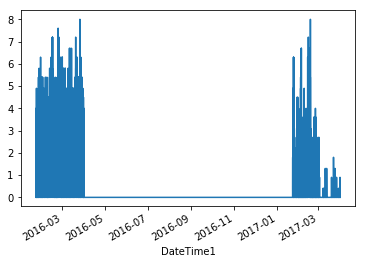

In [14]:
df['Wind Speed'].plot()

In [15]:
df.drop('Date' , axis = 1 , inplace = True)
df.drop('Time' , axis = 1 , inplace = True)
df.drop('Hi Dir' , axis = 1 , inplace = True)
df.drop('Wind Dir' , axis = 1 , inplace = True)


In [16]:

df.drop('Rain' , axis = 1 , inplace = True)
df.drop('Rain Rate' , axis = 1 , inplace = True)
df.drop('Solar Rad.' , axis = 1 , inplace = True)
df.drop('Solar Energy' , axis = 1 , inplace = True)
df.drop('HI Solar  Rad. ' , axis = 1 , inplace = True)
df.drop('UV Index' , axis = 1 , inplace = True)
df.drop('UV Dose' , axis = 1 , inplace = True)
df.drop('Hi UV ' , axis = 1 , inplace = True)
df.drop('Heat D-D ' , axis = 1 , inplace = True)
df.drop('Wind Tx ' , axis = 1 , inplace = True)
df.drop('Arc. Int.' , axis = 1 , inplace = True)

In [17]:
df.dtypes

Temp Out          float64
Hi Temp           float64
Low Temp          float64
Out Hum             int64
Dew Pt.           float64
Wind Speed        float64
Wind Run          float64
Hi Speed          float64
Wind Chill        float64
Heat Index        float64
THW Index         float64
THSW Index        float64
Bar               float64
Cool D-D          float64
In Temp           float64
In Hum              int64
In Dew            float64
In Heat           float64
In EMC            float64
In Air Density    float64
ET                float64
Wind Samp           int64
ISS Recept        float64
dtype: object

In [18]:
df.head(5)

,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Run,Hi Speed,Wind Chill,Heat Index,...,Cool D-D,In Temp,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,ISS Recept
DateTime1,,,,,,,,,,,,,,,,,,,,,
2016-01-23 05:01:00,77.9,77.9,77.9,77,70.1,1.8,0.11,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1316,0.0,24,100.0
2016-01-23 05:02:00,77.9,77.9,77.9,77,70.1,2.2,0.13,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1317,0.0,23,100.0
2016-01-23 05:03:00,77.9,77.9,77.9,77,70.1,2.2,0.13,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1316,0.0,24,100.0
2016-01-23 05:04:00,77.8,77.9,77.8,77,70.0,2.2,0.13,3.1,77.8,80.7,...,0.009,88.9,50,67.9,93.5,9.05,1.1317,0.0,23,100.0
2016-01-23 05:05:00,77.8,77.8,77.8,77,70.0,1.8,0.11,2.2,77.8,80.7,...,0.009,88.9,51,68.4,93.8,9.17,1.1312,0.0,23,100.0


In [19]:
df.isna().any()

Temp Out           True
Hi Temp            True
Low Temp           True
Out Hum           False
Dew Pt.            True
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill         True
Heat Index         True
THW Index          True
THSW Index         True
Bar               False
Cool D-D           True
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [20]:
df.dropna(axis = 0 , how = 'any' , inplace=True)

In [21]:
target_names = ['Wind Speed']


In [22]:
shift_steps = 1

In [23]:
df_targets = df[target_names].shift(-shift_steps)

In [24]:
df[target_names].head(shift_steps +5)

,Wind Speed
DateTime1,
2017-01-23 05:01:00,0.0
2017-01-23 05:02:00,0.0
2017-01-23 05:03:00,0.0
2017-01-23 05:04:00,0.0
2017-01-23 05:05:00,0.0
2017-01-23 05:06:00,0.0


In [25]:
df_targets.tail(10)

,Wind Speed
DateTime1,
2017-03-31 23:51:00,0.0
2017-03-31 23:52:00,0.0
2017-03-31 23:53:00,0.0
2017-03-31 23:54:00,0.0
2017-03-31 23:55:00,0.0
2017-03-31 23:56:00,0.0
2017-03-31 23:57:00,0.0
2017-03-31 23:58:00,0.0
2017-03-31 23:59:00,0.0


In [26]:
num_train = 98995

In [27]:
x_data = df.values[0:(num_train-shift_steps)]

In [28]:
num_data = len(x_data)
num_data

89495

In [29]:
y_data = df_targets.values[:num_train-shift_steps]

In [30]:
x_train = x_data
x_test = df.values[num_train:-shift_steps]

In [45]:
df.shape

(89495, 23)

In [41]:
x_train

array([[7.11e+01, 7.11e+01, 7.11e+01, ..., 0.00e+00, 2.40e+01, 1.00e+02],
       [7.11e+01, 7.11e+01, 7.11e+01, ..., 0.00e+00, 2.30e+01, 1.00e+02],
       [7.11e+01, 7.11e+01, 7.11e+01, ..., 0.00e+00, 2.30e+01, 1.00e+02],
       ...,
       [7.95e+01, 7.95e+01, 7.95e+01, ..., 0.00e+00, 2.30e+01, 1.00e+02],
       [7.95e+01, 7.95e+01, 7.95e+01, ..., 0.00e+00, 2.30e+01, 1.00e+02],
       [7.94e+01, 7.95e+01, 7.94e+01, ..., 3.00e-02, 2.40e+01, 1.00e+02]])

In [39]:
x_test

array([], shape=(0, 23), dtype=float64)

In [31]:
y_train = y_data
y_test = df_targets.values[num_train:-shift_steps]

In [40]:
y_train

array([[ 0.],
       [ 0.],
       [ 0.],
       ...,
       [ 0.],
       [ 0.],
       [nan]])

In [42]:
y_test

array([], shape=(0, 1), dtype=float64)

In [32]:
num_x_signals = x_data.shape[1]
num_x_signals

23

In [33]:
num_y_signals = y_data.shape[1]
num_y_signals

1

In [34]:
print("Min:", np.min(x_train))
print("Max:", np.max(x_train))

Min: 0.0
Max: 763.6


In [35]:
x_scaler = MinMaxScaler()

In [36]:
x_train_scaled = x_scaler.fit_transform(x_train)

In [37]:
print("Min:", np.min(x_train_scaled))
print("Max:", np.max(x_train_scaled))

Min: 0.0
Max: 1.0000000000000002


In [38]:
x_test_scaled = x_scaler.transform(x_test)

ValueError: Found array with 0 sample(s) (shape=(0, 23)) while a minimum of 1 is required.

In [ ]:
y_scaler = MinMaxScaler()
y_train_scaled = y_scaler.fit_transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

In [ ]:
print(x_train_scaled.shape)
print(y_train_scaled.shape)

In [ ]:
def batch_generator(batch_size, sequence_length):
    """
    Generator function for creating random batches of training-data.
    """

    # Infinite loop.
    while True:
        # Allocate a new array for the batch of input-signals.
        x_shape = (batch_size, sequence_length, num_x_signals)
        x_batch = np.zeros(shape=x_shape, dtype=np.float16)

        # Allocate a new array for the batch of output-signals.
        y_shape = (batch_size, sequence_length, num_y_signals)
        y_batch = np.zeros(shape=y_shape, dtype=np.float16)

        # Fill the batch with random sequences of data.
        for i in range(batch_size):
            # Get a random start-index.
            # This points somewhere into the training-data.
            idx = np.random.randint(num_train - sequence_length)
            
            # Copy the sequences of data starting at this index.
            x_batch[i] = x_train_scaled[idx:idx+sequence_length]
            y_batch[i] = y_train_scaled[idx:idx+sequence_length]
        
        yield (x_batch, y_batch)

In [ ]:
batch_size = 3

In [ ]:
sequence_length = 60*12
sequence_length

In [ ]:
generator = batch_generator(batch_size=batch_size,
                            sequence_length=sequence_length)

In [ ]:
x_batch, y_batch = next(generator)

In [ ]:
print(x_batch.shape)
print(y_batch.shape)

In [ ]:
batch = 0   # First sequence in the batch.
signal = 0  # First signal from the 20 input-signals.
seq = x_batch[batch, :, signal]
plt.plot(seq)

In [ ]:
seq = y_batch[batch, :, signal]
plt.plot(seq)

In [ ]:
validation_data = (np.expand_dims(x_test_scaled, axis=0),
                   np.expand_dims(y_test_scaled, axis=0))

In [ ]:
model = Sequential()

In [ ]:
model.add(LSTM(units=512,
              return_sequences=True,
              input_shape=(None, num_x_signals,)))

In [ ]:
#model.add(LSTM(units=256))

In [ ]:
model.add(Dense(num_y_signals, activation='sigmoid'))

In [ ]:
#if False:
 #   from tensorflow.python.keras.initializers import RandomUniform

    # Maybe use lower init-ranges.
#    init = RandomUniform(minval=-0.05, maxval=0.05)

 #   model.add(Dense(num_y_signals,
  #                  activation='linear',
   #                 kernel_initializer=init))

In [ ]:
warmup_steps = 50

In [ ]:
def loss_mse_warmup(y_true, y_pred):
    """
    Calculate the Mean Squared Error between y_true and y_pred,
    but ignore the beginning "warmup" part of the sequences.
    
    y_true is the desired output.
    y_pred is the model's output.
    """

    # The shape of both input tensors are:
    # [batch_size, sequence_length, num_y_signals].

    # Ignore the "warmup" parts of the sequences
    # by taking slices of the tensors.
    y_true_slice = y_true[:, warmup_steps:, :]
    y_pred_slice = y_pred[:, warmup_steps:, :]

    # These sliced tensors both have this shape:
    # [batch_size, sequence_length - warmup_steps, num_y_signals]

    # Calculate the MSE loss for each value in these tensors.
    # This outputs a 3-rank tensor of the same shape.
    loss = tf.losses.mean_squared_error(labels=y_true_slice,
                                        predictions=y_pred_slice)

    # Keras may reduce this across the first axis (the batch)
    # but the semantics are unclear, so to be sure we use
    # the loss across the entire tensor, we reduce it to a
    # single scalar with the mean function.
    loss_mean = tf.reduce_mean(loss)

    return loss_mean

In [ ]:
optimizer = RMSprop(lr=1e-4)

In [ ]:
model.compile(loss=loss_mse_warmup, optimizer=optimizer,metrics=['accuracy'])

In [ ]:
model.summary()

In [ ]:
path_checkpoint = '23_checkpoint.keras'
callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                      monitor='val_loss',
                                      verbose=1,
                                      save_weights_only=True,
                                      save_best_only=True)

In [ ]:
callback_early_stopping = EarlyStopping(monitor='val_loss',
                                        patience=5, verbose=1)

In [ ]:
callback_tensorboard = TensorBoard(log_dir='./23_logs/',
                                   histogram_freq=0,
                                   write_graph=False)

In [ ]:
callback_reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                       factor=0.1,
                                       min_lr=1e-4,
                                       patience=0,
                                       verbose=1)

In [ ]:
callbacks = [callback_early_stopping,
             callback_checkpoint,
             callback_tensorboard,
             callback_reduce_lr]

In [ ]:
%%time
model.fit_generator(generator=generator,
                    epochs=20,
                    steps_per_epoch=100,
                    validation_data=validation_data,
                    callbacks=callbacks)

In [ ]:
try:
    model.load_weights(path_checkpoint)
except Exception as error:
    print("Error trying to load checkpoint.")
    print(error)

In [ ]:
result = model.evaluate(x=np.expand_dims(x_test_scaled, axis=0),
                        y=np.expand_dims(y_test_scaled, axis=0))

In [ ]:
# If you have several metrics you can use this instead.
if False:
    for res, metric in zip(result, model.metrics_names):
        print("{0}: {1:.3e}".format(metric, res))

In [ ]:
def plot_comparison(start_idx, length=100, train=True):
    """
    Plot the predicted and true output-signals.
    
    :param start_idx: Start-index for the time-series.
    :param length: Sequence-length to process and plot.
    :param train: Boolean whether to use training- or test-set.
    """
    
    if train:
        # Use training-data.
        x = x_train_scaled
        y_true = y_train
    else:
        # Use test-data.
        x = x_test_scaled
        y_true = y_test
    
    # End-index for the sequences.
    end_idx = start_idx + length
    
    # Select the sequences from the given start-index and
    # of the given length.
    x = x[start_idx:end_idx]
    y_true = y_true[start_idx:end_idx]
    
    # Input-signals for the model.
    x = np.expand_dims(x, axis=0)

    # Use the model to predict the output-signals.
    y_pred = model.predict(x)
    
    # The output of the model is between 0 and 1.
    # Do an inverse map to get it back to the scale
    # of the original data-set.
    y_pred_rescaled = y_scaler.inverse_transform(y_pred[0])
    
    # For each output-signal.
    for signal in range(len(target_names)):
        # Get the output-signal predicted by the model.
        signal_pred = y_pred_rescaled[:, signal]
        
        # Get the true output-signal from the data-set.
        signal_true = y_true[:, signal]

        # Make the plotting-canvas bigger.
        plt.figure(figsize=(15,5))
        
        # Plot and compare the two signals.
        plt.plot(signal_true, label='true')
        plt.plot(signal_pred, label='pred')
        
        # Plot grey box for warmup-period.
        p = plt.axvspan(0, warmup_steps, facecolor='black', alpha=0.15)
        
        # Plot labels etc.
        plt.ylabel(target_names[signal])
        plt.legend()
        plt.show()

In [ ]:
plot_comparison(start_idx=40000, length=1000, train=True)

In [ ]:
plot_comparison(start_idx=80000, length=1000, train=True)

In [ ]:
df['Wind Speed'][80000:80000+1000].plot()

In [ ]:
df['Wind Speed'][98994+80000 : 98994 + 80000 + 1000]plot()

In [ ]:
plot_comparison(start_idx=200, length=1000, train=False)